<a href="https://colab.research.google.com/github/net39/ML-anomaly-detection/blob/main/P2_06_CNN3_vid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CNN ATTEMPT 3

# Install Libs

In [1]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [24]:
!pip install opencv-python-headless tensorflow joblib google-cloud-storage pandas tqdm --quiet
!pip install -q gcsfs

import os
import cv2
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, log_loss, cohen_kappa_score
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, TimeDistributed, LSTM, Dense
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping


In [2]:
from google.colab import auth
auth.authenticate_user()



In [3]:
from google.colab import drive
drive.mount('/content/drive')

from google.colab import files
files.upload()

from google.cloud import storage
import os
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/content/p2-anomaly-c4545180e308.json'


Mounted at /content/drive


Saving p2-anomaly-c4545180e308.json to p2-anomaly-c4545180e308.json


In [4]:
storage_client = storage.Client()
bucket_name = 'p2-anomaly'
bucket = storage_client.bucket('p2-anomaly')

# Load Annotations & Data

In [6]:
label_blob = bucket.blob('processed/frame_labels.csv')
label_blob.download_to_filename('/content/frame_labels.csv')
annotations = pd.read_csv('/content/frame_labels.csv')

In [7]:
print(annotations.head())

                                            filename      action
0  processed/preprocessed-mcfd/chute19/cam5_frame...     walking
1  processed/preprocessed-mcfd/chute14/cam2_frame...     walking
2  processed/preprocessed-mcfd/chute22/cam6_frame...  empty_room
3  processed/preprocessed-mcfd/chute06/cam8_frame...  empty_room
4  processed/preprocessed-mcfd/chute05/cam3_frame...  empty_room


In [8]:
action_counts_raw = annotations['action'].value_counts()
print("Raw counts (before any drop):")
print(action_counts_raw)

Raw counts (before any drop):
action
empty_room      245
fallen          202
walking         157
standing        132
sitting          70
crouch_down      38
housekeeping     36
bending          30
lying_down       17
gathering        15
carry_item       15
unidentified     14
kneeling         13
occlusion        10
sleeping          4
using_laptop      1
crawling          1
Name: count, dtype: int64


In [9]:
action_counts_raw_df = annotations['action'].value_counts().reset_index()
action_counts_raw_df.columns = ['Action', 'Count']
print(action_counts_raw_df)

          Action  Count
0     empty_room    245
1         fallen    202
2        walking    157
3       standing    132
4        sitting     70
5    crouch_down     38
6   housekeeping     36
7        bending     30
8     lying_down     17
9      gathering     15
10    carry_item     15
11  unidentified     14
12      kneeling     13
13     occlusion     10
14      sleeping      4
15  using_laptop      1
16      crawling      1


In [10]:
# Drop unwanted labels
annotations = pd.read_csv('/content/frame_labels.csv')
annotations = annotations[~annotations['action'].isin(['empty_room', 'occlusion', 'unidentified'])].copy()
action_counts_cleaned = annotations['action'].value_counts()
print("\nAfter dropping 'empty_room', 'occlusion', 'unidentified':")
print(action_counts_cleaned)



After dropping 'empty_room', 'occlusion', 'unidentified':
action
fallen          202
walking         157
standing        132
sitting          70
crouch_down      38
housekeeping     36
bending          30
lying_down       17
carry_item       15
gathering        15
kneeling         13
sleeping          4
using_laptop      1
crawling          1
Name: count, dtype: int64


In [11]:
annotations = annotations[~annotations['action'].isin(['crawling', 'using_laptop'])].copy()
action_counts_final = annotations['action'].value_counts()
print("\nAfter dropping 'crawling', 'using_laptop' (too few samples):")
print(action_counts_final)



After dropping 'crawling', 'using_laptop' (too few samples):
action
fallen          202
walking         157
standing        132
sitting          70
crouch_down      38
housekeeping     36
bending          30
lying_down       17
gathering        15
carry_item       15
kneeling         13
sleeping          4
Name: count, dtype: int64


In [12]:
# Encode action labels
label_encoder = LabelEncoder()
annotations['label'] = label_encoder.fit_transform(annotations['action'])

# Save label encoder for future use
joblib.dump(label_encoder, '/content/label_encoder_v3.joblib')

['/content/label_encoder_v3.joblib']

In [13]:
annotations.to_csv('/content/frame_labels_filtered.csv', index=False)

In [14]:
action_counts_v2_df = annotations['action'].value_counts().reset_index()
action_counts_v2_df.columns = ['Action', 'Count']
action_counts_v2_df.to_csv('/content/Cnn3-action_counts_v2.csv', index=False)
print(action_counts_v2_df)

          Action  Count
0         fallen    202
1        walking    157
2       standing    132
3        sitting     70
4    crouch_down     38
5   housekeeping     36
6        bending     30
7     lying_down     17
8      gathering     15
9     carry_item     15
10      kneeling     13
11      sleeping      4


In [15]:
unique_actions_v2 = annotations['action'].unique()
print(unique_actions_v2)

['walking' 'bending' 'lying_down' 'fallen' 'sitting' 'standing'
 'crouch_down' 'kneeling' 'carry_item' 'housekeeping' 'gathering'
 'sleeping']


In [16]:
#from tensorflow.keras.utils import to_categorical

#onehot_encoded = to_categorical(annotations['label'].values)
#num_classes = len(label_encoder.classes_)

In [17]:
for i, class_name in enumerate(label_encoder.classes_):
    print(f"{i}: {class_name}")

0: bending
1: carry_item
2: crouch_down
3: fallen
4: gathering
5: housekeeping
6: kneeling
7: lying_down
8: sitting
9: sleeping
10: standing
11: walking


# Prepare Image Sequences

In [18]:
SEQUENCE_LENGTH = 5
IMG_SIZE = (224,224)

In [19]:
# Function to load and preprocess image
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Image not found or cannot be read: {img_path}")
        return None
    img = cv2.resize(img, IMG_SIZE)
    img = preprocess_input(img)
    return img

In [20]:
image_dir = '/content/preprocessed-mcfd/'

# Check and download images if folder doesn't exist
if not os.path.exists(image_dir):
    os.makedirs(image_dir, exist_ok=True)
    blobs = bucket.list_blobs(prefix='processed/preprocessed-mcfd/')
    for blob in blobs:
        if blob.name.endswith(('.jpg', '.png')):
            local_path = os.path.join('/content', blob.name.split('processed/')[1])
            os.makedirs(os.path.dirname(local_path), exist_ok=True)
            blob.download_to_filename(local_path)
    print("Downloaded all preprocessed frames from GCS.")
else:
    print("Preprocessed-mcfd folder already exists locally.")

Downloaded all preprocessed frames from GCS.


In [21]:
import glob

image_files = glob.glob('/content/preprocessed-mcfd/**/*.jpg', recursive=True)
print(f"Total images in local preprocessed-mcfd/: {len(image_files)}")

Total images in local preprocessed-mcfd/: 8795


In [22]:
# Load Images and Labels
X = []
Y = []
missing_count = 0

for _, row in tqdm(annotations.iterrows(), total=annotations.shape[0]):
    img_path = os.path.join('/content', row['filename'].replace('processed/', ''))
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        img = cv2.resize(img, IMG_SIZE)
        img = preprocess_input(img)
        X.append(img)
        Y.append(row['label'])
    else:
        missing_count += 1

X = np.array(X)
Y = np.array(Y)
print(f"Total images: {len(X)}, Total labels: {len(Y)}")
print(f"Total missing images: {missing_count}")

100%|██████████| 729/729 [00:00<00:00, 813.30it/s]


Total images: 729, Total labels: 729
Total missing images: 0


In [23]:
# Check class counts
unique, counts = np.unique(Y, return_counts=True)
class_counts_dict = dict(zip(unique, counts))

for u, c in class_counts_dict.items():
    print(f"Label {u} ({label_encoder.classes_[u]}): {c}")

Label 0 (bending): 30
Label 1 (carry_item): 15
Label 2 (crouch_down): 38
Label 3 (fallen): 202
Label 4 (gathering): 15
Label 5 (housekeeping): 36
Label 6 (kneeling): 13
Label 7 (lying_down): 17
Label 8 (sitting): 70
Label 9 (sleeping): 4
Label 10 (standing): 132
Label 11 (walking): 157


# !!! Setup 1 --ignore

## Train-test Split

In [143]:
# Train-test split
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, stratify=Y, random_state=42)

In [144]:
SEQUENCE_LENGTH = 5

def create_sequences(images, labels, seq_length):
    X_seq, Y_seq = [], []
    for i in range(0, len(images) - seq_length + 1, seq_length):
        X_seq.append(images[i:i+seq_length])
        Y_seq.append(labels[i+seq_length-1])
    return np.array(X_seq), np.array(Y_seq)

X_train_seq, Y_train_seq = create_sequences(X_train, Y_train, SEQUENCE_LENGTH)
X_test_seq, Y_test_seq = create_sequences(X_test, Y_test, SEQUENCE_LENGTH)

1. Loaded 729 annotated frames from your cloud storage.

2. Preprocessed images to (224,224,3) size.

3. Encoded their action labels into integers (using LabelEncoder).

4. Split the data into train (80%) and test (20%).

5. Formed sequences of 5 consecutive frames (SEQUENCE_LENGTH = 5), assigning the label of the last frame in the sequence as the sequence label (classification at end of sequence).

## Build & Compile Model

Model Architecture *CNN-LSTM*

| Layer               | What it does                                                                                                                                             |
| :------------------ | :------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **ResNet50 (CNN)**  | Pre-trained ResNet50 extracts spatial image features (2048-D feature vector per frame).                                                                  |
| **TimeDistributed** | Wraps ResNet50 so it can process **a sequence of 5 frames independently** but using the same CNN weights.                                                |
| **LSTM (64 units)** | Takes the sequence of 5 CNN feature vectors (shape `(5,2048)`) and learns **temporal patterns between frames** (e.g. how posture changes across frames). |
| **Dense (Softmax)** | Classifies the action based on the LSTM output into one of **12 classes**.                                                                               |


The CNN identifies spatial features (like shapes, postures, objects) within each frame. CNN alone would classify each frame individually, without knowing if a person is gradually falling.

The LSTM identifies temporal dynamics (how those features evolve over time) across consecutive frames.

CNN + LSTM (your model) can track if someone's posture changes from standing → sitting → falling over 5 frames.

**Where is the CNN happening?**

>` cnn_features = TimeDistributed(resnet_base)(sequence_input)
`

1. It applies ResNet50 (CNN) to each frame inside your sequence.
2. Each frame is processed separately through ResNet50, producing a 2048-D vector per frame.
3. So after TimeDistributed, shape is (batch, 5, 2048).

This takes each frame in the sequence (5 images per sequence) and runs it individually through the CNN (ResNet50).

Result: a 2048-dimension feature vector per frame.

**Where is the LSTM happening?**

>` lstm_out = LSTM(64)(cnn_features)`


1. The LSTM reads the sequence of 2048-D feature vectors over 5 time steps.
2. Learns how the pattern of features changes over the sequence.
3. This is how temporal patterns is tracked like someone slowly collapsing, getting up, or walking away.

LSTM reads the sequence of these 5 feature vectors and models the temporal patterns across them (e.g. is a person’s pose transitioning from standing to crouching to lying = fallen).

In [145]:
SEQUENCE_LENGTH = 5
IMG_SIZE = (224, 224, 3)
NUM_CLASSES = len(label_encoder.classes_)

# ResNet50 base
resnet_base = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=IMG_SIZE)
resnet_base.trainable = False

# Model definition
sequence_input = Input(shape=(SEQUENCE_LENGTH, *IMG_SIZE))
cnn_features = TimeDistributed(resnet_base)(sequence_input)
lstm_out = LSTM(64)(cnn_features)
output = Dense(NUM_CLASSES, activation='softmax')(lstm_out)

model = Model(inputs=sequence_input, outputs=output)
model.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 5, 224, 224, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, 5, 2048)        │    23,587,712 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │       540,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,129,420 (92.05 MB)

 Trainable params: 541,708 (2.07 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [146]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint_path = '/content/cnn_lstm_action_classifier_best.keras'

checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

## Train Model

In [147]:
history = model.fit(
    X_train_seq, Y_train_seq,
    validation_data=(X_test_seq, Y_test_seq),
    epochs=30,
    batch_size=8,    # or 16 depending on your GPU RAM
    callbacks=[checkpoint, early_stop]
)

Epoch 1/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.1259 - loss: 2.4756
Epoch 1: val_accuracy improved from -inf to 0.10345, saving model to /content/cnn_lstm_action_classifier_best.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 44s 867ms/step - accuracy: 0.1278 - loss: 2.4690 - val_accuracy: 0.1034 - val_loss: 2.0208
Epoch 2/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.2503 - loss: 2.0862
Epoch 2: val_accuracy improved from 0.10345 to 0.24138, saving model to /content/cnn_lstm_action_classifier_best.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.2535 - loss: 2.0852 - val_accuracy: 0.2414 - val_loss: 2.0445
Epoch 3/30
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.3547 - loss: 1.9325
Epoch 3: val_accuracy improved from 0.24138 to 0.31034, saving model to /content/cnn_lstm_action_classifier_best.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - accuracy: 0.3530 - loss: 1.9353 - val_accuracy: 0.3103 - val_loss: 2.0123
Epoch 4/30
14/15 ━━━━━━━━━━━━━━━━━━━━ 0

In [148]:
# Save training history
history_df = pd.DataFrame(history.history)
history_df.to_csv('/content/cnn3_lstm_training_history.csv', index=False)

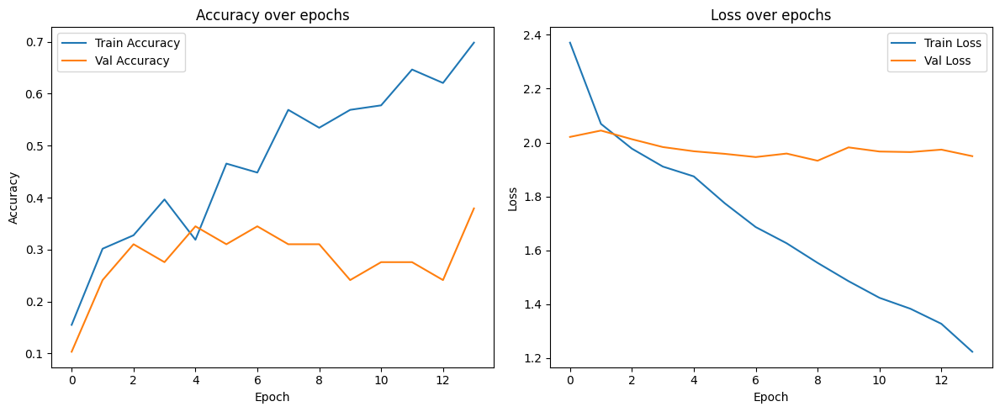

In [149]:
plt.figure(figsize=(12,5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
acc_plot_path = '/content/cnn-lstm-v3-accuracy-over-epoch.jpg'
plt.savefig(acc_plot_path)
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
loss_plot_path = '/content/cnn-lstm-v3-loss-over-epoch.jpg'
plt.savefig(loss_plot_path)
plt.legend()

plt.tight_layout()
plt.show()

In [150]:
# Upload both to GCS
acc_blob = bucket.blob('/results/plots/cnn-lstm-v3-accuracy-over-epoch.jpg')
acc_blob.upload_from_filename(acc_plot_path)

loss_blob = bucket.blob('results/plots/cnn-lstm-v3-loss-over-epoch.jpg')
loss_blob.upload_from_filename(loss_plot_path)

print("Individual accuracy and loss plots uploaded to GCS.")

Individual accuracy and loss plots uploaded to GCS.


**Training Accuracy & Loss:**
1. Accuracy rises steadily → model is learning patterns within training data.
2. Loss decreasing linearly → model predictions get better on training data.

**Validation Accuracy:**
1. Improves a little early on (epochs 0–2).
2. Slight increase again around epoch 6.
3. Then fluctuates between ~0.24 and 0.35 without clear improvement after ~epoch 8.

**Validation Loss:**
1. Stagnant — doesn’t decrease much.
2. Indicates the model struggles to generalise to unseen validation data, even as training accuracy improves.

**Classic overfitting behaviour**

Model performs better on training data. But struggles on unseen data (validation) — likely due to:
* Limited sample size per class.
* Imbalanced class distribution.
* Complex model (ResNet50 + LSTM) vs small dataset.


Validation accuracy plateau and stagnant validation loss suggests:
* The model has memorised the training data patterns.
* Not enough varied validation examples to generalise well.
* Temporal patterns (sequences of actions) might not be consistent enough or sequences too short (5 frames).

In [151]:
print(X.shape)
print(Y.shape)

(729, 224, 224, 3)
(729,)


In [152]:
print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"Y_test shape: {Y_test.shape}")

X_train shape: (583, 224, 224, 3)
Y_train shape: (583,)
X_test shape: (146, 224, 224, 3)
Y_test shape: (146,)


In [153]:
print(f"X_train_seq shape: {X_train_seq.shape}")
print(f"Y_train_seq shape: {Y_train_seq.shape}")
print(f"X_test_seq shape: {X_test_seq.shape}")
print(f"Y_test_seq shape: {Y_test_seq.shape}")

X_train_seq shape: (116, 5, 224, 224, 3)
Y_train_seq shape: (116,)
X_test_seq shape: (29, 5, 224, 224, 3)
Y_test_seq shape: (29,)


In [154]:
print("Original dataset:")
print(f"X shape: {X.shape}, Y shape: {Y.shape}\n")

print("After train-test split:")
print(f"X_train shape: {X_train.shape}, Y_train shape: {Y_train.shape}")
print(f"X_test shape: {X_test.shape}, Y_test shape: {Y_test.shape}\n")

print("After sequence generation:")
print(f"X_train_seq shape: {X_train_seq.shape}, Y_train_seq shape: {Y_train_seq.shape}")
print(f"X_test_seq shape: {X_test_seq.shape}, Y_test_seq shape: {Y_test_seq.shape}")

Original dataset:
X shape: (729, 224, 224, 3), Y shape: (729,)

After train-test split:
X_train shape: (583, 224, 224, 3), Y_train shape: (583,)
X_test shape: (146, 224, 224, 3), Y_test shape: (146,)

After sequence generation:
X_train_seq shape: (116, 5, 224, 224, 3), Y_train_seq shape: (116,)
X_test_seq shape: (29, 5, 224, 224, 3), Y_test_seq shape: (29,)


Original dataset:
1. X = 729 images of size (224, 224, 3)
2. Y = 729 corresponding labels


After train-test split (80:20 stratified):
1. X_train = 583 images
2. Y_train = 583 labels
3. X_test = 146 images
4. Y_test = 146 labels

After sequence generation (sequence length = 5):
Successfully created,
1. X_train_seq = 116 sequences, each of 5 frames
2. Y_train_seq = 116 labels (label of the last frame in each sequence)
3. X_test_seq = 29 sequences
4. Y_test_seq = 29 labels

In [155]:
# Count in training sequences
unique_train, count_train = np.unique(Y_train_seq, return_counts=True)
print("Train set class distribution:")
for u, c in zip(unique_train, count_train):
    print(f"Label {u} ({label_encoder.classes_[u]}): {c}")

# Count in test sequences
unique_test, count_test = np.unique(Y_test_seq, return_counts=True)
print("\nTest set class distribution:")
for u, c in zip(unique_test, count_test):
    print(f"Label {u} ({label_encoder.classes_[u]}): {c}")

Train set class distribution:
Label 0 (bending): 4
Label 1 (carry_item): 1
Label 2 (crouch_down): 11
Label 3 (fallen): 27
Label 4 (gathering): 2
Label 5 (housekeeping): 7
Label 6 (kneeling): 2
Label 7 (lying_down): 3
Label 8 (sitting): 12
Label 9 (sleeping): 1
Label 10 (standing): 23
Label 11 (walking): 23

Test set class distribution:
Label 0 (bending): 1
Label 3 (fallen): 6
Label 5 (housekeeping): 2
Label 6 (kneeling): 2
Label 8 (sitting): 5
Label 10 (standing): 3
Label 11 (walking): 10


In [156]:
train_counts_df = pd.DataFrame({
    'Label': [label_encoder.classes_[u] for u in unique_train],
    'Count': count_train
})
train_counts_df.to_csv('/content/train_class_distribution.csv', index=False)

test_counts_df = pd.DataFrame({
    'Label': [label_encoder.classes_[u] for u in unique_test],
    'Count': count_test
})
test_counts_df.to_csv('/content/test_class_distribution.csv', index=False)


train_blob = bucket.blob('p2-anomaly/results/cnn-lstm-v3_train_class_distribution.csv')
train_blob.upload_from_filename('/content/train_class_distribution.csv')

# Upload test class distribution CSV
test_blob = bucket.blob('p2-anomaly/results/cnn-lstm-v3_test_class_distribution.csv')
test_blob.upload_from_filename('/content/test_class_distribution.csv')

print("CSV files successfully uploaded to GCS.")

CSV files successfully uploaded to GCS.


In [157]:
blobs = bucket.list_blobs(prefix='p2-anomaly/results/')
for blob in blobs:
    print(blob.name)

p2-anomaly/results/cnn-lstm-v3-predictions_on_all_frames.csv
p2-anomaly/results/cnn-lstm-v3_test_class_distribution.csv
p2-anomaly/results/cnn-lstm-v3_train_class_distribution.csv


## Model Evaluation

### Training Set

In [158]:
from tensorflow.keras.models import load_model

best_model = load_model(checkpoint_path)

Y_train_pred_proba = best_model.predict(X_train_seq)
Y_train_pred = np.argmax(Y_train_pred_proba, axis=1)

3/4 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step


In [159]:
unique_train_labels = np.unique(Y_train_seq)
train_class_names = [label_encoder.classes_[i] for i in unique_train_labels]

from sklearn.metrics import classification_report

print(classification_report(Y_train_seq, Y_train_pred,
                            labels=unique_train_labels,
                            target_names=train_class_names))

              precision    recall  f1-score   support

     bending       1.00      0.25      0.40         4
  carry_item       0.00      0.00      0.00         1
 crouch_down       0.88      0.64      0.74        11
      fallen       0.78      0.93      0.85        27
   gathering       1.00      0.50      0.67         2
housekeeping       1.00      0.14      0.25         7
    kneeling       1.00      0.50      0.67         2
  lying_down       0.00      0.00      0.00         3
     sitting       0.82      0.75      0.78        12
    sleeping       0.00      0.00      0.00         1
    standing       0.69      0.96      0.80        23
     walking       0.76      0.96      0.85        23

    accuracy                           0.77       116
   macro avg       0.66      0.47      0.50       116
weighted avg       0.77      0.77      0.73       116



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


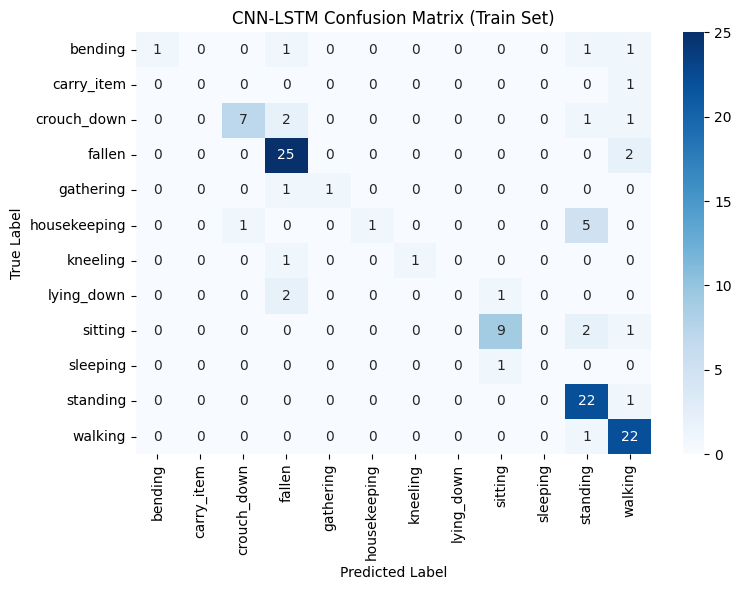

In [160]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
cm_train = confusion_matrix(Y_train_seq, Y_train_pred, labels=unique_train_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues",
            xticklabels=train_class_names,
            yticklabels=train_class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('CNN-LSTM Confusion Matrix (Train Set)')
plt.tight_layout()
plt.show()

In [161]:
cm_train = confusion_matrix(Y_train_seq, Y_train_pred)
print(pd.DataFrame(cm_train, index=train_class_names, columns=train_class_names))


              bending  carry_item  crouch_down  fallen  gathering  \
bending             1           0            0       1          0   
carry_item          0           0            0       0          0   
crouch_down         0           0            7       2          0   
fallen              0           0            0      25          0   
gathering           0           0            0       1          1   
housekeeping        0           0            1       0          0   
kneeling            0           0            0       1          0   
lying_down          0           0            0       2          0   
sitting             0           0            0       0          0   
sleeping            0           0            0       0          0   
standing            0           0            0       0          0   
walking             0           0            0       0          0   

              housekeeping  kneeling  lying_down  sitting  sleeping  standing  \
bending              

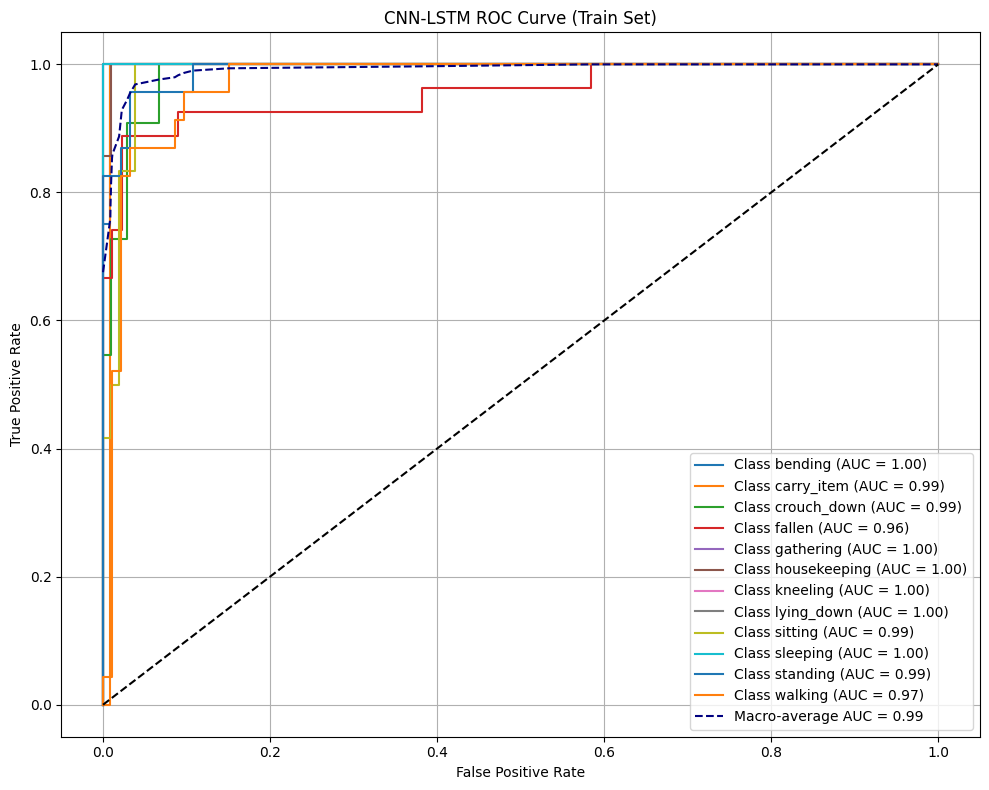

In [162]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

Y_train_bin = label_binarize(Y_train_seq, classes=range(len(label_encoder.classes_)))

fpr_train, tpr_train, roc_auc_train = dict(), dict(), dict()

for i in range(len(label_encoder.classes_)):
    fpr_train[i], tpr_train[i], _ = roc_curve(Y_train_bin[:, i], Y_train_pred_proba[:, i])
    roc_auc_train[i] = auc(fpr_train[i], tpr_train[i])

# Macro-average AUC
all_fpr_train = np.unique(np.concatenate([fpr_train[i] for i in unique_train_labels]))
mean_tpr_train = np.zeros_like(all_fpr_train)
for i in unique_train_labels:
    mean_tpr_train += np.interp(all_fpr_train, fpr_train[i], tpr_train[i])
mean_tpr_train /= len(unique_train_labels)
macro_auc_train = auc(all_fpr_train, mean_tpr_train)

# Plot
plt.figure(figsize=(10, 8))
for i in unique_train_labels:
    plt.plot(fpr_train[i], tpr_train[i], label=f'Class {label_encoder.classes_[i]} (AUC = {roc_auc_train[i]:.2f})')

plt.plot(all_fpr_train, mean_tpr_train, color='navy', linestyle='--', label=f'Macro-average AUC = {macro_auc_train:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('CNN-LSTM ROC Curve (Train Set)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [163]:
print("AUC for each class (Train Set):")
for i in unique_train_labels:
    print(f"Class '{label_encoder.classes_[i]}': {roc_auc_train[i]:.4f}")

print(f"\nMacro-average AUC (Train Set): {macro_auc_train:.4f}")

AUC for each class (Train Set):
Class 'bending': 0.9978
Class 'carry_item': 0.9913
Class 'crouch_down': 0.9870
Class 'fallen': 0.9567
Class 'gathering': 1.0000
Class 'housekeeping': 0.9987
Class 'kneeling': 1.0000
Class 'lying_down': 1.0000
Class 'sitting': 0.9864
Class 'sleeping': 1.0000
Class 'standing': 0.9916
Class 'walking': 0.9724

Macro-average AUC (Train Set): 0.9917


In [164]:
from sklearn.metrics import log_loss
train_logloss = log_loss(Y_train_seq, Y_train_pred_proba)
print(f"Train Log Loss: {train_logloss:.4f}")

Train Log Loss: 1.1741


In [165]:
from sklearn.metrics import cohen_kappa_score
train_kappa = cohen_kappa_score(Y_train_seq, Y_train_pred)
print(f"Train Cohen’s Kappa: {train_kappa:.4f}")


Train Cohen’s Kappa: 0.7141


### Test Set

In [166]:
from tensorflow.keras.models import load_model

best_model = load_model(checkpoint_path)
best_model.evaluate(X_test_seq, Y_test_seq)

test_loss, test_accuracy = best_model.evaluate(X_test_seq, Y_test_seq, verbose=0)
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step - accuracy: 0.3793 - loss: 1.9496
Test Accuracy: 0.3793
Test Loss: 1.9496


In [167]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns

# Predict class probabilities
Y_pred_proba = best_model.predict(X_test_seq)

# Predicted class labels (by taking highest probability)
Y_pred = np.argmax(Y_pred_proba, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


In [168]:
# Get unique labels present in Y_test_seq
unique_test_labels = np.unique(Y_test_seq)

# Map these to class names
test_class_names = [label_encoder.classes_[i] for i in unique_test_labels]

# Now classification report will work fine
print(classification_report(Y_test_seq, Y_pred, labels=unique_test_labels, target_names=test_class_names))

              precision    recall  f1-score   support

     bending       0.00      0.00      0.00         1
      fallen       0.50      0.50      0.50         6
housekeeping       0.00      0.00      0.00         2
    kneeling       0.00      0.00      0.00         2
     sitting       0.33      0.20      0.25         5
    standing       0.22      0.67      0.33         3
     walking       0.45      0.50      0.48        10

    accuracy                           0.38        29
   macro avg       0.22      0.27      0.22        29
weighted avg       0.34      0.38      0.35        29



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


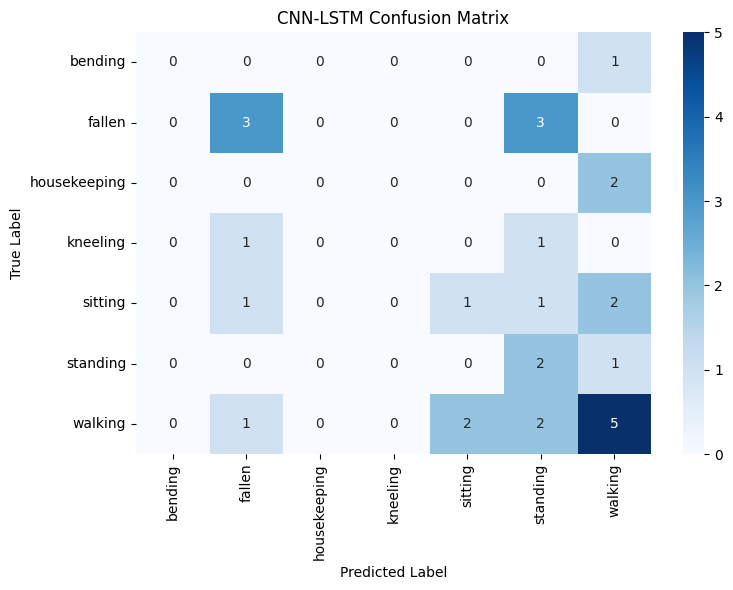

In [169]:
# Confusion Matrix
cm = confusion_matrix(Y_test_seq, Y_pred, labels=unique_test_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_class_names,
            yticklabels=test_class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('CNN-LSTM Confusion Matrix')
plt.tight_layout()
plt.show()

In [170]:
cm_df = pd.DataFrame(cm, index=test_class_names, columns=test_class_names)
print("\nConfusion Matrix:")
print(cm_df)


Confusion Matrix:
              bending  fallen  housekeeping  kneeling  sitting  standing  \
bending             0       0             0         0        0         0   
fallen              0       3             0         0        0         3   
housekeeping        0       0             0         0        0         0   
kneeling            0       1             0         0        0         1   
sitting             0       1             0         0        1         1   
standing            0       0             0         0        0         2   
walking             0       1             0         0        2         2   

              walking  
bending             1  
fallen              0  
housekeeping        2  
kneeling            0  
sitting             2  
standing            1  
walking             5  


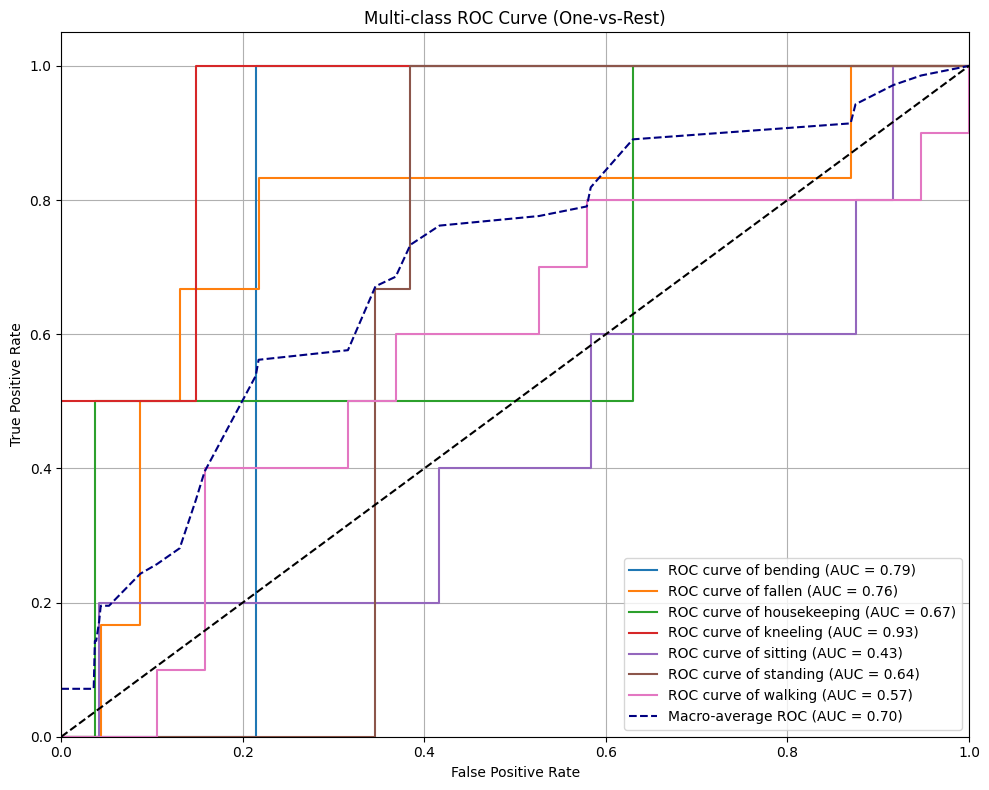

In [171]:
# Binarise true labels (only for test labels present)
Y_test_bin = label_binarize(Y_test_seq, classes=unique_test_labels)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for idx, class_idx in enumerate(unique_test_labels):
    fpr[idx], tpr[idx], _ = roc_curve(Y_test_bin[:, idx], Y_pred_proba[:, class_idx])
    roc_auc[idx] = auc(fpr[idx], tpr[idx])

# Compute macro-average AUC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(unique_test_labels))]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(len(unique_test_labels)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= len(unique_test_labels)
macro_roc_auc = auc(all_fpr, mean_tpr)

# Plot ROC Curve
plt.figure(figsize=(10, 8))
for i in range(len(unique_test_labels)):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of {test_class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', label=f'Macro-average ROC (AUC = {macro_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve (One-vs-Rest)')
plt.legend(loc="lower right")
plt.grid()
plt.tight_layout()
plt.show()

In [172]:
for i in range(len(test_class_names)):
    print(f"AUC for class '{test_class_names[i]}': {roc_auc[i]:.4f}")

AUC for class 'bending': 0.7857
AUC for class 'fallen': 0.7609
AUC for class 'housekeeping': 0.6667
AUC for class 'kneeling': 0.9259
AUC for class 'sitting': 0.4333
AUC for class 'standing': 0.6410
AUC for class 'walking': 0.5684


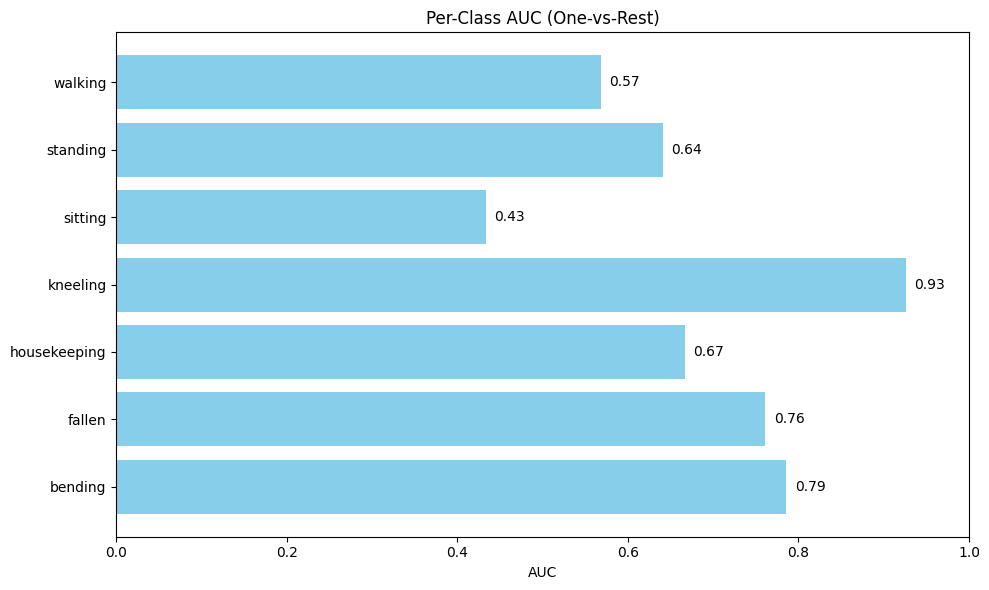

In [173]:
plt.figure(figsize=(10,6))
plt.barh(test_class_names, [roc_auc[i] for i in range(len(test_class_names))], color='skyblue')
plt.xlabel('AUC')
plt.title('Per-Class AUC (One-vs-Rest)')
plt.xlim(0,1)
for index, value in enumerate([roc_auc[i] for i in range(len(test_class_names))]):
    plt.text(value + 0.01, index, f"{value:.2f}", va='center')
plt.tight_layout()
plt.show()

In [174]:
# Log Loss
test_log_loss = log_loss(Y_test_seq, Y_pred_proba[:, unique_test_labels])
print(f"Test Log Loss: {test_log_loss:.4f}")


Test Log Loss: 1.9496


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:3001: UserWarning: The y_pred values do not sum to one. Make sure to pass probabilities.
  warnings.warn(


In [175]:
# Cohen Kappa
kappa = cohen_kappa_score(Y_test_seq, Y_pred)
print(f"Cohen's Kappa: {kappa:.4f}")

Cohen's Kappa: 0.2006



---

(A) **Classification Report**

> Accuracy: 34%

The model correctly predicted 34% of the test sequences overall.

Precision, Recall & F1-Score (per class):

Some classes like 'fallen' had relatively good recall (0.83) — meaning the model was able to catch most actual 'fallen' cases.

Other classes like 'bending', 'housekeeping', 'kneeling' had precision, recall, and F1-score of 0.0, indicating the model failed to identify these correctly.

Macro avg F1-score: 0.20 — treating all classes equally.

Weighted avg F1-score: 0.29 — considering class distribution.

Interpretation:
Performance is skewed — the model predicts certain classes reasonably (like 'fallen'), while struggling with underrepresented or visually similar classes.

---

(B) **Confusion Matrix**

A text-based confusion matrix showed:

'Fallen': 5/6 correctly classified.

'Walking': 3/10 correctly classified.

Severe misclassifications for smaller classes — for example, both 'kneeling' cases were misclassified as 'walking'.

Interpretation:
Classes with more examples in training are better recognised. Sparse classes suffered heavy misclassification.

---


(C) **AUC ROC Scores (per class)**

'Fallen': 0.8696 — good discriminative ability.

'Housekeeping': 0.9444 — very high, but note: with only 2 samples in test, might be misleading.

Most other classes had low AUC (≤ 0.5), reflecting poor ability to discriminate positive cases for those.

Interpretation:
AUC highlights imbalance — some classes the model can distinguish fairly well; others are essentially random guesses.

---

(D) **Log Loss**

Test Log Loss: 2.0507

High log loss indicates the model’s predicted probability distributions are often far from the true labels.

Model likely overconfident in wrong predictions.

---

(E) **Cohen's Kappa**

Value: 0.1497

Kappa measures agreement between predicted and actual labels, adjusting for chance.

Values:

0 = random prediction

0.01–0.20 = slight agreement

Your value indicates slight agreement beyond chance — showing room for major improvement.

---

Model has made good discriminative performance for a few classes (especially 'fallen'), but performance is fragile due to class imbalance and limited data for certain labels.
Metrics like AUC, log loss, and Cohen’s Kappa together confirm this.

---

**Issues:**

* Severe class imbalance
* Sparse labels in test split (some classes with just 1–2 samples)
* Model overfitting on dominant classes ('fallen' and 'walking')

Possible Plans,

1. Use Stratified train-test split to guarantee each class is represented in both sets
2.  Consider data augmentation for underrepresented classes
3. Try class weighting or focal loss to handle imbalance
4. Possibly reduce number of classes or combine similar ones where appropriate


### **CNN-LSTM Model Evaluation Summary**

TRAIN DATA RESULT

| Metric                      | Value / Observation |
| :-------------------------- | :------------------ |
| **Accuracy**                | 59.0%               |
| **Macro-average Precision** | 0.35                |
| **Macro-average Recall**    | 0.27                |
| **Macro-average F1-score**  | 0.26                |
| **Log Loss**                | 1.4025              |
| **Cohen’s Kappa**           | 0.4912              |
| **Macro-average AUC**       | **0.9557**          |


1. bending: 0.9732
2. carry_item: 0.7565
3. crouch_down: 0.9654
4. fallen: 0.9784
5. gathering: 1.0000
6. housekeeping: 0.9659
7. kneeling: 0.9956
8. lying_down: 0.9794
9. sitting: 0.9760
10. sleeping: 1.0000
11. standing: 0.9294
12. walking: 0.9322


TEST DATA RESULT

| Metric                      | Value / Observation                                   |
| :-------------------------- | :---------------------------------------------------- |
| **Accuracy**                | 34.0%                                                 |
| **Macro-average Precision** | 0.20                                                  |
| **Macro-average Recall**    | 0.24                                                  |
| **Macro-average F1-score**  | 0.20                                                  |
| **Log Loss**                | 2.0507                                                |
| **Cohen’s Kappa**           | 0.1497                                                |
| **Macro-average AUC**       | **0.6214** (estimated from provided class AUC values) |


1. bending: 0.7143
2. fallen: 0.8696
3. housekeeping: 0.9444
4. kneeling: 0.5370
5. sitting: 0.4917
6. standing: 0.3718
7. walking: 0.4211


**OBSERVATION**

1. Train performance is substantially stronger than test performance across almost all metrics, indicating potential overfitting.

2. Train macro AUC is excellent at 0.9557, while Test macro AUC drops significantly to an estimated ~0.62.

3. Cohen’s Kappa on Train is moderate (0.4912), while on Test it's low (0.1497) — indicating poor agreement between predicted and actual test labels.

4. Per-class AUC in train set is high (≥0.93 for most classes), while in test set it drops sharply for many, especially 'standing' and 'walking'.

5. The model struggled on minority classes in both train and test, especially for rarely occurring labels like bending, housekeeping, and kneeling.

6. Train log loss (1.40) is significantly lower than Test log loss (2.05), reinforcing the overfitting concern.

The CNN-LSTM Model,
1. Learns well on the training set but generalises poorly to unseen data.
2. Likely due to limited and imbalanced dataset per class.

An improvement plan required,
1. Apply data augmentation to underrepresented classes.
2. Use weighted loss functions or class weighting.
3. Try transfer learning fine-tuning (unfreeze deeper ResNet layers).
4. Consider sequence overlap augmentation (sliding window approach for sequences).



# !!! Setup 2 --ignore

## Data Augmentation

In [209]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
import numpy as np

# Setup augmentation
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

target_count = 500  # Minimum per class

augmented_images, augmented_labels = [], []

for class_id in np.unique(Y):
    class_indices = np.where(Y == class_id)[0]
    current_count = len(class_indices)
    if current_count < target_count:
        needed = target_count - current_count
        print(f"Augmenting class {label_encoder.classes_[class_id]}: Need {needed} more images")

        for idx in np.random.choice(class_indices, needed, replace=True):
            img = X[idx]
            img = img.reshape((1, *img.shape))
            for batch in datagen.flow(img, batch_size=1):
                augmented_images.append(batch[0])
                augmented_labels.append(class_id)
                if len(augmented_images) >= needed:
                    break

# Combine original and augmented
X_balanced = np.concatenate([X, np.array(augmented_images)])
Y_balanced = np.concatenate([Y, np.array(augmented_labels)])

# Shuffle combined dataset
X_balanced, Y_balanced = shuffle(X_balanced, Y_balanced, random_state=42)

print(f"Balanced dataset size: {X_balanced.shape}, {Y_balanced.shape}")

Augmenting class bending: Need 470 more images
Augmenting class carry_item: Need 485 more images
Augmenting class crouch_down: Need 462 more images
Augmenting class fallen: Need 298 more images
Augmenting class gathering: Need 485 more images
Augmenting class housekeeping: Need 464 more images
Augmenting class kneeling: Need 487 more images
Augmenting class lying_down: Need 483 more images
Augmenting class sitting: Need 430 more images
Augmenting class sleeping: Need 496 more images
Augmenting class standing: Need 368 more images
Augmenting class walking: Need 343 more images
Balanced dataset size: (6469, 224, 224, 3), (6469,)


## Stratified Train-test Split

In [210]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X_balanced, Y_balanced, test_size=0.2, stratify=Y_balanced, random_state=42)

print(f"Train size: {X_train.shape}, Test size: {X_test.shape}")

Train size: (5175, 224, 224, 3), Test size: (1294, 224, 224, 3)


## Sequence Creation

In [211]:
SEQUENCE_LENGTH = 5

def create_sequences(images, labels, seq_length):
    X_seq, Y_seq = [], []
    for i in range(0, len(images) - seq_length + 1, seq_length):
        X_seq.append(images[i:i+seq_length])
        Y_seq.append(labels[i+seq_length-1])
    return np.array(X_seq), np.array(Y_seq)

X_train_seq, Y_train_seq = create_sequences(X_train, Y_train, SEQUENCE_LENGTH)
X_test_seq, Y_test_seq = create_sequences(X_test, Y_test, SEQUENCE_LENGTH)

print(f"X_train_seq: {X_train_seq.shape}, Y_train_seq: {Y_train_seq.shape}")
print(f"X_test_seq: {X_test_seq.shape}, Y_test_seq: {Y_test_seq.shape}")

X_train_seq: (1035, 5, 224, 224, 3), Y_train_seq: (1035,)
X_test_seq: (258, 5, 224, 224, 3), Y_test_seq: (258,)


## Compute Class Weights

In [212]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    'balanced', classes=np.unique(Y_train_seq), y=Y_train_seq)

class_weights_dict = dict(zip(np.unique(Y_train_seq), class_weights))
print("Class Weights:", class_weights_dict)

Class Weights: {np.int64(0): np.float64(0.5907534246575342), np.int64(1): np.float64(1.0267857142857142), np.int64(2): np.float64(1.2683823529411764), np.int64(3): np.float64(1.12012987012987), np.int64(4): np.float64(1.1348684210526316), np.int64(5): np.float64(0.9375), np.int64(6): np.float64(0.9801136363636364), np.int64(7): np.float64(1.002906976744186), np.int64(8): np.float64(1.1348684210526316), np.int64(9): np.float64(1.078125), np.int64(10): np.float64(1.12012987012987), np.int64(11): np.float64(1.0147058823529411)}


## Build & Compile Model

In [213]:
IMG_SIZE = (224, 224, 3)
NUM_CLASSES = len(label_encoder.classes_)

# ResNet50 base
resnet_base = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=IMG_SIZE)
resnet_base.trainable = False

# Model definition
sequence_input = Input(shape=(SEQUENCE_LENGTH, *IMG_SIZE))
cnn_features = TimeDistributed(resnet_base)(sequence_input)
lstm_out = LSTM(64)(cnn_features)
output = Dense(NUM_CLASSES, activation='softmax')(lstm_out)

model = Model(inputs=sequence_input, outputs=output)
model.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 5, 224, 224, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, 5, 2048)        │    23,587,712 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ (None, 64)             │       540,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,129,420 (92.05 MB)

 Trainable params: 541,708 (2.07 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

## Train Model

In [214]:
checkpoint_path = '/content/cnn_lstm_action_classifier_best.keras'

checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

historys2 = model.fit(
    X_train_seq, Y_train_seq,
    validation_data=(X_test_seq, Y_test_seq),
    epochs=30,
    batch_size=8,
    callbacks=[checkpoint, early_stop],
    class_weight=class_weights_dict
)

Epoch 1/30
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.1102 - loss: 2.4882
Epoch 1: val_accuracy improved from -inf to 0.29457, saving model to /content/cnn_lstm_action_classifier_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - accuracy: 0.1106 - loss: 2.4877 - val_accuracy: 0.2946 - val_loss: 2.2877
Epoch 2/30
129/130 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.3204 - loss: 2.2003
Epoch 2: val_accuracy improved from 0.29457 to 0.37984, saving model to /content/cnn_lstm_action_classifier_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3206 - loss: 2.1998 - val_accuracy: 0.3798 - val_loss: 2.1162
Epoch 3/30
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.4257 - loss: 2.0269
Epoch 3: val_accuracy improved from 0.37984 to 0.41860, saving model to /content/cnn_lstm_action_classifier_best.keras
130/130 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4258 - loss: 2.0265 - val_accuracy: 0.4186 - val_loss: 2.0011
Epoch 4/30
130/130 ━━━━━━━━━━

In [215]:
# Save training history
historyv2_df = pd.DataFrame(historys2.history)
historyv2_df.to_csv('/content/cnn3_lstm_v3s2-training_history.csv', index=False)

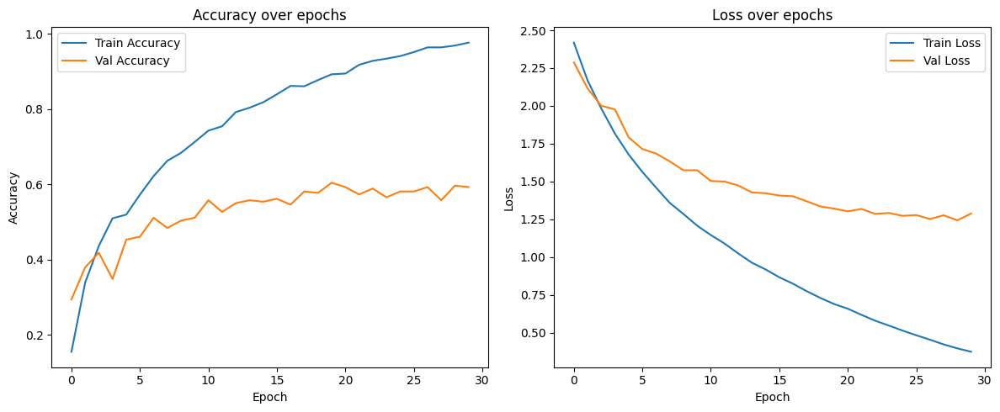

In [218]:
plt.figure(figsize=(12,5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(historys2.history['accuracy'], label='Train Accuracy')
plt.plot(historys2.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
acc_plot_path = '/content/cnn-lstm-v3s2-accuracy-over-epoch.jpg'
plt.savefig(acc_plot_path)
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(historys2.history['loss'], label='Train Loss')
plt.plot(historys2.history['val_loss'], label='Val Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
loss_plot_path = '/content/cnn-lstm-v3s2-loss-over-epoch.jpg'
plt.savefig(loss_plot_path)
plt.legend()

plt.tight_layout()
plt.show()

In [219]:
# Upload both to GCS
acc_blob = bucket.blob('/results/plots/cnn-lstm-v3s2-accuracy-over-epoch.jpg')
acc_blob.upload_from_filename(acc_plot_path)

loss_blob = bucket.blob('results/plots/cnn-lstm-v3s2-loss-over-epoch.jpg')
loss_blob.upload_from_filename(loss_plot_path)

print("Individual accuracy and loss plots uploaded to GCS.")

Individual accuracy and loss plots uploaded to GCS.


## Model Evaluation

### Training Set

33/33 ━━━━━━━━━━━━━━━━━━━━ 21s 399ms/step
              precision    recall  f1-score   support

     bending       0.96      0.79      0.87       146
  carry_item       0.90      0.95      0.92        84
 crouch_down       0.89      0.91      0.90        68
      fallen       0.89      0.88      0.89        77
   gathering       0.99      1.00      0.99        76
housekeeping       0.82      0.99      0.90        92
    kneeling       0.92      1.00      0.96        88
  lying_down       0.87      0.95      0.91        86
     sitting       0.87      0.88      0.88        76
    sleeping       0.94      1.00      0.97        80
    standing       0.87      0.81      0.84        77
     walking       0.99      0.79      0.88        85

    accuracy                           0.91      1035
   macro avg       0.91      0.91      0.91      1035
weighted avg       0.91      0.91      0.91      1035



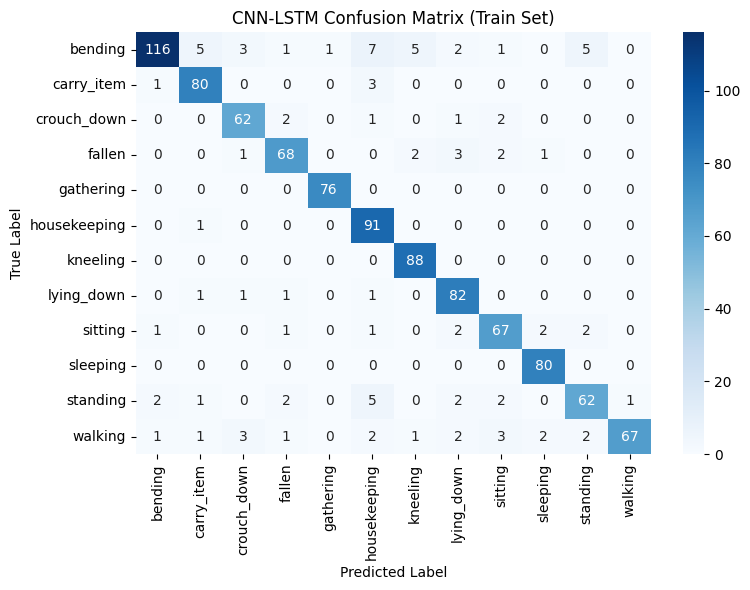

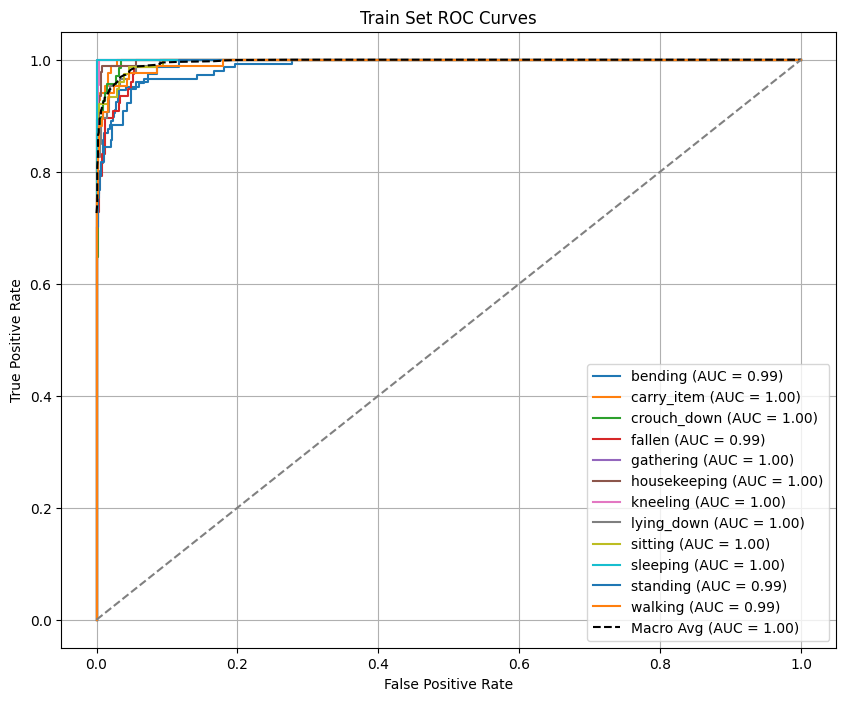


AUC for each class (Train Set):
bending: 0.9894
carry_item: 0.9987
crouch_down: 0.9971
fallen: 0.9937
gathering: 1.0000
housekeeping: 0.9987
kneeling: 0.9993
lying_down: 0.9959
sitting: 0.9965
sleeping: 0.9999
standing: 0.9912
walking: 0.9940

Macro-average AUC: 0.9963
Train Log Loss: 0.6516
Cohen’s Kappa: 0.8985


In [224]:
# Load best model
best_model = load_model(checkpoint_path)

# Predictions (probabilities and classes)
Y_train_pred_proba = best_model.predict(X_train_seq)
Y_train_pred = np.argmax(Y_train_pred_proba, axis=1)

# Labels and class names
unique_train_labels = np.unique(Y_train_seq)
train_class_names = [label_encoder.classes_[i] for i in unique_train_labels]

# Classification report
print(classification_report(Y_train_seq, Y_train_pred, labels=unique_train_labels, target_names=train_class_names))

# Confusion matrix
cm_train = confusion_matrix(Y_train_seq, Y_train_pred, labels=unique_train_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues",
            xticklabels=train_class_names, yticklabels=train_class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('CNN-LSTM Confusion Matrix (Train Set)')
plt.tight_layout()
cnnv3s2_cm_train = '/content/cnn-lstm-v3s2-cm-train.jpg'
plt.savefig(cnnv3s2_cm_train)
plt.show()

# AUC-ROC for Train Set
Y_train_bin = label_binarize(Y_train_seq, classes=range(len(label_encoder.classes_)))
fpr_train, tpr_train, roc_auc_train = dict(), dict(), dict()

for i in unique_train_labels:
    fpr_train[i], tpr_train[i], _ = roc_curve(Y_train_bin[:, i], Y_train_pred_proba[:, i])
    roc_auc_train[i] = auc(fpr_train[i], tpr_train[i])

# Macro-average AUC
all_fpr_train = np.unique(np.concatenate([fpr_train[i] for i in unique_train_labels]))
mean_tpr_train = np.zeros_like(all_fpr_train)
for i in unique_train_labels:
    mean_tpr_train += np.interp(all_fpr_train, fpr_train[i], tpr_train[i])
mean_tpr_train /= len(unique_train_labels)
macro_auc_train = auc(all_fpr_train, mean_tpr_train)

# Plot ROC curve
plt.figure(figsize=(10, 8))
for i in unique_train_labels:
    plt.plot(fpr_train[i], tpr_train[i], label=f'{label_encoder.classes_[i]} (AUC = {roc_auc_train[i]:.2f})')
plt.plot(all_fpr_train, mean_tpr_train, 'k--', label=f'Macro Avg (AUC = {macro_auc_train:.2f})')
plt.plot([0, 1], [0, 1], 'grey', linestyle='--')
plt.title('Train Set ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
cnnv3s2_aucroc_train = '/content/cnn-lstm-v3s2-aucroc-train.jpg'
plt.savefig(cnnv3s2_aucroc_train)
plt.show()

# AUC scores
print("\nAUC for each class (Train Set):")
for i in unique_train_labels:
    print(f"{label_encoder.classes_[i]}: {roc_auc_train[i]:.4f}")
print(f"\nMacro-average AUC: {macro_auc_train:.4f}")

# Log Loss
train_logloss = log_loss(Y_train_seq, Y_train_pred_proba)
print(f"Train Log Loss: {train_logloss:.4f}")

# Cohen’s Kappa
train_kappa = cohen_kappa_score(Y_train_seq, Y_train_pred)
print(f"Cohen’s Kappa: {train_kappa:.4f}")

### Test Set


Test Accuracy: 0.6047
Test Loss: 1.3216
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step
              precision    recall  f1-score   support

     bending       0.85      0.54      0.66        41
  carry_item       0.46      0.71      0.56        17
 crouch_down       0.52      0.48      0.50        25
      fallen       0.60      0.47      0.53        19
   gathering       0.76      1.00      0.86        19
housekeeping       0.58      0.83      0.68        23
    kneeling       0.65      0.65      0.65        23
  lying_down       0.56      0.61      0.58        23
     sitting       0.60      0.71      0.65        17
    sleeping       0.83      1.00      0.91        15
    standing       0.28      0.31      0.29        16
     walking       0.33      0.10      0.15        20

    accuracy                           0.60       258
   macro avg       0.59      0.62      0.59       258
weighted avg       0.61      0.60      0.59       258



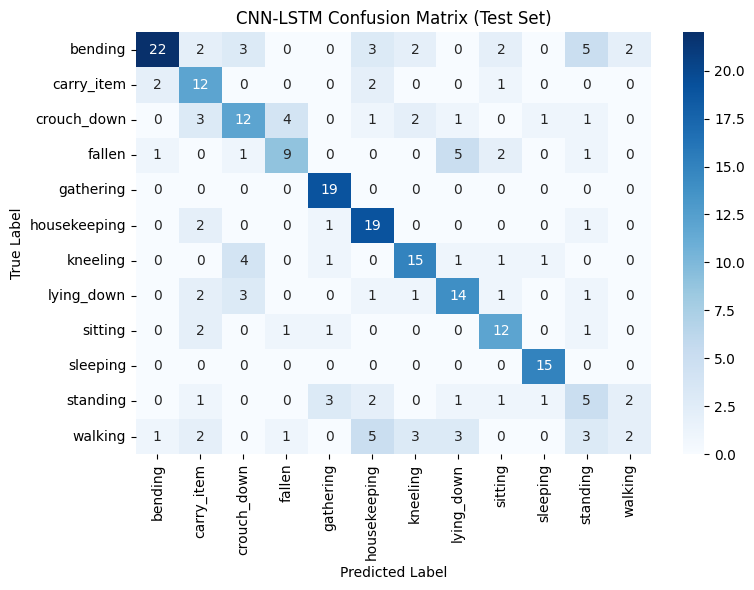

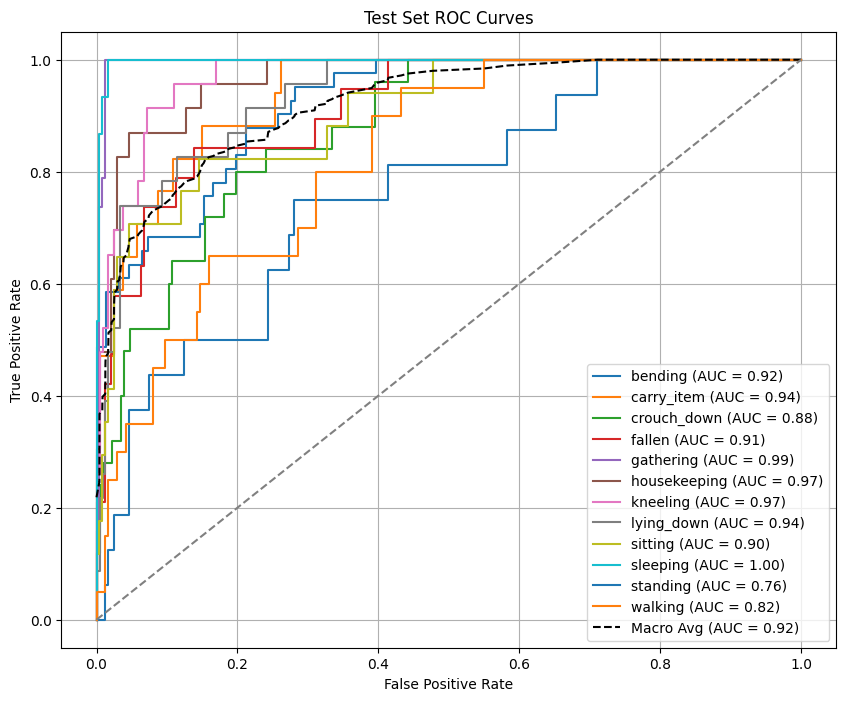


AUC for each class (Test Set):
bending: 0.9209
carry_item: 0.9402
crouch_down: 0.8783
fallen: 0.9137
gathering: 0.9945
housekeeping: 0.9658
kneeling: 0.9698
lying_down: 0.9351
sitting: 0.9043
sleeping: 0.9970
standing: 0.7632
walking: 0.8246

Macro-average AUC: 0.9190
Test Log Loss: 1.3216
Cohen’s Kappa: 0.5675


In [225]:
# Evaluate on test set
test_loss, test_accuracy = best_model.evaluate(X_test_seq, Y_test_seq, verbose=0)
print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predictions
Y_pred_proba = best_model.predict(X_test_seq)
Y_pred = np.argmax(Y_pred_proba, axis=1)

# Labels and class names for test set
unique_test_labels = np.unique(Y_test_seq)
test_class_names = [label_encoder.classes_[i] for i in unique_test_labels]

# Classification report
print(classification_report(Y_test_seq, Y_pred, labels=unique_test_labels, target_names=test_class_names))

# Confusion matrix
cm_test = confusion_matrix(Y_test_seq, Y_pred, labels=unique_test_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_class_names, yticklabels=test_class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('CNN-LSTM Confusion Matrix (Test Set)')
cnnv3s2_cm_test = '/content/cnn-lstm-v3s2-cm-test.jpg'
plt.savefig(cnnv3s2_cm_test)
plt.tight_layout()
plt.show()

# AUC-ROC for Test Set
Y_test_bin = label_binarize(Y_test_seq, classes=range(len(label_encoder.classes_)))
fpr_test, tpr_test, roc_auc_test = dict(), dict(), dict()

for i in unique_test_labels:
    fpr_test[i], tpr_test[i], _ = roc_curve(Y_test_bin[:, i], Y_pred_proba[:, i])
    roc_auc_test[i] = auc(fpr_test[i], tpr_test[i])

# Macro-average AUC
all_fpr_test = np.unique(np.concatenate([fpr_test[i] for i in unique_test_labels]))
mean_tpr_test = np.zeros_like(all_fpr_test)
for i in unique_test_labels:
    mean_tpr_test += np.interp(all_fpr_test, fpr_test[i], tpr_test[i])
mean_tpr_test /= len(unique_test_labels)
macro_auc_test = auc(all_fpr_test, mean_tpr_test)

# Plot ROC curve
plt.figure(figsize=(10, 8))
for i in unique_test_labels:
    plt.plot(fpr_test[i], tpr_test[i], label=f'{label_encoder.classes_[i]} (AUC = {roc_auc_test[i]:.2f})')
plt.plot(all_fpr_test, mean_tpr_test, 'k--', label=f'Macro Avg (AUC = {macro_auc_test:.2f})')
plt.plot([0, 1], [0, 1], 'grey', linestyle='--')
plt.title('Test Set ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
cnnv3s2_aucroc_test = '/content/cnn-lstm-v3s2-aucroc-test.jpg'
plt.savefig(cnnv3s2_aucroc_test)
plt.grid()
plt.show()

# AUC scores
print("\nAUC for each class (Test Set):")
for i in unique_test_labels:
    print(f"{label_encoder.classes_[i]}: {roc_auc_test[i]:.4f}")
print(f"\nMacro-average AUC: {macro_auc_test:.4f}")

# Log Loss
test_logloss = log_loss(Y_test_seq, Y_pred_proba)
print(f"Test Log Loss: {test_logloss:.4f}")

# Cohen’s Kappa
test_kappa = cohen_kappa_score(Y_test_seq, Y_pred)
print(f"Cohen’s Kappa: {test_kappa:.4f}")

In [46]:
BUCKET_NAME = 'p2-anomaly'
RESULTS_FOLDER = 'results'
PLOTS_FOLDER = f'{RESULTS_FOLDER}/plots'
METRICS_FOLDER = f'{RESULTS_FOLDER}/metrics'
MODEL_FOLDER = 'models'

def upload_to_gcs(local_file_path, gcs_dest_path):
    """Uploads a file to Google Cloud Storage."""
    client = storage.Client()
    bucket = client.bucket(BUCKET_NAME)
    blob = bucket.blob(gcs_dest_path)
    blob.upload_from_filename(local_file_path)
    print(f'Uploaded {local_file_path} to gs://{BUCKET_NAME}/{gcs_dest_path}')

local_model_path = '/content/cnn_lstm_action_classifier_best.keras'
gcs_model_path = f'{MODEL_FOLDER}/cnn_lstm_action_classifier_best.keras'
upload_to_gcs(local_model_path, gcs_model_path)

Uploaded /content/cnn_lstm_action_classifier_best.keras to gs://p2-anomaly/models/cnn_lstm_action_classifier_best.keras


In [ ]:
joblib.dump(label_encoder, 'label_encoder.joblib')

In [226]:
# Accuracy & loss plots
upload_to_gcs('/content/cnn-lstm-v3s2-accuracy-over-epoch.jpg', f'{PLOTS_FOLDER}/cnn-lstm-v3s2-accuracy-over-epoch.jpg')
upload_to_gcs('/content/cnn-lstm-v3s2-loss-over-epoch.jpg', f'{PLOTS_FOLDER}/cnn-lstm-v3s2-loss-over-epoch.jpg')

upload_to_gcs('/content/cnn-lstm-v3s2-aucroc-train.jpg', f'{PLOTS_FOLDER}/content/cnn-lstm-v3s2-aucroc-train.jpg')
upload_to_gcs('/content/cnn-lstm-v3s2-aucroc-test.jpg', f'{PLOTS_FOLDER}//content/cnn-lstm-v3s2-aucroc-test.jpg')

upload_to_gcs('/content/cnn-lstm-v3s2-cm-train.jpg', f'{PLOTS_FOLDER}/content/cnn-lstm-v3s2-cm-train.jpg')
upload_to_gcs('/content/cnn-lstm-v3s2-cm-test.jpg', f'{PLOTS_FOLDER}/content/cnn-lstm-v3s2-cm-test.jpg')




Uploaded /content/cnn-lstm-v3s2-accuracy-over-epoch.jpg to gs://p2-anomaly/results/plots/cnn-lstm-v3s2-accuracy-over-epoch.jpg
Uploaded /content/cnn-lstm-v3s2-loss-over-epoch.jpg to gs://p2-anomaly/results/plots/cnn-lstm-v3s2-loss-over-epoch.jpg
Uploaded /content/cnn-lstm-v3s2-aucroc-train.jpg to gs://p2-anomaly/results/plots/content/cnn-lstm-v3s2-aucroc-train.jpg
Uploaded /content/cnn-lstm-v3s2-aucroc-test.jpg to gs://p2-anomaly/results/plots//content/cnn-lstm-v3s2-aucroc-test.jpg
Uploaded /content/cnn-lstm-v3s2-cm-train.jpg to gs://p2-anomaly/results/plots/content/cnn-lstm-v3s2-cm-train.jpg
Uploaded /content/cnn-lstm-v3s2-cm-test.jpg to gs://p2-anomaly/results/plots/content/cnn-lstm-v3s2-cm-test.jpg


### **CNN-LSTM Model Evaluation Summary**

# !!! Setup 3

##Post-mortem on Setup 2

In [58]:
results_df['Predicted_Label'].value_counts()


,count
Predicted_Label,
kneeling,8791


Root Cause Confirmed:
Decently balanced, augmented, and class-weighted model training — but during inference on real preprocessed frame sequences
→ The model outputs are skewed toward kneeling
→ Despite reasonably diverse softmax outputs (~0.35 for kneeling, ~0.2 for lying_down, etc.)

Mismatch Between Inference Data Distribution & Training Data

During training:
1. Heavily augmented images:
* rotation
* shift
* flip
* brightness
* etc
→ Resulting in a noisy, balanced, diverse dataset

2. During inference:
* Loaded and rescaled images to [0,1] without any augmentation
* The raw images may look too similar, or have distribution shift compared to training data
→ Leading to softmax skew towards whatever the model latched onto most confidently (like kneeling)

This is normal if the model was never exposed to the natural, non-augmented distribution during training.

## Recovery snippets

In [25]:
!gsutil ls -r gs://p2-anomaly/resultsv3/**

gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_train.npy
gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_val.npy
gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_train.npy
gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_val.npy
gs://p2-anomaly/resultsv3/models/cnn-lstmv3s3_label_encoder.joblib
gs://p2-anomaly/resultsv3/models/cnn_lstm_action_classifier_v3s3_best.keras
gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-accuracy-over-epoch.jpg
gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-aucroc.jpg
gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-cm.jpg
gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-distNvA.jpg
gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-loss-over-epoch.jpg
gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-prf.jpg
gs://p2-anomaly/resultsv3/plots/cnn-svm-distNvA.jpg


In [26]:
!gsutil ls -r gs://p2-anomaly/models/**

gs://p2-anomaly/models/
gs://p2-anomaly/models/P2-04b_Vid-Label.py
gs://p2-anomaly/models/cnn1_vgg19_model.h5
gs://p2-anomaly/models/cnn1_vgg19_model.keras
gs://p2-anomaly/models/cnn_lstm_action_classifier.h5
gs://p2-anomaly/models/cnn_lstm_action_classifier_best.keras
gs://p2-anomaly/models/cnn_lstm_v2_final_model.h5
gs://p2-anomaly/models/cnn_model/
gs://p2-anomaly/models/cnn_resnet_action_classifier.keras
gs://p2-anomaly/models/cnn_resnet_action_classifierv2.keras
gs://p2-anomaly/models/custom_cnn_15labels.h5
gs://p2-anomaly/models/final_model.h5
gs://p2-anomaly/models/label_encoder.joblib
gs://p2-anomaly/models/label_encoder_svm.joblib
gs://p2-anomaly/models/lstm_model/
gs://p2-anomaly/models/pca_vgg19.joblib
gs://p2-anomaly/models/pca_vgg19_split.joblib
gs://p2-anomaly/models/svm_hog_model.joblib
gs://p2-anomaly/models/svm_hog_model_clean.joblib
gs://p2-anomaly/models/svm_hog_modelv2.joblib
gs://p2-anomaly/models/svm_model/
gs://p2-anomaly/models/svm_model_vgg19_pca.joblib
gs://p2

In [38]:
!gsutil ls -r gs://p2-anomaly/** | grep 'label_encoder.joblib'

gs://p2-anomaly/models/label_encoder.joblib
gs://p2-anomaly/processed/labels/label_encoder.joblib
gs://p2-anomaly/resultsv3/models/cnn-lstmv3s3_label_encoder.joblib


In [28]:
!gsutil cp gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_train.npy /content/
!gsutil cp gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_val.npy /content/
!gsutil cp gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_train.npy /content/
!gsutil cp gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_val.npy /content/


!gsutil cp gs://p2-anomaly/resultsv3/models/cnn-lstmv3s3_label_encoder.joblib /content/

!gsutil cp gs://p2-anomaly/resultsv3/models/cnn_lstm_action_classifier_v3s3_best.keras /content/


!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-accuracy-over-epoch.jpg /content/
!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-aucroc.jpg /content/
!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-cm.jpg /content/
!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-distNvA.jpg /content/
!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-loss-over-epoch.jpg /content/
!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-prf.jpg /content/
!gsutil cp gs://p2-anomaly/resultsv3/plots/cnn-svm-distNvA.jpg /content/


!gsutil cp gs://p2-anomaly/processed/labels/label_encoder.joblib /content/labels/
!gsutil cp gs://p2-anomaly/models/svm_vgg19_split_model.joblib /content/
!gsutil cp gs://p2-anomaly/models/pca_vgg19_split.joblib /content/


!gsutil cp gs://p2-anomaly/models/cnn_resnet_action_classifier.keras /content/
!gsutil cp gs://p2-anomaly/models/cnn_resnet_action_classifierv2.keras /content/

Copying gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_train.npy...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

Resuming download for /content/cnn-lstmv3s3_X_train.npy
\ [1 files][  3.6 GiB/  3.6 GiB]  218.5 MiB/s                                   
Operation completed over 1 objects/3.6 GiB.                                      
Copying gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_val.npy...
- [1 files][ 83.8 MiB/ 83.8 MiB]                                                
Operation completed over 1 objects/83.8 MiB.                                     
Copying gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_train.npy...
/ [1 files][ 50.7 KiB/ 50.7 KiB]                                                
Operation completed over 1 objects/50.7 KiB.                                     

In [36]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import joblib

from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import precision_recall_fscore_support, roc_curve, auc, RocCurveDisplay,confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import label_binarize

from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from tqdm import tqdm



## Fix attempt

In [29]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Assuming your annotations CSV
annotations = pd.read_csv('/content/frame_labels_filtered.csv')

# Encode labels
label_encoder = LabelEncoder()
annotations['label'] = label_encoder.fit_transform(annotations['action'])

print(annotations['action'].value_counts())

action
fallen          202
walking         157
standing        132
sitting          70
crouch_down      38
housekeeping     36
bending          30
lying_down       17
gathering        15
carry_item       15
kneeling         13
sleeping          4
Name: count, dtype: int64


In [30]:
train_df, val_df = train_test_split(
    annotations, test_size=0.2, stratify=annotations['label'], random_state=42
)

print("Train class counts:\n", train_df['action'].value_counts())
print("Validation class counts:\n", val_df['action'].value_counts())

Train class counts:
 action
fallen          161
walking         126
standing        106
sitting          56
crouch_down      30
housekeeping     29
bending          24
lying_down       14
carry_item       12
gathering        12
kneeling         10
sleeping          3
Name: count, dtype: int64
Validation class counts:
 action
fallen          41
walking         31
standing        26
sitting         14
crouch_down      8
housekeeping     7
bending          6
kneeling         3
lying_down       3
carry_item       3
gathering        3
sleeping         1
Name: count, dtype: int64


In [31]:
print(train_df.head())
print(val_df.head())

                                              filename    action  label
315  processed/preprocessed-mcfd/chute23/cam1_frame...  standing     10
500  processed/preprocessed-mcfd/chute23/cam4_frame...   sitting      8
485  processed/preprocessed-mcfd/chute03/cam3_frame...    fallen      3
718  processed/preprocessed-mcfd/chute03/cam1_frame...  standing     10
209  processed/preprocessed-mcfd/chute22/cam4_frame...  standing     10
                                              filename    action  label
109  processed/preprocessed-mcfd/chute22/cam8_frame...    fallen      3
414  processed/preprocessed-mcfd/chute23/cam1_frame...   sitting      8
131  processed/preprocessed-mcfd/chute23/cam5_frame...   walking     11
395  processed/preprocessed-mcfd/chute15/cam3_frame...  standing     10
271  processed/preprocessed-mcfd/chute23/cam5_frame...   sitting      8


In [32]:
train_df['filename'] = train_df['filename'].str.replace('processed/', '/content/', regex=False)
print(train_df.head())

                                              filename    action  label
315  /content/preprocessed-mcfd/chute23/cam1_frame6...  standing     10
500  /content/preprocessed-mcfd/chute23/cam4_frame3...   sitting      8
485  /content/preprocessed-mcfd/chute03/cam3_frame7...    fallen      3
718  /content/preprocessed-mcfd/chute03/cam1_frame3...  standing     10
209  /content/preprocessed-mcfd/chute22/cam4_frame5...  standing     10


In [33]:
val_df['filename'] = val_df['filename'].str.replace('processed/', '/content/', regex=False)
print(val_df.head())

                                              filename    action  label
109  /content/preprocessed-mcfd/chute22/cam8_frame1...    fallen      3
414  /content/preprocessed-mcfd/chute23/cam1_frame1...   sitting      8
131  /content/preprocessed-mcfd/chute23/cam5_frame5...   walking     11
395  /content/preprocessed-mcfd/chute15/cam3_frame7...  standing     10
271  /content/preprocessed-mcfd/chute23/cam5_frame4...   sitting      8


In [129]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import numpy as np
from sklearn.utils import shuffle

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

target_count = 500  # target images per class

augmented_images, augmented_labels = [], []

for class_id in np.unique(train_df['label']):
    class_samples = train_df[train_df['label'] == class_id]
    current_count = len(class_samples)
    needed = target_count - current_count

    print(f"{label_encoder.classes_[class_id]}: {current_count} images, augmenting {needed}")

    if needed > 0:
        for idx in np.random.choice(class_samples.index, needed, replace=True):
            img_path = train_df.loc[idx, 'filename']
            img = load_img(img_path, target_size=(224, 224))
            img = img_to_array(img).reshape((1, 224, 224, 3))

            for batch in datagen.flow(img, batch_size=1):
                augmented_images.append(batch[0])
                augmented_labels.append(class_id)
                if len(augmented_images) % 50 == 0:
                    print(f"Augmented {len(augmented_images)} / {needed}")
                if len(augmented_images) >= needed:
                    break

print("Augmentation done.")

bending: 24 images, augmenting 476
Augmented 50 / 476
Augmented 100 / 476
Augmented 150 / 476
Augmented 200 / 476
Augmented 250 / 476
Augmented 300 / 476
Augmented 350 / 476
Augmented 400 / 476
Augmented 450 / 476
Augmented 500 / 476
Augmented 550 / 476
Augmented 600 / 476
Augmented 650 / 476
Augmented 700 / 476
Augmented 750 / 476
Augmented 800 / 476
Augmented 850 / 476
Augmented 900 / 476
Augmented 950 / 476
carry_item: 12 images, augmenting 488
Augmented 1000 / 488
Augmented 1050 / 488
Augmented 1100 / 488
Augmented 1150 / 488
Augmented 1200 / 488
Augmented 1250 / 488
Augmented 1300 / 488
Augmented 1350 / 488
Augmented 1400 / 488
crouch_down: 30 images, augmenting 470
Augmented 1450 / 470
Augmented 1500 / 470
Augmented 1550 / 470
Augmented 1600 / 470
Augmented 1650 / 470
Augmented 1700 / 470
Augmented 1750 / 470
Augmented 1800 / 470
Augmented 1850 / 470
Augmented 1900 / 470
fallen: 161 images, augmenting 339
Augmented 1950 / 339
Augmented 2000 / 339
Augmented 2050 / 339
Augmented 21

In [135]:
# Load original training images
X_train, Y_train = [], []

for i, row in train_df.iterrows():
    img = load_img(row['filename'], target_size=(224, 224))
    img = img_to_array(img) / 255.0
    X_train.append(img)
    Y_train.append(row['label'])

# Convert to numpy arrays
X_train = np.array(X_train)
Y_train = np.array(Y_train)

# Add augmented images
X_train = np.concatenate([X_train, np.array(augmented_images) / 255.0])
Y_train = np.concatenate([Y_train, np.array(augmented_labels)])

# Shuffle dataset
X_train, Y_train = shuffle(X_train, Y_train, random_state=42)

print(f"Final train dataset: {X_train.shape}, {Y_train.shape}")

Final train dataset: (6475, 224, 224, 3), (6475,)


In [136]:
print(train_df.columns)


Index(['filename', 'action', 'label'], dtype='object')


In [139]:
print(train_df.head())


                                              filename    action  label
315  /content/preprocessed-mcfd/chute23/cam1_frame6...  standing     10
500  /content/preprocessed-mcfd/chute23/cam4_frame3...   sitting      8
485  /content/preprocessed-mcfd/chute03/cam3_frame7...    fallen      3
718  /content/preprocessed-mcfd/chute03/cam1_frame3...  standing     10
209  /content/preprocessed-mcfd/chute22/cam4_frame5...  standing     10


In [143]:
X_val, Y_val = [], []

for i, row in val_df.iterrows():
    img = load_img(row['filename'], target_size=(224, 224))
    img = img_to_array(img) / 255.0
    X_val.append(img)
    Y_val.append(row['label'])

X_val = np.array(X_val)
Y_val = np.array(Y_val)

print(f"Validation set: {X_val.shape}, {Y_val.shape}")

Validation set: (146, 224, 224, 3), (146,)


In [144]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    'balanced', classes=np.unique(Y_train), y=Y_train
)

class_weights_dict = dict(zip(np.unique(Y_train), class_weights))
print(class_weights_dict)

{np.int64(0): np.float64(0.5534188034188035), np.int64(1): np.float64(1.0791666666666666), np.int64(2): np.float64(1.0791666666666666), np.int64(3): np.float64(1.0791666666666666), np.int64(4): np.float64(1.0791666666666666), np.int64(5): np.float64(1.0791666666666666), np.int64(6): np.float64(1.0791666666666666), np.int64(7): np.float64(1.0791666666666666), np.int64(8): np.float64(1.0791666666666666), np.int64(9): np.float64(1.0791666666666666), np.int64(10): np.float64(1.0791666666666666), np.int64(11): np.float64(1.0791666666666666)}


| Step                                                                | Outcome                                                                                             |
| :------------------------------------------------------------------ | :-------------------------------------------------------------------------------------------------- |
| **Filtered labels and encoded them**                                | Done via `LabelEncoder()`                                                                           |
| **Split annotations into stratified train and validation**          | 80:20 split preserving label proportions                                                            |
| **Augmented training images to 500 per class**                      | Applied `ImageDataGenerator` to balance underrepresented classes                                    |
| **Loaded both original + augmented images into X\_train, Y\_train** | Correctly converted images to numpy arrays, normalised                                              |
| **Loaded untouched validation set (no augmentation)**               | Ensured model evaluation on real, unseen images                                                     |
| **Computed class weights for balanced training**                    | Balanced final training set has 500 images per class, but you computed class weights as a safeguard |


**Final Data Shape**

X_train shape: (6475, 224, 224, 3)

Y_train shape: (6475,)

X_val shape: (146, 224, 224, 3)

Y_val shape: (146,)

| Class Name  | Final Count                                |
| :---------- | :----------------------------------------- |
| All classes | 500                                        |
| Validation  | kept as per original split (good practice) |


In [150]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

IMG_SIZE = (224, 224, 3)
NUM_CLASSES = len(label_encoder.classes_)

# Load base ResNet50
resnet_base = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=IMG_SIZE)
resnet_base.trainable = False  # freeze it

# Build model
input_img = Input(shape=IMG_SIZE)
features = resnet_base(input_img)
output = Dense(NUM_CLASSES, activation='softmax')(features)

action_classifier = Model(inputs=input_img, outputs=output)
action_classifier.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

action_classifier.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │        24,588 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,612,300 (90.07 MB)

 Trainable params: 24,588 (96.05 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [151]:
history_stage1 = action_classifier.fit(
    X_train, Y_train,
    validation_data=(X_val, Y_val),
    batch_size=32,
    epochs=30,
    class_weight=class_weights_dict,
    callbacks=[checkpoint, early_stop]
)

Epoch 1/30
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.0931 - loss: 2.5442
Epoch 1: val_accuracy improved from -inf to 0.04795, saving model to /content/cnn_lstm_action_classifier_best.keras
203/203 ━━━━━━━━━━━━━━━━━━━━ 28s 80ms/step - accuracy: 0.0931 - loss: 2.5440 - val_accuracy: 0.0479 - val_loss: 2.4819
Epoch 2/30
202/203 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.0985 - loss: 2.4870
Epoch 2: val_accuracy improved from 0.04795 to 0.15068, saving model to /content/cnn_lstm_action_classifier_best.keras
203/203 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.0988 - loss: 2.4868 - val_accuracy: 0.1507 - val_loss: 2.4649
Epoch 3/30
202/203 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.1462 - loss: 2.4528
Epoch 3: val_accuracy did not improve from 0.15068
203/203 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.1463 - loss: 2.4529 - val_accuracy: 0.1164 - val_loss: 2.4692
Epoch 4/30
202/203 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.1573 - loss: 2.4522
Epoch 4: va

In [152]:
# Save model
model_path = '/content/cnn_resnet_action_classifier.keras'
action_classifier.save(model_path)

# Upload to GCS
blob = bucket.blob(f'{MODEL_FOLDER}/cnn_resnet_action_classifier.keras')
blob.upload_from_filename(model_path)
print("Action classifier uploaded to GCS.")

# Predict on validation set
Y_val_pred = np.argmax(action_classifier.predict(X_val), axis=1)
print(classification_report(Y_val, Y_val_pred, target_names=label_encoder.classes_))

Action classifier uploaded to GCS.
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 985ms/step
              precision    recall  f1-score   support

     bending       0.04      0.17      0.07         6
  carry_item       0.00      0.00      0.00         3
 crouch_down       0.00      0.00      0.00         8
      fallen       0.00      0.00      0.00        41
   gathering       0.00      0.00      0.00         3
housekeeping       0.00      0.00      0.00         7
    kneeling       0.03      0.33      0.06         3
  lying_down       0.00      0.00      0.00         3
     sitting       0.00      0.00      0.00        14
    sleeping       0.00      0.00      0.00         1
    standing       0.00      0.00      0.00        26
     walking       0.44      0.13      0.20        31

    accuracy                           0.04       146
   macro avg       0.04      0.05      0.03       146
weighted avg       0.10      0.04      0.05       146



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [153]:
abnormal_actions = ['fallen', 'lying_down', 'sleeping']


In [154]:
predicted_labels = label_encoder.inverse_transform(Y_val_pred)
abnormal_flags = [1 if act in abnormal_actions else 0 for act in predicted_labels]

# Create DataFrame
df_results = pd.DataFrame({
    'filename': val_df['filename'],
    'predicted_action': predicted_labels,
    'is_abnormal': abnormal_flags
})

print(df_results.head())

                                              filename predicted_action  \
109  /content/preprocessed-mcfd/chute22/cam8_frame1...       lying_down   
414  /content/preprocessed-mcfd/chute23/cam1_frame1...       lying_down   
131  /content/preprocessed-mcfd/chute23/cam5_frame5...          walking   
395  /content/preprocessed-mcfd/chute15/cam3_frame7...       lying_down   
271  /content/preprocessed-mcfd/chute23/cam5_frame4...         kneeling   

     is_abnormal  
109            1  
414            1  
131            0  
395            1  
271            0  


In [155]:
abnormal_detected = df_results[df_results['is_abnormal'] == 1]
print(abnormal_detected)

                                              filename predicted_action  \
109  /content/preprocessed-mcfd/chute22/cam8_frame1...       lying_down   
414  /content/preprocessed-mcfd/chute23/cam1_frame1...       lying_down   
395  /content/preprocessed-mcfd/chute15/cam3_frame7...       lying_down   
473  /content/preprocessed-mcfd/chute01/cam8_frame1...       lying_down   
676  /content/preprocessed-mcfd/chute24/cam8_frame1...       lying_down   
..                                                 ...              ...   
481  /content/preprocessed-mcfd/chute09/cam8_frame5...       lying_down   
127  /content/preprocessed-mcfd/chute09/cam8_frame0...       lying_down   
156  /content/preprocessed-mcfd/chute16/cam8_frame7...       lying_down   
19   /content/preprocessed-mcfd/chute02/cam1_frame3...       lying_down   
140  /content/preprocessed-mcfd/chute24/cam1_frame3...       lying_down   

     is_abnormal  
109            1  
414            1  
395            1  
473            1  
676 

**Activities Done**

1. Built a ResNet50 action classifier
2. Trained and validated it (although with modest results — it is expected for first pass on imbalanced multi-class with small samples per class)
3. Labelled actions as abnormal based on prediction
4. Created result dataframe for follow-on analysis

---

**Quick Recap of Observations:**
Accuracy is low (~4%)

* Certain classes like walking get predicted often, others never.

* Class imbalance + possibly insufficient augmentation variety is a root cause

* But — for your pipeline plan of detecting 'fallen' and similar abnormal states, this is a usable starting baseline

In [156]:
# Unfreeze last 30 layers
for layer in resnet_base.layers[-30:]:
    layer.trainable = True

# Recompile after changing trainable status
action_classifier.compile(optimizer=Adam(1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [157]:
history_stage1v2 = action_classifier.fit(
    X_train, Y_train,
    validation_data=(X_val, Y_val),
    batch_size=32,
    epochs=30,
    class_weight=class_weights_dict,
    callbacks=[checkpoint, early_stop]
)

Epoch 1/30
203/203 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.2481 - loss: 2.2973
Epoch 1: val_accuracy did not improve from 0.15068
203/203 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - accuracy: 0.2485 - loss: 2.2964 - val_accuracy: 0.0205 - val_loss: 2.4680
Epoch 2/30
201/203 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.4714 - loss: 1.6815
Epoch 2: val_accuracy improved from 0.15068 to 0.36986, saving model to /content/cnn_lstm_action_classifier_best.keras
203/203 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.4716 - loss: 1.6807 - val_accuracy: 0.3699 - val_loss: 1.8971
Epoch 3/30
202/203 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5751 - loss: 1.3620
Epoch 3: val_accuracy improved from 0.36986 to 0.41781, saving model to /content/cnn_lstm_action_classifier_best.keras
203/203 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.5752 - loss: 1.3616 - val_accuracy: 0.4178 - val_loss: 1.7455
Epoch 4/30
202/203 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.6539 - loss: 1.1279
Epoch 4:

In [158]:
# Save model
model_path = '/content/cnn_resnet_action_classifierv2.keras'
action_classifier.save(model_path)

# Upload to GCS
blob = bucket.blob(f'{MODEL_FOLDER}/cnn_resnet_action_classifierv2.keras')
blob.upload_from_filename(model_path)
print("Action classifier uploaded to GCS.")

# Predict on validation set
Y_val_pred = np.argmax(action_classifier.predict(X_val), axis=1)
print(classification_report(Y_val, Y_val_pred, target_names=label_encoder.classes_))

Action classifier uploaded to GCS.


4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 938ms/step
              precision    recall  f1-score   support

     bending       1.00      0.17      0.29         6
  carry_item       0.00      0.00      0.00         3
 crouch_down       0.25      0.12      0.17         8
      fallen       0.60      0.63      0.62        41
   gathering       1.00      1.00      1.00         3
housekeeping       0.27      0.57      0.36         7
    kneeling       0.33      0.33      0.33         3
  lying_down       0.00      0.00      0.00         3
     sitting       0.33      0.36      0.34        14
    sleeping       0.00      0.00      0.00         1
    standing       0.35      0.42      0.39        26
     walking       0.35      0.29      0.32        31

    accuracy                           0.42       146
   macro avg       0.37      0.33      0.32       146
weighted avg       0.43      0.42      0.41       146



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


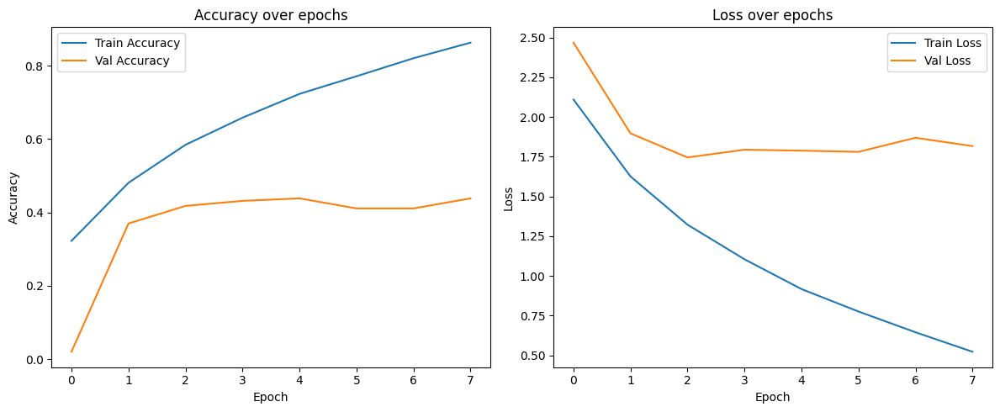

In [173]:
plt.figure(figsize=(12,5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history_stage1v2.history['accuracy'], label='Train Accuracy')
plt.plot(history_stage1v2.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
acc_plot_path = '/content/cnn-resnet-v3s4-accuracy-over-epoch.jpg'
plt.savefig(acc_plot_path)
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history_stage1v2.history['loss'], label='Train Loss')
plt.plot(history_stage1v2.history['val_loss'], label='Val Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
loss_plot_path = '/content/cnn-resnet-v3s4-loss-over-epoch.jpg'
plt.savefig(loss_plot_path)
plt.legend()

plt.tight_layout()
plt.show()

<Figure size 1000x800 with 0 Axes>

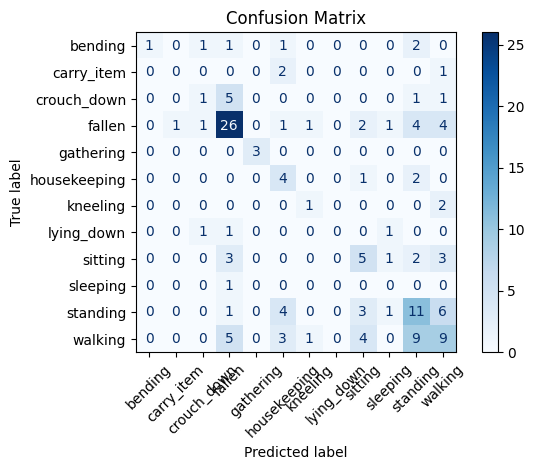

In [198]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(Y_val, Y_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
plt.figure(figsize=(10,8))
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title('Confusion Matrix')
cm_v3s4 = '/content/cnn-resnet-v3s4-cm.jpg'
plt.savefig(cm_v3s4)
plt.tight_layout()
plt.show()

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


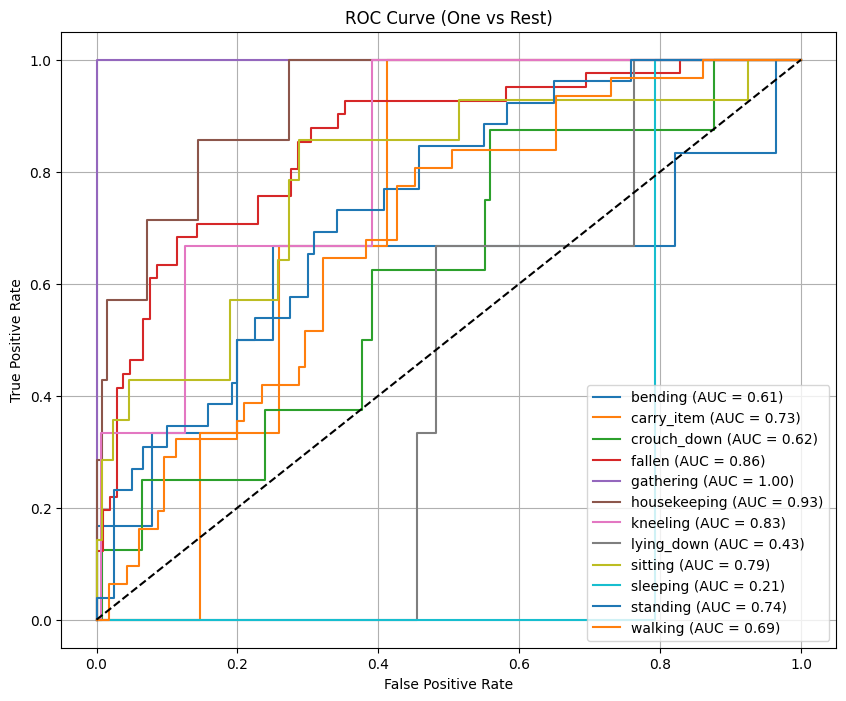

In [199]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay


Y_val_bin = label_binarize(Y_val, classes=np.unique(Y_val))
Y_val_prob = action_classifier.predict(X_val)

plt.figure(figsize=(10,8))
for i, class_name in enumerate(label_encoder.classes_):
    fpr, tpr, _ = roc_curve(Y_val_bin[:,i], Y_val_prob[:,i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name} (AUC = {roc_auc:.2f})')

plt.plot([0,1], [0,1], 'k--')
plt.title('ROC Curve (One vs Rest)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
aucroc_v3s4 = '/content/cnn-resnet-v3s4-aucroc.jpg'
plt.savefig(aucroc_v3s4)
plt.grid()
plt.show()



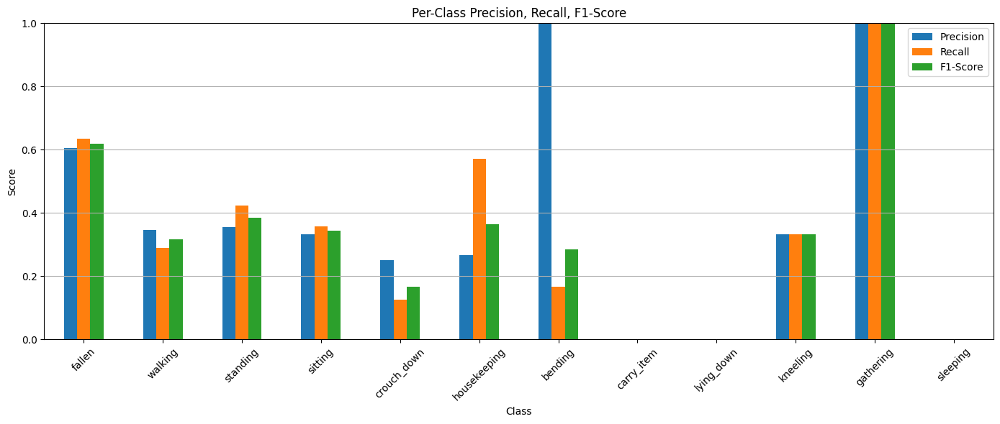

In [200]:
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(
    Y_val, Y_val_pred, labels=np.arange(len(label_encoder.classes_)), zero_division=0
)

metrics_df = pd.DataFrame({
    'Class': label_encoder.classes_,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'Support': support
})

metrics_df = metrics_df.sort_values(by='Support', ascending=False)

metrics_df.plot(x='Class', y=['Precision', 'Recall', 'F1-Score'], kind='bar', figsize=(14,6))
plt.title('Per-Class Precision, Recall, F1-Score')
plt.ylabel('Score')
plt.ylim(0,1)
plt.xticks(rotation=45)
plt.grid(axis='y')
prf_v3s4 = '/content/cnn-resnet-v3s4-prf.jpg'
plt.savefig(prf_v3s4)
plt.tight_layout()
plt.show()


In [184]:
val_counts = pd.Series(Y_val).value_counts().sort_index()
val_counts.index = label_encoder.inverse_transform(val_counts.index)
print(val_counts)

bending          6
carry_item       3
crouch_down      8
fallen          41
gathering        3
housekeeping     7
kneeling         3
lying_down       3
sitting         14
sleeping         1
standing        26
walking         31
Name: count, dtype: int64


In [190]:
misclassified = pd.DataFrame({
    'filename': val_df['filename'],
    'true': label_encoder.inverse_transform(Y_val),
    'predicted': label_encoder.inverse_transform(Y_val_pred)
})

misclassified = misclassified[misclassified['true'] != misclassified['predicted']]
print("Misclassifications:\n", misclassified.head(20))

Misclassifications:
                                               filename          true  \
414  /content/preprocessed-mcfd/chute23/cam1_frame1...       sitting   
395  /content/preprocessed-mcfd/chute15/cam3_frame7...      standing   
271  /content/preprocessed-mcfd/chute23/cam5_frame4...       sitting   
376  /content/preprocessed-mcfd/chute03/cam1_frame6...      standing   
305  /content/preprocessed-mcfd/chute02/cam5_frame3...       walking   
631  /content/preprocessed-mcfd/chute09/cam1_frame8...      sleeping   
301  /content/preprocessed-mcfd/chute17/cam4_frame8...        fallen   
450  /content/preprocessed-mcfd/chute14/cam3_frame1...       bending   
576  /content/preprocessed-mcfd/chute24/cam3_frame3...      standing   
182  /content/preprocessed-mcfd/chute14/cam8_frame4...       walking   
633  /content/preprocessed-mcfd/chute19/cam5_frame2...       walking   
351  /content/preprocessed-mcfd/chute23/cam7_frame3...       walking   
709  /content/preprocessed-mcfd/chute23/cam

In [191]:
print(f"Validation Accuracy: {history_stage1v2.history['val_accuracy'][-1]:.4f}")
print(f"Validation Loss: {history_stage1v2.history['val_loss'][-1]:.4f}")
print(f"Best F1 for 'fallen': {metrics_df[metrics_df['Class']=='fallen']['F1-Score'].values[0]:.2f}")
print(f"Total misclassified frames: {len(misclassified)} / {len(Y_val)} ({(len(misclassified)/len(Y_val))*100:.2f}%)")

Validation Accuracy: 0.4384
Validation Loss: 1.8169
Best F1 for 'fallen': 0.62
Total misclassified frames: 85 / 146 (58.22%)


**Comparison: Before vs After Unfreezing (Stage 1 vs Stage 1v2)**

| Metric                                                    | **Stage 1 (frozen ResNet)** | **Stage 1v2 (unfrozen last 30 ResNet layers)** |
| :-------------------------------------------------------- | :-------------------------- | :--------------------------------------------- |
| **Train accuracy (final epoch)**                          | 20%                         | 87%                                            |
| **Validation accuracy (best epoch)**                      | **15.1%**                   | **43.8%**                                      |
| **Best val\_accuracy at epoch**                           | 2                           | 5                                              |
| **Key abnormal class 'fallen' (precision / recall / F1)** | 0.00 / 0.00 / 0.00          | **0.60 / 0.63 / 0.62**                         |
| **Weighted F1 (val set)**                                 | 0.05                        | **0.41**                                       |
| **Macro average F1 (val set)**                            | 0.03                        | **0.32**                                       |

---

1. Massive jump in model capacity after fine-tuning the ResNet’s top layers — train accuracy hit 87%, validation accuracy 43.8%.

2. Crucial improvement in 'fallen' detection
In Stage 1 → completely missed.
In Stage 1v2 → 0.62 F1-score, recall 63% — excellent considering small val sample size (41).

3. Housekeeping also went from 0 to 0.36 F1
4. Walking, Standing, Sitting improved modestly

!! Some classes like lying_down, carry_item remain at 0 — which is expected given tiny support (samples per class) and potential feature similarity.

---

Unfreezing top ResNet layers gave a drastic performance boost especially on 'fallen' and important categories.

This version is already good enough for Stage 2
→ sequence construction for temporal modeling.

In [162]:
import joblib

joblib.dump(label_encoder, '/content/label_encoder.joblib')
print("Label encoder saved.")

Label encoder saved.


## What's next?

**Current Scenario:**
1. Model trained and tested on preprocessed, resized, denoised frames
2. Frame extraction already done from original .avi
3. Approx. 8795 preprocessed frames available
4. Consistent naming with embedded frame number & camera
5. FPS summary available (120 fps per video

In [ ]:
raw .avi
  │
  └──> preprocess frames (resize, denoise) [already done]
             │
             └──> CNN per-frame inference
                        │
                        └──> assemble sequences by chute/camera/frame #
                                  │
                                  └──> LSTM sequence classification
                                              │
                                              └──> CSV + Streamlit dashboard


### Stage 2 - Assembling Sequence

In [39]:
# Load model & label encoder
from tensorflow.keras.models import load_model

model = load_model('/content/cnn_resnet_action_classifierv2.keras')
label_encoder = joblib.load('/content/cnn-lstmv3s3_label_encoder.joblib')

In [42]:
# List all preprocessed image files
frame_files = []
for root, dirs, files in os.walk('/content/preprocessed-mcfd/'):
    for file in files:
        if file.endswith('.jpg'):
            frame_files.append(os.path.join(root, file))

print(f"Total frames found: {len(frame_files)}")

# Predict in batches
results = []
batch_size = 64
batch_imgs = []
batch_filenames = []

for idx, f in enumerate(tqdm(frame_files)):
    img = cv2.imread(f)
    img = cv2.resize(img, (224, 224))
    img = preprocess_input(img)
    batch_imgs.append(img)
    batch_filenames.append(f)

    if len(batch_imgs) == batch_size or (idx + 1) == len(frame_files):
        batch_imgs_np = np.array(batch_imgs)
        preds = model.predict(batch_imgs_np)
        pred_classes = np.argmax(preds, axis=1)
        pred_names = label_encoder.inverse_transform(pred_classes)

        for file, name in zip(batch_filenames, pred_names):
            results.append({'filename': file, 'predicted_action': name})

        batch_imgs, batch_filenames = [], []  # Reset batch

# Save results
df_results = pd.DataFrame(results)
df_results.to_csv('/content/predicted_results.csv', index=False)
print("Full predictions saved.")

Total frames found: 8795


  0%|          | 0/8795 [00:00<?, ?it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step


  1%|          | 64/8795 [00:07<16:13,  8.97it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  1%|▏         | 128/8795 [00:07<06:58, 20.69it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  2%|▏         | 192/8795 [00:07<03:58, 36.00it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


  3%|▎         | 256/8795 [00:07<02:38, 53.95it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  4%|▍         | 378/8795 [00:08<01:19, 105.23it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  5%|▍         | 414/8795 [00:08<01:12, 116.29it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  5%|▌         | 448/8795 [00:08<01:06, 126.15it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  6%|▌         | 512/8795 [00:08<00:51, 162.06it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


  7%|▋         | 633/8795 [00:09<00:34, 237.81it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  8%|▊         | 670/8795 [00:09<00:36, 223.00it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


  8%|▊         | 704/8795 [00:09<00:38, 207.67it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  9%|▊         | 768/8795 [00:09<00:34, 234.66it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


  9%|▉         | 832/8795 [00:09<00:30, 257.08it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 10%|█         | 896/8795 [00:10<00:29, 272.17it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 11%|█         | 960/8795 [00:10<00:27, 280.30it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 12%|█▏        | 1024/8795 [00:10<00:26, 288.90it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 12%|█▏        | 1088/8795 [00:10<00:27, 275.32it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 14%|█▍        | 1211/8795 [00:11<00:22, 330.62it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 14%|█▍        | 1249/8795 [00:11<00:26, 289.56it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 15%|█▍        | 1282/8795 [00:11<00:29, 253.27it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 15%|█▌        | 1344/8795 [00:11<00:28, 265.23it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 16%|█▌        | 1408/8795 [00:11<00:26, 275.03it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 17%|█▋        | 1472/8795 [00:12<00:27, 267.10it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 17%|█▋        | 1536/8795 [00:12<00:26, 274.98it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 18%|█▊        | 1600/8795 [00:12<00:25, 279.78it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 19%|█▉        | 1664/8795 [00:12<00:25, 281.29it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 20%|█▉        | 1728/8795 [00:13<00:25, 280.21it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 20%|██        | 1792/8795 [00:13<00:24, 282.25it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 21%|██        | 1856/8795 [00:13<00:24, 286.23it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


 22%|██▏       | 1920/8795 [00:13<00:24, 276.97it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 23%|██▎       | 1984/8795 [00:14<00:24, 281.87it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 23%|██▎       | 2048/8795 [00:14<00:25, 269.67it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 24%|██▍       | 2112/8795 [00:14<00:23, 279.74it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 25%|██▍       | 2176/8795 [00:14<00:23, 284.05it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 25%|██▌       | 2240/8795 [00:14<00:22, 286.85it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 26%|██▌       | 2304/8795 [00:15<00:23, 271.80it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 27%|██▋       | 2368/8795 [00:15<00:23, 278.48it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2432/8795 [00:15<00:22, 280.57it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 28%|██▊       | 2496/8795 [00:15<00:21, 288.18it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 29%|██▉       | 2560/8795 [00:16<00:21, 287.27it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 30%|██▉       | 2624/8795 [00:16<00:21, 290.71it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 31%|███       | 2688/8795 [00:16<00:20, 291.29it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 2811/8795 [00:16<00:17, 340.64it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 32%|███▏      | 2850/8795 [00:17<00:20, 292.65it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 33%|███▎      | 2883/8795 [00:17<00:24, 245.22it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 33%|███▎      | 2944/8795 [00:17<00:22, 258.26it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 34%|███▍      | 3008/8795 [00:17<00:21, 270.29it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 35%|███▍      | 3072/8795 [00:17<00:20, 277.60it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


 36%|███▌      | 3136/8795 [00:18<00:20, 269.50it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 36%|███▋      | 3200/8795 [00:18<00:20, 272.14it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 37%|███▋      | 3264/8795 [00:18<00:19, 276.85it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 38%|███▊      | 3328/8795 [00:18<00:19, 284.39it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▊      | 3392/8795 [00:19<00:18, 288.92it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 39%|███▉      | 3456/8795 [00:19<00:18, 290.53it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 40%|████      | 3520/8795 [00:19<00:18, 292.83it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████      | 3584/8795 [00:19<00:17, 294.72it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 41%|████▏     | 3648/8795 [00:19<00:18, 271.90it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


 42%|████▏     | 3712/8795 [00:20<00:19, 260.58it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 43%|████▎     | 3776/8795 [00:20<00:18, 270.76it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 44%|████▎     | 3840/8795 [00:20<00:17, 279.07it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 44%|████▍     | 3904/8795 [00:20<00:17, 283.42it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


 45%|████▌     | 3968/8795 [00:21<00:18, 267.07it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 46%|████▌     | 4032/8795 [00:21<00:17, 274.44it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4096/8795 [00:21<00:16, 281.77it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 47%|████▋     | 4160/8795 [00:21<00:16, 286.65it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 48%|████▊     | 4224/8795 [00:22<00:15, 290.86it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4288/8795 [00:22<00:15, 293.42it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 49%|████▉     | 4352/8795 [00:22<00:15, 295.32it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 50%|█████     | 4416/8795 [00:22<00:14, 295.28it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 51%|█████     | 4480/8795 [00:22<00:15, 274.07it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 52%|█████▏    | 4544/8795 [00:23<00:15, 281.25it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 52%|█████▏    | 4608/8795 [00:23<00:14, 286.97it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 53%|█████▎    | 4672/8795 [00:23<00:14, 290.05it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


 54%|█████▍    | 4736/8795 [00:23<00:14, 274.92it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 55%|█████▌    | 4860/8795 [00:24<00:11, 331.09it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 4898/8795 [00:24<00:13, 290.25it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 56%|█████▌    | 4931/8795 [00:24<00:15, 255.86it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 57%|█████▋    | 4992/8795 [00:24<00:14, 267.01it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 57%|█████▋    | 5056/8795 [00:24<00:13, 278.53it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 58%|█████▊    | 5120/8795 [00:25<00:12, 285.78it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 59%|█████▉    | 5184/8795 [00:25<00:12, 290.03it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 60%|█████▉    | 5248/8795 [00:25<00:11, 296.69it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 61%|██████    | 5375/8795 [00:25<00:09, 347.71it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 5414/8795 [00:26<00:11, 290.58it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 62%|██████▏   | 5447/8795 [00:26<00:13, 253.50it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 63%|██████▎   | 5504/8795 [00:26<00:12, 259.65it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


 63%|██████▎   | 5568/8795 [00:26<00:12, 258.33it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 64%|██████▍   | 5632/8795 [00:26<00:11, 270.42it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 65%|██████▍   | 5696/8795 [00:27<00:11, 260.97it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 65%|██████▌   | 5760/8795 [00:27<00:11, 273.34it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 66%|██████▌   | 5824/8795 [00:27<00:10, 283.77it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 67%|██████▋   | 5888/8795 [00:27<00:09, 291.72it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 5952/8795 [00:28<00:10, 276.18it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 68%|██████▊   | 6016/8795 [00:28<00:09, 281.12it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 69%|██████▉   | 6080/8795 [00:28<00:09, 289.24it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 70%|██████▉   | 6144/8795 [00:28<00:09, 292.27it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 71%|███████   | 6208/8795 [00:28<00:08, 294.33it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


 71%|███████▏  | 6272/8795 [00:29<00:08, 299.16it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 72%|███████▏  | 6336/8795 [00:29<00:08, 295.39it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 73%|███████▎  | 6400/8795 [00:29<00:08, 295.52it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


 73%|███████▎  | 6464/8795 [00:29<00:08, 275.46it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 75%|███████▍  | 6583/8795 [00:30<00:06, 322.96it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 75%|███████▌  | 6620/8795 [00:30<00:07, 281.80it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▌  | 6656/8795 [00:30<00:08, 252.12it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 76%|███████▋  | 6720/8795 [00:30<00:07, 265.42it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 6843/8795 [00:31<00:05, 329.13it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 78%|███████▊  | 6881/8795 [00:31<00:06, 281.13it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 79%|███████▊  | 6913/8795 [00:31<00:07, 244.18it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 79%|███████▉  | 6976/8795 [00:31<00:07, 259.52it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 80%|████████  | 7040/8795 [00:31<00:06, 265.55it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 81%|████████  | 7104/8795 [00:32<00:06, 266.40it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 82%|████████▏ | 7168/8795 [00:32<00:05, 272.56it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


 83%|████████▎ | 7288/8795 [00:32<00:04, 301.88it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 83%|████████▎ | 7320/8795 [00:33<00:06, 245.44it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


 84%|████████▎ | 7360/8795 [00:33<00:06, 210.05it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 84%|████████▍ | 7424/8795 [00:33<00:05, 235.72it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 85%|████████▌ | 7488/8795 [00:33<00:05, 252.73it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 86%|████████▌ | 7552/8795 [00:33<00:04, 265.57it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 7616/8795 [00:34<00:04, 258.91it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 87%|████████▋ | 7680/8795 [00:34<00:04, 269.75it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 88%|████████▊ | 7744/8795 [00:34<00:03, 269.65it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 89%|████████▉ | 7808/8795 [00:34<00:03, 270.81it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|████████▉ | 7872/8795 [00:35<00:03, 278.43it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 90%|█████████ | 7936/8795 [00:35<00:02, 286.89it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 91%|█████████ | 8000/8795 [00:35<00:02, 289.97it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


 92%|█████████▏| 8064/8795 [00:35<00:02, 275.96it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 93%|█████████▎| 8188/8795 [00:36<00:01, 333.89it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▎| 8226/8795 [00:36<00:01, 289.79it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 94%|█████████▍| 8259/8795 [00:36<00:02, 252.93it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▍| 8320/8795 [00:36<00:01, 263.48it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 95%|█████████▌| 8384/8795 [00:36<00:01, 272.99it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 96%|█████████▌| 8448/8795 [00:37<00:01, 264.10it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 97%|█████████▋| 8512/8795 [00:37<00:01, 274.04it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


 98%|█████████▊| 8576/8795 [00:37<00:00, 280.98it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 98%|█████████▊| 8640/8795 [00:37<00:00, 285.74it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


 99%|█████████▉| 8704/8795 [00:38<00:00, 287.75it/s]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


100%|█████████▉| 8768/8795 [00:38<00:00, 289.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


100%|██████████| 8795/8795 [00:43<00:00, 200.68it/s]

Full predictions saved.


In [168]:
final_model_path = '/content/cnn_resnet_action_classifier_v3s3_best.keras'
model.save(final_model_path)
print(f"Model saved to {final_model_path}")

Model saved to /content/cnn_resnet_action_classifier_v3s3_best.keras


In [43]:
BUCKET_NAME = 'p2-anomaly'
RESULTS_FOLDERv3 = 'resultsv3'
MODEL_FOLDER = f'{RESULTS_FOLDERv3}/models'
PLOTS_FOLDER = f'{RESULTS_FOLDERv3}/plots'
METADATA = f'{RESULTS_FOLDERv3}/metadata'

client = storage.Client()
bucket = client.bucket(BUCKET_NAME)

def upload_to_gcs(local_path, gcs_path):
    blob = bucket.blob(gcs_path)
    blob.upload_from_filename(local_path)
    print(f"Uploaded {local_path} to gs://{BUCKET_NAME}/{gcs_path}")

In [170]:
np.save('/content/cnn-lstmv3s3_X_train.npy', X_train)
np.save('/content/cnn-lstmv3s3_Y_train.npy', Y_train)
np.save('/content/cnn-lstmv3s3_X_val.npy', X_val)
np.save('/content/cnn-lstmv3s3_Y_val.npy', Y_val)
joblib.dump(label_encoder, '/content/cnn-lstmv3s3_label_encoder.joblib')

['/content/cnn-lstmv3s3_label_encoder.joblib']

In [174]:
# Model
upload_to_gcs(final_model_path, f'{MODEL_FOLDER}/cnn_lstm_action_classifier_v3s3_best.keras')

# Label encoder
upload_to_gcs('/content/cnn-lstmv3s3_label_encoder.joblib', f'{MODEL_FOLDER}/cnn-lstmv3s3_label_encoder.joblib')

# Numpy arrays
upload_to_gcs('/content/cnn-lstmv3s3_X_train.npy', f'{METADATA}/cnn-lstmv3s3_X_train.npy')
upload_to_gcs('/content/cnn-lstmv3s3_Y_train.npy', f'{METADATA}/cnn-lstmv3s3_Y_train.npy')
upload_to_gcs('/content/cnn-lstmv3s3_X_val.npy', f'{METADATA}/cnn-lstmv3s3_X_val.npy')
upload_to_gcs('/content/cnn-lstmv3s3_Y_val.npy', f'{METADATA}/cnn-lstmv3s3_Y_val.npy')


Uploaded /content/cnn_resnet_action_classifier_v3s3_best.keras to gs://p2-anomaly/resultsv3/models/cnn_lstm_action_classifier_v3s3_best.keras
Uploaded /content/cnn-lstmv3s3_label_encoder.joblib to gs://p2-anomaly/resultsv3/models/cnn-lstmv3s3_label_encoder.joblib
Uploaded /content/cnn-lstmv3s3_X_train.npy to gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_train.npy
Uploaded /content/cnn-lstmv3s3_Y_train.npy to gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_train.npy
Uploaded /content/cnn-lstmv3s3_X_val.npy to gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_X_val.npy
Uploaded /content/cnn-lstmv3s3_Y_val.npy to gs://p2-anomaly/resultsv3/metadata/cnn-lstmv3s3_Y_val.npy


In [201]:
# Plots
upload_to_gcs(acc_plot_path, f'{PLOTS_FOLDER}/cnn-resnet-v3s4-accuracy-over-epoch.jpg')
upload_to_gcs(loss_plot_path, f'{PLOTS_FOLDER}/cnn-resnet-v3s4-loss-over-epoch.jpg')

upload_to_gcs(cm_v3s4, f'{PLOTS_FOLDER}/cnn-resnet-v3s4-cm.jpg')
upload_to_gcs(aucroc_v3s4, f'{PLOTS_FOLDER}/cnn-resnet-v3s4-aucroc.jpg')
upload_to_gcs(prf_v3s4, f'{PLOTS_FOLDER}/cnn-resnet-v3s4-prf.jpg')

Uploaded /content/cnn-resnet-v3s4-accuracy-over-epoch.jpg to gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-accuracy-over-epoch.jpg
Uploaded /content/cnn-resnet-v3s4-loss-over-epoch.jpg to gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-loss-over-epoch.jpg
Uploaded /content/cnn-resnet-v3s4-cm.jpg to gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-cm.jpg
Uploaded /content/cnn-resnet-v3s4-aucroc.jpg to gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-aucroc.jpg
Uploaded /content/cnn-resnet-v3s4-prf.jpg to gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-prf.jpg


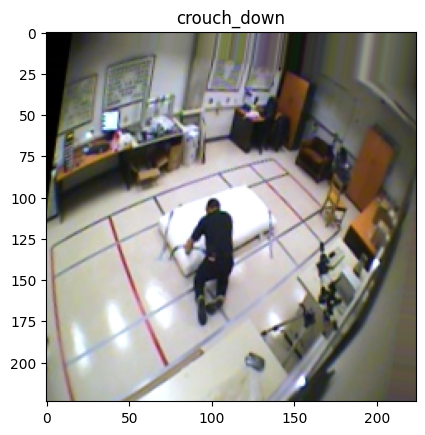

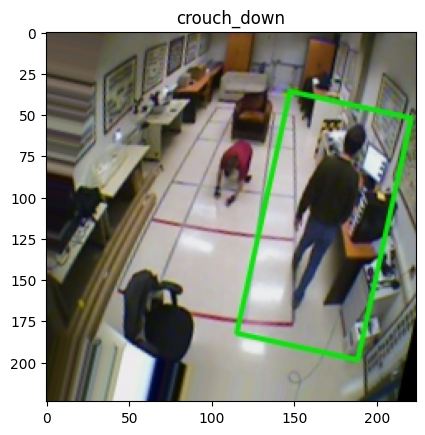

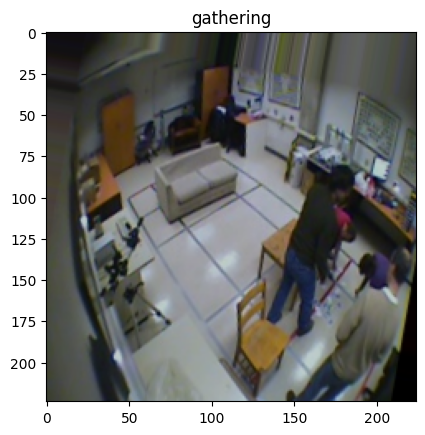

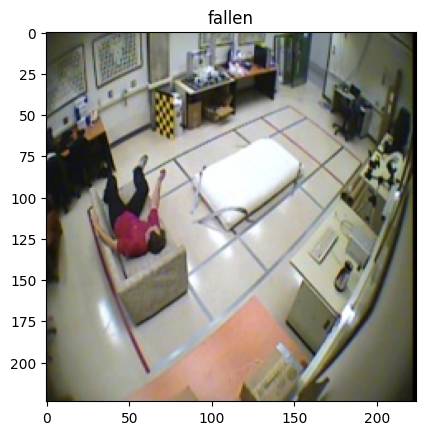

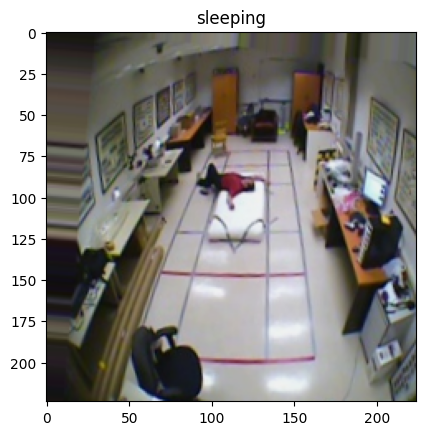

In [192]:
import matplotlib.pyplot as plt

for i in range(5):
    plt.imshow(X_train[i])
    plt.title(label_encoder.classes_[Y_train[i]])
    plt.show()

In [44]:
import pandas as pd
import numpy as np

# Load per-frame predictions
df = pd.read_csv('/content/predicted_results.csv')

# Group by chute and camera (from filename)
df['chute'] = df['filename'].apply(lambda x: x.split('/')[3])
df['camera'] = df['filename'].apply(lambda x: x.split('/')[4].split('_')[0])

# Sort by chute, camera, frame number
df['frame_number'] = df['filename'].apply(lambda x: int(x.split('frame')[-1].split('_')[0]))
df = df.sort_values(by=['chute', 'camera', 'frame_number'])

# Build sequences
sequence_length = 5
sequences = []
labels = []

for (chute, camera), group in df.groupby(['chute', 'camera']):
    actions = group['predicted_action'].values
    frames = group['frame_number'].values
    for i in range(len(actions) - sequence_length + 1):
        seq_actions = actions[i:i+sequence_length]
        start_frame = frames[i]
        end_frame = frames[i+sequence_length-1]
        sequences.append((chute, camera, start_frame, end_frame, list(seq_actions)))

# Convert to DataFrame
seq_df = pd.DataFrame(sequences, columns=['chute', 'camera', 'start_frame', 'end_frame', 'predicted_actions'])
seq_df.to_csv('/content/sequence_predictions.csv', index=False)

In [81]:
# Load per-frame predictions
df = pd.read_csv('/content/predicted_results.csv')

# Group by chute and camera (from filename)
df['chute'] = df['filename'].apply(lambda x: x.split('/')[3])
df['camera'] = df['filename'].apply(lambda x: x.split('/')[4].split('_')[0])

# Extract frame number
df['frame_number'] = df['filename'].apply(lambda x: int(x.split('frame')[-1].split('_')[0]))

# Sort properly
df = df.sort_values(by=['chute', 'camera', 'frame_number']).reset_index(drop=True)

# Build sequences
sequence_length = 5
sequences = []

for (chute, camera), group in df.groupby(['chute', 'camera']):
    group = group.sort_values('frame_number').reset_index(drop=True)
    for i in range(len(group) - sequence_length + 1):
        seq_actions = group.loc[i:i+sequence_length-1, 'predicted_action'].tolist()
        start_frame = group.loc[i, 'frame_number']
        end_frame = group.loc[i+sequence_length-1, 'frame_number']
        sequences.append({
            'chute': chute,
            'camera': camera,
            'start_frame': start_frame,
            'end_frame': end_frame,
            'predicted_actions': seq_actions
        })

# Save sequences
seq_df = pd.DataFrame(sequences)
seq_df.to_csv('/content/sequence_predictions_fixed.csv', index=False)
print("Fixed sequence predictions saved.")

Fixed sequence predictions saved.


In [47]:
seq_df.head()

,chute,camera,start_frame,end_frame,predicted_actions,anomaly_flag
0,chute01,cam1,0,120,"[housekeeping, housekeeping, housekeeping, hou...",0
1,chute01,cam1,30,150,"[housekeeping, housekeeping, housekeeping, hou...",0
2,chute01,cam1,60,180,"[housekeeping, housekeeping, housekeeping, hou...",0
3,chute01,cam1,90,210,"[housekeeping, housekeeping, housekeeping, hou...",0
4,chute01,cam1,120,240,"[housekeeping, housekeeping, housekeeping, hou...",0


In [82]:
abnormal_actions = ['fallen', 'crouch_down', 'fighting']

seq_df['anomaly_flag'] = seq_df['predicted_actions'].apply(
    lambda acts: int(any(a in abnormal_actions for a in acts))
)

seq_df.to_csv('/content/sequence_anomalies_flagged.csv', index=False)

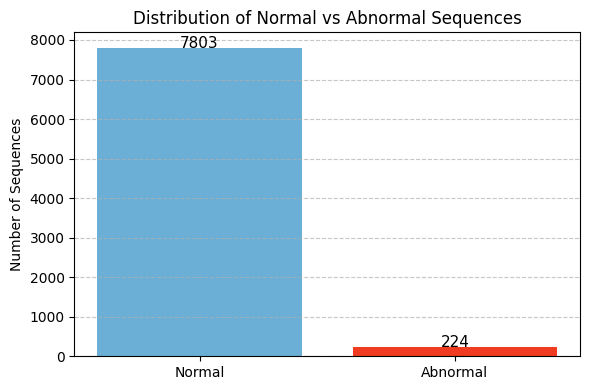

A very skewed bar chart with Normal (~7803) vs Abnormal (~224) sequences.


In [83]:
df = pd.read_csv('/content/sequence_anomalies_flagged.csv')

counts = df['anomaly_flag'].value_counts().sort_index()

plt.figure(figsize=(6,4))
bars = plt.bar(['Normal', 'Abnormal'], counts.values, color=['#6baed6', '#f03b20'])
plt.title('Distribution of Normal vs Abnormal Sequences')
plt.ylabel('Number of Sequences')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, int(yval), ha='center', fontsize=11)

plt.tight_layout()
n_a_v3s4 = '/content/cnn-resnet-v3s4-distNvA.jpg'
plt.savefig(n_a_v3s4)
plt.show()
print("A very skewed bar chart with Normal (~7803) vs Abnormal (~224) sequences.")

In [49]:
label_encoder.classes_


array(['bending', 'carry_item', 'crouch_down', 'fallen', 'gathering',
       'housekeeping', 'kneeling', 'lying_down', 'sitting', 'sleeping',
       'standing', 'walking'], dtype=object)

**Activities Done:**

| Stage                                      | Status          | Notes                                                                                                                                  |
| :----------------------------------------- | :-------------- | :------------------------------------------------------------------------------------------------------------------------------------- |
|  **Preprocess frames (resize, denoise)** | ✅ Done          | Preprocessed frames saved                                                                                                              |
|  **CNN per-frame inference**             | ✅ Done          | `predicted_results.csv` complete                                                                                                       |
|  **Assemble sequences**                 | ✅ Done          | The latest `for` loop on per-chute, per-camera grouping + sequencing did exactly this — generated `sequence_predictions.csv`          |
|  **LSTM sequence classification**        | 🔲 Not yet done | This is the next step: pass those assembled sequences into your trained CNN-LSTM model to predict anomaly labels at the sequence level |


1. Model trained well — on augmented data
2. Inference without augmentation leads to mismatch and prediction bias
3. To refine: Address by retraining with real (non-augmented) validation set, or use test-time augmentation to stabilise predictions

# Integrate with SVM Classifier

In [215]:
!gsutil ls -r gs://p2-anomaly/** | grep 'cnn_lstm_attempt3.h5'
!gsutil ls -r gs://p2-anomaly/** | grep 'svm_vgg19_split_model.joblib'
!gsutil ls -r gs://p2-anomaly/** | grep 'pca_vgg19_split.joblib'


gs://p2-anomaly/models/svm_vgg19_split_model.joblib
gs://p2-anomaly/models/pca_vgg19_split.joblib


In [223]:
!gsutil cp gs://p2-anomaly/models/svm_vgg19_split_model.joblib /content/
!gsutil cp gs://p2-anomaly/models/pca_vgg19_split.joblib /content/

Copying gs://p2-anomaly/models/svm_vgg19_split_model.joblib...
/ [1 files][ 15.8 MiB/ 15.8 MiB]                                                
Operation completed over 1 objects/15.8 MiB.                                     
Copying gs://p2-anomaly/models/pca_vgg19_split.joblib...
/ [1 files][606.4 KiB/606.4 KiB]                                                
Operation completed over 1 objects/606.4 KiB.                                    


In [50]:
!gsutil ls -r gs://p2-anomaly/** | grep 'label_encoder.joblib'
!gsutil cp gs://p2-anomaly/processed/labels/label_encoder.joblib /content/

gs://p2-anomaly/models/label_encoder.joblib
gs://p2-anomaly/processed/labels/label_encoder.joblib
gs://p2-anomaly/resultsv3/models/cnn-lstmv3s3_label_encoder.joblib
Copying gs://p2-anomaly/processed/labels/label_encoder.joblib...
/ [1 files][  643.0 B/  643.0 B]                                                
Operation completed over 1 objects/643.0 B.                                      


**SVM Model**

SVM model is already trained on a HAR dataset via VGG19+PCA features, and saved:

SVM model: p2-anomaly/models/svm_vgg19_split_model.joblib
PCA object: p2-anomaly/models/pca_vgg19_split.joblib

In [51]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import joblib
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.models import Model

image_folder = '/content/preprocessed-mcfd'
svm_model_path = '/content/svm_vgg19_split_model.joblib'
pca_path = '/content/pca_vgg19_split.joblib'

svm_model = joblib.load(svm_model_path)
pca = joblib.load(pca_path)

# Load SVM model and PCA
svm_model = joblib.load(svm_model_path)
pca = joblib.load(pca_path)

# VGG19 feature extractor (without top layer)
base_model = VGG19(weights='imagenet', include_top=False, pooling='avg')
feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

# Collect image paths
image_paths = []
for root, dirs, files in os.walk(image_folder):
    for file in files:
        if file.endswith('.jpg'):
            image_paths.append(os.path.join(root, file))

print(f"Total images found: {len(image_paths)}")

# Process in batches with progress bar
batch_size = 256
features_list = []
filenames_list = []

for i in tqdm(range(0, len(image_paths), batch_size), desc='Processing Images'):
    batch_paths = image_paths[i:i+batch_size]
    batch_images = []

    for path in batch_paths:
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        img = preprocess_input(img)
        batch_images.append(img)

    batch_images = np.array(batch_images)
    batch_features = feature_extractor.predict(batch_images, verbose=0)
    features_list.append(batch_features)
    filenames_list.extend(batch_paths)

# Combine all features
features = np.vstack(features_list)

# Apply PCA transform
features_pca = pca.transform(features)

# Predict with SVM
predictions = svm_model.predict(features_pca)

# Save results to CSV
results_df = pd.DataFrame({
    'filename': filenames_list,
    'svm_predicted_action': predictions
})

results_df.to_csv('/content/svm_predictions_crsvm.csv', index=False)
print("SVM predictions saved to /content/svm_predictions_crsvm.csv")

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Total images found: 8795


Processing Images: 100%|██████████| 35/35 [00:30<00:00,  1.16it/s]


SVM predictions saved to /content/svm_predictions_crsvm.csv


In [52]:
import pandas as pd
import joblib

svm_df = pd.read_csv('/content/svm_predictions_crsvm.csv')

svm_label_encoder = joblib.load('/content/label_encoder.joblib')
svm_df['svm_predicted_action'] = svm_label_encoder.inverse_transform(svm_df['svm_predicted_action'])
svm_df.to_csv('/content/svm_predictions_crsvm_named.csv', index=False)
print("Updated SVM predictions saved to /content/svm_predictions_crsvm_named.csv")

print(svm_df.head())

Updated SVM predictions saved to /content/svm_predictions_crsvm_named.csv
                                            filename svm_predicted_action
0  /content/preprocessed-mcfd/chute15/cam3_frame8...             sleeping
1  /content/preprocessed-mcfd/chute15/cam1_frame7...             sleeping
2  /content/preprocessed-mcfd/chute15/cam7_frame0...             sleeping
3  /content/preprocessed-mcfd/chute15/cam7_frame5...              sitting
4  /content/preprocessed-mcfd/chute15/cam7_frame4...   listening_to_music


In [57]:
import pandas as pd

# Load CNN and SVM predictions
cnn_df = pd.read_csv('/content/predicted_results.csv')
svm_df = pd.read_csv('/content/svm_predictions_crsvm_named.csv')

# Merge on filename
combined_df = pd.merge(cnn_df, svm_df, on='filename')

# Define abnormal actions
abnormal_actions = ['fallen', 'crouch_down', 'fighting']

# Flag abnormality: if either CNN or SVM detects abnormal
combined_df['anomaly_flag'] = combined_df.apply(
    lambda row: 1 if (row['predicted_action'] in abnormal_actions or row['svm_predicted_action'] in abnormal_actions) else 0,
    axis=1
)

# Save combined results
combined_df.to_csv('/content/combined_predictions_crsvm.csv', index=False)
print("Combined predictions saved to /content/combined_predictions_crsvm.csv")

# Quick count
print(combined_df['anomaly_flag'].value_counts())

Combined predictions saved to /content/combined_predictions_crsvm.csv
anomaly_flag
0    6758
1    2037
Name: count, dtype: int64


In [58]:
print(combined_df.head())

                                            filename predicted_action  \
0  /content/preprocessed-mcfd/chute15/cam3_frame8...     housekeeping   
1  /content/preprocessed-mcfd/chute15/cam1_frame7...     housekeeping   
2  /content/preprocessed-mcfd/chute15/cam7_frame0...     housekeeping   
3  /content/preprocessed-mcfd/chute15/cam7_frame5...       lying_down   
4  /content/preprocessed-mcfd/chute15/cam7_frame4...       lying_down   

  svm_predicted_action  anomaly_flag  
0             sleeping             0  
1             sleeping             0  
2             sleeping             0  
3              sitting             0  
4   listening_to_music             0  


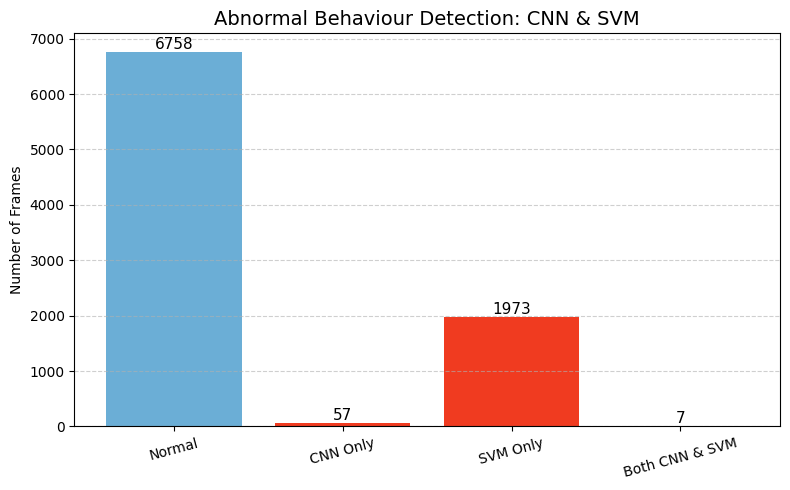

In [61]:
import pandas as pd
import matplotlib.pyplot as plt

# Load combined predictions
combined_df = pd.read_csv('/content/combined_predictions_crsvm.csv')

# Define abnormal actions for CNN
abnormal_actions = ['fallen', 'crouch_down', 'fighting']

# Flag for abnormalities
combined_df['cnn_abnormal'] = combined_df['predicted_action'].isin(abnormal_actions).astype(int)
combined_df['svm_abnormal'] = combined_df['svm_predicted_action'].isin(abnormal_actions).astype(int)

# Categorise detections
def detection_category(row):
    if row['cnn_abnormal'] == 1 and row['svm_abnormal'] == 1:
        return 'Both CNN & SVM'
    elif row['cnn_abnormal'] == 1:
        return 'CNN Only'
    elif row['svm_abnormal'] == 1:
        return 'SVM Only'
    else:
        return 'Normal'

combined_df['detection_category'] = combined_df.apply(detection_category, axis=1)

# Count each category
category_counts = combined_df['detection_category'].value_counts().reindex(['Normal', 'CNN Only', 'SVM Only', 'Both CNN & SVM']).fillna(0)

# Define colours — light blue for 'Normal', red for the rest
colors = ['#6baed6', '#f03b20', '#f03b20', '#f03b20']

# Plot
plt.figure(figsize=(8,5))
bars = plt.bar(category_counts.index, category_counts.values, color=colors)

# Add value labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, int(yval), ha='center', va='bottom', fontsize=11)

# Styling
plt.title('Abnormal Behaviour Detection: CNN & SVM', fontsize=14)
plt.ylabel('Number of Frames')
plt.xticks(rotation=15)
plt.grid(axis='y', linestyle='--', alpha=0.6)
bar_NvA_c = '/content/cnn-svm-distNvA.jpg'
plt.savefig(bar_NvA_c)
plt.tight_layout()
plt.show()


In [62]:
# Plots
upload_to_gcs(bar_NvA_c, f'{PLOTS_FOLDER}/cnn-svm-distNvA.jpg')
upload_to_gcs(n_a_v3s4, f'{PLOTS_FOLDER}/cnn-resnet-v3s4-distNvA.jpg')

Uploaded /content/cnn-svm-distNvA.jpg to gs://p2-anomaly/resultsv3/plots/cnn-svm-distNvA.jpg
Uploaded /content/cnn-resnet-v3s4-distNvA.jpg to gs://p2-anomaly/resultsv3/plots/cnn-resnet-v3s4-distNvA.jpg


In [64]:
combined_df = pd.read_csv('/content/combined_predictions_crsvm.csv')

abnormal_actions = ['fallen', 'crouch_down', 'fighting']

combined_df['cnn_abnormal'] = combined_df['predicted_action'].isin(abnormal_actions).astype(int)
combined_df['svm_abnormal'] = combined_df['svm_predicted_action'].isin(abnormal_actions).astype(int)

cnn_abnormal_counts = combined_df[combined_df['cnn_abnormal'] == 1]['predicted_action'].value_counts()

svm_abnormal_counts = combined_df[combined_df['svm_abnormal'] == 1]['svm_predicted_action'].value_counts()

comparison_df = pd.DataFrame({
    'CNN Abnormal Detections': cnn_abnormal_counts,
    'SVM Abnormal Detections': svm_abnormal_counts
}).fillna(0).astype(int)


total_cnn_counts = combined_df['predicted_action'].value_counts()
total_svm_counts = combined_df['svm_predicted_action'].value_counts()


comparison_df['Total CNN Detections'] = total_cnn_counts.reindex(comparison_df.index).fillna(0).astype(int)
comparison_df['Total SVM Detections'] = total_svm_counts.reindex(comparison_df.index).fillna(0).astype(int)


comparison_df = comparison_df.sort_values(by=['CNN Abnormal Detections', 'SVM Abnormal Detections'], ascending=False)


comparison_df.to_csv('/content/comparison_abnormal_detection_summary.csv')
print("Comparison table saved to /content/comparison_abnormal_detection_summary.csv")


Comparison table saved to /content/comparison_abnormal_detection_summary.csv


In [65]:
# Show table preview
comparison_df

,CNN Abnormal Detections,SVM Abnormal Detections,Total CNN Detections,Total SVM Detections
fallen,64,0,64,0
fighting,0,1980,0,1980


In [66]:
# Crosstab of CNN vs SVM predictions
action_combination_table = combined_df.groupby(['predicted_action', 'svm_predicted_action']).size().reset_index(name='count')

# Sort by count descending for easy viewing
action_combination_table = action_combination_table.sort_values(by='count', ascending=False)

print(action_combination_table)

   predicted_action svm_predicted_action  count
14     housekeeping             sleeping   4611
10     housekeeping             fighting   1590
25       lying_down             sleeping    705
21       lying_down             fighting    383
12     housekeeping              running    279
22       lying_down   listening_to_music    203
7      housekeeping              dancing    198
19       lying_down              dancing    183
5      housekeeping              calling    127
23       lying_down              running    102
11     housekeeping   listening_to_music     91
16     housekeeping         using_laptop     68
6      housekeeping              cycling     58
13     housekeeping              sitting     45
4            fallen             sleeping     44
18       lying_down              cycling     37
9      housekeeping               eating     27
24       lying_down              sitting      9
1            fallen             fighting      7
17       lying_down              calling

In [67]:
pivot_table = pd.pivot_table(combined_df, values='filename',
                             index='predicted_action',
                             columns='svm_predicted_action',
                             aggfunc='count',
                             fill_value=0)

pivot_table

svm_predicted_action,calling,cycling,dancing,drinking,eating,fighting,listening_to_music,running,sitting,sleeping,texting,using_laptop
predicted_action,,,,,,,,,,,,
fallen,0,0,5,0,0,7,4,4,0,44,0,0
housekeeping,127,58,198,3,27,1590,91,279,45,4611,1,68
lying_down,7,37,183,0,2,383,203,102,9,705,2,0


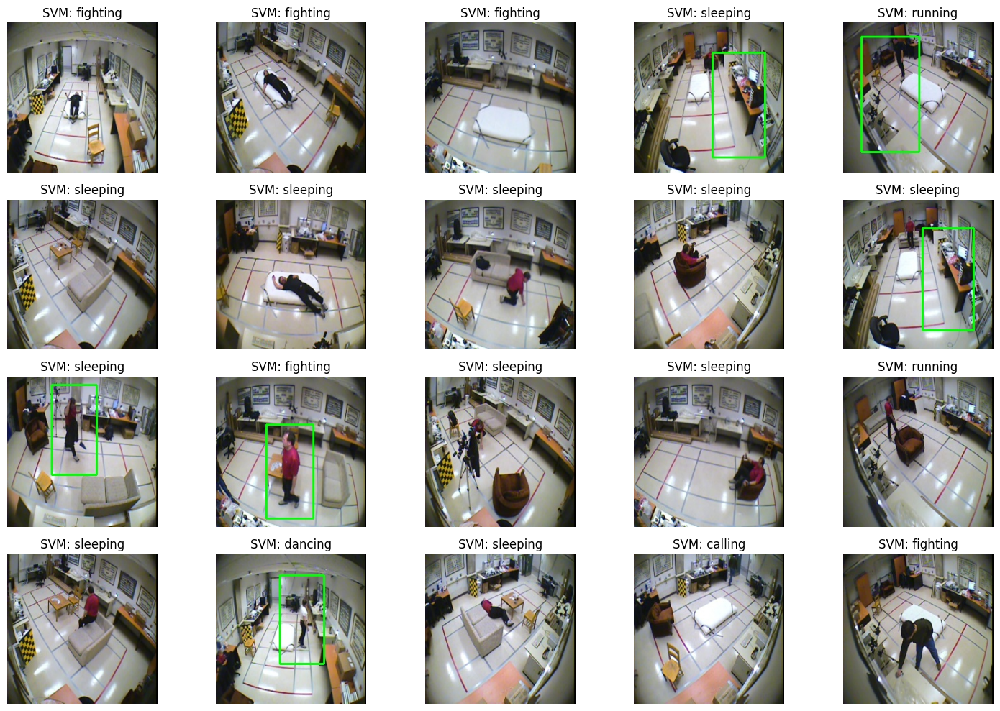

In [76]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import random

combined_df = pd.read_csv('/content/combined_predictions_crsvm.csv')

sample_df = combined_df.sample(20, random_state=42)

plt.figure(figsize=(15, 10))

for i, row in sample_df.iterrows():
    img_path = row['filename']
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(4, 5, (list(sample_df.index).index(i)) + 1)
    plt.imshow(img)
    plt.title(f"SVM: {row['svm_predicted_action']}")
    plt.axis('off')

plt.tight_layout()
sample_svm_v3s4 = '/content/sample_svm_v3s4.jpg'
plt.savefig(sample_svm_v3s4)
plt.show()


Total abnormal SVM predictions: 1980


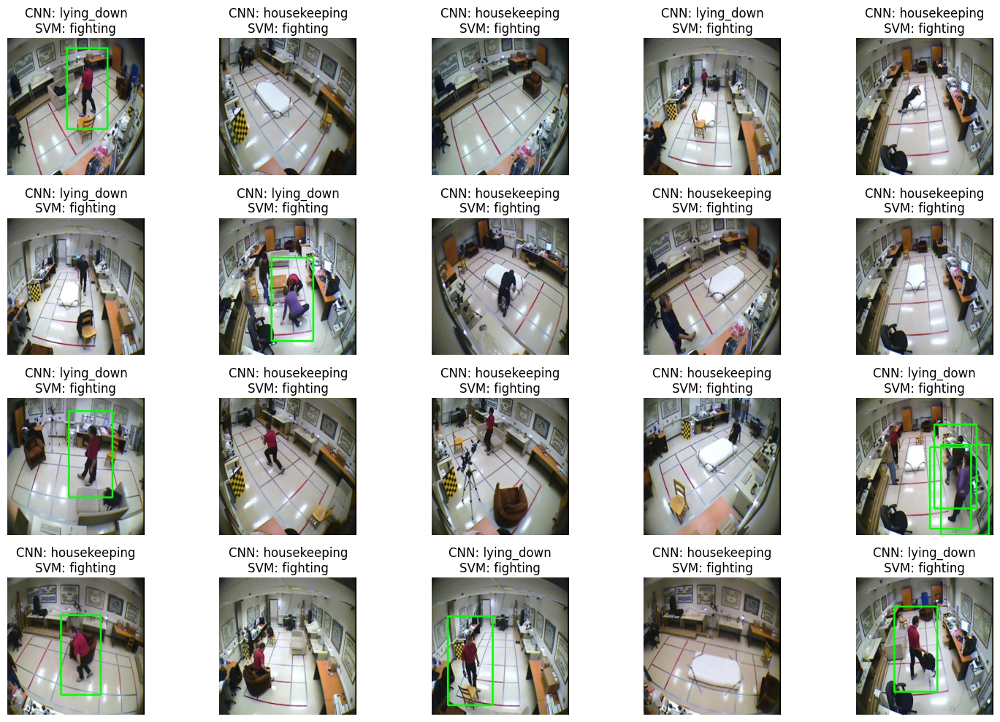

In [77]:
combined_df = pd.read_csv('/content/combined_predictions_crsvm.csv')
abnormal_actions = ['fallen', 'fighting', 'crouch_down']
abnormal_df = combined_df[combined_df['svm_predicted_action'].isin(abnormal_actions)]
print(f"Total abnormal SVM predictions: {len(abnormal_df)}")


sample_size = min(20, len(abnormal_df))
sample_df = abnormal_df.sample(sample_size, random_state=42)


plt.figure(figsize=(15, 10))

for i, row in sample_df.iterrows():
    img_path = row['filename']
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(4, 5, (list(sample_df.index).index(i)) + 1)
    plt.imshow(img)
    plt.title(f"CNN: {row['predicted_action']}\nSVM: {row['svm_predicted_action']}")
    plt.axis('off')

plt.tight_layout()
sample_cnnsvm_v3s4 = '/content/sample_cnnsvm_v3s4.jpg'
plt.savefig(sample_cnnsvm_v3s4)
plt.show()


In [84]:
# Results and samples Upload
upload_to_gcs('/content/predicted_results.csv', f'{RESULTS_FOLDERv3}/predicted_results.csv')
upload_to_gcs('/content/sequence_predictions.csv', f'{RESULTS_FOLDERv3}/sequence_predictions.csv')
upload_to_gcs('/content/sequence_predictions_fixed.csv', f'{RESULTS_FOLDERv3}/sequence_predictions_fixed.csv')
upload_to_gcs('/content/sequence_anomalies_flagged.csv', f'{RESULTS_FOLDERv3}/sequence_anomalies_flagged.csv')
upload_to_gcs('/content/svm_predictions_crsvm.csv', f'{RESULTS_FOLDERv3}/svm_predictions_crsvm.csv')
upload_to_gcs('/content/svm_predictions_crsvm_named.csv', f'{RESULTS_FOLDERv3}/svm_predictions_crsvm_named.csv')
upload_to_gcs('/content/combined_predictions_crsvm.csv', f'{RESULTS_FOLDERv3}/combined_predictions_crsvm.csv')
upload_to_gcs('/content/comparison_abnormal_detection_summary.csv', f'{RESULTS_FOLDERv3}/comparison_abnormal_detection_summary.csv')
upload_to_gcs('/content/sample_svm_v3s4.jpg', f'{RESULTS_FOLDERv3}/sample_svm_v3s4.jpg')
upload_to_gcs('/content/sample_cnnsvm_v3s4.jpg', f'{RESULTS_FOLDERv3}/sample_cnnsvm_v3s4.jpg')




Uploaded /content/predicted_results.csv to gs://p2-anomaly/resultsv3/predicted_results.csv
Uploaded /content/sequence_predictions.csv to gs://p2-anomaly/resultsv3/sequence_predictions.csv
Uploaded /content/sequence_predictions_fixed.csv to gs://p2-anomaly/resultsv3/sequence_predictions_fixed.csv
Uploaded /content/sequence_anomalies_flagged.csv to gs://p2-anomaly/resultsv3/sequence_anomalies_flagged.csv
Uploaded /content/svm_predictions_crsvm.csv to gs://p2-anomaly/resultsv3/svm_predictions_crsvm.csv
Uploaded /content/svm_predictions_crsvm_named.csv to gs://p2-anomaly/resultsv3/svm_predictions_crsvm_named.csv
Uploaded /content/combined_predictions_crsvm.csv to gs://p2-anomaly/resultsv3/combined_predictions_crsvm.csv
Uploaded /content/comparison_abnormal_detection_summary.csv to gs://p2-anomaly/resultsv3/comparison_abnormal_detection_summary.csv
Uploaded /content/sample_svm_v3s4.jpg to gs://p2-anomaly/resultsv3/sample_svm_v3s4.jpg
Uploaded /content/sample_cnnsvm_v3s4.jpg to gs://p2-anoma

## Inventory Check

**(A) Loaded, trained, saved, and uploaded to GCS**

Starting 'Fix Attempt Part' - the followings are complete and don't need to rerun except for the one in Colab and not uploaded in GCS.

### Saved Uploaded in GCS

| Item                            | Local Path                                                                                                                | GCS Path                                                      | Status     |
| :------------------------------ | :------------------------------------------------------------------------------------------------------------------------ | :------------------------------------------------------------ | :--------- |
| **CNN ResNet model (Stage1v2)** | `/content/cnn_resnet_action_classifierv2.keras`                                                                           | `resultsv3/models/cnn_resnet_action_classifierv2.keras`       | ✅ Uploaded |
| **CNN-LSTM model (v3s3)**       | `/content/cnn_resnet_action_classifier_v3s3_best.keras`                                                                   | `resultsv3/models/cnn_lstm_action_classifier_v3s3_best.keras` | ✅ Uploaded |
| **Train/Val Numpy Arrays**      | `/content/cnn-lstmv3s3_X_train.npy`, etc                                                                                  | `resultsv3/metadata/`                                         | ✅ Uploaded |
| **Label Encoder**               | `/content/cnn-lstmv3s3_label_encoder.joblib`                                                                              | `resultsv3/models/`                                           | ✅ Uploaded |
| **Plots**                       | Multiple (`.jpg` files)                                                                                                   | `resultsv3/plots/`                                            | ✅ Uploaded |
| **CNN per-frame predictions**   | `/content/predicted_results.csv`                                                                                          | Not uploaded — lives locally only                             |            |
| **Sequence predictions**        | `/content/sequence_predictions.csv`, `/content/sequence_predictions_fixed.csv`, `/content/sequence_anomalies_flagged.csv` | Not uploaded — lives locally only                             |            |
| **SVM predictions raw/named**   | `/content/svm_predictions_crsvm.csv`, `/content/svm_predictions_crsvm_named.csv`                                          | Not uploaded — lives locally only                             |            |
| **Combined predictions**        | `/content/combined_predictions_crsvm.csv`, `/content/combined_predictions_crsvm_named.csv`                                | Not uploaded — lives locally only                             |            |
| **Comparison summary table**    | `/content/comparison_abnormal_detection_summary.csv`                                                                      | Not uploaded — lives locally only                             |            |


**(B) To rerun after session reset**
Since Colab wipes local files when a session ends:

Check if...
* predicted_results.csv
* sequence_predictions.csv
* sequence_anomalies_flagged.csv
* sequence_predictions_fixed.csv
* svm_predictions_crsvm.csv
* svm_predictions_crsvm_named.csv
* combined_predictions_crsvm.csv
* combined_predictions_crsvm_named.csv
* comparison_abnormal_detection_summary.csv

are still on GCS bucket or downloaded before.

If gone,
a re-run is expected:

> **From Code Part 1/2:**
* Mount GCS bucket
* Load preprocessed images
* Load cnn_resnet_action_classifierv2.keras from GCS
* Load label_encoder.joblib from GCS
* Rerun CNN inference:
  * per-frame predictions → predicted_results.csv
  * sequence assembly → sequence_predictions_fixed.csv
  * anomaly flagging → sequence_anomalies_flagged.csv
  * anomaly distribution bar plot (and optionally upload it again)

> **From Code Part 2/2:**
If predicted_results.csv gone →
* rerun sequence construction
* Reload your SVM model and PCA from GCS
* Re-run VGG19 feature extraction
* Run PCA transform and SVM predictions
* Generate and save:
  * svm_predictions_crsvm.csv
  * svm_predictions_crsvm_named.csv
  * combined_predictions_crsvm.csv
  * combined_predictions_crsvm_named.csv
  * plots and analysis tables like comparison_abnormal_detection_summary.csv

Upload plots if needed again.

### **(C) No need to retrain CNN / CNN-LSTM**
The followings have been saved:
* cnn_resnet_action_classifierv2.keras
* cnn_resnet_action_classifier_v3s3_best.keras
and relevant numpy arrays and encoders

as long as those still exist in GCS, can reload them for inference or LSTM sequence training.

### (D) **Summary: Clean recovery sequence**
1. Mount GCS and confirm existing files via !gsutil ls gs://p2-anomaly/resultsv3/** and other folders.

2. Download models & label encoder, images and outputs from 'Fix Attempt' session before the 'Post-mortem' block

3. Re-run from CNN per frame inference -> SVM inference - Abnormal tagging

4. Upload all outputs previously not uploaded into {RESULTS_FOLDERv3}

5. Continue to LSTM sequence classification stage.

## LSTM

LSTM will use these files...

| File Name                        | Columns                                                     | Contains Abnormality Flag? | Purpose                                                              |
| :------------------------------- | :---------------------------------------------------------- | :------------------------- | :------------------------------------------------------------------- |
| `sequence_anomalies_flagged.csv` | start\_frame, end\_frame, predicted\_actions + anomaly\_flag                                        | **Yes**                    | CNN sequence predictions + flagged anomaly based on abnormal actions |


Data Usage in this project:

| Model                        | Input Type                                            | Role                                                  | Usage in Final Product                                                                                |
| :--------------------------- | :---------------------------------------------------- | :---------------------------------------------------- | :---------------------------------------------------------------------------------------------------- |
| **CNN ResNet (frame-based)** | Preprocessed frames                                   | Classifies actions per frame                          | **Primary feature generator for LSTM sequences** and real-time abnormal action trigger                |
| **SVM (frame-based)**        | Preprocessed frames                                   | Second opinion classifier, trained on another dataset | **Validation and cross-verification layer** — can flag inconsistencies or provide confidence measures. |
| **LSTM (sequence-based)**    | CNN ResNet predicted actions (per sequence of frames) | Detects anomalies based on **temporal patterns**      | **Final anomaly detection decision engine**                                                           |

Note:
1. However in this case, the **SVM classifier** does not work well with the frames extracted images. Therefore usage of secondary activity tagging is ignored/omitted
2. Expected final product:
   * Frame-by-frame predictions (CNN/SVM)
   * Sequence-level anomaly predictions (LSTM)
   * Visualise in dashboard: per-frame, per-sequence, and anomaly heatmaps

Planned final table output:

| Video Name  | Scene ID | Frame No | Timestamp | CNN Predicted Action | SVM Predicted Action | CNN Anomaly Flag | SVM Anomaly Flag | Sequence ID | Sequence Anomaly Flag | Number of People (if available) | Notes |
| :---------- | :------- | :------- | :-------- | :------------------- | :------------------- | :--------------- | :--------------- | :---------- | :-------------------- | :------------------------------ | :---- |
| chute01.mp4 | Scene01  | 30       | 00:00:01  | housekeeping         | sleeping             | 0                | 0                | Seq1        | 0                     | 1 (if detected)                 |       |



In [85]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

# Load sequence anomaly file
df_seq = pd.read_csv('/content/sequence_anomalies_flagged.csv')

# Extract unique actions
actions = set()
df_seq['predicted_actions'] = df_seq['predicted_actions'].apply(eval)
for act_list in df_seq['predicted_actions']:
    actions.update(act_list)
actions = sorted(list(actions))
print("Actions:", actions)

# Encode actions
label_encoder = LabelEncoder()
label_encoder.fit(actions)
num_classes = len(actions)

# Convert sequences into integer-encoded 2D arrays
X = []
for act_list in df_seq['predicted_actions']:
    encoded = label_encoder.transform(act_list)
    X.append(encoded)

X = np.array(X)  # shape: (num_sequences, 5)

# One-hot encode
X = to_categorical(X, num_classes=num_classes)  # shape: (num_sequences, 5, num_classes)

# Targets
y = df_seq['anomaly_flag'].values


Actions: ['fallen', 'housekeeping', 'lying_down']


In [86]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

print(f"Train: {X_train.shape}, Val: {X_val.shape}, Test: {X_test.shape}")


Train: (5618, 5, 3), Val: (1204, 5, 3), Test: (1205, 5, 3)


In [87]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Build model
model = Sequential()
model.add(LSTM(64, input_shape=(5, num_classes), return_sequences=False))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Summary
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 64)             │        17,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,521 (76.25 KB)

 Trainable params: 19,521 (76.25 KB)

 Non-trainable params: 0 (0.00 B)

In [88]:
history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),
                    epochs=30,
                    batch_size=32,
                    verbose=1)


Epoch 1/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9712 - loss: 0.2568 - val_accuracy: 0.9817 - val_loss: 0.0459
Epoch 2/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9857 - loss: 0.0438 - val_accuracy: 0.9975 - val_loss: 0.0065
Epoch 3/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9968 - loss: 0.0115 - val_accuracy: 1.0000 - val_loss: 0.0016
Epoch 4/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9995 - loss: 0.0017 - val_accuracy: 1.0000 - val_loss: 1.4954e-04
Epoch 5/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 1.0000 - loss: 5.3337e-04 - val_accuracy: 1.0000 - val_loss: 7.8113e-05
Epoch 6/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 1.0000 - loss: 4.2919e-04 - val_accuracy: 1.0000 - val_loss: 3.6896e-05
Epoch 7/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 1.0000 - loss: 1.0911e-04 - val_accuracy: 1.0000 - val_loss: 2.5140e-05
Epoch 8/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 1.0000 - los

In [89]:
loss, acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# Predict + Confusion Matrix
from sklearn.metrics import confusion_matrix, classification_report

y_pred = (model.predict(X_test) > 0.5).astype(int)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - loss: 2.6839e-07
Test Accuracy: 1.0000
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
[[1171    0]
 [   0   34]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1171
           1       1.00      1.00      1.00        34

    accuracy                           1.00      1205
   macro avg       1.00      1.00      1.00      1205
weighted avg       1.00      1.00      1.00      1205



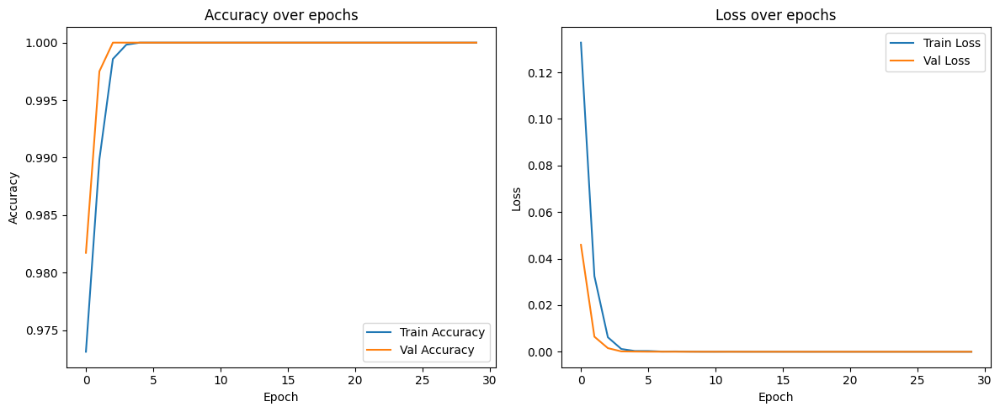

In [90]:
plt.figure(figsize=(12,5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
acc_plot_path = '/content/cnn-lstm-v3s4-accuracy-over-epoch.jpg'
plt.savefig(acc_plot_path)
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
loss_plot_path = '/content/cnn-lstm-v3s4-loss-over-epoch.jpg'
plt.savefig(loss_plot_path)
plt.legend()

plt.tight_layout()
plt.show()

In [93]:
model.save('/content/lstm_sequence_anomaly.h5')
model.save('/content/lstm_sequence_anomaly.keras')
joblib.dump(label_encoder, '/content/lstm_label_encoder.joblib')


['/content/lstm_label_encoder.joblib']

In [94]:
# Results and samples Upload
upload_to_gcs('/content/cnn-lstm-v3s4-loss-over-epoch.jpg', f'{RESULTS_FOLDERv3}/cnn-lstm-v3s4-loss-over-epoch.jpg')
upload_to_gcs('/content/cnn-lstm-v3s4-accuracy-over-epoch.jpg', f'{RESULTS_FOLDERv3}/plots/cnn-lstm-v3s4-accuracy-over-epoch.jpg')
upload_to_gcs('/content/lstm_sequence_anomaly.h5', f'{RESULTS_FOLDERv3}/models/lstm_sequence_anomaly.h5')
upload_to_gcs('/content/lstm_sequence_anomaly.keras', f'{RESULTS_FOLDERv3}/models/lstm_sequence_anomaly.keras')
upload_to_gcs('/content/lstm_label_encoder.joblib', f'{RESULTS_FOLDERv3}/lstm_label_encoder.joblib')
# BUCKET_NAME = 'p2-anomaly'
# RESULTS_FOLDERv3 = 'resultsv3'
# MODEL_FOLDER = f'{RESULTS_FOLDERv3}/models'
# PLOTS_FOLDER = f'{RESULTS_FOLDERv3}/plots'
# METADATA = f'{RESULTS_FOLDERv3}/metadata'




Uploaded /content/cnn-lstm-v3s4-loss-over-epoch.jpg to gs://p2-anomaly/resultsv3/cnn-lstm-v3s4-loss-over-epoch.jpg
Uploaded /content/cnn-lstm-v3s4-accuracy-over-epoch.jpg to gs://p2-anomaly/resultsv3/plots/cnn-lstm-v3s4-accuracy-over-epoch.jpg
Uploaded /content/lstm_sequence_anomaly.h5 to gs://p2-anomaly/resultsv3/models/lstm_sequence_anomaly.h5
Uploaded /content/lstm_sequence_anomaly.keras to gs://p2-anomaly/resultsv3/models/lstm_sequence_anomaly.keras
Uploaded /content/lstm_label_encoder.joblib to gs://p2-anomaly/resultsv3/lstm_label_encoder.joblib


1. Accuracy 1.0 on both train and validation,
   * Extremely easy, cleanly separable sequences (since abnormal vs normal sequences. Too distinct when mapped into 5-action windows)
   * Overfitting

In [96]:
# Load existing sequence anomaly predictions from CNN
cnn_seq_df = pd.read_csv('/content/sequence_anomalies_flagged.csv')

# Predict on LSTM
X_all_seq = []
for act_list in cnn_seq_df['predicted_actions'].apply(eval):
    encoded = label_encoder.transform(act_list)
    X_all_seq.append(encoded)
X_all_seq = np.array(X_all_seq)
X_all_seq = to_categorical(X_all_seq, num_classes=num_classes)

lstm_anomaly_preds = (model.predict(X_all_seq) > 0.5).astype(int).flatten()

cnn_seq_df['lstm_anomaly_flag'] = lstm_anomaly_preds

cnn_seq_df.to_csv('/content/combined_seq_predictions_cnn_lstm.csv', index=False)
upload_to_gcs('/content/combined_seq_predictions_cnn_lstm.csv', f'{RESULTS_FOLDERv3}/combined_seq_predictions_cnn_lstm.csv')

cnn_seq_df.head()


251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Uploaded /content/combined_seq_predictions_cnn_lstm.csv to gs://p2-anomaly/resultsv3/combined_seq_predictions_cnn_lstm.csv


,chute,camera,start_frame,end_frame,predicted_actions,anomaly_flag,lstm_anomaly_flag
0,chute01,cam1,0,120,"['housekeeping', 'housekeeping', 'housekeeping...",0,0
1,chute01,cam1,30,150,"['housekeeping', 'housekeeping', 'housekeeping...",0,0
2,chute01,cam1,60,180,"['housekeeping', 'housekeeping', 'housekeeping...",0,0
3,chute01,cam1,90,210,"['housekeeping', 'housekeeping', 'housekeeping...",0,0
4,chute01,cam1,120,240,"['housekeeping', 'housekeeping', 'housekeeping...",0,0


In [97]:
upload_to_gcs('/content/combined_seq_predictions_cnn_lstm.csv', f'{RESULTS_FOLDERv3}/combined_seq_predictions_cnn_lstm.csv')

Uploaded /content/combined_seq_predictions_cnn_lstm.csv to gs://p2-anomaly/resultsv3/combined_seq_predictions_cnn_lstm.csv


Uploaded /content/abnormal_seq_comparison_cnn_lstm.jpg to gs://p2-anomaly/resultsv3/abnormal_seq_comparison_cnn_lstm.jpg


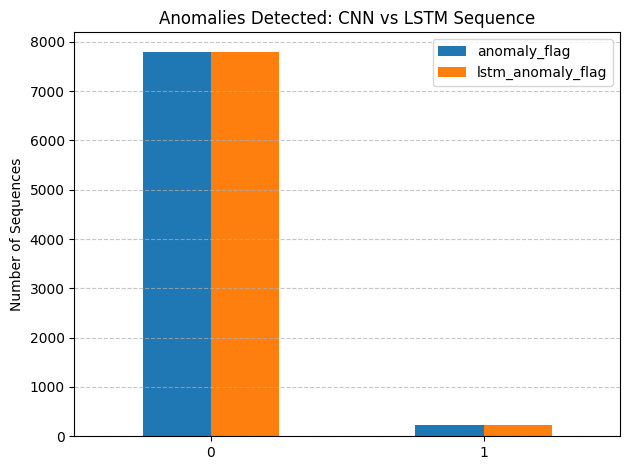

In [98]:
import matplotlib.pyplot as plt

# Count occurrences
detection_counts = cnn_seq_df[['anomaly_flag', 'lstm_anomaly_flag']].apply(pd.Series.value_counts)

# Bar chart
detection_counts.plot(kind='bar')
plt.title('Anomalies Detected: CNN vs LSTM Sequence')
plt.ylabel('Number of Sequences')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('/content/abnormal_seq_comparison_cnn_lstm.jpg')
upload_to_gcs('/content/abnormal_seq_comparison_cnn_lstm.jpg', f'{RESULTS_FOLDERv3}/abnormal_seq_comparison_cnn_lstm.jpg')
plt.show()


In [103]:
from tqdm import tqdm
import pandas as pd

# Load frame-level predictions
frame_df = pd.read_csv('/content/combined_predictions_crsvm.csv')

# Load sequence-level anomalies
seq_df = pd.read_csv('/content/sequence_anomalies_flagged.csv')

# Ensure frame number extracted once for speed
frame_df['frame_num'] = frame_df['filename'].str.extract(r'_frame(\d+)_')[0].astype(int)

abnormal_counts = []

# Iterate over sequences with tqdm
for _, seq_row in tqdm(seq_df.iterrows(), total=len(seq_df), desc='Processing Sequences'):
    scene = seq_row['chute']
    cam = seq_row['camera']
    start_f = seq_row['start_frame']
    end_f = seq_row['end_frame']

    # Filter matching frames
    matching_frames = frame_df[
        (frame_df['filename'].str.contains(scene)) &
        (frame_df['filename'].str.contains(cam)) &
        (frame_df['frame_num'].between(start_f, end_f))
    ]

    # Count abnormal frames
    abnormal_count = matching_frames['anomaly_flag'].sum()
    abnormal_counts.append(abnormal_count)

seq_df['frame_abnormal_count'] = abnormal_counts
seq_df['frame_anomaly_flag'] = (seq_df['frame_abnormal_count'] > 0).astype(int)

seq_df.to_csv('/content/sequence_combined_anomaly_summary.csv', index=False)
upload_to_gcs('/content/sequence_combined_anomaly_summary.csv', f'{RESULTS_FOLDERv3}/sequence_combined_anomaly_summary.csv')

print("Done. Sample preview:")
seq_df.head()


Processing Sequences: 100%|██████████| 8027/8027 [00:56<00:00, 142.21it/s]


Uploaded /content/sequence_combined_anomaly_summary.csv to gs://p2-anomaly/resultsv3/sequence_combined_anomaly_summary.csv
Done. Sample preview:


,chute,camera,start_frame,end_frame,predicted_actions,anomaly_flag,frame_abnormal_count,frame_anomaly_flag
0,chute01,cam1,0,120,"['housekeeping', 'housekeeping', 'housekeeping...",0,5,1
1,chute01,cam1,30,150,"['housekeeping', 'housekeeping', 'housekeeping...",0,5,1
2,chute01,cam1,60,180,"['housekeeping', 'housekeeping', 'housekeeping...",0,5,1
3,chute01,cam1,90,210,"['housekeeping', 'housekeeping', 'housekeeping...",0,5,1
4,chute01,cam1,120,240,"['housekeeping', 'housekeeping', 'housekeeping...",0,5,1


# People Detection for Alert

In [104]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 127.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 104.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [105]:
from ultralytics import YOLO
import os
import pandas as pd
from tqdm import tqdm

model = YOLO('yolov8n.pt')

image_folder = '/content/preprocessed-mcfd'

image_paths = []
for root, dirs, files in os.walk(image_folder):
    for file in files:
        if file.endswith('.jpg'):
            image_paths.append(os.path.join(root, file))

print(f"Total images found: {len(image_paths)}")

results = []


for path in tqdm(image_paths, desc="Detecting People"):
    detections = model(path)

    people_count = sum([1 for det in detections[0].boxes.cls if int(det) == 0])


    filename = os.path.basename(path)
    chute = os.path.basename(os.path.dirname(path))
    camera = filename.split('_')[0]
    frame_no = int(filename.split('frame')[1].split('_')[0])


    results.append({
        'filename': path,
        'chute': chute,
        'camera': camera,
        'frame_no': frame_no,
        'people_count': people_count
    })


df_people = pd.DataFrame(results)
people_count_csv = '/content/frame_people_count.csv'
df_people.to_csv(people_count_csv, index=False)
upload_to_gcs('/content/frame_people_count.csv', f'{RESULTS_FOLDERv3}/frame_people_count.csv')
print(f"People counts saved to {people_count_csv}")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 281MB/s]


Total images found: 8795


Detecting People:   0%|          | 0/8795 [00:00<?, ?it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame870_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 10.7ms preprocess, 9.1ms inference, 241.0ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:   0%|          | 1/8795 [00:06<15:26:23,  6.32s/it]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame780_preprocessed.jpg: 640x640 1 person, 1 bench, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 253.5ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:   0%|          | 2/8795 [00:06<6:51:18,  2.81s/it] 


image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame0_preprocessed.jpg: 640x640 2 persons, 2 chairs, 8.9ms
Speed: 3.5ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame510_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame480_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame300_preprocessed.jpg: 640x640 1 couch, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image

Detecting People:   0%|          | 8/8795 [00:06<1:10:08,  2.09it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame240_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame540_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame270_preprocessed.jpg: 640x640 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame930_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640

Detecting People:   0%|          | 15/8795 [00:06<30:39,  4.77it/s] 


image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame120_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame360_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame180_preprocessed.jpg: 640x640 1 bottle, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame120_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:   0%|          | 22/8795 [00:06<17:47,  8.22it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame660_preprocessed.jpg: 640x640 2 suitcases, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame630_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame570_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 132.4ms
Speed: 2.3ms preprocess, 132.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame90_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame450_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 chairs, 8.9ms
Speed: 2.4ms preprocess, 8.9ms 

Detecting People:   0%|          | 27/8795 [00:07<14:05, 10.37it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame90_preprocessed.jpg: 640x640 1 chair, 2 dining tables, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame540_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.7ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame930_preprocessed.jpg: 640x640 1 dining table, 2 vases, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame420_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame960_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at sh

Detecting People:   0%|          | 34/8795 [00:07<09:31, 15.34it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame690_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame1050_preprocessed.jpg: 640x640 2 persons, 1 couch, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame120_preprocessed.jpg: 640x640 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame540_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame1050_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at s

Detecting People:   0%|          | 41/8795 [00:07<06:56, 21.01it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame210_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame690_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame150_preprocessed.jpg: 640x640 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 0.7ms postprocess 

Detecting People:   1%|          | 47/8795 [00:07<06:27, 22.59it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame930_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame120_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame60_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame690_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame1020_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per 

Detecting People:   1%|          | 54/8795 [00:07<05:03, 28.83it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame660_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame990_preprocessed.jpg: 640x640 3 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame630_preprocessed.jpg: 640x640 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame1080_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:   1%|          | 61/8795 [00:07<04:08, 35.08it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame90_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame360_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame30_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at sh

Detecting People:   1%|          | 68/8795 [00:07<03:32, 41.04it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame90_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame300_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame1050_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame810_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postproces

Detecting People:   1%|          | 75/8795 [00:08<03:08, 46.16it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame330_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame870_preprocessed.jpg: 640x640 3 suitcases, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame930_preprocessed.jpg: 640x640 2 suitcases, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame180_preprocessed.jpg: 640x640 1 potted plant, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:   1%|          | 82/8795 [00:08<02:54, 49.89it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame960_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame330_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame210_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame0_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 64

Detecting People:   1%|          | 89/8795 [00:08<02:43, 53.27it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame870_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame600_preprocessed.jpg: 640x640 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame900_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame90_preprocessed.jpg: 640x640 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame930_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640,

Detecting People:   1%|          | 96/8795 [00:08<02:35, 55.91it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame750_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame720_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame660_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame240_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame1080_preprocessed.jpg: 640x640 5 persons, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:   1%|          | 103/8795 [00:08<02:29, 58.26it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame150_preprocessed.jpg: 640x640 2 chairs, 1 clock, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame420_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame120_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame870_preprocessed.jpg: 640x640 1 person, 1 bench, 2 chairs, 1 clock, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms

Detecting People:   1%|▏         | 110/8795 [00:08<02:25, 59.86it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame1080_preprocessed.jpg: 640x640 4 persons, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame630_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame690_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.

Detecting People:   1%|▏         | 117/8795 [00:08<02:23, 60.43it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame780_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame480_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame900_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame750_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shap

Detecting People:   1%|▏         | 124/8795 [00:08<02:20, 61.51it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame780_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame150_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame360_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame60_preprocessed.jpg: 640x640 2 chairs, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame360_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:   1%|▏         | 131/8795 [00:08<02:20, 61.76it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame60_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame810_preprocessed.jpg: 640x640 1 cat, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame990_preprocessed.jpg: 640x640 3 chairs, 1 potted plant, 1 dining table, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame0_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame270_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms

Detecting People:   2%|▏         | 138/8795 [00:09<02:21, 61.16it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame210_preprocessed.jpg: 640x640 2 chairs, 75.5ms
Speed: 50.5ms preprocess, 75.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame390_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame330_preprocessed.jpg: 640x640 3 persons, 2 chairs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame840_preprocessed.jpg: 640x640 1 chair, 1 refrigerator, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms post

Detecting People:   2%|▏         | 145/8795 [00:09<03:08, 45.79it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame660_preprocessed.jpg: 640x640 1 suitcase, 2 chairs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame750_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame750_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame300_preprocessed.jpg: 640x640 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame660_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:   2%|▏         | 152/8795 [00:09<02:52, 50.00it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame30_preprocessed.jpg: 640x640 1 couch, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame630_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame840_preprocessed.jpg: 640x640 1 person, 1 bench, 2 suitcases, 2 chairs, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame870_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame240_preprocessed.jpg: 640x640 2 chairs, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at sha

Detecting People:   2%|▏         | 159/8795 [00:09<02:42, 53.04it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame720_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame630_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame240_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 1 refrigerator, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inferenc

Detecting People:   2%|▏         | 166/8795 [00:09<02:34, 55.83it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame570_preprocessed.jpg: 640x640 1 person, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame810_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame990_preprocessed.jpg: 640x640 1 bench, 1 bird, 2 chairs, 1 dining table, 7.9ms
Speed: 2.3ms preprocess

Detecting People:   2%|▏         | 173/8795 [00:09<02:29, 57.49it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame930_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame480_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame570_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.5ms
Speed: 2.7ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shap

Detecting People:   2%|▏         | 180/8795 [00:09<02:23, 59.89it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame540_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame90_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame600_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame600_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame420_preprocessed.jpg: 640x640 1 person, 2 chairs, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at sh

Detecting People:   2%|▏         | 187/8795 [00:09<02:20, 61.15it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame540_preprocessed.jpg: 640x640 1 suitcase, 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame720_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame840_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 133.8ms
Speed: 2.3ms preprocess, 133.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame240_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 0.7ms postprocess p

Detecting People:   2%|▏         | 194/8795 [00:10<03:05, 46.40it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame900_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 1 tv, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame570_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame780_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame150_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame270_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1

Detecting People:   2%|▏         | 200/8795 [00:10<02:54, 49.26it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame30_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame1020_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame600_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame870_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.5ms
Speed: 2.7ms preprocess, 7.5ms inference, 1.4ms postprocess per image at

Detecting People:   2%|▏         | 207/8795 [00:10<02:43, 52.49it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame780_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame60_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame690_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame810_preprocessed.jpg: 640x640 1 couch, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.4ms

Detecting People:   2%|▏         | 213/8795 [00:10<03:27, 41.32it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame720_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame810_preprocessed.jpg: 640x640 1 person, 1 suitcase, 10.2ms
Speed: 3.5ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame750_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame630_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame960_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:   2%|▏         | 219/8795 [00:10<03:11, 44.86it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame1050_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.8ms
Speed: 2.8ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame510_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame990_preprocessed.jpg: 640x640 1 person, 1 bench, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame840_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame150_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.8ms postprocess per image at sha

Detecting People:   3%|▎         | 226/8795 [00:10<02:52, 49.59it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame330_preprocessed.jpg: 640x640 2 chairs, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame900_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame660_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame120_preprocessed.jpg: 640x640 2 chairs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame960_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:   3%|▎         | 233/8795 [00:10<02:41, 53.00it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame30_preprocessed.jpg: 640x640 1 couch, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame750_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame990_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame600_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame510_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.6ms postprocess per 

Detecting People:   3%|▎         | 240/8795 [00:11<02:31, 56.47it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame660_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame60_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per imag

Detecting People:   3%|▎         | 247/8795 [00:11<02:27, 58.03it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame1080_preprocessed.jpg: 640x640 3 persons, 2 benchs, 1 couch, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame0_preprocessed.jpg: 640x640 2 chairs, 1 tv, 1 refrigerator, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame900_preprocessed.jpg: 640x640 1 dining table, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame90_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame210_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess pe

Detecting People:   3%|▎         | 254/8795 [00:11<02:24, 58.91it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame330_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame720_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame990_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam8_frame300_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame570_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:   3%|▎         | 261/8795 [00:11<02:23, 59.66it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame780_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame300_preprocessed.jpg: 640x640 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam6_frame570_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame1050_preprocessed.jpg: 640x640 2 persons, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame570_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)



Detecting People:   3%|▎         | 268/8795 [00:11<02:20, 60.62it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame210_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 1 refrigerator, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame510_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame990_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame60_preprocessed.jpg: 640x640 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per i

Detecting People:   3%|▎         | 275/8795 [00:11<02:20, 60.51it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame990_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 chair, 1 tv, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame870_preprocessed.jpg: 640x640 1 chair, 1 refrigerator, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame810_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 skateboa

Detecting People:   3%|▎         | 282/8795 [00:11<02:20, 60.39it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame1020_preprocessed.jpg: 640x640 2 persons, 1 horse, 1 elephant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame330_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 7.9ms
Speed: 2.4ms preprocess, 

Detecting People:   3%|▎         | 289/8795 [00:11<02:19, 60.97it/s]


image 1/1 /content/preprocessed-mcfd/chute15/cam1_frame900_preprocessed.jpg: 640x640 1 person, 1 couch, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam3_frame390_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam7_frame930_preprocessed.jpg: 640x640 1 person, 1 bench, 1 skateboard, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam4_frame720_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute15/cam5_frame120_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.

Detecting People:   3%|▎         | 296/8795 [00:12<02:19, 61.10it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame870_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame0_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame510_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame480_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:   3%|▎         | 303/8795 [00:12<03:00, 47.02it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame570_preprocessed.jpg: 640x640 2 persons, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame240_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1200_preprocessed.jpg: 640x640 1 bed, 1 dining table, 7.8ms
Speed: 3.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1230_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape 

Detecting People:   4%|▎         | 309/8795 [00:12<02:50, 49.77it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame270_preprocessed.jpg: 640x640 1 umbrella, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame930_preprocessed.jpg: 640x640 1 clock, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame900_preprocessed.jpg: 640x640 1 backpack, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame120_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 3.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at s

Detecting People:   4%|▎         | 316/8795 [00:12<02:41, 52.61it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame180_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame750_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame120_preprocessed.jpg: 640x640 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame840_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1050_preprocessed.jpg: 640x640 1 suitcase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per imag

Detecting People:   4%|▎         | 323/8795 [00:12<02:34, 54.79it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame570_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame90_preprocessed.jpg: 640x640 1 person, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1140_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame450_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame1320_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.8ms
Speed: 2.8ms preprocess, 7.8ms inference, 1.6ms postprocess per image at

Detecting People:   4%|▎         | 329/8795 [00:12<02:30, 56.09it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame540_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame930_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 sink, 8.0ms
Speed: 3.7ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame960_preprocessed.jpg: 640x640 1 person, 1 cat, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1110_preprocessed.jpg: 640x640 1 suitcase, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:   4%|▍         | 335/8795 [00:12<02:29, 56.69it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame960_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame690_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame1050_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame120_preprocessed.jpg: 640x640 1 bed, 1 tv, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame540_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 64

Detecting People:   4%|▍         | 342/8795 [00:12<02:23, 58.85it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame270_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame30_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame60_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame210_preprocessed.jpg: 640x640 1 tv, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame690_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:   4%|▍         | 349/8795 [00:13<02:20, 59.95it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame210_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame930_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame120_preprocessed.jpg: 640x640 2 chairs, 86.8ms
Speed: 51.5ms preprocess, 86.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame60_preprocessed.jpg: 640x640 1 cat, 1 dog, 1 couch, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame690_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess

Detecting People:   4%|▍         | 356/8795 [00:13<03:09, 44.61it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame750_preprocessed.jpg: 640x640 1 suitcase, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame660_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame990_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1230_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at 

Detecting People:   4%|▍         | 363/8795 [00:13<02:50, 49.56it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1320_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame0_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame720_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame510_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame420_preprocessed.jpg: 640x640 1 bed, 8.1ms
Speed: 3.5ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /co

Detecting People:   4%|▍         | 370/8795 [00:13<02:40, 52.57it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1170_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame360_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame30_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame600_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.6ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame0_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess 

Detecting People:   4%|▍         | 376/8795 [00:13<03:23, 41.42it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame300_preprocessed.jpg: 640x640 1 handbag, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame480_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1200_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1260_preprocessed.jpg: 640x640 3 persons, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1050_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 bed, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms po

Detecting People:   4%|▍         | 383/8795 [00:13<03:02, 46.19it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame330_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame330_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame870_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 3.6ms preprocess, 7.8ms inference, 1.4ms postprocess per image at

Detecting People:   4%|▍         | 390/8795 [00:13<02:46, 50.62it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1350_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 3.7ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1020_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame30_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1320_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 3.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 64

Detecting People:   5%|▍         | 397/8795 [00:14<02:34, 54.29it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1290_preprocessed.jpg: 640x640 2 persons, 1 skateboard, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame330_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame210_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame0_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame150_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 3.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:   5%|▍         | 404/8795 [00:14<02:27, 56.96it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame600_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.9ms
Speed: 3.6ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame900_preprocessed.jpg: 640x640 2 suitcases, 9.4ms
Speed: 2.6ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame930_preprocessed.jpg: 640x640 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1110_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 0.7ms postprocess pe

Detecting People:   5%|▍         | 411/8795 [00:14<02:23, 58.62it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame750_preprocessed.jpg: 640x640 1 person, 1 bicycle, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame720_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame1110_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame660_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame240_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess pe

Detecting People:   5%|▍         | 418/8795 [00:14<02:20, 59.55it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame420_preprocessed.jpg: 640x640 1 dining table, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame120_preprocessed.jpg: 640x640 1 person, 1 sink, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image 

Detecting People:   5%|▍         | 425/8795 [00:14<02:19, 60.17it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame960_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1080_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame630_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame690_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:   5%|▍         | 432/8795 [00:14<02:15, 61.72it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame450_preprocessed.jpg: 640x640 1 person, 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame240_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 3.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame780_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1140_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame480_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:   5%|▍         | 439/8795 [00:14<02:16, 61.28it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame450_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame960_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame780_preprocessed.jpg: 640x640 1 person, 1 bicycle, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1350_preprocessed.jpg: 640x640 4 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame150_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:   5%|▌         | 446/8795 [00:14<02:13, 62.53it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1020_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1290_preprocessed.jpg: 640x640 3 persons, 1 handbag, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1080_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame60_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:   5%|▌         | 453/8795 [00:14<02:12, 63.03it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame990_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame0_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame270_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame690_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 3.0ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1,

Detecting People:   5%|▌         | 460/8795 [00:15<02:11, 63.18it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame600_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame330_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1320_preprocessed.jpg: 640x640 2 persons, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame840_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame510_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640,

Detecting People:   5%|▌         | 467/8795 [00:15<02:56, 47.25it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame660_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame750_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame750_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.7ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame300_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame660_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.5ms
Speed: 3.5ms preprocess, 8.5ms inference, 1.4ms postproc

Detecting People:   5%|▌         | 474/8795 [00:15<02:43, 51.01it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame30_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame630_preprocessed.jpg: 640x640 1 person, 1 sink, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1140_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame840_preprocessed.jpg: 640x640 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1200_preprocessed.jpg: 640x640 1 bird, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 2.2ms postprocess per image at

Detecting People:   5%|▌         | 481/8795 [00:15<02:34, 53.73it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1110_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1140_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame390_preprocessed.jpg: 640x640 2 persons, 1 bed, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame1260_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postproces

Detecting People:   6%|▌         | 488/8795 [00:15<02:26, 56.72it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 3.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1020_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame630_preprocessed.jpg: 640x640 1 person, 1 bed, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.4ms postprocess per imag

Detecting People:   6%|▌         | 494/8795 [00:15<02:25, 57.06it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame690_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1290_preprocessed.jpg: 640x640 2 persons, 1 handbag, 1 potted plant, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1350_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame300_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame870_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at s

Detecting People:   6%|▌         | 501/8795 [00:15<02:19, 59.25it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame990_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame660_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 3.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame390_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame930_preprocessed.jpg: 640x640 1 bench, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/

Detecting People:   6%|▌         | 508/8795 [00:15<02:16, 60.53it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame1140_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame690_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame0_preprocessed.jpg: 640x640 1 bed, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame930_preprocessed.jpg: 640x640 1 bicycle, 2 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1110_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1

Detecting People:   6%|▌         | 515/8795 [00:16<02:16, 60.63it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame600_preprocessed.jpg: 640x640 1 bed, 1 dining table, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame600_preprocessed.jpg: 640x640 1 person, 1 tv, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1080_preprocessed.jpg: 640x640 1 suitcase, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame420_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame630_preprocessed.jpg: 640x640 1 couch, 1 tv, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at

Detecting People:   6%|▌         | 522/8795 [00:16<03:02, 45.38it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame720_preprocessed.jpg: 640x640 1 person, 1 horse, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame840_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1170_preprocessed.jpg: 640x640 1 dining table, 8.5ms
Speed: 3.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame960_preprocessed.jpg: 640x640 1 suitcase, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame240_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per im

Detecting People:   6%|▌         | 529/8795 [00:16<02:45, 49.88it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1290_preprocessed.jpg: 640x640 3 persons, 9.2ms
Speed: 2.6ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame1170_preprocessed.jpg: 640x640 5 persons, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame900_preprocessed.jpg: 640x640 1 tv, 1 refrigerator, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1260_preprocessed.jpg: 640x640 1 person, 1 dining table, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame570_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 0.7ms postprocess per im

Detecting People:   6%|▌         | 536/8795 [00:16<02:35, 53.00it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame270_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame390_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame30_preprocessed.jpg: 640x640 1 bird, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1020_preprocessed.jpg: 640x640 1 potted plant, 1 bed, 1 dining table, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 bed, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postproces

Detecting People:   6%|▌         | 542/8795 [00:16<03:16, 41.94it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame870_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame540_preprocessed.jpg: 640x640 1 person, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame780_preprocessed.jpg: 640x640 2 suitcases, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame780_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postproces

Detecting People:   6%|▌         | 549/8795 [00:16<02:57, 46.34it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame810_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame1110_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame300_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame720_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame810_preprocessed.jpg: 640x640 1 person, 3 suitcases, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape 

Detecting People:   6%|▋         | 556/8795 [00:16<02:42, 50.57it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame960_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame210_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1050_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame1170_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame510_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 3.5ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:   6%|▋         | 563/8795 [00:17<02:31, 54.35it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame150_preprocessed.jpg: 640x640 1 sink, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame540_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame900_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at s

Detecting People:   6%|▋         | 570/8795 [00:17<02:26, 56.28it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1290_preprocessed.jpg: 640x640 3 persons, 1 dog, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame960_preprocessed.jpg: 640x640 1 potted plant, 1 bed, 1 dining table, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame0_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1170_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.9ms
Speed: 2.4ms preprocess, 7.9ms in

Detecting People:   7%|▋         | 577/8795 [00:17<02:21, 57.91it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame750_preprocessed.jpg: 640x640 1 potted plant, 8.9ms
Speed: 3.0ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame990_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1230_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1230_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.6ms
Speed: 2.8ms preprocess, 7.6ms inference, 1.5ms postprocess per image at

Detecting People:   7%|▋         | 584/8795 [00:17<02:17, 59.59it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame510_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.6ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame120_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame1110_preprocessed.jpg: 640x640 1 potted plant, 1 bed, 1 dining table, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 3.4ms preprocess, 9.3ms inference, 0.7ms postprocess per 

Detecting People:   7%|▋         | 591/8795 [00:17<02:14, 60.94it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame600_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame180_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame450_preprocessed.jpg: 640x640 1 person, 9.5ms
Speed: 3.6ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1050_preprocessed.jpg: 640x640 1 suitcase, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame840_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at s

Detecting People:   7%|▋         | 598/8795 [00:17<02:16, 59.88it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame900_preprocessed.jpg: 640x640 1 potted plant, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame90_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame810_preprocessed.jpg: 640x640 1 clock, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame210_preprocessed.jpg: 640x640 1 bed, 1 dining table, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:   7%|▋         | 605/8795 [00:17<02:14, 60.81it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame990_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame300_preprocessed.jpg: 640x640 1 sink, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame1140_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1200_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 

Detecting People:   7%|▋         | 612/8795 [00:17<02:13, 61.48it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1260_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame240_preprocessed.jpg: 640x640 1 sink, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame780_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 0.7ms postprocess per image a

Detecting People:   7%|▋         | 619/8795 [00:17<02:11, 62.36it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame1080_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1200_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame300_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam2_frame210_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape

Detecting People:   7%|▋         | 626/8795 [00:18<02:11, 62.24it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame1260_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame1230_preprocessed.jpg: 640x640 1 person, 138.1ms
Speed: 2.2ms preprocess, 138.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame1290_preprocessed.jpg: 640x640 4 persons, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:   7%|▋         | 633/8795 [00:18<02:55, 46.40it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame360_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame990_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame870_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame1230_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape 

Detecting People:   7%|▋         | 640/8795 [00:18<02:41, 50.58it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame270_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame810_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame180_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame450_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3

Detecting People:   7%|▋         | 647/8795 [00:18<02:31, 53.69it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam6_frame30_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam8_frame60_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam1_frame900_preprocessed.jpg: 640x640 1 bench, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam3_frame390_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam7_frame930_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 3.6ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:   7%|▋         | 654/8795 [00:18<02:22, 56.95it/s]


image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame720_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute06/cam5_frame1140_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame870_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3,

Detecting People:   8%|▊         | 661/8795 [00:18<02:16, 59.38it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame300_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame570_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame240_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.6ms postprocess per image at s

Detecting People:   8%|▊         | 668/8795 [00:18<02:14, 60.23it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame390_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame930_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 3.6ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame900_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1

Detecting People:   8%|▊         | 675/8795 [00:18<02:13, 60.83it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame180_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame750_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame120_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 3.2ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame840_preprocessed.jpg: 640x640 1 refrigerator, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame1050_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.8ms postprocess per image at 

Detecting People:   8%|▊         | 682/8795 [00:19<03:01, 44.74it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame570_preprocessed.jpg: 640x640 1 person, 1 dining table, 10.2ms
Speed: 3.1ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame90_preprocessed.jpg: 640x640 1 toilet, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame1140_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame450_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame90_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:   8%|▊         | 688/8795 [00:19<02:49, 47.87it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame930_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 bottle, 1 toilet, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame960_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1110_preprocessed.jpg: 640x640 1 suitcase, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame960_preprocessed.jpg: 640x640 1 person, 1 dog, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postp

Detecting People:   8%|▊         | 695/8795 [00:19<02:36, 51.88it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame120_preprocessed.jpg: 640x640 (no detections), 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame540_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame1050_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 teddy bear, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame270_preprocessed.jpg: 640x640 1 cat, 1 potted plant, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame30_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postproc

Detecting People:   8%|▊         | 702/8795 [00:19<02:29, 54.03it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame690_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame150_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame210_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame930_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image

Detecting People:   8%|▊         | 709/8795 [00:19<02:23, 56.52it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame690_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1020_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame1080_preprocessed.jpg: 640x640 1 dining table, 9.5ms
Speed: 3.5ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame750_preprocessed.jpg: 640x640 1 cat, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame660_preprocessed.jpg: 640x640 1 cat, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:   8%|▊         | 716/8795 [00:19<02:18, 58.19it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame1080_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame0_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame720_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame510_preprocessed.jpg: 640x640 1 person, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame420_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 9.3ms
Speed: 3.5ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640,

Detecting People:   8%|▊         | 723/8795 [00:19<02:16, 59.31it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame1170_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame360_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame30_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame600_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame0_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 0.7ms postprocess per image at sha

Detecting People:   8%|▊         | 730/8795 [00:19<02:14, 59.91it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame1050_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame1140_preprocessed.jpg: 640x640 1 person, 1 dining table, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame810_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 toilet, 7.8ms
Speed: 2.3ms preprocess,

Detecting People:   8%|▊         | 737/8795 [00:20<03:00, 44.56it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame330_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 3.5ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame870_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame930_preprocessed.jpg: 640x640 2 suitcases, 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame180_preprocessed.jpg: 640x640 1 toilet, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame1020_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 1 teddy bear, 9.7ms
Speed: 3.5ms preprocess, 9.7ms inference, 1.5ms postproces

Detecting People:   8%|▊         | 743/8795 [00:20<02:50, 47.18it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame960_preprocessed.jpg: 640x640 1 person, 1 couch, 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame330_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame210_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame0_preprocessed.jpg: 640x640 2 persons, 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess p

Detecting People:   9%|▊         | 750/8795 [00:20<02:35, 51.74it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame870_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame600_preprocessed.jpg: 640x640 1 dining table, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame900_preprocessed.jpg: 640x640 1 suitcase, 9.4ms
Speed: 3.5ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame930_preprocessed.jpg: 640x640 2 dogs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 6

Detecting People:   9%|▊         | 757/8795 [00:20<02:26, 54.75it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame150_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame750_preprocessed.jpg: 640x640 1 person, 1 potted plant, 10.1ms
Speed: 2.9ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame720_preprocessed.jpg: 640x640 2 suitcases, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame1110_preprocessed.jpg: 640x640 3 persons, 2 potted plants, 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame660_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.4ms postproces

Detecting People:   9%|▊         | 763/8795 [00:20<02:25, 55.06it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame1080_preprocessed.jpg: 640x640 2 persons, 2 potted plants, 1 refrigerator, 1 vase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame480_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame420_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inferenc

Detecting People:   9%|▉         | 770/8795 [00:20<02:18, 58.14it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame870_preprocessed.jpg: 640x640 1 backpack, 7.8ms
Speed: 2.8ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame1020_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame960_preprocessed.jpg: 640x640 1 toilet, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame1080_preprocessed.jpg: 640x640 1 dog, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 

Detecting People:   9%|▉         | 777/8795 [00:20<02:14, 59.78it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame360_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.9ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame270_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame450_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 cat, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame780_preprocessed.jpg: 640x640 1 bottle, 1 toilet, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.5ms postprocess per image at sha

Detecting People:   9%|▉         | 784/8795 [00:20<02:13, 60.15it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame900_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame750_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame450_preprocessed.jpg: 640x640 1 horse, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame960_preprocessed.jpg: 640x640 1 dog, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame780_preprocessed.jpg: 640x640 1 potted plant, 1 refrigerator, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.4ms postprocess per

Detecting People:   9%|▉         | 791/8795 [00:21<02:13, 59.93it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 9.8ms
Speed: 40.4ms preprocess, 9.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame360_preprocessed.jpg: 640x640 1 chair, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame1020_preprocessed.jpg: 640x640 1 person, 1 bottle, 1 toilet, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame1080_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame60_preprocessed.jpg: 640x640 1 dining table, 1 vase, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.5ms postprocess per i

Detecting People:   9%|▉         | 798/8795 [00:21<02:59, 44.59it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 refrigerator, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame270_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame690_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.2ms preprocess, 8.6ms inferenc

Detecting People:   9%|▉         | 805/8795 [00:21<02:44, 48.52it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame330_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame840_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame510_preprocessed.jpg: 640x640 1 person, 2 suitcases, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame1170_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.1ms
Speed: 3.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame180_preprocessed.jpg: 640x640 1 toilet, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:   9%|▉         | 812/8795 [00:21<02:34, 51.74it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame750_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame300_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 9.7ms
Speed: 2.9ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame660_preprocessed.jpg: 640x640 1 person, 1 tv, 9.9ms
Speed: 3.6ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame390_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame840_preprocessed.jpg: 640x640 1 suitcase, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postproce

Detecting People:   9%|▉         | 818/8795 [00:21<02:30, 53.06it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame630_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1140_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame840_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame1200_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 3.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame870_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image

Detecting People:   9%|▉         | 825/8795 [00:21<02:23, 55.65it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame1140_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame390_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame1170_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame450_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 

Detecting People:   9%|▉         | 832/8795 [00:21<02:17, 58.08it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame630_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame240_preprocessed.jpg: 640x640 1 chair, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame1050_preprocessed.jpg: 640x640 3 persons, 2 potted plants, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame690_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame300_preprocessed.jpg: 640x640 1 potted plant, 1 refrigerator, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per 

Detecting People:  10%|▉         | 839/8795 [00:22<02:50, 46.64it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame810_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.6ms preprocess, 9.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame990_preprocessed.jpg: 640x640 1 suitcase, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame660_preprocessed.jpg: 640x640 1 potted plant, 1 toilet, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame390_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 refrigerator, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame930_preprocessed.jpg: 640x640 1 person, 1 dog, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 

Detecting People:  10%|▉         | 845/8795 [00:22<02:51, 46.24it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame180_preprocessed.jpg: 640x640 1 suitcase, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 tv, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame1140_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame690_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame0_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 

Detecting People:  10%|▉         | 851/8795 [00:22<02:41, 49.21it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame1110_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 1 toilet, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame540_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame90_preprocessed.jpg: 640x640 1 suitcase, 8.6ms
Speed: 3.0ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame600_preprocessed.jpg: 640x640 (no detections), 9.5ms
Speed: 72.3ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame600_preprocessed.jpg: 640x640 1 tv, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.7ms postprocess per image at sh

Detecting People:  10%|▉         | 857/8795 [00:22<03:26, 38.36it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame420_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame630_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame540_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 tv, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame720_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per ima

Detecting People:  10%|▉         | 864/8795 [00:22<03:01, 43.58it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame960_preprocessed.jpg: 640x640 (no detections), 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame240_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame480_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame1170_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape

Detecting People:  10%|▉         | 871/8795 [00:22<02:45, 48.02it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame150_preprocessed.jpg: 640x640 (no detections), 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame270_preprocessed.jpg: 640x640 1 chair, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame390_preprocessed.jpg: 640x640 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.9ms postprocess per image at shape (1, 3

Detecting People:  10%|▉         | 877/8795 [00:22<02:37, 50.42it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame870_preprocessed.jpg: 640x640 1 toilet, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image a

Detecting People:  10%|█         | 883/8795 [00:23<02:31, 52.18it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame60_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 1 chair, 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame690_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame810_preprocessed.jpg: 640x640 1 potted plant, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame1110_preprocessed.jpg: 640x640 1 person, 2 dogs, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.4ms

Detecting People:  10%|█         | 889/8795 [00:23<02:28, 53.26it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame720_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame810_preprocessed.jpg: 640x640 1 suitcase, 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame750_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame630_preprocessed.jpg: 640x640 1 dining table, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 1.8ms postprocess per image at sha

Detecting People:  10%|█         | 895/8795 [00:23<02:27, 53.52it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1050_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame1170_preprocessed.jpg: 640x640 1 person, 1 cat, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame510_preprocessed.jpg: 640x640 1 person, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 9.7ms
Speed: 3.4ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame840_preprocessed.jpg: 640x640 1 toilet, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image a

Detecting People:  10%|█         | 901/8795 [00:23<02:26, 53.85it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame420_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame540_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame900_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 1 tv, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame660_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per imag

Detecting People:  10%|█         | 908/8795 [00:23<02:18, 56.88it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame0_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame1170_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 3.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame780_preprocessed.jpg: 640x640 1 person, 1 tv, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame750_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per i

Detecting People:  10%|█         | 915/8795 [00:23<02:15, 58.07it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame510_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame120_preprocessed.jpg: 640x640 1 suitcase, 10.1ms
Speed: 3.0ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame1110_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.8ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3

Detecting People:  10%|█         | 921/8795 [00:23<02:16, 57.84it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame1110_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 tv, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame180_preprocessed.jpg: 640x640 1 tv, 1 refrigerator, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame450_preprocessed.jpg: 640x640 1 person, 1 toilet, 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame1050_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess

Detecting People:  11%|█         | 927/8795 [00:23<02:16, 57.64it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame1080_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame0_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame900_preprocessed.jpg: 640x640 1 dining table, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame90_preprocessed.jpg: 640x640 1 potted plant, 1 refrigerator, 9.5ms
Speed: 3.5ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame210_preprocessed.jpg: 640x640 1 suitcase, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.6ms postprocess per image a

Detecting People:  11%|█         | 933/8795 [00:23<02:16, 57.59it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame330_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame720_preprocessed.jpg: 640x640 1 dog, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame990_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.8ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame300_preprocessed.jpg: 640x640 1 toilet, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  11%|█         | 940/8795 [00:24<02:13, 59.00it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1200_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame360_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame1200_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame240_preprocessed.jpg: 640x640 1 toilet, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame780_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postp

Detecting People:  11%|█         | 946/8795 [00:24<02:25, 54.09it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame570_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.8ms
Speed: 9.4ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam3_frame1050_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 3.7ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame570_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1080_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 9.4ms
Speed: 3.5ms preprocess, 9.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame1200_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 0.8ms postprocess per ima

Detecting People:  11%|█         | 952/8795 [00:24<02:58, 43.95it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame210_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 tv, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 3.1ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam2_frame510_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame990_preprocessed.jpg: 640x640 1 person, 1 tv, 8.4ms
Speed: 3.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame60_preprocessed.jpg: 640x640 1 suitcase, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.4ms

Detecting People:  11%|█         | 958/8795 [00:24<02:45, 47.29it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame1170_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 skateboard, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame360_preprocessed.jpg: 640x640 1 suitcase, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame990_preprocessed.jpg: 640x640 1 chair, 1 tv, 9.6ms
Speed: 3.5ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame870_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame540_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image

Detecting People:  11%|█         | 964/8795 [00:24<02:38, 49.46it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame810_preprocessed.jpg: 640x640 1 suitcase, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 toilet, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame810_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postproce

Detecting People:  11%|█         | 970/8795 [00:24<02:31, 51.55it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame1020_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 vase, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame330_preprocessed.jpg: 640x640 1 chair, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam6_frame30_preprocessed.jpg: 640x640 2 suitcases, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam8_frame60_preprocessed.jpg: 640x640 1 toilet, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam1_frame900_preprocessed.jpg: 640x640 (no detections), 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 0.8ms postprocess per image

Detecting People:  11%|█         | 976/8795 [00:24<02:29, 52.29it/s]


image 1/1 /content/preprocessed-mcfd/chute21/cam7_frame930_preprocessed.jpg: 640x640 (no detections), 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame720_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame120_preprocessed.jpg: 640x640 1 person, 1 cat, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam5_frame720_preprocessed.jpg: 640x640 1 vase, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute21/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (

Detecting People:  11%|█         | 982/8795 [00:24<02:27, 53.07it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame0_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame510_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame480_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 tv, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame300_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:  11%|█         | 989/8795 [00:25<02:20, 55.73it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame540_preprocessed.jpg: 640x640 2 cats, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame390_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame120_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 12.4ms
Speed: 50.6ms preprocess, 12.4ms inference, 2.3ms postprocess p

Detecting People:  11%|█▏        | 995/8795 [00:25<03:12, 40.48it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 sink, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame750_preprocessed.jpg: 640x640 5 persons, 1 handbag, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame120_preprocessed.jpg: 640x640 1 bed, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame660_preprocessed.jpg: 640x640 1 person, 1 couch, 1 tv, 8.9ms
Speed: 3.5ms preprocess, 8.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame630_preprocessed.jpg: 640x640 1 person, 1 car, 1 refrigerator, 7.6ms
Speed: 2.4ms preprocess

Detecting People:  11%|█▏        | 1001/8795 [00:25<02:56, 44.22it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame90_preprocessed.jpg: 640x640 1 sink, 7.8ms
Speed: 3.5ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame450_preprocessed.jpg: 640x640 1 dog, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame90_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame540_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame420_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shap

Detecting People:  11%|█▏        | 1008/8795 [00:25<02:39, 48.84it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame540_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame270_preprocessed.jpg: 640x640 1 person, 1 toilet, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame30_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame210_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per 

Detecting People:  12%|█▏        | 1015/8795 [00:25<02:26, 53.07it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame270_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame210_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame120_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame60_preprocessed.jpg: 640x640 1 bed, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame690_preprocessed.jpg: 640x640 1 chair, 1 dining table, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.4ms postprocess per imag

Detecting People:  12%|█▏        | 1021/8795 [00:25<02:23, 54.24it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame630_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame0_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame720_preprocessed.jpg: 640x640 5 persons, 1 bed, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame510_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 

Detecting People:  12%|█▏        | 1028/8795 [00:25<02:16, 56.72it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame360_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.6ms
Speed: 3.0ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame30_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame600_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame0_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame90_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess pe

Detecting People:  12%|█▏        | 1034/8795 [00:25<02:16, 57.00it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 bed, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame420_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame330_preprocessed.jpg: 640x640 1 person, 1 dining table, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame480_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame330_preprocessed.jpg: 640x640 (no detections), 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 0.9ms postpr

Detecting People:  12%|█▏        | 1040/8795 [00:26<02:14, 57.79it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame30_preprocessed.jpg: 640x640 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame330_preprocessed.jpg: 640x640 1 person, 100.3ms
Speed: 30.5ms preprocess, 100.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame210_preprocessed.jpg: 640x640 1 person, 1 bed, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame0_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.7ms preprocess, 8.8ms inference, 1.6ms postprocess per image at sha

Detecting People:  12%|█▏        | 1046/8795 [00:26<03:02, 42.51it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame600_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame750_preprocessed.jpg: 640x640 4 persons, 1 train, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame720_preprocessed.jpg: 640x640 2 persons, 1 handbag, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms in

Detecting People:  12%|█▏        | 1053/8795 [00:26<02:44, 47.00it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame390_preprocessed.jpg: 640x640 1 dog, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame480_preprocessed.jpg: 640x640 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame420_preprocessed.jpg: 640x640 1 dog, 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame510_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1

Detecting People:  12%|█▏        | 1059/8795 [00:26<03:20, 38.67it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame630_preprocessed.jpg: 640x640 1 bird, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame690_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame360_preprocessed.jpg: 640x640 1 bird, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame450_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  12%|█▏        | 1066/8795 [00:26<02:56, 43.74it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame750_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame450_preprocessed.jpg: 640x640 1 sink, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame150_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame360_preprocessed.jpg: 640x640 1 bird, 1 potted plant, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 3.3ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (

Detecting People:  12%|█▏        | 1073/8795 [00:26<02:39, 48.53it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame270_preprocessed.jpg: 640x640 1 bed, 9.5ms
Speed: 3.6ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame690_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame270_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 3.6ms preprocess, 8.9ms inference, 0.7ms postprocess per image at s

Detecting People:  12%|█▏        | 1079/8795 [00:26<02:31, 51.01it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame600_preprocessed.jpg: 640x640 2 persons, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame510_preprocessed.jpg: 640x640 1 person, 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame660_preprocessed.jpg: 640x640 1 bird, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at 

Detecting People:  12%|█▏        | 1086/8795 [00:27<02:23, 53.82it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame300_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame660_preprocessed.jpg: 640x640 3 persons, 1 backpack, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame390_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame30_preprocessed.jpg: 640x640 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame630_preprocessed.jpg: 640x640 3 persons, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms po

Detecting People:  12%|█▏        | 1093/8795 [00:27<02:17, 56.14it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame450_preprocessed.jpg: 640x640 1 bird, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame450_preprocessed.jpg: 640x640 1 refrigerator, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame630_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame240_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 0.7ms postprocess per i

Detecting People:  13%|█▎        | 1100/8795 [00:27<02:12, 58.03it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame570_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame660_preprocessed.jpg: 640x640 4 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame390_preprocessed.jpg: 640x640 1 suitcase, 2 tvs, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame480_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame180_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  13%|█▎        | 1107/8795 [00:27<02:07, 60.30it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame0_preprocessed.jpg: 640x640 1 bed, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame540_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame600_preprocessed.jpg: 640x640 1 person, 1 skateboard, 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame600_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 3.5ms preprocess, 8.5ms inference, 1.6ms postprocess per ima

Detecting People:  13%|█▎        | 1114/8795 [00:27<02:05, 60.97it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame330_preprocessed.jpg: 640x640 1 dog, 1 sink, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame540_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame720_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame240_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame480_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 sink, 9.8ms
Speed: 2.2ms preprocess, 9

Detecting People:  13%|█▎        | 1121/8795 [00:27<02:07, 60.17it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame150_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame270_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame390_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 bed, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at

Detecting People:  13%|█▎        | 1128/8795 [00:27<02:04, 61.38it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame60_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame690_preprocessed.jpg: 640x640 2 persons, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame300_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame720_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 

Detecting People:  13%|█▎        | 1135/8795 [00:27<02:04, 61.40it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame210_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame510_preprocessed.jpg: 640x640 1 person, 1 dog, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame150_preprocessed.jpg: 640x640 1 sink, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame420_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame540_preprocessed.jpg: 640x640 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:  13%|█▎        | 1142/8795 [00:27<02:06, 60.46it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame0_preprocessed.jpg: 640x640 2 potted plants, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame750_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame600_preprocessed.jpg: 640x640 2 persons, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 6

Detecting People:  13%|█▎        | 1149/8795 [00:28<02:03, 61.81it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame120_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame660_preprocessed.jpg: 640x640 4 persons, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame60_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 130.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame180_preprocessed.jpg: 640x640 1 chair, 2 tvs, 10.7ms
Speed: 3.7ms preprocess, 10.7ms inference, 2.4ms postprocess per image a

Detecting People:  13%|█▎        | 1156/8795 [00:28<02:46, 45.96it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame90_preprocessed.jpg: 640x640 1 chair, 1 tv, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame210_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame210_preprocessed.jpg: 640x640 1 chair, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame330_preprocessed.jpg: 640x640 1 person, 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:  13%|█▎        | 1162/8795 [00:28<02:36, 48.77it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame570_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame360_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame240_preprocessed.jpg: 640x640 1 person, 1 sink, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame570_preprocessed.jpg: 640x640 1 tv, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  13%|█▎        | 1169/8795 [00:28<02:26, 52.19it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame210_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame510_preprocessed.jpg: 640x640 1 dining table, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame60_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 3.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam1_frame510_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  13%|█▎        | 1175/8795 [00:28<02:22, 53.59it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame540_preprocessed.jpg: 640x640 1 handbag, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam2_frame420_preprocessed.jpg: 640x640 1 potted plant, 1 sink, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame270_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame180_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame450_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at sha

Detecting People:  13%|█▎        | 1182/8795 [00:28<02:15, 56.32it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam6_frame30_preprocessed.jpg: 640x640 1 bed, 1 tv, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam8_frame60_preprocessed.jpg: 640x640 1 sink, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam3_frame390_preprocessed.jpg: 640x640 1 bird, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame720_preprocessed.jpg: 640x640 3 persons, 1 handbag, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute05/cam5_frame120_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  14%|█▎        | 1188/8795 [00:28<02:14, 56.63it/s]


image 1/1 /content/preprocessed-mcfd/chute05/cam4_frame420_preprocessed.jpg: 640x640 1 bicycle, 1 handbag, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame870_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame0_preprocessed.jpg: 640x640 (no detections), 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame510_preprocessed.jpg: 640x640 1 handbag, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  14%|█▎        | 1195/8795 [00:28<02:08, 58.97it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame300_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame570_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame390_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  14%|█▎        | 1202/8795 [00:29<02:04, 61.23it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame900_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 26.4ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame120_preprocessed.jpg: 640x640 1 dining table, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame360_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame180_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 6

Detecting People:  14%|█▎        | 1209/8795 [00:29<02:46, 45.53it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame840_preprocessed.jpg: 640x640 1 person, 1 vase, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame1050_preprocessed.jpg: 640x640 2 persons, 1 refrigerator, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame660_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame630_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame570_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms post

Detecting People:  14%|█▍        | 1216/8795 [00:29<02:33, 49.30it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame450_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame540_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame930_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image 

Detecting People:  14%|█▍        | 1223/8795 [00:29<02:23, 52.87it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame960_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame690_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame1050_preprocessed.jpg: 640x640 3 persons, 9.1ms
Speed: 21.3ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame120_preprocessed.jpg: 640x640 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame540_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 3.3ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1

Detecting People:  14%|█▍        | 1229/8795 [00:29<03:02, 41.53it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 vase, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame30_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame210_preprocessed.jpg: 640x640 1 tv, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame690_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.8ms postprocess per image at sh

Detecting People:  14%|█▍        | 1236/8795 [00:29<02:43, 46.23it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame210_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame930_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame120_preprocessed.jpg: 640x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame60_preprocessed.jpg: 640x640 1 bench, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame690_preprocessed.jpg: 640x640 1 handbag, 1 dining table, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shap

Detecting People:  14%|█▍        | 1242/8795 [00:29<02:33, 49.31it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame1080_preprocessed.jpg: 640x640 1 dog, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame750_preprocessed.jpg: 640x640 1 potted plant, 1 toilet, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame660_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame990_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame630_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at sha

Detecting People:  14%|█▍        | 1249/8795 [00:30<02:22, 52.80it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame720_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame510_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame240_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape

Detecting People:  14%|█▍        | 1256/8795 [00:30<02:15, 55.54it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame600_preprocessed.jpg: 640x640 1 person, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame0_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame90_preprocessed.jpg: 640x640 (no detections), 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame300_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 1.5ms postprocess per image at sha

Detecting People:  14%|█▍        | 1262/8795 [00:30<02:13, 56.62it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame1140_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame810_preprocessed.jpg: 640x640 1 potted plant, 1 vase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame420_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame330_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame480_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape

Detecting People:  14%|█▍        | 1269/8795 [00:30<02:09, 58.32it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame930_preprocessed.jpg: 640x640 1 dog, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame180_preprocessed.jpg: 640x640 1 potted plant, 1 toilet, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame1020_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame30_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (

Detecting People:  15%|█▍        | 1276/8795 [00:30<02:05, 59.92it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame210_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 3.5ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame150_preprocessed.jpg: 640x640 1 chair, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame900_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame870_preprocessed.jpg: 640x640 1 refrigerator, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1

Detecting People:  15%|█▍        | 1283/8795 [00:30<02:08, 58.67it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame930_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame1110_preprocessed.jpg: 640x640 1 person, 1 snowboard, 1 skateboard, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame1020_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame150_preprocessed.jpg: 640x640 1 toilet, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess

Detecting People:  15%|█▍        | 1290/8795 [00:30<02:06, 59.41it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame1110_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame660_preprocessed.jpg: 640x640 2 persons, 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame240_preprocessed.jpg: 640x640 (no detections), 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame1080_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.1ms
Speed: 2.8ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.1ms
Speed: 2.3ms preprocess, 8.1ms

Detecting People:  15%|█▍        | 1297/8795 [00:30<02:06, 59.35it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 skateboard, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame510_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame120_preprocessed.jpg: 640x640 1 potted plant, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame870_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame1020_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postproces

Detecting People:  15%|█▍        | 1304/8795 [00:30<02:04, 60.26it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame630_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame690_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame360_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame270_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 

Detecting People:  15%|█▍        | 1311/8795 [00:31<02:02, 61.24it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame780_preprocessed.jpg: 640x640 1 cat, 1 potted plant, 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame1140_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame480_preprocessed.jpg: 640x640 1 person, 136.1ms
Speed: 2.6ms preprocess, 136.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame900_preprocessed.jpg: 640x640 (no detections), 9.6ms
Speed: 2.5ms preprocess, 9.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame750_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image

Detecting People:  15%|█▍        | 1318/8795 [00:31<02:44, 45.49it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame780_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame150_preprocessed.jpg: 640x640 1 cat, 1 potted plant, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 0.9ms

Detecting People:  15%|█▌        | 1325/8795 [00:31<02:30, 49.51it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame60_preprocessed.jpg: 640x640 1 dining table, 8.8ms
Speed: 3.6ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame810_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame990_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame0_preprocessed.jpg: 640x640 2 persons, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame270_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms 

Detecting People:  15%|█▌        | 1331/8795 [00:31<02:25, 51.44it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame210_preprocessed.jpg: 640x640 1 suitcase, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 dining table, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame600_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame330_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 refrigerator, 8.2ms
Speed: 2.2ms preprocess, 8.2ms i

Detecting People:  15%|█▌        | 1337/8795 [00:31<02:22, 52.20it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame510_preprocessed.jpg: 640x640 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame660_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame750_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame750_preprocessed.jpg: 640x640 1 person, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 2.0ms postprocess per image at shape (1, 3

Detecting People:  15%|█▌        | 1344/8795 [00:31<02:16, 54.40it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame390_preprocessed.jpg: 640x640 1 person, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame840_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame30_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame630_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame1140_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 2 tvs, 8.6ms
Speed: 3.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  15%|█▌        | 1351/8795 [00:31<02:11, 56.70it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame1110_preprocessed.jpg: 640x640 4 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame1140_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame390_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame450_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  15%|█▌        | 1358/8795 [00:31<02:06, 58.79it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 1 dining table, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame630_preprocessed.jpg: 640x640 1 person, 2 suitcases, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame1050_preprocessed.jpg: 640x640 3 persons, 1 cat, 1 potted plant, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 129.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame690_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.5ms preprocess, 8.9ms inferen

Detecting People:  16%|█▌        | 1365/8795 [00:32<02:49, 43.75it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame570_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame810_preprocessed.jpg: 640x640 1 dog, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame990_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame660_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame390_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  16%|█▌        | 1372/8795 [00:32<02:32, 48.58it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame570_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame690_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame0_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame930_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3,

Detecting People:  16%|█▌        | 1379/8795 [00:32<02:19, 53.08it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 3.6ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame600_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame600_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame1080_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame420_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:  16%|█▌        | 1385/8795 [00:32<02:55, 42.28it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 suitcase, 10.0ms
Speed: 3.4ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame540_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame720_preprocessed.jpg: 640x640 1 potted plant, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame840_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame960_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess p

Detecting People:  16%|█▌        | 1391/8795 [00:32<02:42, 45.67it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 bird, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame360_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame900_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame570_preprocessed.jpg: 640x640 2 persons, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 0.7ms postprocess per image at

Detecting People:  16%|█▌        | 1398/8795 [00:32<02:28, 49.95it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame390_preprocessed.jpg: 640x640 1 person, 1 bird, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame1020_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame450_preprocessed.jpg: 640x640 1 person, 2 suitcases, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame600_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.5ms postproces

Detecting People:  16%|█▌        | 1404/8795 [00:32<02:22, 51.96it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame630_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame540_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame780_preprocessed.jpg: 640x640 2 suitcases, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame60_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at s

Detecting People:  16%|█▌        | 1410/8795 [00:33<02:17, 53.73it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame810_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame720_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame810_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame750_preprocessed.jpg: 640x640 (no detections), 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 0.7ms postprocess per image at s

Detecting People:  16%|█▌        | 1417/8795 [00:33<02:11, 56.14it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame210_preprocessed.jpg: 640x640 1 toilet, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame1050_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame510_preprocessed.jpg: 640x640 3 persons, 1 refrigerator, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame990_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame840_preprocessed.jpg: 640x640 (no detections), 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 0.7ms postprocess p

Detecting People:  16%|█▌        | 1423/8795 [00:33<02:09, 57.14it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.4ms
Speed: 3.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame540_preprocessed.jpg: 640x640 1 person, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 3.4ms preprocess, 7.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame900_preprocessed.jpg: 640x640 1 refrigerator, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame660_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shap

Detecting People:  16%|█▋        | 1430/8795 [00:33<02:06, 58.42it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame0_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame780_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame750_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame990_preprocessed.jpg: 640x640 1 person, 1 dining table, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.4ms postprocess per

Detecting People:  16%|█▋        | 1436/8795 [00:33<02:05, 58.85it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame510_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame120_preprocessed.jpg: 640x640 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame1110_preprocessed.jpg: 640x640 1 bird, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at

Detecting People:  16%|█▋        | 1443/8795 [00:33<02:00, 60.81it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame180_preprocessed.jpg: 640x640 1 refrigerator, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 3.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame1050_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame840_preprocessed.jpg: 640x640 1 horse, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  16%|█▋        | 1450/8795 [00:33<02:00, 61.08it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame900_preprocessed.jpg: 640x640 1 backpack, 1 suitcase, 1 potted plant, 1 dining table, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 cat, 1 refrigerator, 11.4ms
Speed: 3.7ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame810_preprocessed.jpg: 640x640 1 person, 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame210_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess,

Detecting People:  17%|█▋        | 1457/8795 [00:33<02:02, 59.99it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame990_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame300_preprocessed.jpg: 640x640 1 person, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame570_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.7ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame1140_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame360_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  17%|█▋        | 1464/8795 [00:33<02:03, 59.41it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame570_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame1050_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame570_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam6_frame1080_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postproce

Detecting People:  17%|█▋        | 1471/8795 [00:34<02:01, 60.30it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame480_preprocessed.jpg: 640x640 1 person, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame510_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 20.0ms
Speed: 91.5ms preprocess, 20.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame990_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame510_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.6ms postprocess p

Detecting People:  17%|█▋        | 1478/8795 [00:34<02:41, 45.29it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame870_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam2_frame420_preprocessed.jpg: 640x640 1 person, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame270_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shap

Detecting People:  17%|█▋        | 1484/8795 [00:34<02:30, 48.50it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame450_preprocessed.jpg: 640x640 2 persons, 1 refrigerator, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame1020_preprocessed.jpg: 640x640 1 person, 1 cat, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame330_preprocessed.jpg: 640x640 1 tv, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 2.0ms postprocess per image at 

Detecting People:  17%|█▋        | 1490/8795 [00:34<02:23, 50.85it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam8_frame60_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam1_frame900_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam7_frame930_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame720_preprocessed.jpg: 640x640 1 person, 1 tv, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.6ms postprocess per image

Detecting People:  17%|█▋        | 1497/8795 [00:34<02:15, 53.88it/s]


image 1/1 /content/preprocessed-mcfd/chute22/cam4_frame420_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute22/cam5_frame1140_preprocessed.jpg: 640x640 2 persons, 1 cat, 1 refrigerator, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame870_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame0_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per imag

Detecting People:  17%|█▋        | 1504/8795 [00:34<02:10, 56.04it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 toilet, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame570_preprocessed.jpg: 640x640 1 dog, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.6ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape

Detecting People:  17%|█▋        | 1511/8795 [00:34<02:05, 58.04it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame930_preprocessed.jpg: 640x640 3 persons, 1 handbag, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame180_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 9.3ms
Speed: 3.6ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame120_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 3.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame360_preprocessed.jpg: 640x640 1 person, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 2.0ms postproc

Detecting People:  17%|█▋        | 1517/8795 [00:34<02:08, 56.81it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame750_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame120_preprocessed.jpg: 640x640 1 bed, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame840_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame1050_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame660_preprocessed.jpg: 640x640 1 person, 110.3ms
Speed: 17.5ms preprocess, 110.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  17%|█▋        | 1523/8795 [00:35<02:48, 43.05it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame90_preprocessed.jpg: 640x640 1 sink, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame450_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 3.5ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame90_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 9.7ms
Speed: 3.3ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame540_preprocessed.jpg: 640x640 1 chair, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 1.6ms postprocess per im

Detecting People:  17%|█▋        | 1529/8795 [00:35<02:38, 45.75it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame420_preprocessed.jpg: 640x640 1 cat, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame960_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame960_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame690_preprocessed.jpg: 640x640 1 toilet, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame120_preprocessed.jpg: 640x640 1 potted plant, 1 bed, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape 

Detecting People:  17%|█▋        | 1535/8795 [00:35<02:29, 48.58it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame270_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame30_preprocessed.jpg: 640x640 1 tv, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame60_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame210_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame690_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:  18%|█▊        | 1541/8795 [00:35<02:21, 51.10it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame270_preprocessed.jpg: 640x640 1 chair, 149.5ms
Speed: 2.2ms preprocess, 149.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame210_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 3.8ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame930_preprocessed.jpg: 640x640 3 persons, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame120_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame60_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  18%|█▊        | 1547/8795 [00:35<03:06, 38.85it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame1020_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame750_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame660_preprocessed.jpg: 640x640 1 person, 1 tv, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame990_preprocessed.jpg: 640x640 4 persons, 9.5ms
Speed: 3.6ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 

Detecting People:  18%|█▊        | 1554/8795 [00:35<02:44, 43.96it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame510_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame420_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame360_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per imag

Detecting People:  18%|█▊        | 1561/8795 [00:35<02:30, 48.11it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame0_preprocessed.jpg: 640x640 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame90_preprocessed.jpg: 640x640 1 tv, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame300_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame480_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame1050_preprocessed.jpg: 640x640 1 person, 1 dining table, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  18%|█▊        | 1567/8795 [00:36<02:26, 49.33it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame420_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame330_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame480_preprocessed.jpg: 640x640 1 cat, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame330_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame870_preprocessed.jpg: 640x640 (no detections), 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 0.7ms postprocess p

Detecting People:  18%|█▊        | 1573/8795 [00:36<02:20, 51.43it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame180_preprocessed.jpg: 640x640 1 sink, 8.8ms
Speed: 3.5ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame30_preprocessed.jpg: 640x640 1 bed, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame180_preprocessed.jpg: 640x640 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame960_preprocessed.jpg: 640x640 2 persons, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/

Detecting People:  18%|█▊        | 1579/8795 [00:36<02:15, 53.07it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame150_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame900_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame870_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame600_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 2.3ms postp

Detecting People:  18%|█▊        | 1586/8795 [00:36<02:09, 55.87it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame930_preprocessed.jpg: 640x640 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame1020_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame750_preprocessed.jpg: 640x640 1 chair, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame720_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape 

Detecting People:  18%|█▊        | 1593/8795 [00:36<02:45, 43.42it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame390_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame480_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame420_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame510_preprocessed.jpg: 640x640 1 handbag, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape 

Detecting People:  18%|█▊        | 1600/8795 [00:36<02:30, 47.79it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame1020_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame960_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame630_preprocessed.jpg: 640x640 1 person, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame690_preprocessed.jpg: 640x640 1 person, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640

Detecting People:  18%|█▊        | 1606/8795 [00:36<02:24, 49.77it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame450_preprocessed.jpg: 640x640 1 bird, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame780_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame480_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1,

Detecting People:  18%|█▊        | 1613/8795 [00:36<02:14, 53.22it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame780_preprocessed.jpg: 640x640 1 toilet, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame150_preprocessed.jpg: 640x640 (no detections), 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame360_preprocessed.jpg: 640x640 1 person, 1 dining table, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inferen

Detecting People:  18%|█▊        | 1619/8795 [00:37<02:16, 52.49it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame360_preprocessed.jpg: 640x640 1 bird, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame1020_preprocessed.jpg: 640x640 3 persons, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame60_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame810_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame990_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per

Detecting People:  18%|█▊        | 1625/8795 [00:37<02:13, 53.79it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame270_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame690_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame270_preprocessed.jpg: 640x640 1 chair, 1 dining table, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 sink, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 2.

Detecting People:  19%|█▊        | 1631/8795 [00:37<02:14, 53.13it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame330_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame840_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame510_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame660_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1,

Detecting People:  19%|█▊        | 1638/8795 [00:37<02:10, 54.88it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame300_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.6ms
Speed: 2.9ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame660_preprocessed.jpg: 640x640 2 tvs, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame390_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame840_preprocessed.jpg: 640x640 1 suitcase, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame30_preprocessed.jpg: 640x640 1 person, 1 sink, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.6ms postprocess per image a

Detecting People:  19%|█▊        | 1644/8795 [00:37<02:09, 55.11it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame840_preprocessed.jpg: 640x640 (no detections), 10.3ms
Speed: 3.8ms preprocess, 10.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame870_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 3.7ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame390_preprocessed.jpg: 640x640 1 person, 2 skateboards, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame450_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 tv, 9.5ms
Speed: 3.6ms preprocess, 9.5ms inference, 1.7ms postproce

Detecting People:  19%|█▉        | 1650/8795 [00:37<02:07, 56.11it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame450_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame1020_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame630_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame240_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame690_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at s

Detecting People:  19%|█▉        | 1657/8795 [00:37<02:02, 58.36it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame570_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame810_preprocessed.jpg: 640x640 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame990_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame660_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame390_preprocessed.jpg: 640x640 1 dog, 2 tvs, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  19%|█▉        | 1664/8795 [00:37<01:59, 59.69it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame180_preprocessed.jpg: 640x640 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame570_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame690_preprocessed.jpg: 640x640 1 dog, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame0_preprocessed.jpg: 640x640 1 person, 1 bed, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame930_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  19%|█▉        | 1670/8795 [00:37<02:00, 59.21it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame600_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame600_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame630_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  19%|█▉        | 1677/8795 [00:38<02:40, 44.45it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame720_preprocessed.jpg: 640x640 1 person, 9.2ms
Speed: 2.7ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame840_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame960_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame240_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame480_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image 

Detecting People:  19%|█▉        | 1684/8795 [00:38<02:26, 48.40it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame570_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame150_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame270_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame390_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  19%|█▉        | 1691/8795 [00:38<02:14, 52.91it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame450_preprocessed.jpg: 640x640 1 person, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame600_preprocessed.jpg: 640x640 1 dog, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame870_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame630_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)



Detecting People:  19%|█▉        | 1698/8795 [00:38<02:08, 55.27it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame60_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame690_preprocessed.jpg: 640x640 1 chair, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame810_preprocessed.jpg: 640x640 1 sink, 7.5ms
Speed: 2.6ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame300_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame720_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/

Detecting People:  19%|█▉        | 1704/8795 [00:38<02:06, 56.23it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame750_preprocessed.jpg: 640x640 1 person, 9.8ms
Speed: 3.6ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame630_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame960_preprocessed.jpg: 640x640 3 persons, 1 handbag, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame210_preprocessed.jpg: 640x640 1 person, 1 couch, 8.1ms
Speed: 3.6ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame1050_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess 

Detecting People:  19%|█▉        | 1710/8795 [00:38<02:05, 56.29it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame990_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame840_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame150_preprocessed.jpg: 640x640 1 sink, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame420_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 3.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame540_preprocessed.jpg: 640x640 1 chair, 1 tv, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  20%|█▉        | 1716/8795 [00:38<02:04, 56.68it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame900_preprocessed.jpg: 640x640 2 persons, 1 train, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame660_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame960_preprocessed.jpg: 640x640 1 potted plant, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame0_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postp

Detecting People:  20%|█▉        | 1723/8795 [00:38<02:01, 58.00it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame750_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame990_preprocessed.jpg: 640x640 2 persons, 1 skateboard, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame600_preprocessed.jpg: 640x640 1 chair, 136.2ms
Speed: 2.3ms preprocess, 136.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame510_preprocessed.jpg: 640x640 1 chair, 9.7ms
Speed: 3.7ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms post

Detecting People:  20%|█▉        | 1729/8795 [00:39<02:43, 43.22it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame60_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame600_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame180_preprocessed.jpg: 640x640 1 toilet, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame450_preprocessed.jpg: 640x640 1 dog, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  20%|█▉        | 1736/8795 [00:39<02:28, 47.59it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame900_preprocessed.jpg: 640x640 1 dining table, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame90_preprocessed.jpg: 640x640 2 tvs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame810_preprocessed.jpg: 640x640 1 handbag, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 6

Detecting People:  20%|█▉        | 1742/8795 [00:39<02:19, 50.43it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame720_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame990_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame300_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame570_preprocessed.jpg: 640x640 2 dogs, 1 dining table, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame360_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.8ms
Speed: 3.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at

Detecting People:  20%|█▉        | 1748/8795 [00:39<02:55, 40.18it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame780_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame570_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame1050_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame570_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shap

Detecting People:  20%|█▉        | 1755/8795 [00:39<02:34, 45.54it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame510_preprocessed.jpg: 640x640 1 cat, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame990_preprocessed.jpg: 640x640 3 persons, 2 chairs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam1_frame510_preprocessed.jpg: 640x640 1 cat, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at 

Detecting People:  20%|██        | 1762/8795 [00:39<02:21, 49.67it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 elephant, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam2_frame420_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame810_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame270_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame810_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image 

Detecting People:  20%|██        | 1769/8795 [00:40<02:12, 53.16it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame150_preprocessed.jpg: 640x640 1 bed, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame1020_preprocessed.jpg: 640x640 2 persons, 2 chairs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame330_preprocessed.jpg: 640x640 1 tv, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam6_frame30_preprocessed.jpg: 640x640 1 bed, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam8_frame60_preprocessed.jpg: 640x640 1 sink, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /

Detecting People:  20%|██        | 1775/8795 [00:40<02:08, 54.64it/s]


image 1/1 /content/preprocessed-mcfd/chute04/cam3_frame390_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam7_frame930_preprocessed.jpg: 640x640 1 person, 1 umbrella, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam4_frame720_preprocessed.jpg: 640x640 1 tv, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame120_preprocessed.jpg: 640x640 1 toilet, 1 tv, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute04/cam5_frame720_preprocessed.jpg: 640x640 1 toilet, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  20%|██        | 1781/8795 [00:40<02:05, 55.86it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame870_preprocessed.jpg: 640x640 1 chair, 11.0ms
Speed: 3.8ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame780_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame0_preprocessed.jpg: 640x640 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame510_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 refrigerator, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per im

Detecting People:  20%|██        | 1787/8795 [00:40<02:05, 55.79it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame300_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame570_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame240_preprocessed.jpg: 640x640 1 person, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at 

Detecting People:  20%|██        | 1794/8795 [00:40<02:01, 57.68it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1500_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 chair, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame270_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame930_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame180_preprocessed.jpg: 640x640 1 bench, 1 chair, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inferen

Detecting People:  20%|██        | 1800/8795 [00:40<02:02, 56.88it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame120_preprocessed.jpg: 640x640 1 bottle, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame360_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1200_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame180_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame750_preprocessed.jpg: 640x640 1 person, 1 bicycle, 2 chairs, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms po

Detecting People:  21%|██        | 1806/8795 [00:40<02:01, 57.66it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame840_preprocessed.jpg: 640x640 3 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1050_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame660_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame630_preprocessed.jpg: 640x640 2 chairs, 8.4ms
Speed: 3.7ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame570_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 

Detecting People:  21%|██        | 1813/8795 [00:40<01:58, 58.72it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1470_preprocessed.jpg: 640x640 3 persons, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame450_preprocessed.jpg: 640x640 1 suitcase, 2 chairs, 8.7ms
Speed: 3.5ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1410_preprocessed.jpg: 640x640 2 persons, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1320_preprocessed.jpg: 640x640 4 persons, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame90_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  21%|██        | 1819/8795 [00:40<01:58, 58.71it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame420_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame960_preprocessed.jpg: 640x640 5 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1110_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1230_preprocessed.jpg: 640x640 4 persons, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at sh

Detecting People:  21%|██        | 1825/8795 [00:40<01:59, 58.51it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame960_preprocessed.jpg: 640x640 3 persons, 1 bench, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame690_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.6ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1050_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1380_preprocessed.jpg: 640x640 2 persons, 1 tv, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame120_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:  21%|██        | 1831/8795 [00:41<02:00, 57.98it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1050_preprocessed.jpg: 640x640 3 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1380_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1260_preprocessed.jpg: 640x640 1 chair, 139.4ms
Speed: 2.2ms preprocess, 139.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame270_preprocessed.jpg: 640x640 1 person, 2 chairs, 11.9ms
Speed: 3.7ms preprocess, 11.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame30_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 1 tv, 1 refrigerator, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postproc

Detecting People:  21%|██        | 1837/8795 [00:41<02:45, 41.97it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame210_preprocessed.jpg: 640x640 2 chairs, 7.7ms
Speed: 2.6ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame270_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame210_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape 

Detecting People:  21%|██        | 1844/8795 [00:41<02:27, 46.99it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame60_preprocessed.jpg: 640x640 3 benchs, 2 suitcases, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame690_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1020_preprocessed.jpg: 640x640 1 person, 1 elephant, 1 suitcase, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1080_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1440_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms post

Detecting People:  21%|██        | 1851/8795 [00:41<02:15, 51.14it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame660_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1380_preprocessed.jpg: 640x640 4 persons, 1 skateboard, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame990_preprocessed.jpg: 640x640 2 persons, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame630_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1230_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 dining table, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference,

Detecting People:  21%|██        | 1857/8795 [00:41<02:12, 52.28it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1080_preprocessed.jpg: 640x640 3 persons, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1320_preprocessed.jpg: 640x640 4 persons, 1 suitcase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame0_preprocessed.jpg: 640x640 1 person, 1 couch, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame720_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 3.6ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1440_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at sh

Detecting People:  21%|██        | 1863/8795 [00:41<02:10, 53.23it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1380_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame420_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame240_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1170_preprocessed.jpg: 640x640 1 person, 1 dog, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess

Detecting People:  21%|██▏       | 1870/8795 [00:41<02:04, 55.49it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame600_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame0_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame90_preprocessed.jpg: 640x640 1 chair, 1 refrigerator, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame300_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per

Detecting People:  21%|██▏       | 1876/8795 [00:41<02:02, 56.37it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1440_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1260_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1050_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1140_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame810_preprocessed.jpg: 640x640 1 person, 138.6ms
Speed: 3.6ms preprocess, 138.6ms inference, 1.7ms postprocess per image at shape (1, 3, 64

Detecting People:  21%|██▏       | 1882/8795 [00:42<02:43, 42.16it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame480_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame870_preprocessed.jpg: 640x640 2 benchs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame930_preprocessed.jpg: 640x640 1 person, 1 suitcase, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.9ms postprocess per 

Detecting People:  21%|██▏       | 1888/8795 [00:42<02:31, 45.67it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1350_preprocessed.jpg: 640x640 4 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1020_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1380_preprocessed.jpg: 640x640 3 persons, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame30_preprocessed.jpg: 640x640 1 chair, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1410_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  22%|██▏       | 1894/8795 [00:42<02:20, 49.04it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame180_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1320_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame960_preprocessed.jpg: 640x640 1 bird, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1290_preprocessed.jpg: 640x640 3 persons, 1 bench, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame330_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at sha

Detecting People:  22%|██▏       | 1901/8795 [00:42<02:11, 52.42it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame150_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 136.7ms
Speed: 2.5ms preprocess, 136.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame900_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.7ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame870_preprocessed.jpg: 640x640 4 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame600_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame900_preprocessed.jpg: 640x640 1 person, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 2.0ms postprocess per image at s

Detecting People:  22%|██▏       | 1907/8795 [00:42<02:51, 40.19it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame930_preprocessed.jpg: 640x640 1 person, 1 tv, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1110_preprocessed.jpg: 640x640 4 persons, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1020_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame150_preprocessed.jpg: 640x640 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame750_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (

Detecting People:  22%|██▏       | 1913/8795 [00:42<02:35, 44.36it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1110_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame660_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1500_preprocessed.jpg: 640x640 5 persons, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1080_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4

Detecting People:  22%|██▏       | 1920/8795 [00:42<02:21, 48.73it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame150_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1500_preprocessed.jpg: 640x640 4 persons, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1260_preprocessed.jpg: 640x640 2 persons, 1 bench, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame420_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame510_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 tv, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.9ms postprocess per image 

Detecting People:  22%|██▏       | 1926/8795 [00:43<02:14, 51.01it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame870_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1020_preprocessed.jpg: 640x640 3 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame960_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1080_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1500_preprocessed.jpg: 640x640 2 persons, 1 dining table, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shap

Detecting People:  22%|██▏       | 1933/8795 [00:43<02:06, 54.19it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1500_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame840_preprocessed.jpg: 640x640 1 dining table, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame360_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1470_preprocessed.jpg: 640x640 4 persons, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 1.5ms postprocess per 

Detecting People:  22%|██▏       | 1939/8795 [00:43<02:04, 55.03it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame240_preprocessed.jpg: 640x640 2 persons, 3 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame780_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1140_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame480_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame900_preprocessed.jpg: 640x640 2 persons, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at sha

Detecting People:  22%|██▏       | 1946/8795 [00:43<02:01, 56.54it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame960_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1350_preprocessed.jpg: 640x640 5 persons, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame780_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1350_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  22%|██▏       | 1952/8795 [00:43<01:59, 57.18it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame60_preprocessed.jpg: 640x640 1 bench, 1 chair, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame360_preprocessed.jpg: 640x640 2 chairs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1020_preprocessed.jpg: 640x640 4 persons, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1290_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1080_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  22%|██▏       | 1959/8795 [00:43<01:57, 58.24it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame810_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame990_preprocessed.jpg: 640x640 2 persons, 1 skateboard, 1 chair, 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1440_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame270_preprocessed.jpg: 640x640 1 person, 1 bench, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms pos

Detecting People:  22%|██▏       | 1965/8795 [00:43<01:56, 58.49it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame270_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame210_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1410_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame600_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.9ms po

Detecting People:  22%|██▏       | 1971/8795 [00:43<01:58, 57.78it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1320_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame840_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame510_preprocessed.jpg: 640x640 3 benchs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1170_preprocessed.jpg: 640x640 2 persons, 1 bird, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per imag

Detecting People:  22%|██▏       | 1978/8795 [00:43<01:54, 59.54it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame660_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1500_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame750_preprocessed.jpg: 640x640 1 person, 1 bench, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame300_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per im

Detecting People:  23%|██▎       | 1985/8795 [00:44<01:52, 60.78it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame390_preprocessed.jpg: 640x640 1 person, 1 bench, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1410_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame840_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 139.0ms
Speed: 2.3ms preprocess, 139.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 2.5ms 

Detecting People:  23%|██▎       | 1992/8795 [00:44<02:32, 44.49it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame840_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 3.5ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1200_preprocessed.jpg: 640x640 4 persons, 1 skis, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame870_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1290_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame240_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:  23%|██▎       | 1998/8795 [00:44<02:21, 47.89it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1530_preprocessed.jpg: 640x640 4 persons, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1140_preprocessed.jpg: 640x640 2 persons, 1 elephant, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame390_preprocessed.jpg: 640x640 2 suitcases, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1260_preprocessed.jpg: 640x640 4 persons, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1170_preprocessed.jpg: 640x640 3 persons, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image a

Detecting People:  23%|██▎       | 2005/8795 [00:44<02:12, 51.41it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame720_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1020_preprocessed.jpg: 640x640 3 persons, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1380_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame630_preprocessed.jpg: 640x640 1 bench, 4 suitcases, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per imag

Detecting People:  23%|██▎       | 2012/8795 [00:44<02:04, 54.47it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1290_preprocessed.jpg: 640x640 2 persons, 1 cat, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1350_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame300_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame870_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.9ms postprocess per im

Detecting People:  23%|██▎       | 2018/8795 [00:44<02:02, 55.44it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame810_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1380_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame990_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame660_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame390_preprocessed.jpg: 640x640 2 persons, 1 cat, 1 chair, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.9ms postpr

Detecting People:  23%|██▎       | 2025/8795 [00:44<02:00, 56.41it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame180_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame570_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1470_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1140_preprocessed.jpg: 640x640 3 persons, 1 bench, 7.5ms
Speed: 2.6ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame690_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (

Detecting People:  23%|██▎       | 2032/8795 [00:44<01:57, 57.44it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame930_preprocessed.jpg: 640x640 3 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1110_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1350_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame540_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame90_preprocessed.jpg: 640x640 1 couch, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 131.6ms post

Detecting People:  23%|██▎       | 2038/8795 [00:45<02:43, 41.34it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame600_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1080_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame420_preprocessed.jpg: 640x640 1 bench, 1 dog, 1 chair, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1530_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.6ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame630_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postproce

Detecting People:  23%|██▎       | 2044/8795 [00:45<02:29, 45.21it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame540_preprocessed.jpg: 640x640 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame840_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1170_preprocessed.jpg: 640x640 3 persons, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame960_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postproce

Detecting People:  23%|██▎       | 2050/8795 [00:45<02:18, 48.61it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame480_preprocessed.jpg: 640x640 1 person, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame360_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1290_preprocessed.jpg: 640x640 3 persons, 9.0ms
Speed: 3.6ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1170_preprocessed.jpg: 640x640 2 persons, 1 bench, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame900_preprocessed.jpg: 640x640 1 tv, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 

Detecting People:  23%|██▎       | 2056/8795 [00:45<02:14, 50.00it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame570_preprocessed.jpg: 640x640 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1500_preprocessed.jpg: 640x640 4 persons, 2 suitcases, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame780_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame150_preprocessed.jpg: 640x640 1 bench, 1 potted plant, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame270_preprocessed.jpg: 640x640 1 person, 2 chairs, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per ima

Detecting People:  23%|██▎       | 2062/8795 [00:45<02:09, 51.97it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame30_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1020_preprocessed.jpg: 640x640 2 persons, 1 dog, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame450_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame600_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame870_preprocessed.jpg: 640x640 1 bench, 1 chair, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3

Detecting People:  24%|██▎       | 2068/8795 [00:45<02:05, 53.48it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame540_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1470_preprocessed.jpg: 640x640 4 persons, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame780_preprocessed.jpg: 640x640 1 bench, 2 suitcases, 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame780_preprocessed.jpg: 640x640 2 chairs, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame60_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 2.2ms postpro

Detecting People:  24%|██▎       | 2074/8795 [00:45<02:05, 53.45it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame810_preprocessed.jpg: 640x640 1 bench, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1110_preprocessed.jpg: 640x640 3 persons, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1410_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame300_preprocessed.jpg: 640x640 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess

Detecting People:  24%|██▎       | 2081/8795 [00:45<02:00, 55.77it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame630_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame960_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame210_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1050_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1170_preprocessed.jpg: 640x640 4 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postproce

Detecting People:  24%|██▎       | 2088/8795 [00:46<01:56, 57.68it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame840_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame150_preprocessed.jpg: 640x640 1 bottle, 1 chair, 140.7ms
Speed: 2.3ms preprocess, 140.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 cat, 1 chair, 1 tv, 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame540_preprocessed.jpg: 640x640 1 chair, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 2.1ms postprocess p

Detecting People:  24%|██▍       | 2094/8795 [00:46<02:40, 41.85it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1260_preprocessed.jpg: 640x640 2 persons, 1 skis, 1 chair, 7.5ms
Speed: 2.8ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1440_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1410_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1290_preprocessed.jpg: 640x640 1 chair, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.5ms postprocess per

Detecting People:  24%|██▍       | 2100/8795 [00:46<02:27, 45.32it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame960_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame0_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.3ms
Speed: 2.6ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1170_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame780_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1320_preprocessed.jpg: 640x640 2 persons, 1 cell phone, 7.8ms
Speed: 2.2ms preprocess, 7.8

Detecting People:  24%|██▍       | 2106/8795 [00:46<02:19, 48.06it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1470_preprocessed.jpg: 640x640 3 persons, 1 handbag, 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame750_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame990_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1230_preprocessed.jpg: 640x640 2 persons, 1 skis, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1230_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.9m

Detecting People:  24%|██▍       | 2113/8795 [00:46<02:09, 51.68it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame510_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame90_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame120_preprocessed.jpg: 640x640 1 couch, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame1110_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame660_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  24%|██▍       | 2120/8795 [00:46<02:02, 54.47it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1110_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame180_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame450_preprocessed.jpg: 640x640 2 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1050_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess 

Detecting People:  24%|██▍       | 2126/8795 [00:46<02:00, 55.33it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1080_preprocessed.jpg: 640x640 2 persons, 1 bench, 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame0_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame900_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame90_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame210_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postpro

Detecting People:  24%|██▍       | 2132/8795 [00:46<01:57, 56.47it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame210_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame330_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 2 chairs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame720_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame990_preprocessed.jpg: 640x640 3 persons, 1 bench, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame300_preprocessed.jpg: 640x640 2 persons, 1 chair, 157.5ms
Speed: 2.3ms preprocess, 157.

Detecting People:  24%|██▍       | 2138/8795 [00:47<02:49, 39.37it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1320_preprocessed.jpg: 640x640 1 person, 1 bench, 1 couch, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame570_preprocessed.jpg: 640x640 1 chair, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1140_preprocessed.jpg: 640x640 3 persons, 9.3ms
Speed: 3.5ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1200_preprocessed.jpg: 640x640 4 persons, 2 suitcases, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1320_preprocessed.jpg: 640x640 4 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image

Detecting People:  24%|██▍       | 2144/8795 [00:47<02:31, 43.77it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame360_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1200_preprocessed.jpg: 640x640 3 persons, 1 bench, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1260_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame780_preprocessed.jpg: 640x640 1 person, 3 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess p

Detecting People:  24%|██▍       | 2151/8795 [00:47<02:17, 48.40it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1050_preprocessed.jpg: 640x640 5 persons, 2 tvs, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame570_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1080_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1200_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame300_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per

Detecting People:  25%|██▍       | 2158/8795 [00:47<02:07, 52.25it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame510_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame1260_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame990_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame1230_preprocessed.jpg: 640x640 1 person, 1 dog, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1290_preprocessed.jpg: 640x640 4 persons, 1 cat, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shap

Detecting People:  25%|██▍       | 2165/8795 [00:47<02:01, 54.56it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam6_frame1170_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame360_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame870_preprocessed.jpg: 640x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame1230_preprocessed.jpg: 640x640 2 persons, 9.9ms
Speed: 3.6ms preprocess, 9.9ms inference, 1.6ms postprocess per im

Detecting People:  25%|██▍       | 2172/8795 [00:47<01:57, 56.50it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame540_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame810_preprocessed.jpg: 640x640 1 person, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam8_frame810_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess 

Detecting People:  25%|██▍       | 2178/8795 [00:47<01:56, 56.58it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 cat, 1 chair, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame1410_preprocessed.jpg: 640x640 3 persons, 1 bench, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1020_preprocessed.jpg: 640x640 4 persons, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5m

Detecting People:  25%|██▍       | 2185/8795 [00:47<01:54, 57.70it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam1_frame900_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam3_frame1410_preprocessed.jpg: 640x640 7 persons, 1 skis, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam7_frame930_preprocessed.jpg: 640x640 1 person, 1 bench, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame720_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 tv, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms p

Detecting People:  25%|██▍       | 2191/8795 [00:48<02:37, 41.96it/s]


image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame720_preprocessed.jpg: 640x640 3 persons, 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam4_frame420_preprocessed.jpg: 640x640 2 chairs, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute17/cam5_frame1140_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1890_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1800_preprocessed.jpg: 640x640 1 person, 2 suitcases, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per 

Detecting People:  25%|██▍       | 2197/8795 [00:48<02:25, 45.33it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame780_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1740_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame510_preprocessed.jpg: 640x640 1 person, 1 dog, 10.3ms
Speed: 3.6ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame480_preprocessed.jpg: 640x640 1 person, 1 dog, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postpro

Detecting People:  25%|██▌       | 2203/8795 [00:48<02:19, 47.28it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1980_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1740_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 10.0ms
Speed: 3.4ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1530_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3210_preprocessed.jpg: 640x640 1 person, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3690_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms infer

Detecting People:  25%|██▌       | 2209/8795 [00:48<02:13, 49.27it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3000_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1950_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3450_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame300_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3450_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  25%|██▌       | 2216/8795 [00:48<02:05, 52.35it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1230_preprocessed.jpg: 640x640 1 person, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3150_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at s

Detecting People:  25%|██▌       | 2222/8795 [00:48<02:01, 54.01it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2160_preprocessed.jpg: 640x640 1 person, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3570_preprocessed.jpg: 640x640 2 persons, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame270_preprocessed.jpg: 640x640 2 chairs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3510_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess 

Detecting People:  25%|██▌       | 2228/8795 [00:48<01:58, 55.22it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2070_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3000_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame930_preprocessed.jpg: 640x640 2 persons, 1 chair, 9.6ms
Speed: 2.5ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2610_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1920_preprocessed.jpg: 640x640 1 person, 1 dog, 1 tennis racket, 1 dining table, 7.9ms
Speed: 2.2ms preprocess,

Detecting People:  25%|██▌       | 2234/8795 [00:48<01:57, 55.73it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame180_preprocessed.jpg: 640x640 1 dog, 2 chairs, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2490_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame900_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2250_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3090_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5m

Detecting People:  25%|██▌       | 2240/8795 [00:49<02:43, 40.08it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame360_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3000_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms post

Detecting People:  26%|██▌       | 2247/8795 [00:49<02:24, 45.27it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1950_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame180_preprocessed.jpg: 640x640 1 chair, 1 couch, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame750_preprocessed.jpg: 640x640 1 backpack, 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2250_preprocessed.jpg: 640x640 1 horse, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame120_preprocessed.jpg: 640x640 1 bench, 1 chair, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1

Detecting People:  26%|██▌       | 2253/8795 [00:49<02:16, 47.79it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame840_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1050_preprocessed.jpg: 640x640 2 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1740_preprocessed.jpg: 640x640 1 person, 1 chair, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame630_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 chair, 1 tv, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inf

Detecting People:  26%|██▌       | 2259/8795 [00:49<02:53, 37.68it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2610_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1950_preprocessed.jpg: 640x640 1 person, 1 chair, 10.0ms
Speed: 2.7ms preprocess, 10.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame90_preprocessed.jpg: 640x640 1 bench, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2040_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 2.1ms

Detecting People:  26%|██▌       | 2264/8795 [00:49<02:42, 40.07it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3540_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1140_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1470_preprocessed.jpg: 640x640 1 chair, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame450_preprocessed.jpg: 640x640 1 person, 1 dog, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2820_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.6ms postprocess per imag

Detecting People:  26%|██▌       | 2270/8795 [00:49<02:27, 44.36it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2760_preprocessed.jpg: 640x640 2 birds, 1 chair, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2130_preprocessed.jpg: 640x640 1 person, 1 couch, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3030_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 2 tvs, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2550_preprocessed.jpg: 640x640 1 horse, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1410_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postpr

Detecting People:  26%|██▌       | 2276/8795 [00:50<02:18, 47.03it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame90_preprocessed.jpg: 640x640 1 chair, 1 couch, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame540_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2610_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 bench, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 8.3ms
Spee

Detecting People:  26%|██▌       | 2282/8795 [00:50<02:09, 50.25it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1110_preprocessed.jpg: 640x640 1 person, 1 couch, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2370_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2910_preprocessed.jpg: 640x640 1 person, 1 couch, 2 potted plants, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2580_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1230_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 2 tvs, 8.2ms
Speed: 2.2ms preproc

Detecting People:  26%|██▌       | 2288/8795 [00:50<02:04, 52.47it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2430_preprocessed.jpg: 640x640 1 person, 1 potted plant, 2 tvs, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1470_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame960_preprocessed.jpg: 640x640 1 person, 1 vase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3660_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame690_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 3.6ms preprocess, 8.0ms inference, 1.7

Detecting People:  26%|██▌       | 2294/8795 [00:50<02:02, 52.93it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3120_preprocessed.jpg: 640x640 1 horse, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2430_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2190_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1530_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2940_preprocessed.jpg: 640x640 1 person, 1 chair, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.5ms pos

Detecting People:  26%|██▌       | 2301/8795 [00:50<01:58, 55.01it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1380_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2280_preprocessed.jpg: 640x640 1 person, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame120_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame540_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1860_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at sha

Detecting People:  26%|██▌       | 2307/8795 [00:50<01:56, 55.73it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1380_preprocessed.jpg: 640x640 1 person, 1 dog, 1 horse, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1260_preprocessed.jpg: 640x640 1 person, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3150_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame270_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2430_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  26%|██▋       | 2314/8795 [00:50<01:52, 57.45it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2100_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame30_preprocessed.jpg: 640x640 2 backpacks, 8.0ms
Speed: 2.9ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2670_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3060_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame60_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image

Detecting People:  26%|██▋       | 2321/8795 [00:50<01:50, 58.65it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame690_preprocessed.jpg: 640x640 1 person, 1 dog, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame150_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame270_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame210_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame930_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per ima

Detecting People:  26%|██▋       | 2328/8795 [00:50<01:48, 59.39it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2220_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3210_preprocessed.jpg: 640x640 1 person, 1 chair, 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame60_preprocessed.jpg: 640x640 1 bench, 1 chair, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2730_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 potted plant, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference

Detecting People:  27%|██▋       | 2334/8795 [00:51<01:51, 58.16it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1020_preprocessed.jpg: 640x640 1 person, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1440_preprocessed.jpg: 640x640 1 person, 1 dog, 1 horse, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2250_preprocessed.jpg: 640x640 1 person, 2 chairs, 3 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2010_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.8ms
Speed: 2.2ms preproce

Detecting People:  27%|██▋       | 2340/8795 [00:51<02:31, 42.73it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1650_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2910_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 banana, 1 chair, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3390_preprocessed.jpg: 640x640 1 person, 1 tie, 1 chair, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3150_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3120_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed

Detecting People:  27%|██▋       | 2347/8795 [00:51<02:15, 47.55it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1440_preprocessed.jpg: 640x640 1 person, 1 chair, 3 tvs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1380_preprocessed.jpg: 640x640 1 person, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3060_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2760_preprocessed.jpg: 640x640 1 tv, 1 vase, 8.6ms
Speed: 2.3ms preprocess, 8.6ms in

Detecting People:  27%|██▋       | 2353/8795 [00:51<02:08, 50.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1590_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3420_preprocessed.jpg: 640x640 1 person, 3 chairs, 1 potted plant, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2070_preprocessed.jpg: 640x640 1 person, 1 dog, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2910_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 

Detecting People:  27%|██▋       | 2360/8795 [00:51<02:01, 52.97it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1200_preprocessed.jpg: 640x640 1 person, 1 horse, 1 chair, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2250_preprocessed.jpg: 640x640 2 chairs, 1 couch, 1 dining table, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2850_preprocessed.jpg: 640x640 2 chairs, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 11.1ms
Speed: 3.5ms preprocess, 11.1ms infer

Detecting People:  27%|██▋       | 2366/8795 [00:51<02:01, 53.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3360_preprocessed.jpg: 640x640 1 person, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame720_preprocessed.jpg: 640x640 2 persons, 1 chair, 9.3ms
Speed: 3.6ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1440_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2190_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2460_preprocessed.jpg: 640x640 1 person, 1 bench, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4

Detecting People:  27%|██▋       | 2372/8795 [00:51<01:58, 54.42it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3060_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1830_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1380_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2940_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame420_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.8ms postprocess pe

Detecting People:  27%|██▋       | 2379/8795 [00:51<01:53, 56.57it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2760_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame240_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame90_preprocessed.jpg: 640x640 1 bench, 1 chair, 10.3ms
Speed: 3.6ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2400_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2070_preprocessed.jpg: 640x640 4 chairs, 1 couch, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inferenc

Detecting People:  27%|██▋       | 2385/8795 [00:52<01:54, 55.98it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame360_preprocessed.jpg: 640x640 1 chair, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2400_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 10.1ms
Speed: 3.8ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame30_preprocessed.jpg: 640x640 1 chair, 1 couch, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame600_preprocessed.jpg: 640x640 1 person, 1 dog, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3330_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postp

Detecting People:  27%|██▋       | 2391/8795 [00:52<02:34, 41.45it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3270_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame90_preprocessed.jpg: 640x640 1 backpack, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3030_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 1 tv, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame300_preprocessed.jpg: 640x640 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms p

Detecting People:  27%|██▋       | 2397/8795 [00:52<02:21, 45.13it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1890_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3090_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1200_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3630_preprocessed.jpg: 640x640 1 person, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1440_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms post

Detecting People:  27%|██▋       | 2403/8795 [00:52<02:12, 48.41it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3600_preprocessed.jpg: 640x640 1 tie, 1 chair, 1 vase, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1260_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1050_preprocessed.jpg: 640x640 1 bird, 2 chairs, 1 couch, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1140_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 2 tvs, 164.2ms
Speed: 2.3ms preprocess, 164.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.4ms
Speed: 2.

Detecting People:  27%|██▋       | 2409/8795 [00:52<02:55, 36.37it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2640_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2730_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3390_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame420_preprocessed.jpg: 640x640 1 person, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame330_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image a

Detecting People:  27%|██▋       | 2416/8795 [00:52<02:31, 42.02it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame870_preprocessed.jpg: 640x640 1 person, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3270_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3390_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame930_preprocessed.jpg: 640x640 1 person, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame180_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per 

Detecting People:  28%|██▊       | 2423/8795 [00:52<02:14, 47.25it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3570_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1380_preprocessed.jpg: 640x640 1 bench, 1 horse, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3390_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2100_preprocessed.jpg: 640x640 1 person, 1 chair, 8.8ms
Speed: 2.6ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2790_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference,

Detecting People:  28%|██▊       | 2429/8795 [00:53<02:06, 50.25it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2850_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2670_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2730_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2070_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame30_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 

Detecting People:  28%|██▊       | 2435/8795 [00:53<02:01, 52.55it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1320_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1920_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2070_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 4.0ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2910_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2880_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 

Detecting People:  28%|██▊       | 2441/8795 [00:53<01:58, 53.58it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1650_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2370_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame960_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2250_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.

Detecting People:  28%|██▊       | 2448/8795 [00:53<01:53, 55.88it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2190_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1590_preprocessed.jpg: 640x640 1 person, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame210_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2520_preprocessed.jpg: 640x640 2 persons, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.6ms postprocess p

Detecting People:  28%|██▊       | 2455/8795 [00:53<01:49, 57.86it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame150_preprocessed.jpg: 640x640 2 backpacks, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1710_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3300_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3540_preprocessed.jpg: 640x640 3 persons, 1 bench, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame900_preprocessed.jpg: 640x640 1 person, 1 dog, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 2.1ms postprocess per image at s

Detecting People:  28%|██▊       | 2461/8795 [00:53<01:48, 58.32it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3480_preprocessed.jpg: 640x640 1 chair, 1 tv, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2520_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame600_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame900_preprocessed.jpg: 640x640 2 persons, 1 couch, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2520_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms infer

Detecting People:  28%|██▊       | 2467/8795 [00:53<01:50, 57.38it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3030_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1110_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 1 dining table, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1020_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3690_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.9ms
Speed: 2.5ms preproces

Detecting People:  28%|██▊       | 2474/8795 [00:53<01:48, 58.13it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3120_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2940_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame150_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2010_preprocessed.jpg: 640x640 1 person, 1 couch, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1860_preprocessed.jpg: 640x640 1 person, 1 bench, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image a

Detecting People:  28%|██▊       | 2480/8795 [00:53<01:50, 57.25it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3150_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2790_preprocessed.jpg: 640x640 1 person, 1 bench, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1650_preprocessed.jpg: 640x640 1 person, 1 bench, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 2 tvs, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.6

Detecting People:  28%|██▊       | 2486/8795 [00:54<01:49, 57.71it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2460_preprocessed.jpg: 640x640 1 couch, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2820_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3510_preprocessed.jpg: 640x640 1 person, 1 chair, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3480_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame660_preprocessed.jpg: 640x640 1 person, 1 tv, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.9ms postproces

Detecting People:  28%|██▊       | 2492/8795 [00:54<02:30, 41.88it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2430_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1590_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.6ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3690_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1500_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1920_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per 

Detecting People:  28%|██▊       | 2498/8795 [00:54<02:17, 45.93it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3420_preprocessed.jpg: 640x640 1 person, 1 skateboard, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1080_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3000_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3390_preprocessed.jpg: 640x640 1 person, 1 chair, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.

Detecting People:  28%|██▊       | 2504/8795 [00:54<02:07, 49.21it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2190_preprocessed.jpg: 640x640 1 person, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1560_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1740_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2760_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1920_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.6ms post

Detecting People:  29%|██▊       | 2510/8795 [00:54<02:47, 37.55it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame480_preprocessed.jpg: 640x640 2 persons, 1 chair, 2 tvs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2190_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1860_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1500_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per i

Detecting People:  29%|██▊       | 2517/8795 [00:54<02:26, 42.99it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1770_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1260_preprocessed.jpg: 640x640 1 person, 1 vase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2460_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame420_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame510_preprocessed.jpg: 640x640 1 person, 1 backpack, 7.5ms
Speed: 2.2ms preprocess, 7.5ms infere

Detecting People:  29%|██▊       | 2524/8795 [00:54<02:11, 47.53it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3270_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3180_preprocessed.jpg: 640x640 1 person, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame870_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1020_preprocessed.jpg: 640x640 1 horse, 1 vase, 8.9ms
Speed: 3.6ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame960_preprocessed.jpg: 640x640 1 horse, 1 chair, 1 tv, 7.6ms
Speed: 3.0ms preprocess, 7.6ms infere

Detecting People:  29%|██▉       | 2530/8795 [00:55<02:08, 48.84it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1800_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1500_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3330_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1680_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame630_preprocessed.jpg: 640x640 1 person, 1 horse, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.6ms postprocess per

Detecting People:  29%|██▉       | 2537/8795 [00:55<01:59, 52.23it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3270_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2610_preprocessed.jpg: 640x640 1 person, 1 couch, 2 potted plants, 2 tvs, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2580_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1560_preprocessed.jpg: 640x640 1 person, 1 couch, 7.4ms
Speed: 2.3ms preprocess, 7.4ms infe

Detecting People:  29%|██▉       | 2543/8795 [00:55<01:55, 54.12it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1560_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2970_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame840_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame360_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 suitcase, 8.2ms
Speed: 2.2ms preproce

Detecting People:  29%|██▉       | 2550/8795 [00:55<01:50, 56.27it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1470_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3210_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1860_preprocessed.jpg: 640x640 1 person, 1 dog, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame270_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame450_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inf

Detecting People:  29%|██▉       | 2556/8795 [00:55<01:49, 57.20it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2160_preprocessed.jpg: 640x640 1 person, 2 chairs, 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3330_preprocessed.jpg: 640x640 2 persons, 1 bench, 2 chairs, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2160_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame240_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3450_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.6ms
Speed: 2.6ms preprocess, 7.6ms inferenc

Detecting People:  29%|██▉       | 2563/8795 [00:55<01:46, 58.48it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1710_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2700_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2820_preprocessed.jpg: 640x640 1 person, 1 bench, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3210_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame780_preprocessed.jpg: 640x640 1 person, 1 bench, 1 bottle, 1 chair, 1 potted pla

Detecting People:  29%|██▉       | 2570/8795 [00:55<01:44, 59.29it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3390_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame900_preprocessed.jpg: 640x640 1 person, 1 bench, 2 chairs, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame750_preprocessed.jpg: 640x640 1 bench, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2940_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame450_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms po

Detecting People:  29%|██▉       | 2576/8795 [00:55<01:45, 59.18it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1350_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3090_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2370_preprocessed.jpg: 640x640 1 horse, 1 chair, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1740_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2670_preprocessed.jpg: 640x640 4 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inferenc

Detecting People:  29%|██▉       | 2582/8795 [00:55<01:47, 57.68it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame780_preprocessed.jpg: 640x640 1 person, 1 traffic light, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3240_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3210_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1350_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2070_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess 

Detecting People:  29%|██▉       | 2589/8795 [00:56<02:22, 43.57it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 2 tvs, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame360_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1710_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2310_preprocessed.jpg: 640x640 2 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inferenc

Detecting People:  30%|██▉       | 2595/8795 [00:56<02:12, 46.85it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1920_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame360_preprocessed.jpg: 640x640 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1020_preprocessed.jpg: 640x640 1 bench, 1 chair, 1 tv, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2520_preprocessed.jpg: 640x640 1 person, 1 tv, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1290_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape 

Detecting People:  30%|██▉       | 2601/8795 [00:56<02:04, 49.72it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3060_preprocessed.jpg: 640x640 1 person, 1 couch, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1080_preprocessed.jpg: 640x640 2 persons, 10.2ms
Speed: 3.5ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3570_preprocessed.jpg: 640x640 2 persons, 1 backpack, 1 handbag, 1 chair, 9.5ms
Speed: 3.5ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame60_preprocessed.jpg: 640x640 1 chair, 1 couch, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1350_preprocessed.jpg: 640x640 1 person, 1 couch, 8.6ms
Speed: 3.5ms preprocess, 8.6ms inferenc

Detecting People:  30%|██▉       | 2607/8795 [00:56<02:03, 50.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2130_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 137.0ms
Speed: 2.2ms preprocess, 137.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2760_preprocessed.jpg: 640x640 1 chair, 1 couch, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3270_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame0_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms po

Detecting People:  30%|██▉       | 2613/8795 [00:56<02:37, 39.36it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame270_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1590_preprocessed.jpg: 640x640 2 persons, 1 chair, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame690_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame270_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame210_preprocessed.jpg: 640x640 1 dog, 1 horse, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1

Detecting People:  30%|██▉       | 2619/8795 [00:56<02:22, 43.47it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1410_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2100_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3630_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2250_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame600_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms 

Detecting People:  30%|██▉       | 2626/8795 [00:56<02:09, 47.72it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1320_preprocessed.jpg: 640x640 1 person, 1 bench, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame840_preprocessed.jpg: 640x640 1 person, 1 backpack, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3450_preprocessed.jpg: 640x640 1 person, 1 chair, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame510_preprocessed.jpg: 640x640 1 bench, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2970_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postproce

Detecting People:  30%|██▉       | 2633/8795 [00:57<01:59, 51.55it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2430_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame180_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2820_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1740_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 couch, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2580_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inf

Detecting People:  30%|███       | 2639/8795 [00:57<01:56, 52.81it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3180_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1530_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2310_preprocessed.jpg: 640x640 1 person, 1 chair, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame660_preprocessed.jpg: 640x640 2 persons, 1 bird, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3540_preprocessed.jpg: 640x640 1 person, 1 skateboard, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7

Detecting People:  30%|███       | 2645/8795 [00:57<01:56, 52.67it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2310_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3660_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame300_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference

Detecting People:  30%|███       | 2651/8795 [00:57<01:52, 54.41it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3570_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 1 vase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2190_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2040_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2970_preprocessed.jpg: 640x640 1 person, 1 horse, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3600_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms pos

Detecting People:  30%|███       | 2657/8795 [00:57<01:49, 55.90it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2640_preprocessed.jpg: 640x640 1 person, 1 umbrella, 2 tvs, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2550_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1350_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2220_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3300_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms 

Detecting People:  30%|███       | 2663/8795 [00:57<01:49, 55.86it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1680_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2280_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2400_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2970_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame390_preprocessed.jpg: 640x640 1 person, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at sh

Detecting People:  30%|███       | 2669/8795 [00:57<01:47, 56.95it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2640_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2790_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2610_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1410_preprocessed.jpg: 640x640 2 horses, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame840_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postpro

Detecting People:  30%|███       | 2675/8795 [00:57<01:47, 57.03it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3120_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2910_preprocessed.jpg: 640x640 1 person, 1 dog, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame630_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2550_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1140_preprocessed.jpg: 640x640 1 person, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4

Detecting People:  30%|███       | 2682/8795 [00:57<01:44, 58.41it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1620_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 1 tv, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1800_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.2ms
Speed: 2.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1650_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1860_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3480_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference,

Detecting People:  31%|███       | 2689/8795 [00:58<01:43, 58.97it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2730_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1590_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame870_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1740_preprocessed.jpg: 640x640 1 person, 135.9ms
Speed: 2.3ms preprocess, 1

Detecting People:  31%|███       | 2695/8795 [00:58<02:21, 43.02it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3480_preprocessed.jpg: 640x640 1 tie, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1290_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.7ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2370_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame240_preprocessed.jpg: 640x640 1 dog, 2 chairs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3330_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5

Detecting People:  31%|███       | 2701/8795 [00:58<02:11, 46.47it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1560_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3090_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2850_preprocessed.jpg: 640x640 1 dog, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3630_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per imag

Detecting People:  31%|███       | 2708/8795 [00:58<01:59, 50.87it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1530_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1620_preprocessed.jpg: 640x640 1 bench, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1680_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2790_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1800_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 vase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 

Detecting People:  31%|███       | 2715/8795 [00:58<01:52, 53.98it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1260_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3540_preprocessed.jpg: 640x640 2 persons, 1 tie, 1 chair, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2490_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1170_preprocessed.jpg: 640x640 1 person, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1470_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.2ms
Speed: 2.2ms preprocess, 8.2ms 

Detecting People:  31%|███       | 2721/8795 [00:58<01:50, 55.21it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3600_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2580_preprocessed.jpg: 640x640 1 person, 1 dog, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 backpack, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postpr

Detecting People:  31%|███       | 2727/8795 [00:58<01:47, 56.24it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1020_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2130_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1380_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3390_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2610_preprocessed.jpg: 640x640 1 person, 1 dog, 1 horse, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inferen

Detecting People:  31%|███       | 2734/8795 [00:58<01:45, 57.55it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1050_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame690_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2520_preprocessed.jpg: 640x640 1 couch, 1 dining table, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3330_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1290_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference

Detecting People:  31%|███       | 2740/8795 [00:59<01:44, 58.05it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1350_preprocessed.jpg: 640x640 2 chairs, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame300_preprocessed.jpg: 640x640 1 person, 1 bird, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3300_preprocessed.jpg: 640x640 1 person, 41.2ms
Speed: 102.8ms preprocess, 41.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame870_preprocessed.jpg: 640x640 1 person, 2 chairs, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame570_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1

Detecting People:  31%|███       | 2746/8795 [00:59<02:24, 41.95it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2970_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 1 tv, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2490_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2490_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1830_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 10.6ms
Speed: 3.5ms prep

Detecting People:  31%|███▏      | 2752/8795 [00:59<02:15, 44.52it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2220_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1380_preprocessed.jpg: 640x640 1 bench, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3600_preprocessed.jpg: 640x640 2 persons, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1680_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2970_preprocessed.jpg: 640x640 1 chair, 2 tvs, 1 vase, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess pe

Detecting People:  31%|███▏      | 2759/8795 [00:59<02:03, 48.98it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2820_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame660_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2280_preprocessed.jpg: 640x640 1 potted plant, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1560_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame390_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.4ms postpr

Detecting People:  31%|███▏      | 2765/8795 [00:59<01:57, 51.20it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame180_preprocessed.jpg: 640x640 2 chairs, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2310_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3390_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3510_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms

Detecting People:  32%|███▏      | 2771/8795 [00:59<01:53, 53.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2520_preprocessed.jpg: 640x640 1 person, 1 chair, 2 potted plants, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 backpack, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1470_preprocessed.jpg: 640x640 1 person, 1 couch, 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1140_preprocessed.jpg: 640x640 1 person, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2910_preprocessed.jpg: 640x640 1 person, 1 vase, 8.0ms
Speed: 2.3ms 

Detecting People:  32%|███▏      | 2777/8795 [00:59<01:50, 54.26it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2790_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2640_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2160_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1770_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3240_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess p

Detecting People:  32%|███▏      | 2784/8795 [00:59<01:46, 56.41it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2880_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3630_preprocessed.jpg: 640x640 2 persons, 1 tie, 1 chair, 1 vase, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2670_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1710_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame0_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms postproc

Detecting People:  32%|███▏      | 2790/8795 [01:00<01:45, 56.95it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2820_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1110_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 potted plant, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1350_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2580_preprocessed.jpg: 640x640 1 person, 1 chair, 142.9ms
Speed: 2.3ms preprocess, 142.9ms 

Detecting People:  32%|███▏      | 2796/8795 [01:00<02:26, 41.06it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3510_preprocessed.jpg: 640x640 2 chairs, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame90_preprocessed.jpg: 640x640 1 chair, 1 couch, 10.2ms
Speed: 3.5ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2340_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms infere

Detecting People:  32%|███▏      | 2802/8795 [01:00<02:16, 43.99it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2430_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame420_preprocessed.jpg: 640x640 1 person, 1 dog, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1530_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2190_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2520_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape

Detecting People:  32%|███▏      | 2809/8795 [01:00<02:03, 48.30it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3420_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame630_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 2 chairs, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3270_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.6ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per 

Detecting People:  32%|███▏      | 2815/8795 [01:00<01:57, 51.08it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3240_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame840_preprocessed.jpg: 640x640 2 persons, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1170_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame960_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2040_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms infere

Detecting People:  32%|███▏      | 2821/8795 [01:00<01:53, 52.58it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame240_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1620_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 9.2ms
Speed: 2.7ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1980_preprocessed.jpg: 640x640 1 person, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1920_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inferen

Detecting People:  32%|███▏      | 2827/8795 [01:00<01:52, 52.90it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3600_preprocessed.jpg: 640x640 3 persons, 1 traffic light, 1 chair, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2340_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1290_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2880_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1170_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 2.3ms preproc

Detecting People:  32%|███▏      | 2833/8795 [01:00<01:50, 54.16it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1260_preprocessed.jpg: 640x640 1 person, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2730_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2460_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3420_preprocessed.jpg: 640x640 1 person, 1 backpack, 2 chairs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1890_preprocessed.jpg: 640x640 1 person, 1 vase, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 2.0ms postpr

Detecting People:  32%|███▏      | 2839/8795 [01:01<01:50, 53.94it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1740_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3120_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 couch, 160.0ms
Speed: 2.4ms preprocess, 160.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3600_preprocessed.jpg: 640x640 3 persons, 1 chair, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2280_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2250_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.6ms preproce

Detecting People:  32%|███▏      | 2845/8795 [01:01<02:34, 38.40it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1980_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3510_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame570_preprocessed.jpg: 640x640 1 person, 1 horse, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1500_preprocessed.jpg: 640x640 1 person, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame780_preprocessed.jpg: 640x640 1 dog, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape

Detecting People:  32%|███▏      | 2852/8795 [01:01<02:14, 44.06it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2280_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1890_preprocessed.jpg: 640x640 1 chair, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2760_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3420_preprocessed.jpg: 640x640 2 persons, 1 chair, 2 tvs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame150_preprocessed.jpg: 640x640 1 bench, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postproces

Detecting People:  32%|███▏      | 2858/8795 [01:01<02:07, 46.68it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1620_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 1 vase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3450_preprocessed.jpg: 640x640 1 person, 1 dog, 2 skateboards, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3000_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3630_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 1 chair, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame390_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms infere

Detecting People:  33%|███▎      | 2865/8795 [01:01<01:57, 50.35it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1710_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2460_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1950_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3510_preprocessed.jpg: 640x640 1 person, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2010_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms post

Detecting People:  33%|███▎      | 2871/8795 [01:01<01:53, 52.20it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2430_preprocessed.jpg: 640x640 1 person, 1 couch, 1 tv, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame30_preprocessed.jpg: 640x640 1 dog, 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1020_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.8ms
Speed: 2.6ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1920_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2700_preprocessed.jpg: 640x640 1 person, 1 bird, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inferen

Detecting People:  33%|███▎      | 2877/8795 [01:01<01:52, 52.59it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1770_preprocessed.jpg: 640x640 1 person, 1 dog, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame600_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3120_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2700_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame870_preprocessed.jpg: 640x640 1 person, 1 tie, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postp

Detecting People:  33%|███▎      | 2883/8795 [01:01<01:49, 54.17it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2910_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1890_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2490_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame540_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 1

Detecting People:  33%|███▎      | 2889/8795 [01:02<01:48, 54.40it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1470_preprocessed.jpg: 640x640 1 person, 1 vase, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2460_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2700_preprocessed.jpg: 640x640 1 bench, 1 chair, 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame780_preprocessed.jpg: 640x640 1 couch, 142.3ms
Speed: 2.4ms preprocess, 142.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inferenc

Detecting People:  33%|███▎      | 2895/8795 [01:02<02:28, 39.80it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2940_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame60_preprocessed.jpg: 640x640 1 backpack, 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3090_preprocessed.jpg: 640x640 1 dog, 1 horse, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1770_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3060_preprocessed.jpg: 640x640 1 person, 1 couch, 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms infer

Detecting People:  33%|███▎      | 2902/8795 [01:02<02:11, 44.91it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3330_preprocessed.jpg: 640x640 1 tie, 1 chair, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2100_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame810_preprocessed.jpg: 640x640 1 chair, 1 tv, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postproces

Detecting People:  33%|███▎      | 2908/8795 [01:02<02:04, 47.46it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2160_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3180_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2940_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3540_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5

Detecting People:  33%|███▎      | 2914/8795 [01:02<01:56, 50.37it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame300_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2550_preprocessed.jpg: 640x640 1 person, 1 chair, 3 tvs, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3450_preprocessed.jpg: 640x640 1 person, 1 horse, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1530_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms infer

Detecting People:  33%|███▎      | 2921/8795 [01:02<01:49, 53.85it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame750_preprocessed.jpg: 640x640 1 dog, 1 chair, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame630_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1860_preprocessed.jpg: 640x640 2 persons, 1 chair, 9.6ms
Speed: 2.6ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3090_preprocessed.jpg: 640x640 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3660_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image a

Detecting People:  33%|███▎      | 2927/8795 [01:02<01:48, 54.32it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2070_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1770_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.7ms
Speed: 3.5ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame960_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame210_preprocessed.jpg: 640x640 1 bench, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1050_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shap

Detecting People:  33%|███▎      | 2933/8795 [01:02<01:46, 55.11it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1710_preprocessed.jpg: 640x640 1 tv, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame990_preprocessed.jpg: 640x640 2 persons, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame840_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame150_preprocessed.jpg: 640x640 1 bench, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at s

Detecting People:  33%|███▎      | 2939/8795 [01:03<02:22, 40.96it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2880_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame420_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame540_preprocessed.jpg: 640x640 1 person, 1 couch, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3060_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame330_preprocessed.jpg: 640x640 1 dog, 1 chair, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.6ms postprocess per image at sh

Detecting People:  33%|███▎      | 2945/8795 [01:03<02:11, 44.62it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame660_preprocessed.jpg: 640x640 1 person, 3 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2550_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 1 potted plant, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1260_preprocessed.jpg: 640x640 1 person, 1 couch, 9.6ms
Speed: 2.7ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1440_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.

Detecting People:  34%|███▎      | 2951/8795 [01:03<02:01, 47.91it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1290_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1800_preprocessed.jpg: 640x640 1 bench, 1 dog, 1 suitcase, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3180_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2010_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2400_preprocessed.jpg: 640x640 1 person, 10.2ms
Speed: 2.2ms preprocess,

Detecting People:  34%|███▎      | 2957/8795 [01:03<01:55, 50.37it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2010_preprocessed.jpg: 640x640 2 chairs, 1 potted plant, 8.6ms
Speed: 3.5ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame120_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame960_preprocessed.jpg: 640x640 1 dog, 1 chair, 1 couch, 1 potted plant, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame0_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3030_preprocessed.jpg: 640x640 1 bench, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms post

Detecting People:  34%|███▎      | 2963/8795 [01:03<02:29, 38.93it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3120_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3600_preprocessed.jpg: 640x640 1 person, 1 chair, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame780_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3480_preprocessed.jpg: 640x640 2 persons, 2 chairs, 1 couch, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8

Detecting People:  34%|███▍      | 2969/8795 [01:03<02:14, 43.18it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1470_preprocessed.jpg: 640x640 1 person, 1 couch, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3090_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2310_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3570_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3360_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per i

Detecting People:  34%|███▍      | 2976/8795 [01:03<02:01, 47.81it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3300_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame3180_preprocessed.jpg: 640x640 1 person, 1 cat, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3300_preprocessed.jpg: 640x640 1 person, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1230_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference,

Detecting People:  34%|███▍      | 2983/8795 [01:04<01:53, 51.41it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2820_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2640_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1920_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3570_preprocessed.jpg: 640x640 4 persons, 1 bench, 1 chair, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1230_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.

Detecting People:  34%|███▍      | 2989/8795 [01:04<01:49, 53.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3150_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2700_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3030_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1560_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3510_preprocessed.jpg: 640x640 1 person, 1 horse, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postpr

Detecting People:  34%|███▍      | 2995/8795 [01:04<01:47, 54.17it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1770_preprocessed.jpg: 640x640 1 person, 1 tv, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame90_preprocessed.jpg: 640x640 1 dog, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame120_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame660_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per

Detecting People:  34%|███▍      | 3001/8795 [01:04<01:44, 55.62it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame60_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1290_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1950_preprocessed.jpg: 640x640 3 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2160_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms pos

Detecting People:  34%|███▍      | 3007/8795 [01:04<01:44, 55.59it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 chair, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2550_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2670_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame3240_preprocessed.jpg: 640x640 1 person, 1 chair, 10.4ms
Speed: 3.6ms preprocess, 10.4ms in

Detecting People:  34%|███▍      | 3013/8795 [01:04<01:44, 55.13it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1890_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1050_preprocessed.jpg: 640x640 1 person, 1 bench, 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2520_preprocessed.jpg: 640x640 1 person, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3660_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 vase, 8.4ms
Speed: 2.2ms preprocess, 8.4ms infere

Detecting People:  34%|███▍      | 3019/8795 [01:04<01:42, 56.33it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1980_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1080_preprocessed.jpg: 640x640 1 chair, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2370_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3600_preprocessed.jpg: 640x640 2 persons, 1 dog, 2 tvs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame0_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms infere

Detecting People:  34%|███▍      | 3025/8795 [01:04<01:41, 57.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2910_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame90_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame210_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1620_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame810_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at s

Detecting People:  34%|███▍      | 3032/8795 [01:04<01:39, 58.10it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame210_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2040_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame330_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame720_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame990_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7m

Detecting People:  35%|███▍      | 3039/8795 [01:05<01:36, 59.94it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1440_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 couch, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 2 tvs, 8.2ms
Speed: 3.5ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame570_preprocessed.jpg: 640x640 1 person, 1 couch, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2160_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms pre

Detecting People:  35%|███▍      | 3046/8795 [01:05<02:15, 42.58it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1200_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2340_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2580_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame3660_preprocessed.jpg: 640x640 4 persons, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2460_preprocessed.jpg: 640x640 1 chair, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms p

Detecting People:  35%|███▍      | 3052/8795 [01:05<02:04, 46.18it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2580_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame1770_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2880_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1320_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.5ms
Speed: 5.0ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1620_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 dining table, 7.5ms
Spe

Detecting People:  35%|███▍      | 3058/8795 [01:05<01:56, 49.11it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2190_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2040_preprocessed.jpg: 640x640 1 person, 1 chair, 3 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1380_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2550_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3150_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.3ms
Speed: 2.3ms preprocess, 7.3ms infe

Detecting People:  35%|███▍      | 3065/8795 [01:05<01:50, 51.76it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1830_preprocessed.jpg: 640x640 1 couch, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1680_preprocessed.jpg: 640x640 1 chair, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame360_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1980_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shap

Detecting People:  35%|███▍      | 3071/8795 [01:05<01:47, 53.45it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3360_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3360_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame240_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame780_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2790_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms pos

Detecting People:  35%|███▍      | 3078/8795 [01:05<01:42, 55.67it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1050_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2880_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame570_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1680_preprocessed.jpg: 640x640 1 bench, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms

Detecting People:  35%|███▌      | 3084/8795 [01:05<01:42, 55.63it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3090_preprocessed.jpg: 640x640 1 person, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame300_preprocessed.jpg: 640x640 1 bench, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1590_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2790_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame210_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per i

Detecting People:  35%|███▌      | 3090/8795 [01:06<02:19, 40.79it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2490_preprocessed.jpg: 640x640 1 couch, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame480_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2880_preprocessed.jpg: 640x640 1 person, 1 banana, 1 chair, 1 potted plant, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2340_preprocessed.jpg: 640x640 1 person, 1 couch, 1 potted plant, 10.1ms
Speed: 3.1ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2820_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preproces

Detecting People:  35%|███▌      | 3096/8795 [01:06<02:10, 43.65it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2760_preprocessed.jpg: 640x640 1 dog, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2670_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1860_preprocessed.jpg: 640x640 2 chairs, 1 vase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1830_preprocessed.jpg: 640x640 1 horse, 1 tv, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2970_preprocessed.jpg: 640x640 1 person, 1 bench, 2 chairs, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.8ms postp

Detecting People:  35%|███▌      | 3102/8795 [01:06<02:02, 46.45it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3000_preprocessed.jpg: 640x640 1 person, 1 couch, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame1230_preprocessed.jpg: 640x640 1 person, 1 chair, 139.0ms
Speed: 2.4ms preprocess, 139.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1290_preprocessed.jpg: 640x640 1 person, 1 bird, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postproces

Detecting People:  35%|███▌      | 3108/8795 [01:06<02:31, 37.62it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2790_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2730_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame3510_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1170_preprocessed.jpg: 640x640 1 person, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms p

Detecting People:  35%|███▌      | 3115/8795 [01:06<02:10, 43.46it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2010_preprocessed.jpg: 640x640 1 person, 1 vase, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2730_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 7.5ms
Speed: 2.7ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame990_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2400_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2100_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms i

Detecting People:  35%|███▌      | 3122/8795 [01:06<01:58, 47.68it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2580_preprocessed.jpg: 640x640 2 chairs, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame870_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2220_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1230_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame1650_preprocessed.jpg: 640x640 2 chairs, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per

Detecting People:  36%|███▌      | 3128/8795 [01:06<01:52, 50.26it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2340_preprocessed.jpg: 640x640 2 persons, 1 dog, 1 chair, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame1470_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame810_preprocessed.jpg: 640x640 1 dog, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess pe

Detecting People:  36%|███▌      | 3134/8795 [01:07<01:48, 52.04it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame2940_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame3570_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame270_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1680_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2280_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inferen

Detecting People:  36%|███▌      | 3141/8795 [01:07<01:42, 55.12it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3180_preprocessed.jpg: 640x640 1 person, 1 tie, 1 tv, 1 vase, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1770_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame150_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame1410_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.5m

Detecting People:  36%|███▌      | 3147/8795 [01:07<01:41, 55.76it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame1710_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame3240_preprocessed.jpg: 640x640 1 person, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2130_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame2490_preprocessed.jpg: 640x640 1 person, 1 chair, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1710_preprocessed.jpg: 640x640 1 person, 1 bench, 1 couch, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 2

Detecting People:  36%|███▌      | 3153/8795 [01:07<01:41, 55.40it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1950_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame330_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam8_frame2100_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2220_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame2490_preprocessed.jpg: 640x640 1 person, 1 couch, 1 tv, 7.6ms
Speed: 2.2ms pre

Detecting People:  36%|███▌      | 3159/8795 [01:07<01:41, 55.26it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2550_preprocessed.jpg: 640x640 1 couch, 1 dining table, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2700_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2850_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame2070_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame1800_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess,

Detecting People:  36%|███▌      | 3165/8795 [01:07<01:40, 56.29it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame2640_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame2010_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam1_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 3.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam6_frame3030_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 couch, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.4ms
Speed: 2.2ms preproce

Detecting People:  36%|███▌      | 3171/8795 [01:07<01:42, 55.03it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam2_frame2400_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam7_frame930_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame720_preprocessed.jpg: 640x640 1 person, 2 backpacks, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame120_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam3_frame3660_preprocessed.jpg: 640x640 2 persons, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:  36%|███▌      | 3178/8795 [01:07<01:38, 56.94it/s]


image 1/1 /content/preprocessed-mcfd/chute24/cam4_frame420_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute24/cam5_frame1140_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame780_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame0_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame510_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640,

Detecting People:  36%|███▌      | 3185/8795 [01:07<01:35, 58.48it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame300_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame570_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame540_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame390_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:  36%|███▋      | 3192/8795 [01:08<01:32, 60.67it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame120_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame360_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame750_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 2 tvs, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame120_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 9.

Detecting People:  36%|███▋      | 3199/8795 [01:08<02:08, 43.69it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame450_preprocessed.jpg: 640x640 2 persons, 1 umbrella, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame90_preprocessed.jpg: 640x640 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame540_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess pe

Detecting People:  36%|███▋      | 3206/8795 [01:08<01:55, 48.19it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame270_preprocessed.jpg: 640x640 2 tvs, 7.5ms
Speed: 2.8ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame30_preprocessed.jpg: 640x640 1 person, 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame60_preprocessed.jpg: 640x640 1 bed, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  37%|███▋      | 3213/8795 [01:08<01:46, 52.25it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame150_preprocessed.jpg: 640x640 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame270_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame210_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame60_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  37%|███▋      | 3220/8795 [01:08<01:41, 54.98it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame660_preprocessed.jpg: 640x640 2 persons, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame720_preprocessed.jpg: 640x640 1 chair, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame510_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3,

Detecting People:  37%|███▋      | 3227/8795 [01:08<01:37, 57.27it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame90_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame360_preprocessed.jpg: 640x640 1 potted plant, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame0_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms post

Detecting People:  37%|███▋      | 3234/8795 [01:08<01:34, 58.79it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame420_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame330_preprocessed.jpg: 640x640 2 potted plants, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame480_preprocessed.jpg: 640x640 1 person, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame330_preprocessed.jpg: 640x640 (no detections), 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 0.9ms postprocess per image at shap

Detecting People:  37%|███▋      | 3241/8795 [01:08<01:34, 58.72it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame330_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame210_preprocessed.jpg: 640x640 1 chair, 1 bed, 8.4ms
Speed: 3.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame0_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame150_preprocessed.jpg: 640x640 1 handbag, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:  37%|███▋      | 3248/8795 [01:09<02:06, 43.94it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame750_preprocessed.jpg: 640x640 3 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame660_preprocessed.jpg: 640x640 1 potted plant, 9.4ms
Speed: 3.5ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame240_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image a

Detecting People:  37%|███▋      | 3255/8795 [01:09<01:55, 47.96it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame510_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.8ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape

Detecting People:  37%|███▋      | 3262/8795 [01:09<01:44, 52.86it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame270_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame450_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame240_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame780_preprocessed.jpg: 640x640 3 persons, 1 dog, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)



Detecting People:  37%|███▋      | 3269/8795 [01:09<01:41, 54.30it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame780_preprocessed.jpg: 640x640 3 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame360_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.9ms postprocess per image at shape (1, 3

Detecting People:  37%|███▋      | 3275/8795 [01:09<01:39, 55.28it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame0_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 3.5ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame270_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame690_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame270_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape 

Detecting People:  37%|███▋      | 3282/8795 [01:09<01:36, 57.20it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame330_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame510_preprocessed.jpg: 640x640 4 suitcases, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame180_preprocessed.jpg: 640x640 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame660_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame750_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:  37%|███▋      | 3289/8795 [01:09<01:34, 58.20it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame660_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame390_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame30_preprocessed.jpg: 640x640 2 persons, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame630_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame240_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  37%|███▋      | 3295/8795 [01:10<01:35, 57.72it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame720_preprocessed.jpg: 640x640 1 potted plant, 201.0ms
Speed: 3.3ms preprocess, 201.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame450_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame630_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  38%|███▊      | 3301/8795 [01:10<02:25, 37.86it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame300_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame570_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame810_preprocessed.jpg: 640x640 4 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame660_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame390_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 

Detecting People:  38%|███▊      | 3308/8795 [01:10<02:04, 43.94it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame570_preprocessed.jpg: 640x640 1 tv, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame690_preprocessed.jpg: 640x640 1 person, 1 bench, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame540_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640

Detecting People:  38%|███▊      | 3315/8795 [01:10<01:52, 48.51it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame420_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame630_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame330_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame540_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame720_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per 

Detecting People:  38%|███▊      | 3322/8795 [01:10<01:44, 52.44it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame360_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame570_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame780_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame150_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame270_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  38%|███▊      | 3329/8795 [01:10<01:36, 56.60it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame600_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame630_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame780_preprocessed.jpg: 640x640 2 persons, 1 bed, 1 tv, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.9ms pos

Detecting People:  38%|███▊      | 3336/8795 [01:10<01:38, 55.49it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame690_preprocessed.jpg: 640x640 2 persons, 1 bird, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame810_preprocessed.jpg: 640x640 4 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame300_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame720_preprocessed.jpg: 640x640 (no detections), 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame750_preprocessed.jpg: 640x640 1 person, 1 dog, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 1.5ms postprocess per im

Detecting People:  38%|███▊      | 3342/8795 [01:10<01:37, 56.21it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame210_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame510_preprocessed.jpg: 640x640 2 chairs, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame150_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame540_preprocessed.jpg: 640x640 (no detections), 141.2ms
Speed: 2.8ms preprocess, 141.2ms inference, 0.8ms postprocess per image at sh

Detecting People:  38%|███▊      | 3348/8795 [01:11<02:06, 42.97it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame660_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame120_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame0_preprocessed.jpg: 640x640 1 potted plant, 1 bed, 1 dining table, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame780_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame30_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess pe

Detecting People:  38%|███▊      | 3354/8795 [01:11<01:56, 46.62it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame510_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame120_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame660_preprocessed.jpg: 640x640 2 persons, 1 bench, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at 

Detecting People:  38%|███▊      | 3361/8795 [01:11<01:44, 52.00it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame180_preprocessed.jpg: 640x640 2 tvs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame450_preprocessed.jpg: 640x640 1 person, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame0_preprocessed.jpg: 640x640 1 person, 1 tv, 138.2ms
Speed: 2.3ms preprocess, 138.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 1 toilet, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.9ms preprocess, 8.4ms inference, 0.7ms postprocess per image at s

Detecting People:  38%|███▊      | 3367/8795 [01:11<02:14, 40.25it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame330_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame720_preprocessed.jpg: 640x640 2 persons, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame300_preprocessed.jpg: 640x640 1 person, 10.1ms
Speed: 3.6ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame570_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:  38%|███▊      | 3374/8795 [01:11<01:59, 45.26it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame780_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam7_frame300_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame570_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame570_preprocessed.jpg: 640x640 2 chairs, 2 tvs, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam6_frame300_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  38%|███▊      | 3381/8795 [01:11<01:49, 49.44it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam2_frame510_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame510_preprocessed.jpg: 640x640 1 bench, 3 chairs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam1_frame360_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame540_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per i

Detecting People:  39%|███▊      | 3388/8795 [01:11<01:41, 53.10it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam8_frame810_preprocessed.jpg: 640x640 4 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame180_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame450_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame330_preprocessed.jpg: 640x640 2 tvs, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  39%|███▊      | 3395/8795 [01:12<01:36, 56.23it/s]


image 1/1 /content/preprocessed-mcfd/chute11/cam3_frame390_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame720_preprocessed.jpg: 640x640 1 person, 3 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam5_frame720_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute11/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape

Detecting People:  39%|███▊      | 3402/8795 [01:12<01:33, 57.69it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame0_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame510_preprocessed.jpg: 640x640 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame300_preprocessed.jpg: 640x640 1 chair, 1 couch, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (

Detecting People:  39%|███▉      | 3409/8795 [01:12<01:32, 58.24it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame540_preprocessed.jpg: 640x640 1 dog, 1 horse, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame1200_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame270_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame930_preprocessed.jpg: 640x640 2 chairs, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3

Detecting People:  39%|███▉      | 3415/8795 [01:12<01:32, 58.19it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame900_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 3.6ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame120_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame360_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame1200_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame180_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms post

Detecting People:  39%|███▉      | 3421/8795 [01:12<01:33, 57.64it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame120_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame840_preprocessed.jpg: 640x640 2 persons, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame1050_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame660_preprocessed.jpg: 640x640 3 suitcases, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame630_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 oven, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image a

Detecting People:  39%|███▉      | 3428/8795 [01:12<01:31, 58.58it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame1140_preprocessed.jpg: 640x640 2 persons, 2 chairs, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame90_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame540_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms infe

Detecting People:  39%|███▉      | 3434/8795 [01:12<01:32, 57.75it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame960_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame1110_preprocessed.jpg: 640x640 1 person, 2 benchs, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame960_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame690_preprocessed.jpg: 640x640 2 persons, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1050_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image 

Detecting People:  39%|███▉      | 3441/8795 [01:12<01:31, 58.75it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame1050_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 tv, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame30_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame210_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.8ms

Detecting People:  39%|███▉      | 3448/8795 [01:12<01:30, 59.19it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame210_preprocessed.jpg: 640x640 1 chair, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame930_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame120_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame60_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.9ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640,

Detecting People:  39%|███▉      | 3454/8795 [01:13<01:31, 58.24it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame1020_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 suitcase, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame1080_preprocessed.jpg: 640x640 1 person, 2 chairs, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame750_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 1 potted plant, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame660_preprocessed.jpg: 640x640 1 person, 1 elephant, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame990_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preproce

Detecting People:  39%|███▉      | 3460/8795 [01:13<02:05, 42.36it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame1230_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame1200_preprocessed.jpg: 640x640 4 persons, 1 bicycle, 2 chairs, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame1080_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame0_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame720_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.

Detecting People:  39%|███▉      | 3466/8795 [01:13<01:56, 45.68it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame1170_preprocessed.jpg: 640x640 2 persons, 1 bicycle, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame360_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1

Detecting People:  39%|███▉      | 3473/8795 [01:13<01:45, 50.41it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame0_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame90_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame300_preprocessed.jpg: 640x640 1 chair, 1 refrigerator, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame480_preprocessed.jpg: 640x640 1 person, 2 suitcases, 8.6ms
Speed: 2.9ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame1200_preprocessed.jpg: 640x640 4 persons, 3 chairs, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms 

Detecting People:  40%|███▉      | 3479/8795 [01:13<01:41, 52.54it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame1140_preprocessed.jpg: 640x640 1 person, 1 chair, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame810_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame330_preprocessed.jpg: 640x640 3 chairs, 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame480_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inf

Detecting People:  40%|███▉      | 3485/8795 [01:13<01:38, 54.07it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame870_preprocessed.jpg: 640x640 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame930_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 1 chair, 1 dining table, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame180_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame1020_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame30_preprocessed.jpg: 640x640 (no detections), 11.6ms
Speed: 2.2ms preprocess, 11.6ms 

Detecting People:  40%|███▉      | 3492/8795 [01:13<01:34, 56.24it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame330_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame210_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame150_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame900_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 2 chairs, 9.3ms
Speed: 2.3ms preprocess, 9.3ms

Detecting People:  40%|███▉      | 3498/8795 [01:13<01:32, 57.01it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame900_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame930_preprocessed.jpg: 640x640 1 chair, 1 tv, 10.3ms
Speed: 3.9ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1110_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms post

Detecting People:  40%|███▉      | 3504/8795 [01:14<01:34, 55.81it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame150_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame750_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame720_preprocessed.jpg: 640x640 1 person, 1 suitcase, 11.6ms
Speed: 99.3ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame1110_preprocessed.jpg: 640x640 5 persons, 8.5ms
Speed: 2.7ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame660_preprocessed.jpg: 640x640 1 chair, 2 potted plants, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inf

Detecting People:  40%|███▉      | 3510/8795 [01:14<02:08, 41.19it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame1080_preprocessed.jpg: 640x640 3 persons, 1 cat, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 9.9ms
Speed: 2.8ms preprocess, 9.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame480_preprocessed.jpg: 640x640 3 persons, 1 chair, 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame150_preprocessed.jpg: 640x640 2 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame420_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image a

Detecting People:  40%|███▉      | 3516/8795 [01:14<01:57, 44.90it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame120_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame870_preprocessed.jpg: 640x640 1 person, 2 chairs, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1020_preprocessed.jpg: 640x640 2 persons, 1 bench, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame960_preprocessed.jpg: 640x640 1 dog, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1080_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess p

Detecting People:  40%|████      | 3522/8795 [01:14<01:51, 47.32it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame690_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame360_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 10.9ms
Speed: 2.2ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame270_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame450_preprocessed.jpg: 640x640 1 person, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess

Detecting People:  40%|████      | 3528/8795 [01:14<01:45, 50.16it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame780_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 1 potted plant, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame1140_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame750_preprocessed.jpg: 640x640 1 person, 2 suitcases, 8.6ms
Speed: 2.2ms preprocess, 8.6m

Detecting People:  40%|████      | 3535/8795 [01:14<01:38, 53.28it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame780_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame150_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame360_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame60_preprocessed.jpg: 640x640 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame360_preprocessed.jpg: 640x640 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:  40%|████      | 3542/8795 [01:14<01:33, 56.07it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame60_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame810_preprocessed.jpg: 640x640 3 chairs, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 cat, 2 chairs, 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame270_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess

Detecting People:  40%|████      | 3548/8795 [01:14<01:31, 57.05it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame270_preprocessed.jpg: 640x640 1 dining table, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame210_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame390_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame600_preprocessed.jpg: 640x640 1 bench, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame330_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at sh

Detecting People:  40%|████      | 3554/8795 [01:15<02:04, 42.13it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame510_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 9.6ms
Speed: 3.8ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame1170_preprocessed.jpg: 640x640 2 persons, 1 bench, 2 chairs, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame180_preprocessed.jpg: 640x640 1 chair, 1 couch, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame660_preprocessed.jpg: 640x640 1 dog, 2 chairs, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame750_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms post

Detecting People:  40%|████      | 3560/8795 [01:15<01:54, 45.72it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame300_preprocessed.jpg: 640x640 1 chair, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame390_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame840_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.9ms postprocess per

Detecting People:  41%|████      | 3566/8795 [01:15<01:47, 48.63it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame1140_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 suitcase, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame840_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 chairs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1200_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame870_preprocessed.jpg: 640x640 1 person, 1 bottle, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame240_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms 

Detecting People:  41%|████      | 3572/8795 [01:15<01:42, 50.96it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame1140_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 suitcase, 139.1ms
Speed: 2.2ms preprocess, 139.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1170_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame450_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 8.7ms
Speed: 2.3ms preprocess, 8.7ms

Detecting People:  41%|████      | 3578/8795 [01:15<02:11, 39.74it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame630_preprocessed.jpg: 640x640 (no detections), 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame240_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 1 tv, 1 refrigerator, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame1050_preprocessed.jpg: 640x640 3 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4m

Detecting People:  41%|████      | 3585/8795 [01:15<01:55, 44.93it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame810_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame990_preprocessed.jpg: 640x640 1 bench, 1 horse, 2 chairs, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame660_preprocessed.jpg: 640x640 1 bench, 1 horse, 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame390_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inferen

Detecting People:  41%|████      | 3592/8795 [01:15<01:46, 49.01it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame180_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1140_preprocessed.jpg: 640x640 2 persons, 1 bench, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame690_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.8ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame0_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape 

Detecting People:  41%|████      | 3599/8795 [01:16<01:37, 53.19it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame540_preprocessed.jpg: 640x640 3 suitcases, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame600_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame600_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape 

Detecting People:  41%|████      | 3605/8795 [01:16<01:34, 54.87it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame630_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame540_preprocessed.jpg: 640x640 3 chairs, 1 dining table, 8.8ms
Speed: 3.0ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame720_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 potted plant, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame840_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms i

Detecting People:  41%|████      | 3611/8795 [01:16<01:32, 55.78it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame960_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 2 chairs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame240_preprocessed.jpg: 640x640 3 chairs, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame360_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1170_preprocessed.jpg: 640x640 3 persons, 1 couch, 7.7ms
Speed: 2.2ms 

Detecting People:  41%|████      | 3618/8795 [01:16<01:30, 57.18it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame780_preprocessed.jpg: 640x640 1 suitcase, 3 chairs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame150_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame270_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 1 tv, 1 refrigerator, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame390_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame30_preprocessed.jpg: 640x640 2 chairs, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference,

Detecting People:  41%|████      | 3624/8795 [01:16<01:29, 57.81it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame450_preprocessed.jpg: 640x640 1 person, 3 suitcases, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 couch, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame870_preprocessed.jpg: 640x640 1 couch, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame630_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame540_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape

Detecting People:  41%|████▏     | 3631/8795 [01:16<01:26, 59.64it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame60_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame690_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame810_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1110_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shap

Detecting People:  41%|████▏     | 3638/8795 [01:16<01:23, 61.50it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame750_preprocessed.jpg: 640x640 1 suitcase, 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame630_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 potted plant, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame960_preprocessed.jpg: 640x640 3 bicycles, 2 chairs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame210_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame1050_preprocessed.jpg: 640x640 1 person, 2 benchs, 2 suitcases, 7.8ms
Speed: 2.3ms preprocess,

Detecting People:  41%|████▏     | 3645/8795 [01:16<01:26, 59.64it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame990_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame840_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame150_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame420_preprocessed.jpg: 640x640 2 persons, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame540_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess 

Detecting People:  42%|████▏     | 3652/8795 [01:16<01:25, 59.89it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame660_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame120_preprocessed.jpg: 640x640 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame960_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame0_preprocessed.jpg: 640x640 1 potted plant, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame1170_preprocessed.jpg: 640x640 4 persons, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  42%|████▏     | 3659/8795 [01:17<01:25, 60.14it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame750_preprocessed.jpg: 640x640 (no detections), 10.2ms
Speed: 3.6ms preprocess, 10.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame990_preprocessed.jpg: 640x640 1 tv, 143.2ms
Speed: 3.5ms preprocess, 143.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1230_preprocessed.jpg: 640x640 4 persons, 1 couch, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame600_preprocessed.jpg: 640x640 1 person, 3 chairs, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame510_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at s

Detecting People:  42%|████▏     | 3666/8795 [01:17<01:56, 43.98it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame1110_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 dining table, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame60_preprocessed.jpg: 640x640 2 persons, 3 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame1110_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame600_preprocessed.jpg: 640x640 2 chairs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms po

Detecting People:  42%|████▏     | 3673/8795 [01:17<01:46, 48.12it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame1050_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame840_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1080_preprocessed.jpg: 640x640 1 person, 1 bench, 2 suitcases, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame900_preprocessed.jpg: 640x640 1 chair, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1

Detecting People:  42%|████▏     | 3679/8795 [01:17<01:41, 50.50it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame210_preprocessed.jpg: 640x640 1 bench, 2 chairs, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame330_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame720_preprocessed.jpg: 640x640 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess

Detecting People:  42%|████▏     | 3686/8795 [01:17<01:33, 54.36it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame570_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1140_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame1200_preprocessed.jpg: 640x640 2 persons, 2 benchs, 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame360_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame1200_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms pos

Detecting People:  42%|████▏     | 3693/8795 [01:17<01:30, 56.57it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame300_preprocessed.jpg: 640x640 1 chair, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame570_preprocessed.jpg: 640x640 1 person, 1 horse, 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame1050_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame570_preprocessed.jpg: 640x640 2 persons, 1 cat, 2 chairs, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam6_frame1080_preprocessed.jpg: 640x640 2 persons, 1 bench, 3 suitcases, 7.9ms
Speed: 2.2ms preprocess, 7.9ms infere

Detecting People:  42%|████▏     | 3700/8795 [01:17<01:27, 58.42it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame210_preprocessed.jpg: 640x640 3 chairs, 2 potted plants, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame510_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame990_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame60_preprocessed.jpg: 640x640 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms post

Detecting People:  42%|████▏     | 3707/8795 [01:17<01:26, 58.73it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame360_preprocessed.jpg: 640x640 1 person, 1 couch, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame990_preprocessed.jpg: 640x640 1 bicycle, 2 chairs, 1 tv, 1 refrigerator, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame870_preprocessed.jpg: 640x640 1 suitcase, 2 chairs, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 137.6ms
Speed: 2.3ms preprocess, 137.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.4ms preprocess,

Detecting People:  42%|████▏     | 3714/8795 [01:18<01:54, 44.22it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame810_preprocessed.jpg: 640x640 2 persons, 3 chairs, 1 couch, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 refrigerator, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame450_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame1020_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 3.6ms preprocess, 7.9ms inference, 1.4m

Detecting People:  42%|████▏     | 3721/8795 [01:18<01:44, 48.42it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam8_frame60_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam1_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam3_frame390_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam7_frame930_preprocessed.jpg: 640x640 1 person, 1 bench, 2 chairs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 2.1ms post

Detecting People:  42%|████▏     | 3727/8795 [01:18<01:39, 50.75it/s]


image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame720_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam4_frame420_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute16/cam5_frame1140_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame0_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame510_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 

Detecting People:  42%|████▏     | 3734/8795 [01:18<01:32, 54.42it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame300_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame570_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame240_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame540_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame390_preprocessed.jpg: 640x640 1 bicycle, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  43%|████▎     | 3741/8795 [01:18<01:29, 56.65it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame120_preprocessed.jpg: 640x640 1 potted plant, 3 dining tables, 7.8ms
Speed: 3.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame360_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame120_preprocessed.jpg: 640x640 1 bed, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame660_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postproc

Detecting People:  43%|████▎     | 3747/8795 [01:18<01:27, 57.46it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame90_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame450_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame90_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame540_preprocessed.jpg: 640x640 3 persons, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.5ms postprocess per image at sh

Detecting People:  43%|████▎     | 3753/8795 [01:18<01:27, 57.41it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame120_preprocessed.jpg: 640x640 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame540_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame30_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame60_preprocessed.jpg: 640x640 1 dining table, 10.6ms
Speed: 3.2ms preprocess, 10.6ms inference, 1.9ms postprocess per i

Detecting People:  43%|████▎     | 3759/8795 [01:18<01:32, 54.62it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame690_preprocessed.jpg: 640x640 3 persons, 2 refrigerators, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame150_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame270_preprocessed.jpg: 640x640 1 person, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame210_preprocessed.jpg: 640x640 1 person, 1 chair, 1 toilet, 157.1ms
Speed: 3.7ms preprocess, 157.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame120_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.6ms preprocess, 8.2ms

Detecting People:  43%|████▎     | 3765/8795 [01:19<02:11, 38.26it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame690_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame660_preprocessed.jpg: 640x640 4 persons, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame630_preprocessed.jpg: 640x640 2 persons, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame0_preprocessed.jpg: 640x640 1 person, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame510_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 

Detecting People:  43%|████▎     | 3771/8795 [01:19<01:57, 42.67it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame240_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame90_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame360_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame600_preprocessed.jpg: 640x640 2 persons, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postp

Detecting People:  43%|████▎     | 3778/8795 [01:19<01:45, 47.72it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame300_preprocessed.jpg: 640x640 1 person, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame420_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame330_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame480_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.3ms postprocess per

Detecting People:  43%|████▎     | 3785/8795 [01:19<01:36, 51.86it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame30_preprocessed.jpg: 640x640 1 bed, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame180_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame210_preprocessed.jpg: 640x640 1 bed, 10.5ms
Speed: 3.7ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame0_preprocessed.jpg: 640x640 1 sink, 8.6ms
Speed: 3.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  43%|████▎     | 3791/8795 [01:19<01:38, 51.04it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame600_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 1 sink, 9.8ms
Speed: 3.6ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame660_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame240_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postpr

Detecting People:  43%|████▎     | 3798/8795 [01:19<01:31, 54.55it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame510_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame120_preprocessed.jpg: 640x640 1 sink, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame630_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  43%|████▎     | 3805/8795 [01:19<01:26, 57.57it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame270_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame450_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame480_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.4ms postprocess per 

Detecting People:  43%|████▎     | 3812/8795 [01:20<01:24, 58.74it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 14.2ms
Speed: 91.3ms preprocess, 14.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame360_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.6ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame60_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame0_preprocessed.jpg: 640x640 2 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame270_preprocessed.jpg: 640x640 1 person, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per imag

Detecting People:  43%|████▎     | 3819/8795 [01:20<01:52, 44.11it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame600_preprocessed.jpg: 640x640 3 persons, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame510_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postproce

Detecting People:  44%|████▎     | 3826/8795 [01:20<01:41, 48.88it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame660_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame390_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame30_preprocessed.jpg: 640x640 1 sink, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame630_preprocessed.jpg: 640x640 3 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  44%|████▎     | 3833/8795 [01:20<01:33, 53.08it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame450_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame450_preprocessed.jpg: 640x640 1 bicycle, 1 tv, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame630_preprocessed.jpg: 640x640 2 persons, 1 tv, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame240_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape 

Detecting People:  44%|████▎     | 3839/8795 [01:20<01:32, 53.86it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame660_preprocessed.jpg: 640x640 4 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame390_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame480_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame180_preprocessed.jpg: 640x640 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 tv, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  44%|████▎     | 3846/8795 [01:20<01:27, 56.57it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame540_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame600_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame600_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame420_preprocessed.jpg: 640x640 1 person, 1 skateboard, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3,

Detecting People:  44%|████▍     | 3853/8795 [01:20<01:23, 59.20it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame240_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame360_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame570_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame150_preprocessed.jpg: 640x640 1 bed, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.4ms postprocess per ima

Detecting People:  44%|████▍     | 3860/8795 [01:20<01:20, 61.27it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame450_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame630_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.6ms postprocess per image at sha

Detecting People:  44%|████▍     | 3867/8795 [01:21<01:18, 62.79it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame630_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame210_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame510_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame150_preprocessed.jpg: 640x640 2 persons, 1 sink, 141.7ms
Speed: 2.3ms preprocess, 141.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame420_preprocessed.jpg: 640x640 1 train, 1 tv, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape 

Detecting People:  44%|████▍     | 3874/8795 [01:21<01:47, 45.76it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame0_preprocessed.jpg: 640x640 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame30_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame600_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame510_preprocessed.jpg: 640x640 1 person, 1 tv, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 2.0ms postprocess per image at shape (1, 3, 64

Detecting People:  44%|████▍     | 3881/8795 [01:21<01:38, 49.79it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame660_preprocessed.jpg: 640x640 4 persons, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame60_preprocessed.jpg: 640x640 1 person, 2 chairs, 9.6ms
Speed: 3.5ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame600_preprocessed.jpg: 640x640 3 persons, 1 car, 1 chair, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame180_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame450_preprocessed.jpg: 640x640 1 sink, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape 

Detecting People:  44%|████▍     | 3887/8795 [01:21<01:35, 51.54it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame90_preprocessed.jpg: 640x640 (no detections), 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame210_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame210_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame330_preprocessed.jpg: 640x640 1 person, 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame300_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shap

Detecting People:  44%|████▍     | 3894/8795 [01:21<01:29, 54.49it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam8_frame240_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam7_frame300_preprocessed.jpg: 640x640 1 person, 1 tv, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame570_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame570_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame300_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 

Detecting People:  44%|████▍     | 3901/8795 [01:21<01:25, 57.17it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam2_frame510_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame510_preprocessed.jpg: 640x640 1 chair, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam1_frame360_preprocessed.jpg: 640x640 1 person, 1 bed, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame540_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:  44%|████▍     | 3908/8795 [01:21<01:23, 58.83it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame180_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 12.7ms
Speed: 2.2ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam3_frame150_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame330_preprocessed.jpg: 640x640 1 person, 1 car, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam6_frame30_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at sha

Detecting People:  45%|████▍     | 3915/8795 [01:21<01:22, 59.43it/s]


image 1/1 /content/preprocessed-mcfd/chute08/cam5_frame120_preprocessed.jpg: 640x640 1 chair, 7.4ms
Speed: 2.7ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute08/cam4_frame420_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame870_preprocessed.jpg: 640x640 3 persons, 2 suitcases, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame780_preprocessed.jpg: 640x640 1 dog, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame0_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 

Detecting People:  45%|████▍     | 3922/8795 [01:22<01:48, 45.05it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame300_preprocessed.jpg: 640x640 1 person, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame570_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame540_preprocessed.jpg: 640x640 1 person, 1 sink, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.5ms postprocess per image at sha

Detecting People:  45%|████▍     | 3929/8795 [01:22<01:38, 49.49it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame120_preprocessed.jpg: 640x640 1 dining table, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame360_preprocessed.jpg: 640x640 1 bed, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame180_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference

Detecting People:  45%|████▍     | 3936/8795 [01:22<01:31, 52.98it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame840_preprocessed.jpg: 640x640 3 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame660_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame630_preprocessed.jpg: 640x640 1 person, 1 car, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame90_preprocessed.jpg: 640x640 1 sink, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape 

Detecting People:  45%|████▍     | 3943/8795 [01:22<01:28, 55.07it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame540_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 sink, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame690_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame120_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame540_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 2.1ms postprocess per image at shape (

Detecting People:  45%|████▍     | 3950/8795 [01:22<01:24, 57.55it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame60_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame210_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame690_preprocessed.jpg: 640x640 1 person, 1 sink, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame150_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame270_preprocessed.jpg: 640x640 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image

Detecting People:  45%|████▍     | 3957/8795 [01:22<01:24, 57.26it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame60_preprocessed.jpg: 640x640 1 bed, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame690_preprocessed.jpg: 640x640 1 cake, 1 potted plant, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame750_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame660_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 tv, 8.0ms
Speed: 3.6ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postproc

Detecting People:  45%|████▌     | 3964/8795 [01:22<01:22, 58.46it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame510_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame240_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame90_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame360_preprocessed.jpg: 640x640 1 person, 1 potted plant, 2 dining tables, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess pe

Detecting People:  45%|████▌     | 3970/8795 [01:22<01:22, 58.55it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame600_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame0_preprocessed.jpg: 640x640 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame300_preprocessed.jpg: 640x640 (no detections), 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame480_preprocessed.jpg: 640x640 1 person, 2 skateboards, 8.5ms
Speed: 2.8ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  45%|████▌     | 3977/8795 [01:23<01:48, 44.41it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame330_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 9.3ms
Speed: 2.9ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame480_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame330_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame870_preprocessed.jpg: 640x640 3 persons, 1 skateboard, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame180_preprocessed.jpg: 640x640 2 persons, 1 sink, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms

Detecting People:  45%|████▌     | 3983/8795 [01:23<01:41, 47.33it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame330_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame210_preprocessed.jpg: 640x640 1 bed, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame0_preprocessed.jpg: 640x640 2 persons, 1 sink, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame150_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 64

Detecting People:  45%|████▌     | 3990/8795 [01:23<01:32, 52.03it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame600_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame900_preprocessed.jpg: 640x640 3 persons, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame750_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per 

Detecting People:  45%|████▌     | 3997/8795 [01:23<01:27, 54.70it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame240_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame390_preprocessed.jpg: 640x640 1 sink, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame420_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape 

Detecting People:  46%|████▌     | 4004/8795 [01:23<01:23, 57.29it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame870_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame630_preprocessed.jpg: 640x640 1 person, 1 sink, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame690_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame840_preprocessed.jpg: 640x640 4 persons, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame360_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640,

Detecting People:  46%|████▌     | 4011/8795 [01:23<01:20, 59.57it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 tv, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame780_preprocessed.jpg: 640x640 3 persons, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame900_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame750_preprocessed.jpg: 640x640 3 persons, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 

Detecting People:  46%|████▌     | 4018/8795 [01:23<01:19, 60.40it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame360_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame60_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.7ms postprocess per image at 

Detecting People:  46%|████▌     | 4025/8795 [01:23<01:17, 61.53it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame270_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame690_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame210_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postproc

Detecting People:  46%|████▌     | 4032/8795 [01:24<01:18, 60.38it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame840_preprocessed.jpg: 640x640 4 persons, 1 handbag, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame510_preprocessed.jpg: 640x640 1 person, 17.9ms
Speed: 92.0ms preprocess, 17.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame660_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame750_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  46%|████▌     | 4039/8795 [01:24<01:46, 44.84it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame660_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame390_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame840_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame30_preprocessed.jpg: 640x640 2 persons, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame630_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1

Detecting People:  46%|████▌     | 4046/8795 [01:24<01:34, 50.07it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame390_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame720_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at sh

Detecting People:  46%|████▌     | 4053/8795 [01:24<01:27, 54.15it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame690_preprocessed.jpg: 640x640 3 persons, 8.7ms
Speed: 2.9ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame300_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame870_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame570_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame810_preprocessed.jpg: 640x640 3 persons, 1 potted plant, 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 6

Detecting People:  46%|████▌     | 4060/8795 [01:24<01:24, 56.25it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame480_preprocessed.jpg: 640x640 1 bench, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame180_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame570_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame690_preprocessed.jpg: 640x640 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame0_preprocessed.jpg: 640x640 1 bed, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/

Detecting People:  46%|████▌     | 4067/8795 [01:24<01:23, 56.39it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame600_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame600_preprocessed.jpg: 640x640 1 person, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame420_preprocessed.jpg: 640x640 1 chair, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame630_preprocessed.jpg: 640x640 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 sink, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  46%|████▋     | 4073/8795 [01:24<01:23, 56.48it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame720_preprocessed.jpg: 640x640 3 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame840_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame240_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 sink, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at s

Detecting People:  46%|████▋     | 4079/8795 [01:25<01:22, 56.91it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame780_preprocessed.jpg: 640x640 1 person, 1 horse, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame150_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame270_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame390_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640

Detecting People:  46%|████▋     | 4085/8795 [01:25<01:22, 57.28it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame600_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame870_preprocessed.jpg: 640x640 4 persons, 30.8ms
Speed: 104.9ms preprocess, 30.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame540_preprocessed.jpg: 640x640 1 cat, 1 bed, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame780_preprocessed.jpg: 640x640 2 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 2.0ms postprocess per image 

Detecting People:  47%|████▋     | 4091/8795 [01:25<01:54, 41.24it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame60_preprocessed.jpg: 640x640 1 tv, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame690_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame810_preprocessed.jpg: 640x640 4 persons, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame720_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:  47%|████▋     | 4097/8795 [01:25<01:44, 44.96it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame750_preprocessed.jpg: 640x640 1 person, 1 dog, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame630_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame210_preprocessed.jpg: 640x640 1 sink, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame510_preprocessed.jpg: 640x640 1 chair, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame840_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.5ms postprocess per image at s

Detecting People:  47%|████▋     | 4103/8795 [01:25<01:39, 47.30it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame420_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame540_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame660_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape

Detecting People:  47%|████▋     | 4110/8795 [01:25<01:29, 52.17it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame30_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame750_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame600_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame510_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.8ms postprocess per image 

Detecting People:  47%|████▋     | 4117/8795 [01:25<01:23, 55.83it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame60_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame180_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame840_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)



Detecting People:  47%|████▋     | 4124/8795 [01:25<01:20, 58.24it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame810_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame330_preprocessed.jpg: 640x640 1 bed, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 

Detecting People:  47%|████▋     | 4131/8795 [01:25<01:17, 60.25it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame570_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame360_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame240_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame780_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 4.4ms postprocess per image 

Detecting People:  47%|████▋     | 4138/8795 [01:26<01:14, 62.23it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame300_preprocessed.jpg: 640x640 1 bed, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame210_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 143.0ms
Speed: 2.3ms preprocess, 143.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 handbag, 1 tv, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame510_preprocessed.jpg: 640x640 1 person, 2 dining tables, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam1_frame60_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms infere

Detecting People:  47%|████▋     | 4145/8795 [01:26<01:43, 44.91it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame870_preprocessed.jpg: 640x640 4 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 handbag, 1 tv, 1 refrigerator, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam2_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam7_frame810_preprocessed.jpg: 640x640 1 person, 1 bird, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame270_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postp

Detecting People:  47%|████▋     | 4152/8795 [01:26<01:34, 49.22it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame150_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame330_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam6_frame30_preprocessed.jpg: 640x640 1 couch, 1 bed, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam8_frame60_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)



Detecting People:  47%|████▋     | 4158/8795 [01:26<01:30, 51.35it/s]


image 1/1 /content/preprocessed-mcfd/chute07/cam3_frame390_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame720_preprocessed.jpg: 640x640 2 persons, 1 car, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame120_preprocessed.jpg: 640x640 1 tv, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam5_frame720_preprocessed.jpg: 640x640 1 person, 9.9ms
Speed: 2.9ms preprocess, 9.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute07/cam4_frame420_preprocessed.jpg: 640x640 2 persons, 1 handbag, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3

Detecting People:  47%|████▋     | 4164/8795 [01:26<01:28, 52.16it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame0_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame510_preprocessed.jpg: 640x640 2 persons, 1 refrigerator, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame480_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 3.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame30_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  47%|████▋     | 4171/8795 [01:26<01:23, 55.20it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame240_preprocessed.jpg: 640x640 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame540_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at sh

Detecting People:  48%|████▊     | 4178/8795 [01:26<01:20, 57.18it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 bed, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame750_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame120_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame840_preprocessed.jpg: 640x640 4 persons, 1 chair, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inferenc

Detecting People:  48%|████▊     | 4184/8795 [01:27<01:19, 57.70it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame630_preprocessed.jpg: 640x640 1 person, 1 tv, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame570_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 10.8ms
Speed: 3.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame450_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame90_preprocessed.jpg: 640x640 1 chair, 1 dining table, 140.3ms
Speed: 2.2ms preprocess, 140.3ms inferenc

Detecting People:  48%|████▊     | 4190/8795 [01:27<01:49, 42.15it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame420_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame690_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame120_preprocessed.jpg: 640x640 1 couch, 1 bed, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame540_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame270_preprocessed.jpg: 640x640 1 person, 1 tv, 9.0ms
Speed: 2.8ms preprocess, 9.0ms inference, 1.5ms postprocess per imag

Detecting People:  48%|████▊     | 4197/8795 [01:27<01:38, 46.67it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame210_preprocessed.jpg: 640x640 1 handbag, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame690_preprocessed.jpg: 640x640 1 bird, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame150_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame210_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1

Detecting People:  48%|████▊     | 4204/8795 [01:27<01:30, 50.63it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame690_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame750_preprocessed.jpg: 640x640 1 potted plant, 1 toilet, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame660_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame630_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame0_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess pe

Detecting People:  48%|████▊     | 4211/8795 [01:27<01:24, 54.56it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 bed, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame240_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame90_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame360_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postpro

Detecting People:  48%|████▊     | 4217/8795 [01:27<01:22, 55.59it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame0_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame300_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame480_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame810_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 3.1ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:  48%|████▊     | 4224/8795 [01:27<01:21, 56.30it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame480_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame330_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame870_preprocessed.jpg: 640x640 2 persons, 1 umbrella, 1 chair, 10.7ms
Speed: 3.2ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame180_preprocessed.jpg: 640x640 1 sink, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame30_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 0.9ms postprocess per ima

Detecting People:  48%|████▊     | 4230/8795 [01:27<01:22, 55.01it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame330_preprocessed.jpg: 640x640 (no detections), 9.8ms
Speed: 3.2ms preprocess, 9.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame210_preprocessed.jpg: 640x640 1 chair, 1 bed, 1 tv, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame0_preprocessed.jpg: 640x640 2 persons, 10.7ms
Speed: 3.7ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame150_preprocessed.jpg: 640x640 1 handbag, 1 tv, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame900_preprocessed.jpg: 640x640 2 persons, 1 tv, 1 teddy bear, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postproc

Detecting People:  48%|████▊     | 4236/8795 [01:28<01:23, 54.35it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame600_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame900_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame90_preprocessed.jpg: 640x640 1 couch, 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 1 refrigerator, 7.7ms
Speed: 2.2ms preprocess, 7.

Detecting People:  48%|████▊     | 4242/8795 [01:28<01:50, 41.13it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 2 dining tables, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame240_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame390_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 0.7ms postprocess p

Detecting People:  48%|████▊     | 4249/8795 [01:28<01:38, 46.19it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame120_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame870_preprocessed.jpg: 640x640 3 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame630_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame690_preprocessed.jpg: 640x640 1 airplane, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (

Detecting People:  48%|████▊     | 4256/8795 [01:28<01:28, 51.31it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame450_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame240_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame780_preprocessed.jpg: 640x640 2 persons, 1 toilet, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame480_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame900_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640,

Detecting People:  48%|████▊     | 4263/8795 [01:28<01:23, 54.47it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame780_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame360_preprocessed.jpg: 640x640 1 person, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 2.2ms postprocess per i

Detecting People:  49%|████▊     | 4270/8795 [01:28<01:19, 56.80it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame0_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame270_preprocessed.jpg: 640x640 1 chair, 1 bed, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame690_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image a

Detecting People:  49%|████▊     | 4277/8795 [01:28<01:17, 58.46it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame840_preprocessed.jpg: 640x640 2 persons, 1 handbag, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame660_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess pe

Detecting People:  49%|████▊     | 4284/8795 [01:28<01:15, 60.03it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame300_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame660_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame390_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame840_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame30_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms po

Detecting People:  49%|████▉     | 4291/8795 [01:29<01:41, 44.25it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame870_preprocessed.jpg: 640x640 3 persons, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 chair, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame450_preprocessed.jpg: 640x640 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inf

Detecting People:  49%|████▉     | 4297/8795 [01:29<01:34, 47.58it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame630_preprocessed.jpg: 640x640 1 person, 1 bench, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame690_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame300_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame870_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at

Detecting People:  49%|████▉     | 4304/8795 [01:29<01:26, 51.75it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame660_preprocessed.jpg: 640x640 1 sink, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame390_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame930_preprocessed.jpg: 640x640 3 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame480_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame180_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  49%|████▉     | 4311/8795 [01:29<01:21, 54.69it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame0_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame540_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame600_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 bed, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.5ms po

Detecting People:  49%|████▉     | 4318/8795 [01:29<01:17, 57.49it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame720_preprocessed.jpg: 640x640 1 toilet, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame840_preprocessed.jpg: 640x640 1 person, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame240_preprocessed.jpg: 640x640 1 potted plant, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms pos

Detecting People:  49%|████▉     | 4325/8795 [01:29<01:17, 57.96it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame900_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame570_preprocessed.jpg: 640x640 1 person, 2 refrigerators, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame780_preprocessed.jpg: 640x640 1 person, 1 skateboard, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame150_preprocessed.jpg: 640x640 1 chair, 1 bed, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame270_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per

Detecting People:  49%|████▉     | 4332/8795 [01:29<01:15, 58.84it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame450_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame600_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame870_preprocessed.jpg: 640x640 3 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame540_preprocessed.jpg: 640x640 1 person, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 6

Detecting People:  49%|████▉     | 4339/8795 [01:29<01:14, 59.72it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame60_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame690_preprocessed.jpg: 640x640 (no detections), 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame810_preprocessed.jpg: 640x640 1 cat, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame720_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  49%|████▉     | 4346/8795 [01:30<01:12, 61.46it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame630_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 tv, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame210_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame510_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame840_preprocessed.jpg: 640x640 3 persons, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame150_preprocessed.jpg: 640x640 1 sink, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at sha

Detecting People:  49%|████▉     | 4353/8795 [01:30<01:38, 45.21it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame900_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame660_preprocessed.jpg: 640x640 2 cats, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame120_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame0_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 6

Detecting People:  50%|████▉     | 4360/8795 [01:30<01:28, 49.94it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame750_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame600_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame510_preprocessed.jpg: 640x640 1 person, 1 bed, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame90_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame120_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess p

Detecting People:  50%|████▉     | 4367/8795 [01:30<01:23, 53.30it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame180_preprocessed.jpg: 640x640 2 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame840_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame0_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:  50%|████▉     | 4374/8795 [01:30<01:19, 55.77it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame810_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame330_preprocessed.jpg: 640x640 1 chair, 1 bed, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame720_preprocessed.jpg: 640x640 1 bird, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1,

Detecting People:  50%|████▉     | 4381/8795 [01:30<01:15, 58.74it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame360_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame240_preprocessed.jpg: 640x640 1 sink, 9.2ms
Speed: 2.6ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame780_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame570_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1,

Detecting People:  50%|████▉     | 4388/8795 [01:30<01:14, 59.26it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame210_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame510_preprocessed.jpg: 640x640 1 person, 1 dining table, 2 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame60_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame510_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess pe

Detecting People:  50%|████▉     | 4395/8795 [01:30<01:12, 60.55it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame540_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam7_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame270_preprocessed.jpg: 640x640 1 sink, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame810_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  50%|█████     | 4402/8795 [01:31<01:12, 60.49it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam3_frame150_preprocessed.jpg: 640x640 1 couch, 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame330_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam6_frame30_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 92.8ms
Speed: 53.4ms preprocess, 92.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam8_frame60_preprocessed.jpg: 640x640 1 person, 1 sink, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam1_frame900_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per imag

Detecting People:  50%|█████     | 4409/8795 [01:31<01:40, 43.72it/s]


image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame120_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam5_frame720_preprocessed.jpg: 640x640 1 refrigerator, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute12/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame870_preprocessed.jpg: 640x640 1 person, 1 skateboard, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame780_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 

Detecting People:  50%|█████     | 4416/8795 [01:31<01:30, 48.53it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame480_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame300_preprocessed.jpg: 640x640 1 person, 1 vase, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame570_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame240_preprocessed.jpg: 640x640 1 wine glass, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 2.4ms postprocess per image

Detecting People:  50%|█████     | 4422/8795 [01:31<01:25, 51.09it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame390_preprocessed.jpg: 640x640 1 person, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame930_preprocessed.jpg: 640x640 4 persons, 1 backpack, 1 suitcase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame900_preprocessed.jpg: 640x640 2 persons, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.4ms postprocess per 

Detecting People:  50%|█████     | 4429/8795 [01:31<01:20, 54.51it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame180_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame750_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame120_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame840_preprocessed.jpg: 640x640 3 persons, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame660_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  50%|█████     | 4436/8795 [01:31<01:17, 56.39it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame450_preprocessed.jpg: 640x640 1 person, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame90_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame540_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 banana, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per

Detecting People:  51%|█████     | 4443/8795 [01:31<01:14, 58.19it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame540_preprocessed.jpg: 640x640 1 horse, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame270_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame30_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame210_preprocessed.jpg: 640x640 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  51%|█████     | 4450/8795 [01:31<01:12, 60.10it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame270_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame210_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame60_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame690_preprocessed.jpg: 640x640 1 potted plant, 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at sha

Detecting People:  51%|█████     | 4457/8795 [01:32<01:35, 45.42it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame630_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame0_preprocessed.jpg: 640x640 1 person, 1 dog, 1 wine glass, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame720_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame510_preprocessed.jpg: 640x640 1 person, 1 sink, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame420_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.5ms postprocess per image

Detecting People:  51%|█████     | 4464/8795 [01:32<01:26, 49.80it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame360_preprocessed.jpg: 640x640 1 person, 1 bed, 1 dining table, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame600_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame0_preprocessed.jpg: 640x640 1 bed, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame90_preprocessed.jpg: 640x640 1 person, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.4ms postprocess p

Detecting People:  51%|█████     | 4471/8795 [01:32<01:21, 53.01it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame810_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 wine glass, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame330_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame480_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference

Detecting People:  51%|█████     | 4478/8795 [01:32<01:17, 55.45it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame30_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame210_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.8ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 sink, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 

Detecting People:  51%|█████     | 4485/8795 [01:32<01:15, 57.23it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame870_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame600_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 tv, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame900_preprocessed.jpg: 640x640 1 person, 1 dog, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame90_preprocessed.jpg: 640x640 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame150_preprocessed.jpg: 640x640 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postproces

Detecting People:  51%|█████     | 4491/8795 [01:32<01:14, 57.79it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame720_preprocessed.jpg: 640x640 1 backpack, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame660_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 1 bed, 1 dining table, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame240_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame390_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame480_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms po

Detecting People:  51%|█████     | 4498/8795 [01:32<01:12, 59.45it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame510_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame120_preprocessed.jpg: 640x640 1 couch, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame870_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame630_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame690_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

imag

Detecting People:  51%|█████     | 4505/8795 [01:33<01:11, 60.23it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame270_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame450_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame240_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame780_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame480_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  51%|█████▏    | 4512/8795 [01:33<01:09, 61.45it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 8.3ms
Speed: 22.0ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame780_preprocessed.jpg: 640x640 3 persons, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame150_preprocessed.jpg: 640x640 2 tvs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per ima

Detecting People:  51%|█████▏    | 4519/8795 [01:33<01:33, 45.67it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame810_preprocessed.jpg: 640x640 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame270_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame690_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame270_preprocessed.jpg: 640x640 1 chair, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess 

Detecting People:  51%|█████▏    | 4525/8795 [01:33<01:27, 48.68it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame600_preprocessed.jpg: 640x640 1 person, 1 sink, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame330_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame840_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame510_preprocessed.jpg: 640x640 1 person, 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image

Detecting People:  52%|█████▏    | 4532/8795 [01:33<01:21, 52.10it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame750_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame750_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame300_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame660_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame390_preprocessed.jpg: 640x640 2 persons, 1 bed, 1 vase, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.8ms postpr

Detecting People:  52%|█████▏    | 4539/8795 [01:33<01:17, 54.79it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame630_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 potted plants, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame840_preprocessed.jpg: 640x640 1 person, 1 cat, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame870_preprocessed.jpg: 640x640 5 persons, 1 suitcase, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame390_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms po

Detecting People:  52%|█████▏    | 4546/8795 [01:33<01:14, 57.06it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame630_preprocessed.jpg: 640x640 1 person, 1 tv, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame690_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame300_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape 

Detecting People:  52%|█████▏    | 4552/8795 [01:33<01:13, 57.67it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame570_preprocessed.jpg: 640x640 1 sink, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame810_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame660_preprocessed.jpg: 640x640 (no detections), 9.5ms
Speed: 2.9ms preprocess, 9.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame390_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame930_preprocessed.jpg: 640x640 5 persons, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  52%|█████▏    | 4559/8795 [01:34<01:10, 59.90it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame570_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame690_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 101.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame0_preprocessed.jpg: 640x640 1 bed, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame540_preprocessed.jpg: 640x640 1 person, 9.2ms
Speed: 2.6ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame90_preprocessed.jpg: 640x640 1 wine glass, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1

Detecting People:  52%|█████▏    | 4566/8795 [01:34<01:35, 44.41it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame420_preprocessed.jpg: 640x640 1 person, 1 sink, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame630_preprocessed.jpg: 640x640 1 bed, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 sink, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame540_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame720_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image 

Detecting People:  52%|█████▏    | 4573/8795 [01:34<01:27, 48.47it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame480_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame360_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame900_preprocessed.jpg: 640x640 1 person, 1 car, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame570_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 147.6ms
Speed: 2.3ms preprocess, 147.6ms inference, 1.1ms po

Detecting People:  52%|█████▏    | 4579/8795 [01:34<01:48, 38.77it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame270_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame390_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 3.0ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame450_preprocessed.jpg: 640x640 2 persons, 1 sink, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame600_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  52%|█████▏    | 4586/8795 [01:34<01:36, 43.53it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame780_preprocessed.jpg: 640x640 (no detections), 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame780_preprocessed.jpg: 640x640 1 bed, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame60_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame690_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape 

Detecting People:  52%|█████▏    | 4592/8795 [01:34<01:29, 47.11it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame720_preprocessed.jpg: 640x640 1 bed, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame810_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame750_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame630_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postproc

Detecting People:  52%|█████▏    | 4599/8795 [01:34<01:23, 50.48it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame840_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame150_preprocessed.jpg: 640x640 1 couch, 1 tv, 1 sink, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame540_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 3.6ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame330_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess 

Detecting People:  52%|█████▏    | 4605/8795 [01:35<01:19, 52.75it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame660_preprocessed.jpg: 640x640 1 bed, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame0_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame780_preprocessed.jpg: 640x640 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame30_preprocessed.jpg: 640x640 1 person, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  52%|█████▏    | 4612/8795 [01:35<01:14, 56.15it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame510_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame120_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame60_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  53%|█████▎    | 4619/8795 [01:35<01:10, 58.97it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame840_preprocessed.jpg: 640x640 1 tv, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame0_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame900_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame90_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (

Detecting People:  53%|█████▎    | 4626/8795 [01:35<01:09, 60.05it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame210_preprocessed.jpg: 640x640 (no detections), 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame330_preprocessed.jpg: 640x640 1 person, 1 bed, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame720_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame300_preprocessed.jpg: 640x640 1 person, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame570_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 0.7ms postprocess per image 

Detecting People:  53%|█████▎    | 4633/8795 [01:35<01:09, 59.64it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame780_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame570_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame570_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame300_preprocessed.jpg: 640x640 1 chair, 1 bed, 1 tv, 14.8ms
Speed: 2.3ms preprocess, 14.8ms inference, 2.0ms postprocess per image at shape (1,

Detecting People:  53%|█████▎    | 4640/8795 [01:35<01:10, 58.80it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame510_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame510_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame360_preprocessed.jpg: 640x640 1 person, 1 vase, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4

Detecting People:  53%|█████▎    | 4646/8795 [01:35<01:10, 59.09it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam2_frame420_preprocessed.jpg: 640x640 1 horse, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame270_preprocessed.jpg: 640x640 1 person, 1 sink, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame810_preprocessed.jpg: 640x640 3 persons, 13.6ms
Speed: 2.3ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame180_preprocessed.jpg: 640x640 1 couch, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at s

Detecting People:  53%|█████▎    | 4652/8795 [01:35<01:10, 58.92it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame330_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam6_frame30_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam8_frame60_preprocessed.jpg: 640x640 2 persons, 1 sink, 13.0ms
Speed: 2.3ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam1_frame900_preprocessed.jpg: 640x640 4 persons, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postproces

Detecting People:  53%|█████▎    | 4658/8795 [01:35<01:10, 58.71it/s]


image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame720_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame120_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam5_frame720_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute09/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame870_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.9ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 64

Detecting People:  53%|█████▎    | 4665/8795 [01:36<01:09, 59.85it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame510_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame480_preprocessed.jpg: 640x640 1 person, 1 sink, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame300_preprocessed.jpg: 640x640 1 person, 1 potted plant, 11.7ms
Speed: 2.2ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame570_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 0.7ms postproces

Detecting People:  53%|█████▎    | 4672/8795 [01:36<01:37, 42.21it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame1200_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame930_preprocessed.jpg: 640x640 1 handbag, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 0.8ms postprocess per image at shape (1, 3

Detecting People:  53%|█████▎    | 4679/8795 [01:36<01:26, 47.64it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame360_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1200_preprocessed.jpg: 640x640 3 persons, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame750_preprocessed.jpg: 640x640 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame120_preprocessed.jpg: 640x640 1 bed, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at sha

Detecting People:  53%|█████▎    | 4686/8795 [01:36<01:19, 51.79it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame660_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame630_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame1140_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 1 refrigerator, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 

Detecting People:  53%|█████▎    | 4693/8795 [01:36<01:14, 55.07it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame540_preprocessed.jpg: 640x640 1 bowl, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame960_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame1110_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.7ms postprocess per im

Detecting People:  53%|█████▎    | 4700/8795 [01:36<01:11, 56.96it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame1050_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame120_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame540_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame1050_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shap

Detecting People:  54%|█████▎    | 4707/8795 [01:36<01:10, 57.95it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame210_preprocessed.jpg: 640x640 1 handbag, 1 chair, 1 tv, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame690_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame150_preprocessed.jpg: 640x640 1 potted plant, 8.3ms
Speed: 2.8ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame210_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.8ms preprocess, 8.3ms inference, 0.7ms postprocess per

Detecting People:  54%|█████▎    | 4714/8795 [01:36<01:08, 59.32it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame60_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame690_preprocessed.jpg: 640x640 1 bird, 2 potted plants, 1 bed, 1 dining table, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame1020_preprocessed.jpg: 640x640 1 suitcase, 1 sink, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame750_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 

Detecting People:  54%|█████▎    | 4721/8795 [01:37<01:32, 43.88it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame630_preprocessed.jpg: 640x640 3 persons, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame1080_preprocessed.jpg: 640x640 1 person, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame0_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame720_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame510_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  54%|█████▎    | 4727/8795 [01:37<01:26, 47.11it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.8ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame90_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame1170_preprocessed.jpg: 640x640 2 persons, 1 handbag, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame360_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms

Detecting People:  54%|█████▍    | 4734/8795 [01:37<01:18, 51.51it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame90_preprocessed.jpg: 640x640 1 tv, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame300_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 bed, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1200_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame1050_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inferenc

Detecting People:  54%|█████▍    | 4741/8795 [01:37<01:15, 53.89it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame420_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame330_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame480_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame330_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame870_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per 

Detecting People:  54%|█████▍    | 4748/8795 [01:37<01:12, 56.19it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame1020_preprocessed.jpg: 640x640 1 handbag, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame30_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame180_preprocessed.jpg: 640x640 1 tv, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame960_preprocessed.jpg: 640x640 1 suitcase, 8.8ms
Speed: 2.7ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame330_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  54%|█████▍    | 4754/8795 [01:37<01:11, 56.60it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame0_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame150_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame900_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame870_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame600_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  54%|█████▍    | 4760/8795 [01:37<01:10, 57.08it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame930_preprocessed.jpg: 640x640 2 suitcases, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame1110_preprocessed.jpg: 640x640 2 persons, 1 bird, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame1020_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 4.2ms postprocess per image at shape 

Detecting People:  54%|█████▍    | 4767/8795 [01:37<01:09, 57.86it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1110_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame660_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame240_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1080_preprocessed.jpg: 640x640 2 persons, 1 horse, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame390_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.5ms pos

Detecting People:  54%|█████▍    | 4774/8795 [01:38<01:07, 59.19it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame420_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame510_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame120_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 105.5ms preprocess, 8.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame870_preprocessed.jpg: 640x640 2 persons, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame1020_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1

Detecting People:  54%|█████▍    | 4780/8795 [01:38<01:30, 44.12it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame1080_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame690_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame840_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  54%|█████▍    | 4787/8795 [01:38<01:21, 49.24it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame780_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1140_preprocessed.jpg: 640x640 4 persons, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame480_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame900_preprocessed.jpg: 640x640 1 potted plant, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3,

Detecting People:  55%|█████▍    | 4794/8795 [01:38<01:16, 52.64it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame960_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame780_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame150_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame360_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.1ms postprocess per image at 

Detecting People:  55%|█████▍    | 4800/8795 [01:38<01:14, 53.54it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1020_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame1080_preprocessed.jpg: 640x640 1 person, 1 cat, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame60_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame810_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6

Detecting People:  55%|█████▍    | 4807/8795 [01:38<01:12, 55.04it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame690_preprocessed.jpg: 640x640 1 chair, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 potted plant, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame600_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.1ms p

Detecting People:  55%|█████▍    | 4813/8795 [01:38<01:13, 53.84it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame840_preprocessed.jpg: 640x640 1 person, 1 chair, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame510_preprocessed.jpg: 640x640 1 suitcase, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame1170_preprocessed.jpg: 640x640 2 persons, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame660_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape 

Detecting People:  55%|█████▍    | 4820/8795 [01:39<01:12, 55.12it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame300_preprocessed.jpg: 640x640 1 chair, 2 potted plants, 1 dining table, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame660_preprocessed.jpg: 640x640 1 tv, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame390_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame840_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame30_preprocessed.jpg: 640x640 (no detections), 140.9ms
Speed: 3.6ms preprocess, 140.9ms inference, 1.1ms postprocess per imag

Detecting People:  55%|█████▍    | 4826/8795 [01:39<01:34, 42.01it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame1140_preprocessed.jpg: 640x640 3 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame840_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame870_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame1110_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 tv, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 2.0ms postprocess per image at 

Detecting People:  55%|█████▍    | 4833/8795 [01:39<01:24, 46.92it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame1170_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame450_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame720_preprocessed.jpg: 640x640 1 dining table, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3,

Detecting People:  55%|█████▌    | 4840/8795 [01:39<01:17, 50.96it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1050_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame690_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame300_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame870_preprocessed.jpg: 640x640 1 person, 1 potted plant, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame570_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 0.7ms postprocess per image at s

Detecting People:  55%|█████▌    | 4847/8795 [01:39<01:11, 55.06it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame660_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame390_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame930_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame180_preprocessed.jpg: 640x640 1 suitcase, 8.6ms
Speed: 2.8ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1

Detecting People:  55%|█████▌    | 4854/8795 [01:39<01:07, 58.20it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame690_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame0_preprocessed.jpg: 640x640 1 suitcase, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame930_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1110_preprocessed.jpg: 640x640 4 persons, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame540_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:  55%|█████▌    | 4861/8795 [01:39<01:04, 60.88it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame600_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1080_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame420_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame630_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame330_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

imag

Detecting People:  55%|█████▌    | 4868/8795 [01:39<01:03, 62.08it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame840_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame1170_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame960_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame240_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame480_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 2 dining tables, 7.5ms
Speed: 2.3ms preprocess, 7.5m

Detecting People:  55%|█████▌    | 4875/8795 [01:39<01:02, 62.47it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame900_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame570_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 7.6ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame780_preprocessed.jpg: 640x640 1 person, 1 sink, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame150_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame270_preprocessed.jpg: 640x640 1 handbag, 1 tv, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.4ms postprocess per image at sh

Detecting People:  56%|█████▌    | 4882/8795 [01:40<01:02, 63.09it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame1020_preprocessed.jpg: 640x640 1 person, 1 skateboard, 1 potted plant, 1 dining table, 141.7ms
Speed: 2.8ms preprocess, 141.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 suitcase, 9.0ms
Speed: 2.7ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame600_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame870_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame630_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.

Detecting People:  56%|█████▌    | 4889/8795 [01:40<01:24, 46.04it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 7.6ms
Speed: 2.8ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame60_preprocessed.jpg: 640x640 1 potted plant, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame690_preprocessed.jpg: 640x640 1 bed, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame810_preprocessed.jpg: 640x640 1 person, 10.3ms
Speed: 3.2ms preprocess, 10.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame1110_preprocessed.jpg: 640x640 2 persons, 10.3ms
Speed: 3.4ms preprocess, 10.3ms inference, 1.9ms postprocess per im

Detecting People:  56%|█████▌    | 4895/8795 [01:40<01:20, 48.22it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame720_preprocessed.jpg: 640x640 1 tv, 11.7ms
Speed: 3.2ms preprocess, 11.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame810_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame750_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame630_preprocessed.jpg: 640x640 1 dining table, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame960_preprocessed.jpg: 640x640 1 backpack, 1 tv, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 

Detecting People:  56%|█████▌    | 4901/8795 [01:40<01:19, 49.05it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame1050_preprocessed.jpg: 640x640 1 train, 2 suitcases, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1170_preprocessed.jpg: 640x640 2 persons, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame510_preprocessed.jpg: 640x640 1 tv, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame990_preprocessed.jpg: 640x640 1 suitcase, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame840_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3,

Detecting People:  56%|█████▌    | 4907/8795 [01:40<01:18, 49.59it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame540_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame330_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame900_preprocessed.jpg: 640x640 (no detections), 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame660_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 0.9ms postprocess per imag

Detecting People:  56%|█████▌    | 4914/8795 [01:40<01:14, 52.31it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame0_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1170_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame780_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame750_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shap

Detecting People:  56%|█████▌    | 4921/8795 [01:40<01:09, 55.81it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame510_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame120_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.7ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame1110_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame660_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per

Detecting People:  56%|█████▌    | 4928/8795 [01:41<01:06, 58.11it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame600_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame180_preprocessed.jpg: 640x640 2 tvs, 10.0ms
Speed: 12.6ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.6ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame1050_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 2.9ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame840_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at sha

Detecting People:  56%|█████▌    | 4934/8795 [01:41<01:31, 42.31it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame0_preprocessed.jpg: 640x640 1 tv, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame900_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame90_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame210_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame810_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640

Detecting People:  56%|█████▌    | 4940/8795 [01:41<01:24, 45.78it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame330_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame720_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame990_preprocessed.jpg: 640x640 1 bench, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame300_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame570_preprocessed.jpg: 640x640 1 bed, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640,

Detecting People:  56%|█████▌    | 4947/8795 [01:41<01:15, 50.72it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame360_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame1200_preprocessed.jpg: 640x640 4 persons, 138.7ms
Speed: 2.3ms preprocess, 138.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam8_frame240_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame780_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame300_preprocessed.jpg: 640x640 1 cup, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:  56%|█████▋    | 4953/8795 [01:41<01:34, 40.51it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame1050_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame570_preprocessed.jpg: 640x640 1 cat, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame1080_preprocessed.jpg: 640x640 1 person, 1 suitcase, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame1200_preprocessed.jpg: 640x640 3 persons, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam6_frame300_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1

Detecting People:  56%|█████▋    | 4959/8795 [01:41<01:27, 43.94it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame480_preprocessed.jpg: 640x640 1 handbag, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame510_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame990_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame510_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.1ms postprocess p

Detecting People:  56%|█████▋    | 4966/8795 [01:41<01:18, 48.50it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame990_preprocessed.jpg: 640x640 1 handbag, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame870_preprocessed.jpg: 640x640 1 bicycle, 1 handbag, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame540_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam2_frame420_preprocessed.jpg: 640x640 2 potted plants, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame810_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shap

Detecting People:  57%|█████▋    | 4973/8795 [01:42<01:13, 51.95it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame180_preprocessed.jpg: 640x640 1 refrigerator, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame450_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame150_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1020_preprocessed.jpg: 640x640 3 persons, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shap

Detecting People:  57%|█████▋    | 4980/8795 [01:42<01:10, 54.27it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam1_frame900_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 bed, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam7_frame930_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame720_preprocessed.jpg: 640x640 1 tv, 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame120_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

imag

Detecting People:  57%|█████▋    | 4986/8795 [01:42<01:08, 55.24it/s]


image 1/1 /content/preprocessed-mcfd/chute13/cam4_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute13/cam5_frame1140_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame870_preprocessed.jpg: 640x640 2 dogs, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame780_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame0_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /

Detecting People:  57%|█████▋    | 4993/8795 [01:42<01:05, 57.92it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame300_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame570_preprocessed.jpg: 640x640 1 person, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame240_preprocessed.jpg: 640x640 1 bench, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame540_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:  57%|█████▋    | 5000/8795 [01:42<01:02, 60.24it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame900_preprocessed.jpg: 640x640 1 person, 1 dog, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame120_preprocessed.jpg: 640x640 1 potted plant, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame360_preprocessed.jpg: 640x640 1 person, 1 tv, 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame180_preprocessed.jpg: 640x640 1 dining table, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 2.1ms postprocess per image at s

Detecting People:  57%|█████▋    | 5007/8795 [01:42<01:04, 59.07it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame840_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame660_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame630_preprocessed.jpg: 640x640 1 dog, 1 tv, 1 refrigerator, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 0.7

Detecting People:  57%|█████▋    | 5014/8795 [01:42<01:05, 57.57it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame540_preprocessed.jpg: 640x640 2 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame420_preprocessed.jpg: 640x640 1 person, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame960_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame960_preprocessed.jpg: 640x640 3 persons, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape

Detecting People:  57%|█████▋    | 5020/8795 [01:42<01:05, 57.66it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame120_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame540_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame270_preprocessed.jpg: 640x640 2 persons, 1 chair, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame30_preprocessed.jpg: 640x640 1 tv, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shap

Detecting People:  57%|█████▋    | 5026/8795 [01:42<01:05, 57.85it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame690_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame150_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame270_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame210_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame930_preprocessed.jpg: 640x640 3 persons, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 2.4ms postprocess per im

Detecting People:  57%|█████▋    | 5032/8795 [01:43<01:06, 56.18it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame60_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame690_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame750_preprocessed.jpg: 640x640 (no detections), 141.9ms
Speed: 2.4ms preprocess, 141.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame660_preprocessed.jpg: 640x640 2 persons, 9.4ms
Speed: 2.5ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 10.0ms
Speed: 3.7ms preprocess, 10.0ms inference, 0.8ms postprocess per

Detecting People:  57%|█████▋    | 5038/8795 [01:43<01:30, 41.35it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame720_preprocessed.jpg: 640x640 1 person, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame510_preprocessed.jpg: 640x640 (no detections), 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame420_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 dining table, 1 tv, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame90_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postproc

Detecting People:  57%|█████▋    | 5044/8795 [01:43<01:25, 43.78it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame30_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.9ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame600_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame0_preprocessed.jpg: 640x640 (no detections), 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame90_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame300_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640

Detecting People:  57%|█████▋    | 5051/8795 [01:43<01:18, 47.86it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame420_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.6ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame330_preprocessed.jpg: 640x640 1 potted plant, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame480_preprocessed.jpg: 640x640 1 person, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame330_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame870_preprocessed.jpg: 640x640 2 suitcases, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  57%|█████▋    | 5057/8795 [01:43<01:16, 49.08it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame180_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame30_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame180_preprocessed.jpg: 640x640 1 dining table, 9.6ms
Speed: 2.5ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame960_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 6

Detecting People:  58%|█████▊    | 5063/8795 [01:43<01:12, 51.15it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame0_preprocessed.jpg: 640x640 (no detections), 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame150_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame900_preprocessed.jpg: 640x640 1 person, 1 dog, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame870_preprocessed.jpg: 640x640 4 persons, 1 chair, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame600_preprocessed.jpg: 640x640 1 dining table, 8.4ms
Speed: 3.7ms preprocess, 8.4ms inference, 1.7ms postprocess per ima

Detecting People:  58%|█████▊    | 5069/8795 [01:43<01:13, 50.76it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame930_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame750_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per i

Detecting People:  58%|█████▊    | 5075/8795 [01:43<01:10, 52.87it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame240_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame390_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame480_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame420_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:  58%|█████▊    | 5082/8795 [01:44<01:06, 55.65it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame870_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame960_preprocessed.jpg: 640x640 4 persons, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 5.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame690_preprocessed.jpg: 640x640 1 person, 1 suitcase, 9.7ms
Speed: 2.6ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame840_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 tv, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.6ms postpro

Detecting People:  58%|█████▊    | 5088/8795 [01:44<01:29, 41.57it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame270_preprocessed.jpg: 640x640 1 bench, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame450_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame240_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame780_preprocessed.jpg: 640x640 1 bench, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame480_preprocessed.jpg: 640x640 1 tv, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  58%|█████▊    | 5094/8795 [01:44<01:23, 44.25it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame750_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 potted plant, 1 tv, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame450_preprocessed.jpg: 640x640 1 bird, 1 potted plant, 1 dining table, 15.4ms
Speed: 3.3ms preprocess, 15.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame960_preprocessed.jpg: 640x640 2 persons, 1 dog, 1 tv, 15.3ms
Speed: 3.3ms preprocess, 15.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame780_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 refrigerator, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame150_preprocessed.jpg: 640x640 1 person, 1 cha

Detecting People:  58%|█████▊    | 5099/8795 [01:44<01:22, 44.67it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame360_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame360_preprocessed.jpg: 640x640 3 persons, 1 bottle, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame60_preprocessed.jpg: 640x640 1 dining table, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame810_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.6ms
Speed: 2.9ms preprocess, 8.6ms inference, 1.6ms post

Detecting People:  58%|█████▊    | 5105/8795 [01:44<01:16, 48.24it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame0_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame270_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame690_preprocessed.jpg: 640x640 1 cat, 1 tv, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.9ms preprocess, 8.9ms inference, 0.7ms postprocess per image a

Detecting People:  58%|█████▊    | 5111/8795 [01:44<01:13, 50.00it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame600_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame330_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame840_preprocessed.jpg: 640x640 2 persons, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame510_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.8ms postprocess per image at s

Detecting People:  58%|█████▊    | 5118/8795 [01:44<01:08, 53.98it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame750_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame300_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame660_preprocessed.jpg: 640x640 1 dog, 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame390_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame840_preprocessed.jpg: 640x640 1 bench, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  58%|█████▊    | 5125/8795 [01:44<01:05, 55.82it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame840_preprocessed.jpg: 640x640 1 suitcase, 12.9ms
Speed: 3.2ms preprocess, 12.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame870_preprocessed.jpg: 640x640 1 person, 1 dog, 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 11.7ms
Speed: 3.2ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 10.5ms
Speed: 3.3ms preprocess, 10.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame450_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 2.3ms postprocess pe

Detecting People:  58%|█████▊    | 5131/8795 [01:45<01:09, 52.59it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame630_preprocessed.jpg: 640x640 1 person, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame240_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame690_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame300_preprocessed.jpg: 640x640 2 persons, 1 chair, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.6ms postprocess per image 

Detecting People:  58%|█████▊    | 5137/8795 [01:45<01:33, 39.17it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame570_preprocessed.jpg: 640x640 (no detections), 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame810_preprocessed.jpg: 640x640 1 person, 11.9ms
Speed: 3.7ms preprocess, 11.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame990_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame660_preprocessed.jpg: 640x640 1 person, 1 potted plant, 10.3ms
Speed: 3.6ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame390_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.9ms postprocess per im

Detecting People:  58%|█████▊    | 5143/8795 [01:45<01:25, 42.47it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame480_preprocessed.jpg: 640x640 1 person, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame180_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 tv, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame690_preprocessed.jpg: 640x640 1 person, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame0_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  59%|█████▊    | 5149/8795 [01:45<01:21, 44.88it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame90_preprocessed.jpg: 640x640 1 bench, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame600_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame600_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame420_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  59%|█████▊    | 5155/8795 [01:45<01:15, 48.33it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame330_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame540_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame720_preprocessed.jpg: 640x640 (no detections), 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame840_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame960_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image a

Detecting People:  59%|█████▊    | 5161/8795 [01:45<01:11, 50.80it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame480_preprocessed.jpg: 640x640 2 potted plants, 1 dining table, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame360_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame900_preprocessed.jpg: 640x640 4 persons, 1 chair, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame570_preprocessed.jpg: 640x640 (no detections), 12.6ms
Speed: 2.8ms preprocess, 12.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame780_preprocessed.jpg: 640x640 2 suitcases, 8.4ms
Speed: 3.7ms preprocess, 8.4ms inference, 1.6ms postproce

Detecting People:  59%|█████▊    | 5167/8795 [01:45<01:12, 49.92it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame270_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame390_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 10.1ms
Speed: 3.0ms preprocess, 10.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 10.1ms
Speed: 2.7ms preprocess, 10.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame600_preprocessed.jpg: 640x640 (no detections), 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 0.7ms postprocess per image at shape (1, 

Detecting People:  59%|█████▉    | 5173/8795 [01:46<01:09, 51.90it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame630_preprocessed.jpg: 640x640 4 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame780_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 potted plant, 2 dining tables, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame60_preprocessed.jpg: 640x640 1 tv, 146.5ms
Speed: 2.3ms preprocess, 146.5ms i

Detecting People:  59%|█████▉    | 5179/8795 [01:46<01:33, 38.83it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame810_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 3.6ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame720_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 3.6ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame810_preprocessed.jpg: 640x640 1 bench, 2 suitcases, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame750_preprocessed.jpg: 640x640 1 suitcase, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3,

Detecting People:  59%|█████▉    | 5185/8795 [01:46<01:23, 42.99it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame210_preprocessed.jpg: 640x640 (no detections), 10.3ms
Speed: 3.7ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame510_preprocessed.jpg: 640x640 2 persons, 1 skateboard, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame990_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame840_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame150_preprocessed.jpg: 640x640 (no detections), 13.8ms
Speed: 3.3ms preprocess, 13.8ms in

Detecting People:  59%|█████▉    | 5191/8795 [01:46<01:19, 45.15it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame540_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame900_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame660_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:  59%|█████▉    | 5198/8795 [01:46<01:11, 50.16it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame780_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame750_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame600_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame510_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shap

Detecting People:  59%|█████▉    | 5205/8795 [01:46<01:08, 52.72it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame660_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame60_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame600_preprocessed.jpg: 640x640 1 dog, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame180_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame450_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape 

Detecting People:  59%|█████▉    | 5211/8795 [01:46<01:07, 53.11it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame0_preprocessed.jpg: 640x640 1 tv, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame900_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame810_preprocessed.jpg: 640x640 2 persons, 1 tv, 9.8ms
Speed: 3.6ms preprocess, 9.8ms inference, 1.5ms postpr

Detecting People:  59%|█████▉    | 5217/8795 [01:46<01:07, 53.19it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame330_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame720_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame990_preprocessed.jpg: 640x640 3 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame300_preprocessed.jpg: 640x640 2 persons, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame570_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  59%|█████▉    | 5223/8795 [01:47<01:06, 54.02it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame240_preprocessed.jpg: 640x640 1 person, 84.3ms
Speed: 60.3ms preprocess, 84.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame780_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 2.7ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame570_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame570_preprocessed.jpg: 640x640 2 persons, 1 refrigerator, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shap

Detecting People:  59%|█████▉    | 5229/8795 [01:47<01:30, 39.51it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame210_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame510_preprocessed.jpg: 640x640 2 potted plants, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam1_frame510_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per 

Detecting People:  60%|█████▉    | 5236/8795 [01:47<01:19, 44.74it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 tv, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame810_preprocessed.jpg: 640x640 1 suitcase, 142.6ms
Speed: 2.6ms preprocess, 142.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame270_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame810_preprocessed.jpg: 640x640 1 person, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.6ms postproc

Detecting People:  60%|█████▉    | 5242/8795 [01:47<01:37, 36.55it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame450_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame330_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam6_frame30_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.6ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam8_frame60_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape 

Detecting People:  60%|█████▉    | 5249/8795 [01:47<01:23, 42.62it/s]


image 1/1 /content/preprocessed-mcfd/chute18/cam7_frame930_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame720_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame120_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam5_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute18/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 

Detecting People:  60%|█████▉    | 5256/8795 [01:47<01:14, 47.21it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1800_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame780_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 1 vase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1740_preprocessed.jpg: 640x640 1 person, 1 bird, 1 handbag, 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame0_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms 

Detecting People:  60%|█████▉    | 5263/8795 [01:47<01:10, 50.24it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3030_preprocessed.jpg: 640x640 1 chair, 1 couch, 2 potted plants, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4230_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4290_preprocessed.jpg: 640x640 1 bird, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1980_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess

Detecting People:  60%|█████▉    | 5270/8795 [01:48<01:06, 53.01it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4590_preprocessed.jpg: 640x640 1 tv, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3210_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3690_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3000_preprocessed.jpg: 640x640 1 dog, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inferen

Detecting People:  60%|█████▉    | 5276/8795 [01:48<01:06, 53.11it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3450_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame300_preprocessed.jpg: 640x640 1 chair, 1 vase, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3450_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4830_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.0ms 

Detecting People:  60%|██████    | 5282/8795 [01:48<01:04, 54.42it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame240_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3840_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 1 potted plant, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4350_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4950_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4440_preprocessed.jpg: 640x640 3 tvs, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 

Detecting People:  60%|██████    | 5288/8795 [01:48<01:05, 53.58it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3810_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1200_preprocessed.jpg: 640x640 1 person, 1 bird, 1 chair, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1230_preprocessed.jpg: 640x640 1 suitcase, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3150_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4500_preprocessed.jpg: 640x640 1 chair, 1 couch, 2 potted plants, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1

Detecting People:  60%|██████    | 5294/8795 [01:48<01:04, 53.97it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2160_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 cup, 1 vase, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3570_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4800_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame390_preprocessed.jpg: 640x640 1 person, 10.1ms
Speed: 2.9ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame270_preprocessed.jpg: 640x640 1 chair, 10.9ms
Speed: 3.7ms preprocess, 10.9ms inference, 2.1ms postprocess per i

Detecting People:  60%|██████    | 5300/8795 [01:48<01:05, 53.34it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3510_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1590_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2070_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4590_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3000_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image a

Detecting People:  60%|██████    | 5306/8795 [01:48<01:04, 53.95it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2610_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1920_preprocessed.jpg: 640x640 2 chairs, 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5370_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1890_preprocessed.jpg: 640x640 1 person, 3 tvs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4560_preprocessed.jpg: 640x640 1 person, 1 chair, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shap

Detecting People:  60%|██████    | 5312/8795 [01:48<01:03, 55.12it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5220_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5100_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2490_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4770_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 8.3ms
Speed: 2.3ms preproces

Detecting People:  60%|██████    | 5318/8795 [01:48<01:02, 55.42it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3090_preprocessed.jpg: 640x640 1 person, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5040_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4320_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame120_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3480_preprocessed.jpg: 640x640 1 person, 1 cat, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per 

Detecting People:  61%|██████    | 5324/8795 [01:49<01:01, 56.25it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3000_preprocessed.jpg: 640x640 1 person, 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1200_preprocessed.jpg: 640x640 1 chair, 3 tvs, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3360_preprocessed.jpg: 640x640 (no detections), 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1890_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2670_preprocessed.jpg: 640x640 1 person, 1 couch, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 2.2ms postprocess per image at 

Detecting People:  61%|██████    | 5330/8795 [01:49<01:29, 38.62it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3900_preprocessed.jpg: 640x640 1 horse, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 10.2ms
Speed: 3.5ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2250_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame120_preprocessed.jpg: 640x640 1 suitcase, 2 tvs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postproc

Detecting People:  61%|██████    | 5336/8795 [01:49<01:20, 42.84it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4230_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame840_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 3 tvs, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3810_preprocessed.jpg: 640x640 1 bench, 1 chair, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1050_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame660_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess pe

Detecting People:  61%|██████    | 5342/8795 [01:49<01:14, 46.62it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4890_preprocessed.jpg: 640x640 1 chair, 1 couch, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1740_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame630_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3720_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3150_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per i

Detecting People:  61%|██████    | 5348/8795 [01:49<01:09, 49.50it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1950_preprocessed.jpg: 640x640 1 person, 1 tv, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame570_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame90_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.8ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2040_preprocessed.jpg: 640x640 1 person, 9.5ms
Speed: 3.5ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3540_preprocessed.jpg: 640x640 1 person, 3 chairs, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (

Detecting People:  61%|██████    | 5354/8795 [01:49<01:07, 51.24it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1470_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame450_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3750_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame5220_preprocessed.jpg: 640x640 1 person, 1 backpack, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4230_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postp

Detecting People:  61%|██████    | 5361/8795 [01:49<01:02, 54.62it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2760_preprocessed.jpg: 640x640 1 tv, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2130_preprocessed.jpg: 640x640 1 chair, 1 dining table, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3030_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2550_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1410_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  61%|██████    | 5367/8795 [01:49<01:02, 54.75it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4380_preprocessed.jpg: 640x640 1 suitcase, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame90_preprocessed.jpg: 640x640 1 couch, 8.4ms
Speed: 2.9ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame540_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4680_preprocessed.jpg: 640x640 1 person, 1 dog, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 truck, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at sha

Detecting People:  61%|██████    | 5373/8795 [01:50<01:01, 55.71it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4380_preprocessed.jpg: 640x640 1 person, 1 bench, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame5370_preprocessed.jpg: 640x640 1 person, 1 cat, 2 suitcases, 1 tv, 153.2ms
Speed: 2.3ms preprocess, 153.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame960_preprocessed.jpg: 640x640 1 person, 1 tv, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1110_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inferenc

Detecting People:  61%|██████    | 5379/8795 [01:50<01:25, 39.96it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2370_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2910_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2580_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1230_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 3 tvs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3300_preprocessed.jpg: 640x640 1 bird, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms pos

Detecting People:  61%|██████    | 5385/8795 [01:50<01:16, 44.30it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1470_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame960_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3720_preprocessed.jpg: 640x640 1 person, 1 elephant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3720_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3660_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4m

Detecting People:  61%|██████▏   | 5392/8795 [01:50<01:09, 48.75it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3120_preprocessed.jpg: 640x640 1 person, 1 cat, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4050_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2430_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 cup, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3870_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4200_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference,

Detecting People:  61%|██████▏   | 5399/8795 [01:50<01:04, 52.45it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2940_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3270_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2700_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1380_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4800_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image a

Detecting People:  61%|██████▏   | 5406/8795 [01:50<01:01, 55.35it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1860_preprocessed.jpg: 640x640 1 horse, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1050_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1380_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4020_preprocessed.jpg: 640x640 1 chair, 1 couch, 10.6ms
Speed: 3.2ms preprocess, 10.6ms inference, 1.6ms postprocess per image at sh

Detecting People:  62%|██████▏   | 5412/8795 [01:50<01:00, 56.38it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1260_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3150_preprocessed.jpg: 640x640 1 person, 1 truck, 1 bird, 1 dog, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame270_preprocessed.jpg: 640x640 1 chair, 3 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2430_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2040_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms po

Detecting People:  62%|██████▏   | 5419/8795 [01:50<00:58, 57.84it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame30_preprocessed.jpg: 640x640 1 dog, 2 chairs, 1 couch, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2670_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3060_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4650_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3750_preprocessed.jpg: 640x640 1 person, 1 cat, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postpr

Detecting People:  62%|██████▏   | 5425/8795 [01:51<01:19, 42.37it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame60_preprocessed.jpg: 640x640 1 chair, 1 couch, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4950_preprocessed.jpg: 640x640 1 person, 1 bench, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame210_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2640_preprocessed.jpg: 640x640 1 person, 2 suitcases, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4860_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 3.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image a

Detecting People:  62%|██████▏   | 5431/8795 [01:51<01:14, 45.00it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3840_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame690_preprocessed.jpg: 640x640 1 cat, 1 horse, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame150_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame210_preprocessed.jpg: 640x640 1 chair, 3 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image a

Detecting People:  62%|██████▏   | 5438/8795 [01:51<01:07, 49.77it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame930_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame120_preprocessed.jpg: 640x640 1 chair, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1830_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4680_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2220_preprocessed.jpg: 640x640 2 persons, 3 tvs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image

Detecting People:  62%|██████▏   | 5445/8795 [01:51<01:03, 53.08it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3210_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame60_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4590_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame690_preprocessed.jpg: 640x640 1 person, 1 bird, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2730_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at

Detecting People:  62%|██████▏   | 5452/8795 [01:51<01:00, 55.26it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1020_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 1 chair, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4080_preprocessed.jpg: 640x640 1 bird, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1080_preprocessed.jpg: 640x640 1 person, 1 bird, 8.8ms
Speed: 2.8ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1440_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4980_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inferenc

Detecting People:  62%|██████▏   | 5459/8795 [01:51<00:58, 56.96it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame750_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1650_preprocessed.jpg: 640x640 1 cat, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2910_preprocessed.jpg: 640x640 1 suitcase, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3930_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4560_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  62%|██████▏   | 5466/8795 [01:51<00:57, 58.17it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3150_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5310_preprocessed.jpg: 640x640 2 persons, 1 tie, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3120_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4290_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2130_preprocessed.jpg: 640x640 1 person, 1 tv, 8.5ms
Speed: 2.2ms preprocess, 8.5ms infe

Detecting People:  62%|██████▏   | 5472/8795 [01:52<00:57, 58.05it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1440_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame660_preprocessed.jpg: 640x640 1 person, 1 tv, 122.1ms
Speed: 2.4ms preprocess, 122.1ms inference, 21.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1380_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5280_preprocessed.jpg: 640x640 1 person, 1 chair, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3060_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1

Detecting People:  62%|██████▏   | 5478/8795 [01:52<01:17, 42.56it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3060_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4410_preprocessed.jpg: 640x640 2 tvs, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5340_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1590_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms 

Detecting People:  62%|██████▏   | 5485/8795 [01:52<01:10, 47.00it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2910_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame630_preprocessed.jpg: 640x640 1 person, 1 vase, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1230_preprocessed.jpg: 640x640 1 person, 1 couch, 2 potted plants, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4440_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4170_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inf

Detecting People:  62%|██████▏   | 5491/8795 [01:52<01:27, 37.81it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2250_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4740_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5310_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4710_preprocessed.jpg: 640x640 1 person, 1 traffic light, 2 tvs, 8.0ms
Speed: 2.2ms 

Detecting People:  63%|██████▎   | 5498/8795 [01:52<01:17, 42.78it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5370_preprocessed.jpg: 640x640 2 persons, 1 vase, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame0_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3360_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame720_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postproces

Detecting People:  63%|██████▎   | 5505/8795 [01:52<01:08, 47.79it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2190_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4320_preprocessed.jpg: 640x640 1 chair, 3 potted plants, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4710_preprocessed.jpg: 640x640 1 person, 1 vase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2460_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame510_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.3ms
Speed: 2.2ms preprocess, 7.3ms infe

Detecting People:  63%|██████▎   | 5512/8795 [01:52<01:03, 51.31it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3780_preprocessed.jpg: 640x640 1 person, 1 bench, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4440_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4470_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3750_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3750_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.9ms po

Detecting People:  63%|██████▎   | 5518/8795 [01:53<01:02, 52.59it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2940_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame420_preprocessed.jpg: 640x640 2 suitcases, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3330_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2160_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2760_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.9ms preprocess, 8.9ms inference, 0.7ms postprocess per image at

Detecting People:  63%|██████▎   | 5525/8795 [01:53<00:58, 55.68it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame90_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2400_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4140_preprocessed.jpg: 640x640 1 person, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2070_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5070_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4

Detecting People:  63%|██████▎   | 5532/8795 [01:53<00:57, 57.01it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4980_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3870_preprocessed.jpg: 640x640 1 dog, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2400_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3990_preprocessed.jpg: 640x640 1 bench, 1 horse, 2 chairs, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per im

Detecting People:  63%|██████▎   | 5539/8795 [01:53<00:56, 58.10it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4050_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3270_preprocessed.jpg: 640x640 1 person, 1 couch, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4620_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame90_preprocessed.jpg: 640x640 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per i

Detecting People:  63%|██████▎   | 5546/8795 [01:53<00:55, 58.08it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame5160_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4380_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5280_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1800_preprocessed.jpg: 640x640 1 dog, 1 chair, 1 dining table, 1 tv, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference,

Detecting People:  63%|██████▎   | 5553/8795 [01:53<00:54, 59.45it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3090_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3630_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1440_preprocessed.jpg: 640x640 1 person, 1 handbag, 2 suitcases, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4080_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.3ms prepr

Detecting People:  63%|██████▎   | 5560/8795 [01:53<00:53, 59.93it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3780_preprocessed.jpg: 640x640 1 person, 1 dining table, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3990_preprocessed.jpg: 640x640 1 horse, 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3600_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1260_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1050_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference

Detecting People:  63%|██████▎   | 5567/8795 [01:53<00:53, 59.90it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2340_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 cup, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2640_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2730_preprocessed.jpg: 640x640 1 bird, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3390_preprocessed.jpg: 640x640 2 suitcases, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per i

Detecting People:  63%|██████▎   | 5574/8795 [01:53<00:54, 59.48it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4620_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame330_preprocessed.jpg: 640x640 1 chair, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame870_preprocessed.jpg: 640x640 2 chairs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3270_preprocessed.jpg: 640x640 1 chair, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3390_preprocessed.jpg: 640x640 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  63%|██████▎   | 5580/8795 [01:54<00:54, 59.41it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame180_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1350_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1020_preprocessed.jpg: 640x640 1 person, 1 chair, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3570_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 dining table, 9.3ms
Speed: 3.2ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1380_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms infere

Detecting People:  64%|██████▎   | 5586/8795 [01:54<01:15, 42.56it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2100_preprocessed.jpg: 640x640 1 traffic light, 1 horse, 8.4ms
Speed: 2.9ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2790_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3750_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2850_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5040_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inf

Detecting People:  64%|██████▎   | 5593/8795 [01:54<01:07, 47.52it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2730_preprocessed.jpg: 640x640 2 chairs, 1 couch, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2070_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5070_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame30_preprocessed.jpg: 640x640 1 chair, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1410_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per i

Detecting People:  64%|██████▎   | 5599/8795 [01:54<01:03, 50.23it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4110_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1320_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1920_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2070_preprocessed.jpg: 640x640 1 person, 1 horse, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4710_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.9ms po

Detecting People:  64%|██████▎   | 5605/8795 [01:54<01:00, 52.40it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2910_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2880_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4230_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5160_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame180_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms 

Detecting People:  64%|██████▍   | 5611/8795 [01:54<00:58, 54.16it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3960_preprocessed.jpg: 640x640 1 dog, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1320_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1650_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3720_preprocessed.jpg: 640x640 3 persons, 1 cat, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2370_preprocessed.jpg: 640x640 1 person, 1 cup, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms infere

Detecting People:  64%|██████▍   | 5618/8795 [01:54<00:56, 56.60it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4710_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1290_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame330_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4110_preprocessed.jpg: 640x640 1 dog, 1 couch, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2190_preprocessed.jpg: 640x640 1 person, 1 bird, 2 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms post

Detecting People:  64%|██████▍   | 5625/8795 [01:54<00:54, 58.37it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame0_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5100_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2520_preprocessed.jpg: 640x640 1 person, 3 tvs, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1650_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4320_preprocessed.jpg: 640x640 1 person, 1 bench, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.4ms postprocess per image at 

Detecting People:  64%|██████▍   | 5632/8795 [01:55<00:53, 59.41it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame150_preprocessed.jpg: 640x640 1 chair, 43.3ms
Speed: 2.2ms preprocess, 43.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4590_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 potted plant, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1710_preprocessed.jpg: 640x640 1 person, 1 bird, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3300_preprocessed.jpg: 640x640 1 cat, 1 chair, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms

Detecting People:  64%|██████▍   | 5639/8795 [01:55<01:11, 44.14it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5340_preprocessed.jpg: 640x640 1 person, 1 bench, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3480_preprocessed.jpg: 640x640 2 tvs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4350_preprocessed.jpg: 640x640 2 persons, 2 suitcases, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4170_preprocessed.jpg: 640x640 1 person, 1 couch, 8.9ms
Speed: 2.9ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4410_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per i

Detecting People:  64%|██████▍   | 5646/8795 [01:55<01:05, 48.37it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame600_preprocessed.jpg: 640x640 1 horse, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame900_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2520_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame90_preprocessed.jpg: 640x640 1 chair, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame930_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.9ms postprocess per 

Detecting People:  64%|██████▍   | 5652/8795 [01:55<01:02, 50.13it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1020_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4140_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3690_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.9ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4710_preprocessed.jpg: 640x640 1 person, 1 bench, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per

Detecting People:  64%|██████▍   | 5659/8795 [01:55<00:58, 53.69it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5340_preprocessed.jpg: 640x640 1 dog, 1 chair, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3120_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2940_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame150_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2010_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess 

Detecting People:  64%|██████▍   | 5666/8795 [01:55<00:55, 56.09it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1980_preprocessed.jpg: 640x640 1 person, 1 cup, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3150_preprocessed.jpg: 640x640 1 toilet, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4290_preprocessed.jpg: 640x640 2 chairs, 1 couch, 1 dining table, 8.2ms
Speed: 3.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2790_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4560_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postproces

Detecting People:  64%|██████▍   | 5672/8795 [01:55<00:55, 56.67it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3960_preprocessed.jpg: 640x640 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4020_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame720_preprocessed.jpg: 640x640 1 backpack, 2 chairs, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4560_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 

Detecting People:  65%|██████▍   | 5678/8795 [01:55<00:54, 57.24it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1110_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2460_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 chair, 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4410_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2820_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5250_preprocessed.jpg: 640x640 1 person, 2 tvs, 9.2ms
Speed: 2.9ms preprocess, 9.2m

Detecting People:  65%|██████▍   | 5685/8795 [01:56<00:52, 59.00it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3510_preprocessed.jpg: 640x640 1 person, 1 cat, 15.0ms
Speed: 119.3ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3480_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame660_preprocessed.jpg: 640x640 2 persons, 1 handbag, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5190_preprocessed.jpg: 640x640 1 person, 1 vase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3240_preprocessed.jpg: 640x640 1 person, 1 dining table, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.5ms

Detecting People:  65%|██████▍   | 5692/8795 [01:56<01:11, 43.68it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1590_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4980_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3690_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1500_preprocessed.jpg: 640x640 2 chairs, 1 couch, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1920_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per im

Detecting People:  65%|██████▍   | 5699/8795 [01:56<01:04, 47.69it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4770_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame240_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4770_preprocessed.jpg: 640x640 1 dog, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3960_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3720_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at

Detecting People:  65%|██████▍   | 5706/8795 [01:56<01:00, 51.01it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3420_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1080_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame390_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3000_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3390_preprocessed.jpg: 640x640 2 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  65%|██████▍   | 5713/8795 [01:56<00:56, 54.76it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2190_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5280_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5370_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1560_preprocessed.jpg: 640x640 1 cat, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4260_preprocessed.jpg: 640x640 1 person, 1 bench, 1 potted plant, 7.6ms
Speed: 2.2ms preprocess, 7.6ms 

Detecting People:  65%|██████▌   | 5720/8795 [01:56<00:53, 57.28it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2760_preprocessed.jpg: 640x640 2 tvs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4320_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5280_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1920_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3660_preprocessed.jpg: 640x640 1 chair, 2 potted plants, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image 

Detecting People:  65%|██████▌   | 5727/8795 [01:56<00:52, 58.21it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2190_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1860_preprocessed.jpg: 640x640 1 person, 1 tv, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4860_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1500_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3930_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1

Detecting People:  65%|██████▌   | 5734/8795 [01:57<00:51, 59.49it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1770_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1260_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2460_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 couch, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3870_preprocessed.jpg: 640x640 1 cup, 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1

Detecting People:  65%|██████▌   | 5741/8795 [01:57<01:08, 44.50it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4320_preprocessed.jpg: 640x640 1 horse, 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame120_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2460_preprocessed.jpg: 640x640 1 horse, 1 chair, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3270_preprocessed.jpg: 640x640 1 suitcase, 1 potted plant, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3180_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess 

Detecting People:  65%|██████▌   | 5747/8795 [01:57<01:04, 47.56it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1020_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame960_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1800_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4590_preprocessed.jpg: 640x640 1 person, 1 tie, 1 chair, 1 vase, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 5.4

Detecting People:  65%|██████▌   | 5753/8795 [01:57<01:01, 49.73it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3330_preprocessed.jpg: 640x640 3 tvs, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1680_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4620_preprocessed.jpg: 640x640 1 person, 1 bench, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame630_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame690_preprocessed.jpg: 640x640 1 dog, 1 suitcase, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image 

Detecting People:  65%|██████▌   | 5759/8795 [01:57<00:58, 52.24it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3270_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4740_preprocessed.jpg: 640x640 1 person, 1 dog, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4710_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2610_preprocessed.jpg: 640x640 1 person, 1 tv, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4410_preprocessed.jpg: 640x640 1 person, 1 bench, 1 tv, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 2.3

Detecting People:  66%|██████▌   | 5765/8795 [01:57<00:58, 51.90it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2580_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1560_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2400_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1560_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4860_preprocessed.jpg: 640x640 1 chair, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 2.0ms postprocess p

Detecting People:  66%|██████▌   | 5771/8795 [01:57<00:56, 53.41it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2970_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame840_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 15.7ms
Speed: 3.5ms preprocess, 15.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame360_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 tv, 10.4ms
Speed: 3.3ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2640_preprocessed.jpg: 640x640 1 person, 11.3ms
Speed: 3.7ms preprocess, 11.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4050_preprocessed.jpg: 640x640 1 person, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 2.2ms postp

Detecting People:  66%|██████▌   | 5777/8795 [01:57<00:59, 50.63it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3540_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1470_preprocessed.jpg: 640x640 1 dining table, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3210_preprocessed.jpg: 640x640 1 person, 1 skateboard, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1860_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5070_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms

Detecting People:  66%|██████▌   | 5783/8795 [01:58<00:58, 51.45it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame450_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 145.1ms
Speed: 2.2ms preprocess, 145.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2130_preprocessed.jpg: 640x640 2 persons, 1 cup, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2160_preprocessed.jpg: 640x640 1 person, 1 traffic light, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3330_preprocessed.jpg: 640x640 1 potted plant, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2160_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms p

Detecting People:  66%|██████▌   | 5789/8795 [01:58<01:19, 37.73it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4950_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3450_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1560_preprocessed.jpg: 640x640 1 handbag, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2310_preprocessed.jpg: 640x640 1 person, 1 cup, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4830_preprocessed.jpg: 640x640 2 persons, 1 tv, 1 vase, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.9ms postproc

Detecting People:  66%|██████▌   | 5795/8795 [01:58<01:10, 42.34it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5130_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1710_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2700_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5010_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2820_preprocessed.jpg: 640x640 1 suitcase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per 

Detecting People:  66%|██████▌   | 5802/8795 [01:58<01:03, 47.04it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1140_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame480_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3390_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame750_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms p

Detecting People:  66%|██████▌   | 5808/8795 [01:58<01:00, 49.13it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1350_preprocessed.jpg: 640x640 1 person, 1 traffic light, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3090_preprocessed.jpg: 640x640 1 person, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2370_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess

Detecting People:  66%|██████▌   | 5814/8795 [01:58<00:57, 51.54it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1740_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2670_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1620_preprocessed.jpg: 640x640 1 person, 1 skateboard, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame780_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4260_preprocessed.jpg: 640x640 1 chair, 1 couch, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.6ms postprocess pe

Detecting People:  66%|██████▌   | 5820/8795 [01:58<00:56, 52.92it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4560_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3210_preprocessed.jpg: 640x640 1 person, 1 bird, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3900_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1350_preprocessed.jpg: 640x640 1 person, 1 cat, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2070_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms infer

Detecting People:  66%|██████▌   | 5826/8795 [01:58<00:55, 53.30it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2040_preprocessed.jpg: 640x640 1 person, 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3810_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame360_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4470_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5

Detecting People:  66%|██████▋   | 5832/8795 [01:59<00:54, 54.64it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame60_preprocessed.jpg: 640x640 1 cat, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2310_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 couch, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2220_preprocessed.jpg: 640x640 2 persons, 8.9ms
Speed: 2.6ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4350_preprocessed.jpg: 640x640 2 tvs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1920_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 backpack, 1 cup, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms po

Detecting People:  66%|██████▋   | 5838/8795 [01:59<01:14, 39.83it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5100_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1020_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4200_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2520_preprocessed.jpg: 640x640 1 bird, 1 cat, 1 dog, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1290_preprocessed.jpg: 640x640 1 chair, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 2.0ms postproce

Detecting People:  66%|██████▋   | 5844/8795 [01:59<01:09, 42.73it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3060_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1080_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4530_preprocessed.jpg: 640x640 2 persons, 1 bottle, 1 chair, 1 tv, 1 vase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4470_preprocessed.jpg: 640x640 1 person, 1 bench, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3570_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.7ms
Speed: 2.3ms pre

Detecting People:  67%|██████▋   | 5850/8795 [01:59<01:03, 46.46it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4440_preprocessed.jpg: 640x640 1 horse, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1350_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame810_preprocessed.jpg: 640x640 2 persons, 1 handbag, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2130_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame990_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at s

Detecting People:  67%|██████▋   | 5856/8795 [01:59<00:59, 49.40it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3270_preprocessed.jpg: 640x640 3 tvs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame0_preprocessed.jpg: 640x640 3 tvs, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1440_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame270_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4770_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shap

Detecting People:  67%|██████▋   | 5862/8795 [01:59<00:57, 51.22it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame690_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame270_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame390_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1410_preprocessed.jpg: 640x640 1 person, 1 chair, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640,

Detecting People:  67%|██████▋   | 5868/8795 [01:59<00:54, 53.56it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2100_preprocessed.jpg: 640x640 1 person, 1 cup, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3630_preprocessed.jpg: 640x640 1 person, 3 tvs, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2250_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5040_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image 

Detecting People:  67%|██████▋   | 5874/8795 [01:59<00:53, 54.60it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame330_preprocessed.jpg: 640x640 1 person, 1 traffic light, 2 tvs, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1320_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4530_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame840_preprocessed.jpg: 640x640 1 bicycle, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3450_preprocessed.jpg: 640x640 1 refrigerator, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 2.0ms po

Detecting People:  67%|██████▋   | 5880/8795 [02:00<00:53, 54.76it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3810_preprocessed.jpg: 640x640 1 person, 1 horse, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.9ms
Speed: 2.9ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2970_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 152.4ms
Speed: 2.3ms preprocess, 152.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4800_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1590_preprocessed.jpg: 640x640 1 cup, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.6ms postpro

Detecting People:  67%|██████▋   | 5886/8795 [02:00<01:12, 39.98it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5100_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2430_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame180_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 vase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2820_preprocessed.jpg: 640x640 1 bird, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 7.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4110_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  67%|██████▋   | 5892/8795 [02:00<01:05, 44.06it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1740_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 chair, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4950_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2580_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1500_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3180_preprocessed.jpg: 640x640 1 person, 3 tvs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference,

Detecting People:  67%|██████▋   | 5898/8795 [02:00<01:00, 47.78it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2310_preprocessed.jpg: 640x640 1 tv, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4470_preprocessed.jpg: 640x640 1 horse, 1 chair, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame660_preprocessed.jpg: 640x640 1 person, 1 cat, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3540_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1500_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  67%|██████▋   | 5904/8795 [02:00<00:58, 49.64it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4920_preprocessed.jpg: 640x640 1 couch, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2310_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3660_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame750_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per ima

Detecting People:  67%|██████▋   | 5910/8795 [02:00<00:55, 52.04it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1350_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3570_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2190_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5190_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4080_preprocessed.jpg: 640x640 1 cup, 2 chairs, 1 vase, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postproces

Detecting People:  67%|██████▋   | 5916/8795 [02:00<00:53, 53.98it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5250_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2970_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3600_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2310_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2640_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per imag

Detecting People:  67%|██████▋   | 5923/8795 [02:00<00:51, 56.21it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3900_preprocessed.jpg: 640x640 1 person, 1 horse, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3870_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5340_preprocessed.jpg: 640x640 3 persons, 1 bench, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1350_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 cup, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2220_preprocessed.jpg: 640x640 1 person, 1 bird, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms i

Detecting People:  67%|██████▋   | 5929/8795 [02:01<00:51, 55.31it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 141.9ms
Speed: 2.4ms preprocess, 141.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4470_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1680_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.5ms preprocess, 9.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2280_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2400_preprocessed.jpg: 640x640 1 tv, 9.3ms
Speed: 4.1ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 

Detecting People:  67%|██████▋   | 5935/8795 [02:01<01:10, 40.31it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame390_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3120_preprocessed.jpg: 640x640 1 person, 1 tv, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2640_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4500_preprocessed.jpg: 640x640 2 persons, 1 bench, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2790_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per 

Detecting People:  68%|██████▊   | 5941/8795 [02:01<01:04, 44.29it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1410_preprocessed.jpg: 640x640 (no detections), 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4050_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame840_preprocessed.jpg: 640x640 1 person, 1 backpack, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3120_preprocessed.jpg: 640x640 1 person, 12.7ms
Speed: 12.2ms preprocess, 12.7ms inference, 1.9ms postproce

Detecting People:  68%|██████▊   | 5947/8795 [02:01<01:20, 35.20it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame630_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2550_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 9.5ms
Speed: 2.4ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1140_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4830_preprocessed.jpg: 640x640 1 tv, 8.5ms
Speed: 3.5ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2880_preprocessed.jpg: 640x640 1 couch, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms post

Detecting People:  68%|██████▊   | 5953/8795 [02:01<01:11, 39.58it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1620_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4440_preprocessed.jpg: 640x640 1 couch, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1800_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 potted plant, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1650_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1860_preprocessed.jpg: 640x640 1 bird, 1 chair, 1 couch, 1 potted plant, 10.3ms
Spee

Detecting People:  68%|██████▊   | 5959/8795 [02:01<01:05, 43.27it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3870_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3570_preprocessed.jpg: 640x640 1 person, 1 potted plant, 9.3ms
Speed: 3.6ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1830_preprocessed.jpg: 640x640 1 car, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1200_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2730_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postpro

Detecting People:  68%|██████▊   | 5965/8795 [02:01<01:00, 46.47it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 9.8ms
Speed: 3.7ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1740_preprocessed.jpg: 640x640 1 person, 2 tvs, 9.7ms
Speed: 3.7ms preprocess, 9.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1680_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3480_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 vase, 9.5ms
Speed: 3.5ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4890_preprocessed.jpg: 640x640 1 bench, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per 

Detecting People:  68%|██████▊   | 5971/8795 [02:02<00:59, 47.84it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1290_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2370_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame240_preprocessed.jpg: 640x640 1 cat, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3330_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5010_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per im

Detecting People:  68%|██████▊   | 5978/8795 [02:02<00:54, 51.22it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5040_preprocessed.jpg: 640x640 1 person, 1 potted plant, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3090_preprocessed.jpg: 640x640 2 persons, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2850_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3630_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 2.0ms postprocess per imag

Detecting People:  68%|██████▊   | 5984/8795 [02:02<00:53, 52.28it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3150_preprocessed.jpg: 640x640 1 person, 1 tv, 9.9ms
Speed: 3.6ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1530_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1620_preprocessed.jpg: 640x640 1 dog, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1680_preprocessed.jpg: 640x640 1 person, 1 bird, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2790_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference,

Detecting People:  68%|██████▊   | 5990/8795 [02:02<00:51, 54.13it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1140_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 chair, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame390_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.6ms
Speed: 2.9ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1260_preprocessed.jpg: 640x640 1 person, 1 traffic light, 2 tvs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3540_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2490_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms infer

Detecting People:  68%|██████▊   | 5996/8795 [02:02<00:50, 55.50it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4620_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1470_preprocessed.jpg: 640x640 2 tvs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3360_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3600_preprocessed.jpg: 640x640 1 person, 1 skateboard, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 9.0ms
Speed: 2.2ms preprocess, 9.0ms in

Detecting People:  68%|██████▊   | 6003/8795 [02:02<00:48, 57.31it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4200_preprocessed.jpg: 640x640 1 person, 10.2ms
Speed: 3.6ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame450_preprocessed.jpg: 640x640 2 horses, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3450_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5010_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per

Detecting People:  68%|██████▊   | 6009/8795 [02:02<00:48, 57.45it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5190_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5160_preprocessed.jpg: 640x640 2 persons, 2 chairs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1380_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5190_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4740_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 8.2ms
Speed: 2

Detecting People:  68%|██████▊   | 6015/8795 [02:02<00:48, 56.86it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2610_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame630_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame240_preprocessed.jpg: 640x640 1 chair, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1050_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame690_preprocessed.jpg: 640x640 1 person, 1 dog, 1 suitcase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per ima

Detecting People:  68%|██████▊   | 6021/8795 [02:02<00:48, 57.22it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3330_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1290_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4680_preprocessed.jpg: 640x640 1 person, 1 bench, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1950_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1350_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image 

Detecting People:  69%|██████▊   | 6027/8795 [02:03<00:48, 57.26it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4020_preprocessed.jpg: 640x640 1 bird, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3300_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3780_preprocessed.jpg: 640x640 1 person, 11.7ms
Speed: 2.2ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame870_preprocessed.jpg: 640x640 1 person, 1 bird, 1 handbag, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3660_preprocessed.jpg: 640x640 1 person, 1 bench, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postproc

Detecting People:  69%|██████▊   | 6033/8795 [02:03<00:48, 57.44it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1830_preprocessed.jpg: 640x640 1 couch, 149.4ms
Speed: 2.9ms preprocess, 149.4ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2970_preprocessed.jpg: 640x640 1 dining table, 12.6ms
Speed: 3.8ms preprocess, 12.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame810_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 chair, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5220_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 10.9ms
Speed: 3.9ms preprocess

Detecting People:  69%|██████▊   | 6039/8795 [02:03<01:11, 38.75it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4950_preprocessed.jpg: 640x640 1 bench, 1 chair, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3780_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2490_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 cup, 1 chair, 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4860_preprocessed.jpg: 640x640 1 cat, 1 refrigerator, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5040_preprocessed.jpg: 640x640 1 person, 1 dog, 8.4ms
Speed: 2.5ms preprocess,

Detecting People:  69%|██████▊   | 6044/8795 [02:03<01:06, 41.08it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1830_preprocessed.jpg: 640x640 1 dog, 1 chair, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2610_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2220_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1380_preprocessed.jpg: 640x640 1 person, 4 suitcases, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5250_preprocessed.jpg: 640x640 1 person, 1 bench, 1 potted plant, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference

Detecting People:  69%|██████▉   | 6050/8795 [02:03<01:01, 44.75it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3600_preprocessed.jpg: 640x640 2 persons, 1 cat, 13.6ms
Speed: 3.1ms preprocess, 13.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1680_preprocessed.jpg: 640x640 1 person, 1 traffic light, 2 tvs, 9.3ms
Speed: 3.8ms preprocess, 9.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4170_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2970_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4140_preprocessed.jpg: 640x640 1 person, 1 chair, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference,

Detecting People:  69%|██████▉   | 6056/8795 [02:03<01:00, 45.06it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame990_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2820_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame5100_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 tv, 8.7ms
Speed: 2.9ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4020_preprocessed.jpg: 640x640 1 bench, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame660_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (

Detecting People:  69%|██████▉   | 6063/8795 [02:03<00:55, 49.59it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame390_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5400_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4320_preprocessed.jpg: 640x640 2 tvs, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame930_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame480_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 10.4ms
Speed: 3.5ms preproces

Detecting People:  69%|██████▉   | 6069/8795 [02:03<00:54, 50.43it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4380_preprocessed.jpg: 640x640 1 couch, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4530_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 potted plant, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4080_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2310_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 2 tvs, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4320_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.2ms

Detecting People:  69%|██████▉   | 6076/8795 [02:04<00:51, 53.27it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3510_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 vase, 124.6ms
Speed: 28.9ms preprocess, 124.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4410_preprocessed.jpg: 640x640 1 bench, 1 potted plant, 8.1ms
Speed: 2.9ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3330_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2520_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5

Detecting People:  69%|██████▉   | 6082/8795 [02:04<01:08, 39.64it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1140_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2910_preprocessed.jpg: 640x640 1 cup, 1 chair, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame690_preprocessed.jpg: 640x640 1 cup, 2 chairs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2790_preprocessed.jpg: 640x640 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2640_preprocessed.jpg: 640x640 1 person, 1 bird, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms post

Detecting People:  69%|██████▉   | 6088/8795 [02:04<01:02, 43.23it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4650_preprocessed.jpg: 640x640 1 person, 1 bench, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1770_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3240_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1440_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5220_preprocessed.jpg: 640x640 1 chair, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms pos

Detecting People:  69%|██████▉   | 6094/8795 [02:04<00:58, 45.85it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2880_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3630_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2670_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1710_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame0_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess pe

Detecting People:  69%|██████▉   | 6100/8795 [02:04<00:55, 48.34it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 3 tvs, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2820_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1110_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.9ms
Speed: 2.6ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1350_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2580_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 

Detecting People:  69%|██████▉   | 6107/8795 [02:04<00:51, 51.97it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5250_preprocessed.jpg: 640x640 1 person, 1 couch, 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame90_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4470_preprocessed.jpg: 640x640 1 chair, 1 vase, 9.2ms
Speed: 3.0ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4740_preprocessed.jpg: 640x640 1 person, 1 bench, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4980_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 1 tv, 7.6ms
Speed: 2.2ms pre

Detecting People:  70%|██████▉   | 6113/8795 [02:04<00:49, 53.74it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame600_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2340_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1080_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2430_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4170_preprocessed.jpg: 640x640 2 persons, 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (

Detecting People:  70%|██████▉   | 6119/8795 [02:04<00:49, 54.39it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1530_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.8ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2190_preprocessed.jpg: 640x640 2 persons, 1 chair, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2520_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 3.6ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2340_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 1 tv, 70.1ms
Speed: 62.1ms preprocess, 70.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3240_preprocessed.jpg: 640x640 (no detections), 9.6ms
Speed: 2.7ms preprocess, 9.6ms inference,

Detecting People:  70%|██████▉   | 6125/8795 [02:05<01:06, 40.15it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4650_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4620_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3690_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3420_preprocessed.jpg: 640x640 1 cat, 8.5ms
Speed: 2.9ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5250_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms pos

Detecting People:  70%|██████▉   | 6131/8795 [02:05<01:00, 44.18it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4860_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3270_preprocessed.jpg: 640x640 1 suitcase, 1 refrigerator, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4290_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 12.0ms
Speed: 2.4ms preproc

Detecting People:  70%|██████▉   | 6137/8795 [02:05<00:56, 47.09it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4920_preprocessed.jpg: 640x640 1 person, 1 bench, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3240_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3990_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4380_preprocessed.jpg: 640x640 1 bird, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4290_preprocessed.jpg: 640x640 1 person, 1 bird, 1 umbrella, 2 tvs, 9.5ms
Speed: 2.2ms preproc

Detecting People:  70%|██████▉   | 6143/8795 [02:05<00:54, 48.72it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5160_preprocessed.jpg: 640x640 1 person, 1 bench, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1170_preprocessed.jpg: 640x640 1 person, 1 bird, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame960_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2040_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4560_preprocessed.jpg: 640x640 1 person, 1 tie, 1 chair, 1 vase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms infere

Detecting People:  70%|██████▉   | 6149/8795 [02:05<00:51, 51.22it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5040_preprocessed.jpg: 640x640 1 person, 1 tie, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame240_preprocessed.jpg: 640x640 1 couch, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1620_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 handbag, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5130_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 tvs, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.6ms 

Detecting People:  70%|██████▉   | 6155/8795 [02:05<00:51, 50.96it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1920_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3600_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2340_preprocessed.jpg: 640x640 1 person, 1 bird, 2 tvs, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4920_preprocessed.jpg: 640x640 2 persons, 1 tv, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference

Detecting People:  70%|███████   | 6161/8795 [02:05<00:50, 52.53it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1290_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2880_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1170_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4530_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at sh

Detecting People:  70%|███████   | 6167/8795 [02:05<00:48, 54.22it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1260_preprocessed.jpg: 640x640 1 bird, 1 handbag, 1 chair, 1 couch, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4950_preprocessed.jpg: 640x640 2 chairs, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2730_preprocessed.jpg: 640x640 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4920_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2460_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms infer

Detecting People:  70%|███████   | 6173/8795 [02:06<01:05, 39.76it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3840_preprocessed.jpg: 640x640 1 person, 1 suitcase, 12.6ms
Speed: 3.8ms preprocess, 12.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3420_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 3.6ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3690_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 potted plant, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1890_preprocessed.jpg: 640x640 1 person, 1 cup, 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5220_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms po

Detecting People:  70%|███████   | 6179/8795 [02:06<01:01, 42.88it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3990_preprocessed.jpg: 640x640 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1740_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 cup, 1 chair, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3120_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3600_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2280_preprocessed.jpg: 640x640 1 person, 1 cup, 7.6ms
Speed: 2.3ms preprocess, 7.

Detecting People:  70%|███████   | 6186/8795 [02:06<00:54, 47.46it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3630_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4530_preprocessed.jpg: 640x640 (no detections), 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1980_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3510_preprocessed.jpg: 640x640 1 person, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7

Detecting People:  70%|███████   | 6192/8795 [02:06<00:52, 49.52it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1650_preprocessed.jpg: 640x640 1 bird, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3270_preprocessed.jpg: 640x640 1 bicycle, 1 cup, 1 chair, 9.3ms
Speed: 2.9ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2280_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1890_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (

Detecting People:  70%|███████   | 6199/8795 [02:06<00:49, 52.83it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3810_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2760_preprocessed.jpg: 640x640 1 couch, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4260_preprocessed.jpg: 640x640 1 chair, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3420_preprocessed.jpg: 640x640 2 tvs, 14.0ms
Speed: 3.2ms preprocess, 14.0ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4020_preprocessed.jpg: 640x640 1 person, 1 skateboard, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at 

Detecting People:  71%|███████   | 6205/8795 [02:06<00:51, 50.70it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame150_preprocessed.jpg: 640x640 (no detections), 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame270_preprocessed.jpg: 640x640 1 chair, 1 tv, 9.8ms
Speed: 3.7ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame5070_preprocessed.jpg: 640x640 1 person, 1 backpack, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3990_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1620_preprocessed.jpg: 640x640 1 dog, 1 cup, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at 

Detecting People:  71%|███████   | 6211/8795 [02:06<00:50, 51.20it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3000_preprocessed.jpg: 640x640 1 person, 1 bird, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3900_preprocessed.jpg: 640x640 1 dog, 1 horse, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3630_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3840_preprocessed.jpg: 640x640 1 person, 1 cat, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame390_preprocessed.jpg: 640x640 1 dog, 1 chair, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at sh

Detecting People:  71%|███████   | 6217/8795 [02:07<00:48, 53.39it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3990_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3300_preprocessed.jpg: 640x640 1 chair, 126.8ms
Speed: 21.0ms preprocess, 126.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1710_preprocessed.jpg: 640x640 1 person, 1 tv, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2460_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1950_preprocessed.jpg: 640x640 2 chairs, 1 couch, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 2.1ms postproce

Detecting People:  71%|███████   | 6223/8795 [02:07<01:06, 38.74it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4230_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 10.4ms
Speed: 4.0ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2010_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3930_preprocessed.jpg: 640x640 2 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2850_preprocessed.jpg: 640x640 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2430_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess pe

Detecting People:  71%|███████   | 6229/8795 [02:07<00:59, 43.24it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4170_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1020_preprocessed.jpg: 640x640 1 bird, 1 couch, 2 potted plants, 8.1ms
Speed: 3.7ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5070_preprocessed.jpg: 640x640 1 person, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1920_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2700_preprocessed.jpg: 640x640 1 bird, 2 tvs, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1

Detecting People:  71%|███████   | 6235/8795 [02:07<00:55, 46.04it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5040_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1770_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 1 vase, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5010_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4350_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 13.5ms
Speed: 2.3ms preprocess, 13.5ms inference, 1.5ms postpr

Detecting People:  71%|███████   | 6241/8795 [02:07<00:52, 48.55it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2700_preprocessed.jpg: 640x640 1 cat, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame870_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2130_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2910_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1

Detecting People:  71%|███████   | 6248/8795 [02:07<00:48, 52.79it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2490_preprocessed.jpg: 640x640 1 person, 1 bird, 1 potted plant, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3930_preprocessed.jpg: 640x640 1 person, 1 bench, 2 suitcases, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3750_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame540_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2010_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms in

Detecting People:  71%|███████   | 6254/8795 [02:07<00:47, 53.72it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2460_preprocessed.jpg: 640x640 1 person, 2 tvs, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3720_preprocessed.jpg: 640x640 1 dog, 1 chair, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2700_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3960_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame780_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per im

Detecting People:  71%|███████   | 6260/8795 [02:07<00:47, 53.55it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4980_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1560_preprocessed.jpg: 640x640 1 dog, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4740_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2940_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 1 potted plant, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame60_preprocessed.jpg: 640x640 1 chair, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.9ms pos

Detecting People:  71%|███████   | 6266/8795 [02:08<00:46, 53.90it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3090_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 3.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1770_preprocessed.jpg: 640x640 3 persons, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3060_preprocessed.jpg: 640x640 1 person, 1 bird, 1 couch, 142.7ms
Speed: 3.3ms preprocess, 142.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2130_preprocessed.jpg: 640x640 1 chair, 1 couch, 9.5ms
Speed: 2.5ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2040_preprocessed.jpg: 640x640 1 person, 1 vase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess p

Detecting People:  71%|███████▏  | 6272/8795 [02:08<01:03, 39.68it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2100_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3540_preprocessed.jpg: 640x640 3 persons, 1 bird, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame5010_preprocessed.jpg: 640x640 1 person, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4140_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4620_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shap

Detecting People:  71%|███████▏  | 6278/8795 [02:08<00:57, 43.96it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame810_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 chair, 1 vase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2610_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1110_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2160_preprocessed.jpg: 640x640 1 suitcase, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3180_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.8ms postpr

Detecting People:  71%|███████▏  | 6284/8795 [02:08<00:52, 47.66it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3540_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1410_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame300_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame720_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2550_preprocessed.jpg: 640x640 1 person, 1 bird, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inferen

Detecting People:  72%|███████▏  | 6290/8795 [02:08<00:49, 50.65it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3780_preprocessed.jpg: 640x640 1 person, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3450_preprocessed.jpg: 640x640 1 traffic light, 2 tvs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4650_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1530_preprocessed.jpg: 640x640 1 person, 1 traffic light, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame810_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms i

Detecting People:  72%|███████▏  | 6296/8795 [02:08<00:47, 52.53it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2670_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame750_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame630_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4350_preprocessed.jpg: 640x640 1 chair, 1 vase, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1860_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess pe

Detecting People:  72%|███████▏  | 6302/8795 [02:08<00:46, 53.46it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3090_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3660_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 1 couch, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3300_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2070_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4980_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.8ms
Speed: 2.3ms prep

Detecting People:  72%|███████▏  | 6308/8795 [02:08<00:45, 54.09it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4470_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame210_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1050_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4200_preprocessed.jpg: 640x640 1 person, 1 couch, 1 dining table, 8.3ms
Speed: 2.3ms preprocess,

Detecting People:  72%|███████▏  | 6314/8795 [02:09<00:47, 52.43it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame510_preprocessed.jpg: 640x640 1 person, 2 tvs, 1 vase, 105.1ms
Speed: 31.7ms preprocess, 105.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1710_preprocessed.jpg: 640x640 1 handbag, 1 cup, 1 chair, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4680_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame840_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5m

Detecting People:  72%|███████▏  | 6320/8795 [02:09<01:02, 39.61it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1980_preprocessed.jpg: 640x640 1 chair, 1 dining table, 8.8ms
Speed: 2.6ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2880_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4860_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image

Detecting People:  72%|███████▏  | 6327/8795 [02:09<00:55, 44.71it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4740_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4230_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4350_preprocessed.jpg: 640x640 1 person, 1 bench, 9.9ms
Speed: 2.8ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4260_preprocessed.jpg: 640x640 1 person, 1 bottle, 1 chair, 1 vase, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms infe

Detecting People:  72%|███████▏  | 6333/8795 [02:09<00:51, 47.80it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2280_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame660_preprocessed.jpg: 640x640 1 person, 1 couch, 10.8ms
Speed: 4.1ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4890_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4770_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inferenc

Detecting People:  72%|███████▏  | 6339/8795 [02:09<01:04, 37.85it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4860_preprocessed.jpg: 640x640 1 backpack, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3720_preprocessed.jpg: 640x640 1 horse, 1 tv, 13.3ms
Speed: 2.3ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2550_preprocessed.jpg: 640x640 1 person, 1 bird, 1 dog, 1 skateboard, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4920_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1260_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5

Detecting People:  72%|███████▏  | 6345/8795 [02:09<00:58, 41.90it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1440_preprocessed.jpg: 640x640 1 person, 1 cup, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1410_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1290_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1800_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3930_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms infe

Detecting People:  72%|███████▏  | 6351/8795 [02:09<00:53, 45.46it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5130_preprocessed.jpg: 640x640 1 person, 1 couch, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3180_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2010_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2400_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5310_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms infer

Detecting People:  72%|███████▏  | 6357/8795 [02:10<00:49, 48.78it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4800_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 1 vase, 8.1ms
Speed: 2.8ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3990_preprocessed.jpg: 640x640 2 chairs, 1 couch, 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2010_preprocessed.jpg: 640x640 1 person, 1 couch, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame960_preprocessed.jpg: 640x640 2 persons, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 2.1ms 

Detecting People:  72%|███████▏  | 6363/8795 [02:10<00:50, 48.57it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame0_preprocessed.jpg: 640x640 1 couch, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3030_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1170_preprocessed.jpg: 640x640 1 chair, 16.0ms
Speed: 2.2ms preprocess, 16.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3120_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3600_preprocessed.jpg: 640x640 1 person, 1 bird, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image

Detecting People:  72%|███████▏  | 6369/8795 [02:10<00:48, 50.04it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3480_preprocessed.jpg: 640x640 2 persons, 1 bench, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame30_preprocessed.jpg: 640x640 1 cup, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1470_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4470_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms p

Detecting People:  72%|███████▏  | 6375/8795 [02:10<00:46, 52.59it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2310_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5340_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.9ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5220_preprocessed.jpg: 640x640 1 person, 1 dog, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3570_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3360_preprocessed.jpg: 640x640 1 bird, 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image

Detecting People:  73%|███████▎  | 6381/8795 [02:10<00:44, 54.42it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1650_preprocessed.jpg: 640x640 1 cup, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3300_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4080_preprocessed.jpg: 640x640 1 horse, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3840_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3780_preprocessed.jpg: 640x640 3 persons, 1 refrigerator, 11.2ms
Speed: 3.0ms preprocess, 11.2ms inference, 1.9ms postprocess per image 

Detecting People:  73%|███████▎  | 6387/8795 [02:10<00:43, 55.48it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3180_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3840_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3300_preprocessed.jpg: 640x640 1 cat, 1 couch, 1 potted plant, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1230_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4

Detecting People:  73%|███████▎  | 6394/8795 [02:10<00:41, 57.42it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2820_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2640_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1920_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3570_preprocessed.jpg: 640x640 1 person, 1 bench, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4560_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inferenc

Detecting People:  73%|███████▎  | 6400/8795 [02:10<00:41, 57.37it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4140_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4620_preprocessed.jpg: 640x640 2 persons, 1 bench, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5070_preprocessed.jpg: 640x640 1 person, 2 potted plants, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1230_preprocessed.jpg: 640x640 1 chair, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inferen

Detecting People:  73%|███████▎  | 6406/8795 [02:10<00:43, 54.61it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3150_preprocessed.jpg: 640x640 1 person, 1 bench, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2700_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3030_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1560_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3840_preprocessed.jpg: 640x640 1 horse, 2 tvs, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.0ms postprocess per image 

Detecting People:  73%|███████▎  | 6412/8795 [02:11<00:43, 54.20it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4290_preprocessed.jpg: 640x640 1 potted plant, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame510_preprocessed.jpg: 640x640 1 person, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1770_preprocessed.jpg: 640x640 1 horse, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame90_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5250_preprocessed.jpg: 640x640 1 person, 1 vase, 145.0ms
Speed: 2.5ms preprocess, 145.0ms inference, 2.7ms postprocess per image at shape (1, 3, 64

Detecting People:  73%|███████▎  | 6418/8795 [02:11<01:00, 39.52it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4710_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame660_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2430_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame60_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 2 tvs, 7.9ms
Speed: 2.5ms preprocess, 7.9ms 

Detecting People:  73%|███████▎  | 6424/8795 [02:11<00:54, 43.20it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1950_preprocessed.jpg: 640x640 1 person, 1 couch, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2160_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3420_preprocessed.jpg: 640x640 1 cup, 1 chair, 1 couch, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2370_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1110_preprocessed.jpg: 640x640 1 person, 1 chair, 1 refrigerator, 7.

Detecting People:  73%|███████▎  | 6430/8795 [02:11<00:50, 46.71it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame600_preprocessed.jpg: 640x640 1 chair, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2550_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2670_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4830_preprocessed.jpg: 640x640 1 person, 1 bench, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3240_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per 

Detecting People:  73%|███████▎  | 6436/8795 [02:11<00:47, 49.61it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1890_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 couch, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1050_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2520_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 1 tv, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3660_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 vase, 8.1ms
Speed: 2.3ms prep

Detecting People:  73%|███████▎  | 6442/8795 [02:11<00:45, 51.96it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame840_preprocessed.jpg: 640x640 1 person, 1 bird, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4650_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1980_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3810_preprocessed.jpg: 640x640 1 person, 1 bench, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4590_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at sh

Detecting People:  73%|███████▎  | 6449/8795 [02:11<00:42, 54.56it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3600_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5220_preprocessed.jpg: 640x640 1 person, 1 vase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3960_preprocessed.jpg: 640x640 1 dog, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3900_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame0_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postp

Detecting People:  73%|███████▎  | 6455/8795 [02:11<00:42, 55.00it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3930_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4080_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3690_preprocessed.jpg: 640x640 1 person, 1 bench, 1 chair, 1 potted plant, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2910_preprocessed.jpg: 640x640 2 tvs, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3870_preprocessed.jpg: 640x640 1 horse, 2 tvs, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per i

Detecting People:  73%|███████▎  | 6461/8795 [02:12<00:42, 55.12it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame210_preprocessed.jpg: 640x640 1 cup, 1 chair, 71.8ms
Speed: 13.7ms preprocess, 71.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3810_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 2.9ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1620_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4140_preprocessed.jpg: 640x640 2 persons, 1 bench, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per im

Detecting People:  74%|███████▎  | 6467/8795 [02:12<00:58, 39.97it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3480_preprocessed.jpg: 640x640 1 dog, 1 potted plant, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3930_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2370_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4740_preprocessed.jpg: 640x640 1 person, 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame210_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess pe

Detecting People:  74%|███████▎  | 6474/8795 [02:12<00:51, 45.09it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2040_preprocessed.jpg: 640x640 1 person, 1 tv, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame330_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame720_preprocessed.jpg: 640x640 1 cat, 1 horse, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4920_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame990_preprocessed.jpg: 640x640 1 person, 1 cup, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  74%|███████▎  | 6480/8795 [02:12<00:47, 48.40it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5280_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2730_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1440_preprocessed.jpg: 640x640 1 person, 1 chair, 1 clock, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3420_preprocessed.jpg: 640x640 1 couch, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postp

Detecting People:  74%|███████▍  | 6487/8795 [02:12<00:44, 52.04it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2160_preprocessed.jpg: 640x640 1 person, 1 bird, 1 handbag, 1 couch, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1140_preprocessed.jpg: 640x640 1 person, 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4080_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.0ms
Speed: 2.3ms preprocess, 8.0m

Detecting People:  74%|███████▍  | 6493/8795 [02:12<00:42, 53.86it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1200_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2340_preprocessed.jpg: 640x640 (no detections), 11.7ms
Speed: 2.2ms preprocess, 11.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2580_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame3660_preprocessed.jpg: 640x640 1 person, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2460_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 cup, 7.9ms
Speed: 2.3ms preprocess, 7.9ms infer

Detecting People:  74%|███████▍  | 6499/8795 [02:12<00:41, 54.80it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2580_preprocessed.jpg: 640x640 1 person, 1 cup, 1 couch, 1 vase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1770_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 potted plant, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2880_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 vase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4500_preprocessed.jpg: 640x640 1 chair, 1 couch, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1320_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess,

Detecting People:  74%|███████▍  | 6505/8795 [02:12<00:41, 55.01it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3690_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 suitcase, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2700_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4380_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 vase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3960_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 couch, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2190_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 8.1ms
Speed: 2.

Detecting People:  74%|███████▍  | 6511/8795 [02:13<00:40, 55.82it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1380_preprocessed.jpg: 640x640 1 person, 1 traffic light, 1 chair, 3 tvs, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2550_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3150_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4590_preprocessed.jpg: 640x640 2 persons, 1 chair, 138.4ms
Speed: 2.5ms preprocess, 138.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3360_preprocessed.jpg: 640x640 2 tvs, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 2.5ms postproce

Detecting People:  74%|███████▍  | 6517/8795 [02:13<00:56, 40.49it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3870_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1830_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1680_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4920_preprocessed.jpg: 640x640 1 person, 1 train, 1 traffic light, 1 tv, 7.5ms
Speed: 2.2ms

Detecting People:  74%|███████▍  | 6524/8795 [02:13<00:50, 45.00it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1200_preprocessed.jpg: 640x640 1 chair, 1 vase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1980_preprocessed.jpg: 640x640 1 person, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5340_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 vase, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1260_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4950_preprocessed.jpg: 640x640 2 persons, 1 bicycle, 1 chair, 1 couch, 1 dining table, 1 tv, 7.6ms
Speed: 2.2ms prepro

Detecting People:  74%|███████▍  | 6530/8795 [02:13<00:47, 48.11it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4770_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3360_preprocessed.jpg: 640x640 1 cup, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3360_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4590_preprocessed.jpg: 640x640 1 person, 1 bench, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3750_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.6ms postprocess pe

Detecting People:  74%|███████▍  | 6536/8795 [02:13<00:44, 50.77it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame780_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2790_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame300_preprocessed.jpg: 640x640 1 cat, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3780_preprocessed.jpg: 640x640 1 person, 1 bird, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame570_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference,

Detecting People:  74%|███████▍  | 6542/8795 [02:13<00:42, 52.65it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4560_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 2 potted plants, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2880_preprocessed.jpg: 640x640 2 tvs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4110_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4410_preprocessed.jpg: 640x640 1 chair, 1 tv, 1 vase, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference,

Detecting People:  74%|███████▍  | 6548/8795 [02:13<00:41, 54.20it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4500_preprocessed.jpg: 640x640 1 person, 1 bench, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1680_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1200_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3090_preprocessed.jpg: 640x640 1 person, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4050_preprocessed.jpg: 640x640 1 bench, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 

Detecting People:  75%|███████▍  | 6555/8795 [02:13<00:39, 56.65it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2790_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame210_preprocessed.jpg: 640x640 1 tv, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3000_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4530_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2490_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 dining table, 7.6ms
Speed: 2.2ms preproce

Detecting People:  75%|███████▍  | 6561/8795 [02:14<00:53, 41.45it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2880_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2340_preprocessed.jpg: 640x640 1 person, 1 bird, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2820_preprocessed.jpg: 640x640 1 chair, 9.8ms
Speed: 2.6ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame510_preprocessed.jpg: 640x640 1 person, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5100_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per imag

Detecting People:  75%|███████▍  | 6567/8795 [02:14<00:49, 45.21it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2670_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1860_preprocessed.jpg: 640x640 1 horse, 1 vase, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1830_preprocessed.jpg: 640x640 1 dog, 1 cup, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4170_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4800_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at

Detecting People:  75%|███████▍  | 6574/8795 [02:14<00:44, 49.92it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5160_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame990_preprocessed.jpg: 640x640 1 person, 3 tvs, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4500_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3000_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 48.3ms
Speed: 78.4ms preprocess, 48.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame1230_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.6ms postprocess

Detecting People:  75%|███████▍  | 6580/8795 [02:14<00:58, 38.17it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame60_preprocessed.jpg: 640x640 1 chair, 1 vase, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame3210_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2790_preprocessed.jpg: 640x640 1 suitcase, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2730_preprocessed.jpg: 640x640 1 chair, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4770_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 6

Detecting People:  75%|███████▍  | 6586/8795 [02:14<00:52, 41.95it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3510_preprocessed.jpg: 640x640 1 bench, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4230_preprocessed.jpg: 640x640 1 person, 1 tv, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame3990_preprocessed.jpg: 640x640 1 person, 1 chair, 2 potted plants, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame5100_preprocessed.jpg: 640x640 1 person, 1 couch, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms pos

Detecting People:  75%|███████▍  | 6592/8795 [02:14<00:48, 45.36it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4830_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 couch, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1170_preprocessed.jpg: 640x640 1 person, 1 suitcase, 2 chairs, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3210_preprocessed.jpg: 640x640 1 cup, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame360_preprocessed.jpg: 640x640 1 chair, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2010_preprocessed.jpg: 640x640 1 person, 1 cup, 9.8ms
Speed: 3.5ms preprocess, 9.8

Detecting People:  75%|███████▌  | 6598/8795 [02:14<00:46, 47.51it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3750_preprocessed.jpg: 640x640 1 person, 1 horse, 9.4ms
Speed: 3.4ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame4620_preprocessed.jpg: 640x640 1 person, 1 vase, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5160_preprocessed.jpg: 640x640 1 person, 1 chair, 1 vase, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 5.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4410_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame2730_preprocessed.jpg: 640x640 1 person, 1 couch, 1 potted plant, 8.3ms
Speed: 3.5ms preprocess

Detecting People:  75%|███████▌  | 6604/8795 [02:15<00:45, 47.81it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame990_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2400_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 cup, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2100_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame2310_preprocessed.jpg: 640x640 1 cat, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3000_preprocessed.jpg: 640x640 1 dog, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms 

Detecting People:  75%|███████▌  | 6610/8795 [02:15<00:42, 50.83it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.8ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2220_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5010_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1230_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame1650_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms infe

Detecting People:  75%|███████▌  | 6617/8795 [02:15<00:40, 54.29it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame1470_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame420_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame1620_preprocessed.jpg: 640x640 1 bird, 1 dog, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postproces

Detecting People:  75%|███████▌  | 6624/8795 [02:15<00:37, 57.14it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame3570_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame270_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4740_preprocessed.jpg: 640x640 1 chair, 9.1ms
Speed: 3.6ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame5070_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5190_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)



Detecting People:  75%|███████▌  | 6630/8795 [02:15<00:37, 57.57it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3690_preprocessed.jpg: 640x640 1 chair, 1 dining table, 15.6ms
Speed: 2.6ms preprocess, 15.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2280_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame5100_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4200_preprocessed.jpg: 640x640 1 person, 1 bench, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4440_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per im

Detecting People:  75%|███████▌  | 6636/8795 [02:15<00:37, 57.37it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame5370_preprocessed.jpg: 640x640 (no detections), 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3180_preprocessed.jpg: 640x640 1 cup, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1770_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 11.4ms
Speed: 3.8ms preprocess, 11.4ms inference, 2.0ms postproces

Detecting People:  76%|███████▌  | 6642/8795 [02:15<00:38, 55.40it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1410_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 cup, 1 chair, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4170_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2100_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame4140_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3900_preprocessed.jpg: 640x640 1 person, 1 bench, 1 suitcase, 1 tv, 8.9ms
Speed: 2.3ms preprocess, 8.9ms 

Detecting People:  76%|███████▌  | 6648/8795 [02:15<00:39, 55.04it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1710_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame3240_preprocessed.jpg: 640x640 1 cup, 1 chair, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2130_preprocessed.jpg: 640x640 2 persons, 2 suitcases, 1 tv, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame2490_preprocessed.jpg: 640x640 1 person, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1710_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 1.5ms postproc

Detecting People:  76%|███████▌  | 6654/8795 [02:15<00:38, 55.21it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1020_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame5130_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame1950_preprocessed.jpg: 640x640 1 person, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame330_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame2100_preprocessed.jpg: 640x640 2 persons, 1 car, 10.8ms
Speed: 3.7ms preprocess, 10.8ms inference, 2.0ms postprocess per 

Detecting People:  76%|███████▌  | 6660/8795 [02:16<00:39, 53.90it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame2490_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame30_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame4530_preprocessed.jpg: 640x640 1 chair, 1 couch, 1 dining table, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2550_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame4950_preprocessed.jpg: 640x640 1 person, 1 backpack, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6

Detecting People:  76%|███████▌  | 6666/8795 [02:16<00:53, 40.01it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2850_preprocessed.jpg: 640x640 1 cup, 1 chair, 10.9ms
Speed: 3.7ms preprocess, 10.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame2070_preprocessed.jpg: 640x640 1 person, 1 cup, 9.5ms
Speed: 3.6ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame4530_preprocessed.jpg: 640x640 1 bench, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame1800_preprocessed.jpg: 640x640 1 person, 1 backpack, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam2_frame4260_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postproce

Detecting People:  76%|███████▌  | 6672/8795 [02:16<00:48, 43.69it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame4980_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame3840_preprocessed.jpg: 640x640 1 bench, 1 dog, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3720_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame2640_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame2010_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per i

Detecting People:  76%|███████▌  | 6678/8795 [02:16<00:44, 47.26it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame900_preprocessed.jpg: 640x640 1 person, 1 cup, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame3030_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame1410_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam6_frame5070_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms 

Detecting People:  76%|███████▌  | 6685/8795 [02:16<00:40, 51.81it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam7_frame930_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame720_preprocessed.jpg: 640x640 1 horse, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame120_preprocessed.jpg: 640x640 1 traffic light, 1 chair, 3 tvs, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam3_frame3660_preprocessed.jpg: 640x640 1 chair, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4890_preprocessed.jpg: 640x640 1 person, 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per im

Detecting People:  76%|███████▌  | 6691/8795 [02:16<00:39, 52.77it/s]


image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame4110_preprocessed.jpg: 640x640 1 horse, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam8_frame5130_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam1_frame1950_preprocessed.jpg: 640x640 1 person, 1 cup, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam5_frame720_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute23/cam4_frame420_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:  76%|███████▌  | 6698/8795 [02:16<00:37, 55.22it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame780_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame0_preprocessed.jpg: 640x640 1 person, 1 vase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame510_preprocessed.jpg: 640x640 2 persons, 1 vase, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame480_preprocessed.jpg: 640x640 1 person, 1 vase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame30_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3

Detecting People:  76%|███████▌  | 6705/8795 [02:16<00:36, 57.43it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame240_preprocessed.jpg: 640x640 1 person, 2 potted plants, 8.2ms
Speed: 7.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame540_preprocessed.jpg: 640x640 1 person, 1 toilet, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame270_preprocessed.jpg: 640x640 1 person, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame930_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per i

Detecting People:  76%|███████▋  | 6711/8795 [02:17<00:36, 56.36it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 136.7ms
Speed: 2.3ms preprocess, 136.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame120_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame360_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame180_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame750_preprocessed.jpg: 640x640 1 tv, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:  76%|███████▋  | 6717/8795 [02:17<00:48, 42.53it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame840_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame660_preprocessed.jpg: 640x640 1 suitcase, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame630_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame570_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame90_preprocessed.jpg: 640x640 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  76%|███████▋  | 6724/8795 [02:17<00:43, 48.01it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame540_preprocessed.jpg: 640x640 1 person, 1 bird, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 potted plant, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame420_preprocessed.jpg: 640x640 1 person, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame960_preprocessed.jpg: 640x640 5 persons, 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame960_preprocessed.jpg: 640x640 2 persons, 2 potted plants, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.0ms pos

Detecting People:  77%|███████▋  | 6730/8795 [02:17<00:41, 49.31it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame120_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame540_preprocessed.jpg: 640x640 1 vase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame270_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame30_preprocessed.jpg: 640x640 1 tv, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  77%|███████▋  | 6737/8795 [02:17<00:38, 53.05it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame270_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame210_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame930_preprocessed.jpg: 640x640 4 persons, 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame120_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per i

Detecting People:  77%|███████▋  | 6744/8795 [02:17<00:35, 57.03it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame1020_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame750_preprocessed.jpg: 640x640 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame660_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame990_preprocessed.jpg: 640x640 5 persons, 1 toilet, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame630_preprocessed.jpg: 640x640 1 cat, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Detecting People:  77%|███████▋  | 6751/8795 [02:17<00:35, 58.30it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame510_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame420_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame240_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame360_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 

Detecting People:  77%|███████▋  | 6758/8795 [02:17<00:33, 60.42it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame0_preprocessed.jpg: 640x640 (no detections), 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame90_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame300_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame810_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

imag

Detecting People:  77%|███████▋  | 6765/8795 [02:18<00:33, 61.22it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame480_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame330_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame870_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame930_preprocessed.jpg: 640x640 2 persons, 100.7ms
Speed: 42.0ms preprocess, 100.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame180_preprocessed.jpg: 640x640 1 bottle, 1 toilet, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms postprocess per image at 

Detecting People:  77%|███████▋  | 6772/8795 [02:18<00:44, 45.17it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame960_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame330_preprocessed.jpg: 640x640 2 potted plants, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame210_preprocessed.jpg: 640x640 1 cat, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame150_preprocessed.jpg: 640x640 1 refrigerator, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  77%|███████▋  | 6778/8795 [02:18<00:41, 48.32it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame870_preprocessed.jpg: 640x640 4 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame600_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame900_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame930_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:  77%|███████▋  | 6785/8795 [02:18<00:38, 52.47it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame720_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame660_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame240_preprocessed.jpg: 640x640 1 cat, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame480_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3,

Detecting People:  77%|███████▋  | 6792/8795 [02:18<00:36, 55.25it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame510_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame120_preprocessed.jpg: 640x640 1 toilet, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame870_preprocessed.jpg: 640x640 1 person, 1 tv, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame960_preprocessed.jpg: 640x640 3 persons, 1 toilet, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape

Detecting People:  77%|███████▋  | 6798/8795 [02:18<00:35, 56.04it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame840_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame360_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame270_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame450_preprocessed.jpg: 640x640 1 person, 2 potted plants, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame240_preprocessed.jpg: 640x640 1 person, 9.7ms
Speed: 2.8ms preprocess, 9.7ms inference, 1.4ms postpr

Detecting People:  77%|███████▋  | 6804/8795 [02:18<00:35, 56.66it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame480_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame900_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame750_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame960_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image 

Detecting People:  77%|███████▋  | 6811/8795 [02:18<00:33, 59.39it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame360_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame60_preprocessed.jpg: 640x640 1 vase, 7.5ms
Speed: 2.7ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame360_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.7ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame60_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame810_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 64

Detecting People:  78%|███████▊  | 6818/8795 [02:19<00:43, 44.98it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame270_preprocessed.jpg: 640x640 1 tv, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame690_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame270_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 toilet, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 2.0ms postproc

Detecting People:  78%|███████▊  | 6824/8795 [02:19<00:41, 47.98it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame330_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame840_preprocessed.jpg: 640x640 1 person, 1 tv, 1 refrigerator, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame510_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame180_preprocessed.jpg: 640x640 1 potted plant, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame660_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postpr

Detecting People:  78%|███████▊  | 6831/8795 [02:19<00:37, 52.06it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame300_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame660_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame390_preprocessed.jpg: 640x640 1 potted plant, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 128.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame840_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame30_preprocessed.jpg: 640x640 2 persons, 1 toilet, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.1ms postproc

Detecting People:  78%|███████▊  | 6837/8795 [02:19<00:48, 40.34it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame840_preprocessed.jpg: 640x640 2 persons, 10.2ms
Speed: 2.9ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame870_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame450_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per ima

Detecting People:  78%|███████▊  | 6844/8795 [02:19<00:42, 45.47it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame630_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 1 refrigerator, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame690_preprocessed.jpg: 640x640 1 toilet, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame300_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame870_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.5ms postprocess per image 

Detecting People:  78%|███████▊  | 6851/8795 [02:19<00:39, 49.39it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame990_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame660_preprocessed.jpg: 640x640 1 toilet, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame390_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame930_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame480_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 

Detecting People:  78%|███████▊  | 6858/8795 [02:19<00:36, 52.39it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame690_preprocessed.jpg: 640x640 1 person, 2 potted plants, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame0_preprocessed.jpg: 640x640 1 cat, 7.4ms
Speed: 3.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame930_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame540_preprocessed.jpg: 640x640 2 persons, 1 tv, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame90_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.4ms postprocess per

Detecting People:  78%|███████▊  | 6864/8795 [02:20<00:36, 52.40it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame600_preprocessed.jpg: 640x640 1 cat, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame420_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame630_preprocessed.jpg: 640x640 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 toilet, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 1.6ms postprocess per image at 

Detecting People:  78%|███████▊  | 6870/8795 [02:20<00:36, 53.15it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame840_preprocessed.jpg: 640x640 1 person, 2 potted plants, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame960_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame240_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame480_preprocessed.jpg: 640x640 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms po

Detecting People:  78%|███████▊  | 6877/8795 [02:20<00:34, 55.72it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame150_preprocessed.jpg: 640x640 1 toilet, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame270_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame390_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  78%|███████▊  | 6884/8795 [02:20<00:32, 58.83it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 potted plant, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame870_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame630_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame540_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame780_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1,

Detecting People:  78%|███████▊  | 6891/8795 [02:20<00:31, 59.74it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame690_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame810_preprocessed.jpg: 640x640 2 persons, 2 potted plants, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame300_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame720_preprocessed.jpg: 640x640 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame810_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at sha

Detecting People:  78%|███████▊  | 6898/8795 [02:20<00:31, 60.29it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame960_preprocessed.jpg: 640x640 3 persons, 14.6ms
Speed: 2.3ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame210_preprocessed.jpg: 640x640 2 persons, 1 toilet, 8.4ms
Speed: 2.5ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame510_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame990_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame840_preprocessed.jpg: 640x640 1 person, 1 toilet, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postp

Detecting People:  79%|███████▊  | 6905/8795 [02:20<00:32, 58.91it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame900_preprocessed.jpg: 640x640 3 persons, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame660_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 9.7ms
Speed: 2.9ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame120_preprocessed.jpg: 640x640 1 potted plant, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape 

Detecting People:  79%|███████▊  | 6912/8795 [02:20<00:31, 59.65it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame780_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame750_preprocessed.jpg: 640x640 1 dining table, 1 scissors, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame990_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame600_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image a

Detecting People:  79%|███████▊  | 6919/8795 [02:20<00:31, 59.78it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame120_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame660_preprocessed.jpg: 640x640 1 person, 2 potted plants, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame60_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame600_preprocessed.jpg: 640x640 1 refrigerator, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame180_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shap

Detecting People:  79%|███████▊  | 6926/8795 [02:21<00:42, 43.56it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame0_preprocessed.jpg: 640x640 1 refrigerator, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame900_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame90_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame810_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per i

Detecting People:  79%|███████▉  | 6933/8795 [02:21<00:39, 47.54it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame720_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame990_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame300_preprocessed.jpg: 640x640 1 toilet, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame570_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame360_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at sh

Detecting People:  79%|███████▉  | 6940/8795 [02:21<00:35, 51.79it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame300_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame570_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame570_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame300_preprocessed.jpg: 640x640 1 person, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame210_preprocessed.jpg: 640x640 1 dining table, 1 vase, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 2.0ms postprocess per image at shape (1, 3, 6

Detecting People:  79%|███████▉  | 6946/8795 [02:21<00:35, 52.06it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame510_preprocessed.jpg: 640x640 1 cat, 1 potted plant, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame990_preprocessed.jpg: 640x640 3 persons, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame60_preprocessed.jpg: 640x640 1 potted plant, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame510_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam1_frame360_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per i

Detecting People:  79%|███████▉  | 6952/8795 [02:21<00:34, 52.87it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame870_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame540_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam2_frame420_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame810_preprocessed.jpg: 640x640 1 person, 1 vase, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam8_frame270_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms po

Detecting People:  79%|███████▉  | 6958/8795 [02:21<00:33, 54.68it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame180_preprocessed.jpg: 640x640 1 refrigerator, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame450_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame330_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam6_frame30_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 

Detecting People:  79%|███████▉  | 6965/8795 [02:21<00:32, 57.18it/s]


image 1/1 /content/preprocessed-mcfd/chute19/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam7_frame930_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam4_frame720_preprocessed.jpg: 640x640 3 suitcases, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame120_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute19/cam5_frame720_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image a

Detecting People:  79%|███████▉  | 6971/8795 [02:22<00:31, 57.94it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame870_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame780_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame0_preprocessed.jpg: 640x640 1 tv, 38.3ms
Speed: 77.0ms preprocess, 38.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame510_preprocessed.jpg: 640x640 1 person, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame480_preprocessed.jpg: 640x640 1 person, 1 vase, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 

Detecting People:  79%|███████▉  | 6977/8795 [02:22<00:43, 41.45it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame300_preprocessed.jpg: 640x640 1 person, 2 potted plants, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame570_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame240_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame540_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame390_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at

Detecting People:  79%|███████▉  | 6984/8795 [02:22<00:38, 46.97it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame180_preprocessed.jpg: 640x640 1 potted plant, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame900_preprocessed.jpg: 640x640 1 suitcase, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame120_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame360_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame180_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postpro

Detecting People:  79%|███████▉  | 6990/8795 [02:22<00:36, 49.58it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame840_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame660_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame630_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame570_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per 

Detecting People:  80%|███████▉  | 6997/8795 [02:22<00:33, 53.22it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame90_preprocessed.jpg: 640x640 1 potted plant, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame930_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame420_preprocessed.jpg: 640x640 1 toilet, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame960_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape

Detecting People:  80%|███████▉  | 7004/8795 [02:22<00:32, 55.95it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame120_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame540_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame270_preprocessed.jpg: 640x640 2 persons, 1 cat, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame30_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame60_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  80%|███████▉  | 7011/8795 [02:22<00:31, 57.46it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame270_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame210_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame930_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame120_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 6

Detecting People:  80%|███████▉  | 7018/8795 [02:22<00:30, 58.46it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame750_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame660_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame630_preprocessed.jpg: 640x640 1 person, 1 dog, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame0_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 vase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame720_preprocessed.jpg: 640x640 1 potted plant, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess pe

Detecting People:  80%|███████▉  | 7025/8795 [02:23<00:29, 59.56it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame240_preprocessed.jpg: 640x640 1 chair, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame360_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 11.7ms
Speed: 28.6ms preprocess, 11.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame600_preprocessed.jpg: 640x640 (no detections), 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 1.0ms postprocess per imag

Detecting People:  80%|███████▉  | 7032/8795 [02:23<00:40, 43.08it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame300_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame810_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame330_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess

Detecting People:  80%|████████  | 7039/8795 [02:23<00:36, 47.46it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame870_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame930_preprocessed.jpg: 640x640 1 person, 13.2ms
Speed: 2.3ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame180_preprocessed.jpg: 640x640 1 toilet, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame30_preprocessed.jpg: 640x640 1 couch, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame180_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /con

Detecting People:  80%|████████  | 7045/8795 [02:23<00:34, 50.01it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame330_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 vase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame210_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame0_preprocessed.jpg: 640x640 2 persons, 1 toilet, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame150_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame900_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postproces

Detecting People:  80%|████████  | 7052/8795 [02:23<00:32, 53.31it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame900_preprocessed.jpg: 640x640 1 person, 1 cat, 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame90_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame930_preprocessed.jpg: 640x640 1 chair, 1 couch, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame150_preprocessed.jpg: 640x640 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame750_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (

Detecting People:  80%|████████  | 7059/8795 [02:23<00:31, 55.20it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame240_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame390_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame150_preprocessed.jpg: 640x640 1 vase, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame420_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1

Detecting People:  80%|████████  | 7066/8795 [02:23<00:30, 56.98it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame870_preprocessed.jpg: 640x640 1 handbag, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame960_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame690_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame840_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  80%|████████  | 7073/8795 [02:23<00:29, 58.51it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame450_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame240_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame780_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame480_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame900_preprocessed.jpg: 640x640 1 person, 1 toilet, 144.1ms
Speed: 2.2ms preprocess, 144.1ms inference, 1.7ms postprocess pe

Detecting People:  81%|████████  | 7080/8795 [02:24<00:39, 43.29it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame960_preprocessed.jpg: 640x640 1 chair, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame780_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame150_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame360_preprocessed.jpg: 640x640 1 person, 1 cat, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame60_preprocessed.jpg: 640x640 1 vase, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  81%|████████  | 7086/8795 [02:24<00:37, 46.16it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame60_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame810_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame990_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 cat, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame270_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 0.9ms postproce

Detecting People:  81%|████████  | 7093/8795 [02:24<00:33, 50.71it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame210_preprocessed.jpg: 640x640 1 vase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame390_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame600_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame330_preprocessed.jpg: 640x640 2 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame840_preprocessed.jpg: 640x640 1 person, 1 bench, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at sha

Detecting People:  81%|████████  | 7099/8795 [02:24<00:32, 52.82it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame180_preprocessed.jpg: 640x640 2 potted plants, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame660_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame750_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame750_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame300_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  81%|████████  | 7106/8795 [02:24<00:30, 55.21it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame840_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame30_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame630_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame840_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame870_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3,

Detecting People:  81%|████████  | 7113/8795 [02:24<00:28, 58.91it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame450_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame630_preprocessed.jpg: 640x640 1 suitcase, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inferenc

Detecting People:  81%|████████  | 7120/8795 [02:24<00:28, 58.67it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame570_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame810_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame660_preprocessed.jpg: 640x640 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame390_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postpro

Detecting People:  81%|████████  | 7127/8795 [02:24<00:27, 59.68it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame180_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 horse, 2 suitcases, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame690_preprocessed.jpg: 640x640 1 person, 2 potted plants, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame0_preprocessed.jpg: 640x640 1 cat, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame930_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per i

Detecting People:  81%|████████  | 7134/8795 [02:25<00:37, 44.27it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame600_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame600_preprocessed.jpg: 640x640 1 person, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame630_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at sh

Detecting People:  81%|████████  | 7141/8795 [02:25<00:33, 48.96it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame840_preprocessed.jpg: 640x640 1 person, 1 potted plant, 9.1ms
Speed: 2.8ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame960_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame240_preprocessed.jpg: 640x640 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 bottle, 1 chair, 1 potted plant, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.3ms preprocess

Detecting People:  81%|████████▏ | 7147/8795 [02:25<00:32, 51.39it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame570_preprocessed.jpg: 640x640 1 vase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame270_preprocessed.jpg: 640x640 1 tv, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame390_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.5ms postprocess per image at sha

Detecting People:  81%|████████▏ | 7154/8795 [02:25<00:30, 54.61it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame870_preprocessed.jpg: 640x640 2 persons, 1 potted plant, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame630_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame540_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame780_preprocessed.jpg: 640x640 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at sha

Detecting People:  81%|████████▏ | 7161/8795 [02:25<00:28, 57.20it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame690_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame810_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame300_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame720_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame810_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  82%|████████▏ | 7168/8795 [02:25<00:27, 58.34it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame960_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame210_preprocessed.jpg: 640x640 1 vase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame510_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame840_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  82%|████████▏ | 7175/8795 [02:25<00:26, 60.06it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame330_preprocessed.jpg: 640x640 1 person, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame900_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame660_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame960_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at sha

Detecting People:  82%|████████▏ | 7182/8795 [02:26<00:26, 60.62it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame30_preprocessed.jpg: 640x640 2 persons, 2 potted plants, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame750_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame600_preprocessed.jpg: 640x640 1 person, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame90_preprocessed.jpg: 640x640 1 vase, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postproces

Detecting People:  82%|████████▏ | 7189/8795 [02:26<00:36, 44.31it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame60_preprocessed.jpg: 640x640 2 persons, 8.8ms
Speed: 3.1ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame600_preprocessed.jpg: 640x640 1 horse, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame180_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame450_preprocessed.jpg: 640x640 1 person, 1 banana, 1 toilet, 7.8ms
Speed: 3.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame840_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image a

Detecting People:  82%|████████▏ | 7196/8795 [02:26<00:33, 48.12it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame90_preprocessed.jpg: 640x640 1 person, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame210_preprocessed.jpg: 640x640 1 potted plant, 1 vase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame810_preprocessed.jpg: 640x640 1 tv, 1 refrigerator, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame210_preprocessed.jpg: 640x640 1 chair, 1 tv, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame330_preprocessed.jpg: 640x640 1 cat, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape 

Detecting People:  82%|████████▏ | 7203/8795 [02:26<00:30, 51.51it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame300_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame570_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame360_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame240_preprocessed.jpg: 640x640 1 person, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame780_preprocessed.jpg: 640x640 1 chair, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  82%|████████▏ | 7209/8795 [02:26<00:30, 51.92it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame570_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame570_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame300_preprocessed.jpg: 640x640 1 person, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame210_preprocessed.jpg: 640x640 1 dining table, 1 vase, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame480_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at 

Detecting People:  82%|████████▏ | 7215/8795 [02:26<00:30, 51.78it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame990_preprocessed.jpg: 640x640 2 persons, 10.3ms
Speed: 3.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame60_preprocessed.jpg: 640x640 2 potted plants, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame510_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame360_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.3ms
Speed: 3.6ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame990_preprocessed.jpg: 640x640 1 person, 1 tv, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.6ms postprocess per image at sh

Detecting People:  82%|████████▏ | 7221/8795 [02:26<00:29, 52.54it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam2_frame420_preprocessed.jpg: 640x640 1 person, 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame270_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame810_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per 

Detecting People:  82%|████████▏ | 7228/8795 [02:26<00:28, 54.99it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam3_frame150_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame330_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam6_frame30_preprocessed.jpg: 640x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam8_frame60_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam1_frame900_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640

Detecting People:  82%|████████▏ | 7234/8795 [02:27<00:37, 41.76it/s]


image 1/1 /content/preprocessed-mcfd/chute20/cam7_frame930_preprocessed.jpg: 640x640 1 person, 11.9ms
Speed: 3.7ms preprocess, 11.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame120_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam5_frame720_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute20/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  82%|████████▏ | 7240/8795 [02:27<00:34, 45.17it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame0_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame510_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame480_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 1 toilet, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 

Detecting People:  82%|████████▏ | 7246/8795 [02:27<00:32, 48.04it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame540_preprocessed.jpg: 640x640 1 person, 1 sink, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame390_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at sh

Detecting People:  82%|████████▏ | 7253/8795 [02:27<00:29, 52.60it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame900_preprocessed.jpg: 640x640 3 persons, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame120_preprocessed.jpg: 640x640 1 chair, 1 dining table, 18.2ms
Speed: 2.4ms preprocess, 18.2ms inference, 26.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame360_preprocessed.jpg: 640x640 1 bed, 10.3ms
Speed: 3.9ms preprocess, 10.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame180_preprocessed.jpg: 640x640 1 dining table, 8.6ms
Speed: 3.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame750_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.8ms postprocess

Detecting People:  83%|████████▎ | 7259/8795 [02:27<00:39, 38.95it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame840_preprocessed.jpg: 640x640 1 person, 3 tvs, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame660_preprocessed.jpg: 640x640 1 suitcase, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame630_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame570_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame90_preprocessed.jpg: 640x640 2 persons, 1 sink, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  83%|████████▎ | 7265/8795 [02:27<00:35, 43.06it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame90_preprocessed.jpg: 640x640 1 dining table, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame540_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame930_preprocessed.jpg: 640x640 3 persons, 1 chair, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame420_preprocessed.jpg: 640x640 1 person, 1 sink, 10.2ms
Speed: 2.9ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame960_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image a

Detecting People:  83%|████████▎ | 7271/8795 [02:27<00:32, 46.24it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame120_preprocessed.jpg: 640x640 1 potted plant, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame540_preprocessed.jpg: 640x640 1 person, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame270_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame30_preprocessed.jpg: 640x640 1 person, 1 handbag, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.8ms postprocess per image at 

Detecting People:  83%|████████▎ | 7277/8795 [02:28<00:30, 49.07it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame690_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame150_preprocessed.jpg: 640x640 2 chairs, 1 dining table, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame210_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame120_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.8ms postprocess per imag

Detecting People:  83%|████████▎ | 7283/8795 [02:28<00:29, 51.56it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame690_preprocessed.jpg: 640x640 1 bed, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame750_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame660_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame630_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame0_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 

Detecting People:  83%|████████▎ | 7290/8795 [02:28<00:28, 53.25it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame420_preprocessed.jpg: 640x640 1 person, 1 bed, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame240_preprocessed.jpg: 640x640 1 potted plant, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame90_preprocessed.jpg: 640x640 1 bed, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame360_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame30_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3,

Detecting People:  83%|████████▎ | 7296/8795 [02:28<00:27, 54.66it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame0_preprocessed.jpg: 640x640 1 dog, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame90_preprocessed.jpg: 640x640 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame300_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame480_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame810_preprocessed.jpg: 640x640 1 person, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1

Detecting People:  83%|████████▎ | 7303/8795 [02:28<00:26, 57.01it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame480_preprocessed.jpg: 640x640 1 person, 1 sink, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame330_preprocessed.jpg: 640x640 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame870_preprocessed.jpg: 640x640 1 person, 2 suitcases, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame930_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 tv, 7.8ms
Speed: 3.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame180_preprocessed.jpg: 640x640 1 sink, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at s

Detecting People:  83%|████████▎ | 7310/8795 [02:28<00:25, 58.68it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame330_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame210_preprocessed.jpg: 640x640 1 bed, 1 tv, 13.8ms
Speed: 2.2ms preprocess, 13.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame0_preprocessed.jpg: 640x640 1 person, 1 sink, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame150_preprocessed.jpg: 640x640 (no detections), 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame900_preprocessed.jpg: 640x640 1 person, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shap

Detecting People:  83%|████████▎ | 7316/8795 [02:28<00:25, 57.42it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame600_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame900_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.8ms postprocess pe

Detecting People:  83%|████████▎ | 7323/8795 [02:28<00:24, 60.09it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame660_preprocessed.jpg: 640x640 1 bed, 1 dining table, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame240_preprocessed.jpg: 640x640 1 bed, 1 tv, 10.5ms
Speed: 3.7ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 sink, 7.9ms
Speed: 3.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame480_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at 

Detecting People:  83%|████████▎ | 7330/8795 [02:28<00:24, 59.59it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame120_preprocessed.jpg: 640x640 1 sink, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame870_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame690_preprocessed.jpg: 640x640 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame840_preprocessed.jpg: 640x640 1 bird, 1 dog, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1,

Detecting People:  83%|████████▎ | 7337/8795 [02:29<00:24, 58.90it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame450_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame240_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame780_preprocessed.jpg: 640x640 1 person, 1 cat, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame480_preprocessed.jpg: 640x640 (no detections), 15.1ms
Speed: 97.5ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame900_preprocessed.jpg: 640x640 3 persons, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 2.2ms postprocess per image at shape (1

Detecting People:  83%|████████▎ | 7343/8795 [02:29<00:32, 44.67it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame780_preprocessed.jpg: 640x640 1 tv, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame150_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame360_preprocessed.jpg: 640x640 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image

Detecting People:  84%|████████▎ | 7350/8795 [02:29<00:29, 49.54it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame810_preprocessed.jpg: 640x640 1 bed, 1 dining table, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame0_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame270_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame690_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame270_preprocessed.jpg: 640x640 1 dining table, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape

Detecting People:  84%|████████▎ | 7357/8795 [02:29<00:27, 52.91it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame600_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame330_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame840_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame510_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 

Detecting People:  84%|████████▎ | 7364/8795 [02:29<00:25, 56.10it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame750_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame300_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame660_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame840_preprocessed.jpg: 640x640 1 person, 1 bench, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per ima

Detecting People:  84%|████████▍ | 7371/8795 [02:29<00:24, 59.16it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame840_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame870_preprocessed.jpg: 640x640 3 persons, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame240_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame450_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3

Detecting People:  84%|████████▍ | 7378/8795 [02:29<00:23, 59.89it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame630_preprocessed.jpg: 640x640 1 person, 1 bed, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame240_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame690_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame300_preprocessed.jpg: 640x640 1 toilet, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame870_preprocessed.jpg: 640x640 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1

Detecting People:  84%|████████▍ | 7385/8795 [02:29<00:23, 59.56it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame660_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame390_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame930_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame480_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame180_preprocessed.jpg: 640x640 1 bed, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 

Detecting People:  84%|████████▍ | 7392/8795 [02:30<00:23, 60.95it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame0_preprocessed.jpg: 640x640 1 person, 1 tv, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame930_preprocessed.jpg: 640x640 3 persons, 9.4ms
Speed: 2.9ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame540_preprocessed.jpg: 640x640 3 persons, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame90_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 2.5ms preprocess, 9.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame600_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

Detecting People:  84%|████████▍ | 7399/8795 [02:30<00:31, 44.48it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame630_preprocessed.jpg: 640x640 1 cat, 1 potted plant, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame330_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 sink, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame540_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame720_preprocessed.jpg: 640x640 1 cat, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame840_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess

Detecting People:  84%|████████▍ | 7406/8795 [02:30<00:28, 48.40it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 sink, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame900_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame150_preprocessed.jpg: 640x640 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at

Detecting People:  84%|████████▍ | 7412/8795 [02:30<00:27, 51.04it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame390_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame30_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 bed, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame870_preprocessed.jpg: 640x640 4 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  84%|████████▍ | 7419/8795 [02:30<00:25, 54.40it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame780_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame780_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 7.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame60_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame690_preprocessed.jpg: 640x640 1 potted plant, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame810_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per ima

Detecting People:  84%|████████▍ | 7426/8795 [02:30<00:24, 56.13it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame810_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame750_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame630_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame210_preprocessed.jpg: 640x640 1 sink, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame510_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:  85%|████████▍ | 7433/8795 [02:30<00:23, 58.34it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame420_preprocessed.jpg: 640x640 1 person, 1 tv, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame540_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame900_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame660_preprocessed.jpg: 640x640 (no detections), 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 0.6ms postprocess per image

Detecting People:  85%|████████▍ | 7440/8795 [02:30<00:22, 59.73it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame780_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame750_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame600_preprocessed.jpg: 640x640 1 person, 142.9ms
Speed: 2.4ms preprocess, 142.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame510_preprocessed.jpg: 640x640 (no detections), 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shap

Detecting People:  85%|████████▍ | 7447/8795 [02:31<00:29, 45.43it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame660_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame60_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 chair, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame180_preprocessed.jpg: 640x640 1 person, 1 toilet, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame450_preprocessed.jpg: 640x640 1 person, 1 sink, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms post

Detecting People:  85%|████████▍ | 7453/8795 [02:31<00:27, 48.34it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame0_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame900_preprocessed.jpg: 640x640 2 persons, 1 horse, 2 tvs, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 1 toilet, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame810_preprocessed.jpg: 640x640 1 cat, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.4ms postprocess per image

Detecting People:  85%|████████▍ | 7460/8795 [02:31<00:25, 52.12it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame720_preprocessed.jpg: 640x640 (no detections), 140.9ms
Speed: 2.3ms preprocess, 140.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame300_preprocessed.jpg: 640x640 1 person, 1 sink, 1 clock, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame570_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame360_preprocessed.jpg: 640x640 1 person, 1 tv, 18.1ms
Speed: 2.3ms preprocess, 18.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame240_preprocessed.jpg: 640x640 1 sink, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at

Detecting People:  85%|████████▍ | 7466/8795 [02:31<00:33, 40.01it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame570_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame570_preprocessed.jpg: 640x640 1 person, 1 skateboard, 1 chair, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame300_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam2_frame210_preprocessed.jpg: 640x640 2 dining tables, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess

Detecting People:  85%|████████▍ | 7473/8795 [02:31<00:28, 45.63it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame510_preprocessed.jpg: 640x640 1 person, 13.3ms
Speed: 2.3ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame360_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame870_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame540_preprocessed.jpg: 640x640 1 person, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms postprocess per image at sh

Detecting People:  85%|████████▌ | 7479/8795 [02:31<00:27, 48.03it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame270_preprocessed.jpg: 640x640 1 couch, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame810_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame180_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame450_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 6

Detecting People:  85%|████████▌ | 7486/8795 [02:31<00:24, 52.55it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam6_frame30_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam8_frame60_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam1_frame900_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 bird, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam7_frame930_preprocessed.jpg: 640x640 3 persons, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 64

Detecting People:  85%|████████▌ | 7493/8795 [02:32<00:23, 55.71it/s]


image 1/1 /content/preprocessed-mcfd/chute03/cam5_frame720_preprocessed.jpg: 640x640 2 tvs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute03/cam4_frame420_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame870_preprocessed.jpg: 640x640 2 persons, 1 chair, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame780_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame0_preprocessed.jpg: 640x640 2 persons, 2 chairs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape

Detecting People:  85%|████████▌ | 7499/8795 [02:32<00:23, 56.15it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame480_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame300_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at sh

Detecting People:  85%|████████▌ | 7506/8795 [02:32<00:22, 57.91it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame270_preprocessed.jpg: 640x640 2 chairs, 12.9ms
Speed: 2.9ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame930_preprocessed.jpg: 640x640 4 persons, 1 handbag, 1 chair, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame180_preprocessed.jpg: 640x640 2 chairs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame900_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 dining table, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame120_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inferenc

Detecting People:  85%|████████▌ | 7512/8795 [02:32<00:22, 57.39it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame180_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame750_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame120_preprocessed.jpg: 640x640 1 bed, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame840_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame660_preprocessed.jpg: 640x640 1 cat, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640,

Detecting People:  85%|████████▌ | 7518/8795 [02:32<00:22, 57.54it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame570_preprocessed.jpg: 640x640 1 bird, 1 potted plant, 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame90_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 1 refrigerator, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame90_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame540_preprocessed.jpg: 640x640 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference

Detecting People:  86%|████████▌ | 7524/8795 [02:32<00:21, 57.98it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame420_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame690_preprocessed.jpg: 640x640 1 person, 1 bird, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame120_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame540_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame270_preprocessed.jpg: 640x640 1 person, 2 chairs, 16.6ms
Speed: 2.3ms preprocess, 16.6ms inference, 1.6ms postprocess p

Detecting People:  86%|████████▌ | 7530/8795 [02:32<00:22, 57.11it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame60_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame210_preprocessed.jpg: 640x640 1 handbag, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame690_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame150_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shap

Detecting People:  86%|████████▌ | 7537/8795 [02:32<00:21, 59.41it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame690_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame750_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 17.1ms
Speed: 2.3ms preprocess, 17.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms infer

Detecting People:  86%|████████▌ | 7543/8795 [02:32<00:21, 59.19it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame720_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame510_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame420_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame90_preprocessed.jpg: 640x640 1 person, 1 bed, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 

Detecting People:  86%|████████▌ | 7549/8795 [02:33<00:21, 58.17it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame30_preprocessed.jpg: 640x640 1 dining table, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame600_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 139.7ms
Speed: 2.6ms preprocess, 139.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame90_preprocessed.jpg: 640x640 1 bicycle, 1 tv, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame300_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 64

Detecting People:  86%|████████▌ | 7555/8795 [02:33<00:29, 41.86it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame810_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame330_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame480_preprocessed.jpg: 640x640 1 horse, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at

Detecting People:  86%|████████▌ | 7562/8795 [02:33<00:26, 46.81it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame180_preprocessed.jpg: 640x640 2 chairs, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame30_preprocessed.jpg: 640x640 1 chair, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame330_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame210_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

i

Detecting People:  86%|████████▌ | 7568/8795 [02:33<00:24, 49.48it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame150_preprocessed.jpg: 640x640 1 tv, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame900_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame870_preprocessed.jpg: 640x640 4 persons, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame600_preprocessed.jpg: 640x640 2 birds, 1 potted plant, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame900_preprocessed.jpg: 640x640 3 persons, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 

Detecting People:  86%|████████▌ | 7574/8795 [02:33<00:23, 51.77it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame930_preprocessed.jpg: 640x640 3 persons, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame750_preprocessed.jpg: 640x640 2 persons, 1 chair, 2 tvs, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame720_preprocessed.jpg: 640x640 1 cat, 1 tv, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame660_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 sink, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.8ms 

Detecting People:  86%|████████▌ | 7580/8795 [02:33<00:22, 53.29it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame150_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame510_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at 

Detecting People:  86%|████████▋ | 7586/8795 [02:33<00:22, 54.65it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame870_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame630_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame690_preprocessed.jpg: 640x640 1 sink, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame840_preprocessed.jpg: 640x640 2 persons, 1 chair, 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame360_preprocessed.jpg: 640x640 1 person, 1 backpack, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  86%|████████▋ | 7592/8795 [02:33<00:21, 56.01it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame450_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame780_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame900_preprocessed.jpg: 640x640 3 persons, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess 

Detecting People:  86%|████████▋ | 7599/8795 [02:34<00:28, 41.82it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame780_preprocessed.jpg: 640x640 4 persons, 1 chair, 9.5ms
Speed: 2.5ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame60_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame360_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3

Detecting People:  86%|████████▋ | 7605/8795 [02:34<00:26, 45.24it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame810_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame270_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame690_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame270_preprocessed.jpg: 640x640 1 dining table, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per im

Detecting People:  87%|████████▋ | 7612/8795 [02:34<00:23, 50.07it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame330_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame840_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 2 tvs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame510_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame180_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per ima

Detecting People:  87%|████████▋ | 7618/8795 [02:34<00:22, 52.47it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame750_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame750_preprocessed.jpg: 640x640 2 chairs, 124.7ms
Speed: 2.3ms preprocess, 124.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame300_preprocessed.jpg: 640x640 2 potted plants, 2 dining tables, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame660_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms post

Detecting People:  87%|████████▋ | 7624/8795 [02:34<00:28, 40.67it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame30_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame630_preprocessed.jpg: 640x640 1 person, 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame840_preprocessed.jpg: 640x640 3 persons, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame870_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame240_preprocessed.jpg: 640x640 2 chairs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 6

Detecting People:  87%|████████▋ | 7631/8795 [02:34<00:25, 45.76it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame720_preprocessed.jpg: 640x640 1 potted plant, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame630_preprocessed.jpg: 640x640 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame240_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame690_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  87%|████████▋ | 7638/8795 [02:34<00:23, 49.83it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame570_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame810_preprocessed.jpg: 640x640 3 persons, 1 chair, 1 dining table, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame660_preprocessed.jpg: 640x640 1 person, 1 skateboard, 1 chair, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame930_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inferen

Detecting People:  87%|████████▋ | 7645/8795 [02:35<00:21, 52.74it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame570_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame690_preprocessed.jpg: 640x640 1 bird, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame0_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame930_preprocessed.jpg: 640x640 3 persons, 2 chairs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame540_preprocessed.jpg: 640x640 1 backpack, 2 suitcases, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape 

Detecting People:  87%|████████▋ | 7652/8795 [02:35<00:20, 54.55it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame600_preprocessed.jpg: 640x640 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame420_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame630_preprocessed.jpg: 640x640 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame330_preprocessed.jpg: 640x640 1 person, 2 chairs, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame540_preprocessed.jpg: 640x640 1 dining table, 1 sink, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape

Detecting People:  87%|████████▋ | 7658/8795 [02:35<00:20, 55.78it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame840_preprocessed.jpg: 640x640 4 persons, 1 chair, 1 laptop, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame240_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame900_preprocessed.jpg: 640x640 5 persons, 1 handbag, 1 tv, 7.

Detecting People:  87%|████████▋ | 7664/8795 [02:35<00:20, 56.08it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame780_preprocessed.jpg: 640x640 1 person, 1 bird, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame270_preprocessed.jpg: 640x640 1 handbag, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame390_preprocessed.jpg: 640x640 1 bird, 3 chairs, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame30_preprocessed.jpg: 640x640 2 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  87%|████████▋ | 7671/8795 [02:35<00:19, 58.73it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame870_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame630_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame540_preprocessed.jpg: 640x640 1 person, 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame780_preprocessed.jpg: 640x640 (no detections), 10.2ms
Speed: 2.9ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame780_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference,

Detecting People:  87%|████████▋ | 7678/8795 [02:35<00:19, 58.33it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame810_preprocessed.jpg: 640x640 4 persons, 2 chairs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame300_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame720_preprocessed.jpg: 640x640 2 chairs, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame810_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame750_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape 

Detecting People:  87%|████████▋ | 7685/8795 [02:35<00:18, 60.00it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame210_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame840_preprocessed.jpg: 640x640 4 persons, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame150_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame420_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 

Detecting People:  87%|████████▋ | 7692/8795 [02:35<00:18, 59.70it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame900_preprocessed.jpg: 640x640 3 persons, 2 chairs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame120_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame0_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame780_preprocessed.jpg: 640x640 2 persons, 1 refrigerator, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per ima

Detecting People:  88%|████████▊ | 7699/8795 [02:35<00:18, 58.88it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame510_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame90_preprocessed.jpg: 640x640 3 chairs, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame120_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame660_preprocessed.jpg: 640x640 2 chairs, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 

Detecting People:  88%|████████▊ | 7705/8795 [02:36<00:18, 59.11it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame600_preprocessed.jpg: 640x640 1 bicycle, 1 handbag, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame180_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 54.1ms
Speed: 2.3ms preprocess, 54.1ms inference, 101.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame840_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.5ms
Speed: 3.3ms preprocess, 8.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame0_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 tv, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inferenc

Detecting People:  88%|████████▊ | 7711/8795 [02:36<00:25, 41.78it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame210_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame810_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame210_preprocessed.jpg: 640x640 1 bed, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame330_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640

Detecting People:  88%|████████▊ | 7717/8795 [02:36<00:23, 45.45it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame300_preprocessed.jpg: 640x640 1 person, 2 chairs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame570_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame240_preprocessed.jpg: 640x640 1 chair, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame780_preprocessed.jpg: 640x640 2 persons, 1 bird, 1 chair, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms p

Detecting People:  88%|████████▊ | 7723/8795 [02:36<00:21, 48.85it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame570_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame300_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam2_frame210_preprocessed.jpg: 640x640 1 dining table, 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame480_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.9ms p

Detecting People:  88%|████████▊ | 7729/8795 [02:36<00:21, 49.94it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame60_preprocessed.jpg: 640x640 1 chair, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame510_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame360_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame870_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame540_preprocessed.jpg: 640x640 2 chairs, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:  88%|████████▊ | 7735/8795 [02:36<00:20, 52.20it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam7_frame810_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame270_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame810_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame180_preprocessed.jpg: 640x640 1 handbag, 1 tv, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame450_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per

Detecting People:  88%|████████▊ | 7741/8795 [02:36<00:19, 53.73it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame330_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam6_frame30_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam8_frame60_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 potted plant, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam1_frame900_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inferen

Detecting People:  88%|████████▊ | 7748/8795 [02:36<00:18, 56.14it/s]


image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame120_preprocessed.jpg: 640x640 1 person, 1 chair, 12.8ms
Speed: 2.3ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam5_frame720_preprocessed.jpg: 640x640 2 persons, 1 chair, 2 tvs, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute10/cam4_frame420_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame780_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame0_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per

Detecting People:  88%|████████▊ | 7754/8795 [02:37<00:18, 56.60it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame480_preprocessed.jpg: 640x640 1 bird, 145.1ms
Speed: 2.2ms preprocess, 145.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame30_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame300_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame570_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3

Detecting People:  88%|████████▊ | 7760/8795 [02:37<00:24, 42.65it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 handbag, 2 tvs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame120_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame360_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image 

Detecting People:  88%|████████▊ | 7767/8795 [02:37<00:21, 48.28it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame120_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame660_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame630_preprocessed.jpg: 640x640 1 dog, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame570_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at s

Detecting People:  88%|████████▊ | 7774/8795 [02:37<00:19, 52.65it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame540_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame420_preprocessed.jpg: 640x640 2 suitcases, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame690_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame120_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame540_preprocessed.jpg: 640x640 1 bird, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  88%|████████▊ | 7781/8795 [02:37<00:18, 55.37it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame60_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame210_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame690_preprocessed.jpg: 640x640 1 person, 1 bird, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame270_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1,

Detecting People:  89%|████████▊ | 7788/8795 [02:37<00:17, 58.26it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame60_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame690_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame750_preprocessed.jpg: 640x640 3 persons, 1 cat, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame660_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 64

Detecting People:  89%|████████▊ | 7795/8795 [02:37<00:16, 59.07it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame510_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame420_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame240_preprocessed.jpg: 640x640 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame90_preprocessed.jpg: 640x640 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame360_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (

Detecting People:  89%|████████▊ | 7802/8795 [02:37<00:16, 60.52it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame0_preprocessed.jpg: 640x640 1 bird, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame90_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame300_preprocessed.jpg: 640x640 1 bicycle, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame480_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame810_preprocessed.jpg: 640x640 4 persons, 1 chair, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 

Detecting People:  89%|████████▉ | 7809/8795 [02:38<00:16, 61.32it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame480_preprocessed.jpg: 640x640 1 suitcase, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame330_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame180_preprocessed.jpg: 640x640 1 couch, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame30_preprocessed.jpg: 640x640 (no detections), 55.6ms
Speed: 2.7ms preprocess, 55.6ms inference, 84.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame180_preprocessed.jpg: 640x640 1 dining table, 8.9ms
Speed: 2.6ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640

Detecting People:  89%|████████▉ | 7816/8795 [02:38<00:21, 45.55it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame0_preprocessed.jpg: 640x640 2 persons, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame150_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 3.7ms preprocess, 10.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame600_preprocessed.jpg: 640x640 1 dining table, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame90_preprocessed.jpg: 640x640 1 bed, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3,

Detecting People:  89%|████████▉ | 7822/8795 [02:38<00:20, 47.40it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame720_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame660_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame240_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame390_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame480_preprocessed.jpg: 640x640 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People:  89%|████████▉ | 7829/8795 [02:38<00:19, 50.12it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame510_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame120_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame630_preprocessed.jpg: 640x640 1 bird, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame690_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame360_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.7ms postprocess per image at shape (1, 3, 

Detecting People:  89%|████████▉ | 7836/8795 [02:38<00:17, 54.26it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame780_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame480_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame750_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame450_preprocessed.jpg: 640x640 1 dining table, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1,

Detecting People:  89%|████████▉ | 7843/8795 [02:38<00:16, 57.25it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame360_preprocessed.jpg: 640x640 1 person, 9.5ms
Speed: 3.4ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame60_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame810_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per

Detecting People:  89%|████████▉ | 7850/8795 [02:38<00:16, 58.67it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame690_preprocessed.jpg: 640x640 3 persons, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame270_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame390_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame600_preprocessed.jpg: 640x640 2 suitcases, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 

Detecting People:  89%|████████▉ | 7857/8795 [02:38<00:15, 60.67it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame180_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame660_preprocessed.jpg: 640x640 1 bird, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame750_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame750_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 133.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame300_preprocessed.jpg: 640x640 1 dining table, 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  89%|████████▉ | 7864/8795 [02:39<00:21, 44.26it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame30_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.7ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame630_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame450_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 6

Detecting People:  89%|████████▉ | 7871/8795 [02:39<00:18, 48.95it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame630_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame240_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame690_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame300_preprocessed.jpg: 640x640 1 person, 11.4ms
Speed: 2.2ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame570_preprocessed.jpg: 640x640 (no detections), 10.0ms
Speed: 3.5ms preprocess, 10.0ms inference, 0.9ms postprocess per image at shape 

Detecting People:  90%|████████▉ | 7877/8795 [02:39<00:17, 51.22it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame390_preprocessed.jpg: 640x640 1 person, 1 chair, 67.8ms
Speed: 74.7ms preprocess, 67.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame480_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame180_preprocessed.jpg: 640x640 1 bed, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame570_preprocessed.jpg: 640x640 1 person, 1 bicycle, 9.5ms
Speed: 3.7ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame690_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 3.5ms preprocess, 9.4ms inference, 1.5ms postprocess per image at sh

Detecting People:  90%|████████▉ | 7883/8795 [02:39<00:23, 38.96it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame540_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 3.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame600_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame600_preprocessed.jpg: 640x640 1 person, 9.4ms
Speed: 3.4ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame420_preprocessed.jpg: 640x640 2 persons, 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 

Detecting People:  90%|████████▉ | 7889/8795 [02:39<00:21, 43.12it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame330_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame540_preprocessed.jpg: 640x640 1 cake, 1 dining table, 13.1ms
Speed: 2.9ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame720_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame240_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame480_preprocessed.jpg: 640x640 1 cake, 1 potted plant, 1 dining table, 9.3ms
Speed: 3.4ms preprocess, 9.3ms i

Detecting People:  90%|████████▉ | 7895/8795 [02:39<00:19, 45.96it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame570_preprocessed.jpg: 640x640 1 bird, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame780_preprocessed.jpg: 640x640 1 person, 3 chairs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame150_preprocessed.jpg: 640x640 1 couch, 1 bed, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame270_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame390_preprocessed.jpg: 640x640 1 bird, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape 

Detecting People:  90%|████████▉ | 7902/8795 [02:40<00:17, 50.12it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame600_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame630_preprocessed.jpg: 640x640 1 person, 13.6ms
Speed: 2.9ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame540_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame780_preprocessed.jpg: 640x640 2 persons, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame780_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shap

Detecting People:  90%|████████▉ | 7908/8795 [02:40<00:16, 52.32it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame690_preprocessed.jpg: 640x640 1 bird, 1 cat, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame810_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame300_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame720_preprocessed.jpg: 640x640 1 potted plant, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame810_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  90%|████████▉ | 7914/8795 [02:40<00:16, 54.11it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame630_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame210_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame510_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame150_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame420_preprocessed.jpg: 640x640 1 chair, 2 tvs, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.7ms postprocess per imag

Detecting People:  90%|█████████ | 7920/8795 [02:40<00:16, 54.36it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame660_preprocessed.jpg: 640x640 1 person, 1 bird, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame120_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame0_preprocessed.jpg: 640x640 1 dining table, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame780_preprocessed.jpg: 640x640 4 persons, 1 handbag, 1 tv, 10.1ms
Speed: 2.7ms preprocess, 10.1ms inference, 1.9ms postprocess 

Detecting People:  90%|█████████ | 7926/8795 [02:40<00:15, 55.51it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame750_preprocessed.jpg: 640x640 1 chair, 1 dining table, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame600_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame510_preprocessed.jpg: 640x640 (no detections), 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame120_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at

Detecting People:  90%|█████████ | 7932/8795 [02:40<00:15, 55.74it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame60_preprocessed.jpg: 640x640 1 person, 1 chair, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame600_preprocessed.jpg: 640x640 1 person, 1 handbag, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame180_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame450_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame840_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image a

Detecting People:  90%|█████████ | 7938/8795 [02:40<00:15, 56.86it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame90_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame810_preprocessed.jpg: 640x640 3 persons, 1 backpack, 1 handbag, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame210_preprocessed.jpg: 640x640 1 bed, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 6.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame330_preprocessed.jpg: 640x640 1 tv, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.8ms postprocess per image at

Detecting People:  90%|█████████ | 7944/8795 [02:40<00:15, 55.47it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame300_preprocessed.jpg: 640x640 1 person, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame570_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame360_preprocessed.jpg: 640x640 1 person, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam8_frame240_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame780_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1

Detecting People:  90%|█████████ | 7951/8795 [02:40<00:14, 57.20it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame570_preprocessed.jpg: 640x640 2 tvs, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame300_preprocessed.jpg: 640x640 1 bed, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame210_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame480_preprocessed.jpg: 640x640 2 persons, 1 bird, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame510_preprocessed.jpg: 640x640 1 cake, 1 dining table, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at sh

Detecting People:  90%|█████████ | 7957/8795 [02:40<00:14, 57.30it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame510_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam1_frame360_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame540_preprocessed.jpg: 640x640 1 bird, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam2_frame420_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam7_frame810_preprocessed.jpg: 640x640 2 persons, 1 bird, 2 chairs, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1,

Detecting People:  91%|█████████ | 7964/8795 [02:41<00:14, 58.51it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame180_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame450_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame330_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam6_frame30_preprocessed.jpg: 640x640 1 bed, 142.0ms
Speed: 2.4ms preprocess, 142.0ms inference, 1.8ms postprocess per image at shape (1, 3,

Detecting People:  91%|█████████ | 7970/8795 [02:41<00:19, 42.02it/s]


image 1/1 /content/preprocessed-mcfd/chute02/cam3_frame390_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame720_preprocessed.jpg: 640x640 3 persons, 1 handbag, 1 tv, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame120_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam5_frame720_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute02/cam4_frame420_preprocessed.jpg: 640x640 1 handbag, 2 tvs, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at 

Detecting People:  91%|█████████ | 7977/8795 [02:41<00:17, 46.85it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame0_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame510_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame480_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1530_preprocessed.jpg: 640x640 4 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  91%|█████████ | 7984/8795 [02:41<00:15, 51.15it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1530_preprocessed.jpg: 640x640 3 persons, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame240_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame540_preprocessed.jpg: 640x640 1 sink, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1200_preprocessed.jpg: 640x640 1 person, 1 bird, 1 chair, 1 dining table, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1230_preprocessed.jpg: 640x640 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at sh

Detecting People:  91%|█████████ | 7990/8795 [02:41<00:15, 53.08it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame390_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame930_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame180_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame900_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape

Detecting People:  91%|█████████ | 7997/8795 [02:41<00:14, 56.61it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1200_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.7ms
Speed: 3.1ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame180_preprocessed.jpg: 640x640 1 dining table, 1 tv, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame750_preprocessed.jpg: 640x640 1 tv, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame120_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame840_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per i

Detecting People:  91%|█████████ | 8003/8795 [02:41<00:14, 56.19it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame660_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame630_preprocessed.jpg: 640x640 (no detections), 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame570_preprocessed.jpg: 640x640 2 dining tables, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1140_preprocessed.jpg: 640x640 1 chair, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.0ms postprocess per imag

Detecting People:  91%|█████████ | 8009/8795 [02:41<00:14, 55.79it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame450_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1410_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1320_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame90_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame540_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shap

Detecting People:  91%|█████████ | 8016/8795 [02:42<00:18, 41.73it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1110_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1230_preprocessed.jpg: 640x640 1 person, 1 tv, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1470_preprocessed.jpg: 640x640 4 persons, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame960_preprocessed.jpg: 640x640 2 persons, 12.8ms
Speed: 3.3ms preprocess, 12.8ms inference, 2.1ms postprocess per image at shape (1,

Detecting People:  91%|█████████ | 8022/8795 [02:42<00:17, 44.81it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1050_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1530_preprocessed.jpg: 640x640 4 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1380_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame120_preprocessed.jpg: 640x640 1 dining table, 1 tv, 10.0ms
Speed: 2.7ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame540_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per ima

Detecting People:  91%|█████████▏| 8029/8795 [02:42<00:15, 49.18it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1260_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame270_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame30_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame60_preprocessed.jpg: 640x640 1 couch, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame210_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at 

Detecting People:  91%|█████████▏| 8036/8795 [02:42<00:14, 53.37it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame270_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame210_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame930_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame120_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame60_preprocessed.jpg: 640x640 1 person, 1 tv, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

i

Detecting People:  91%|█████████▏| 8043/8795 [02:42<00:13, 55.00it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1080_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1440_preprocessed.jpg: 640x640 2 persons, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame750_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1440_preprocessed.jpg: 640x640 3 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame660_preprocessed.jpg: 640x640 1 chair, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postpr

Detecting People:  92%|█████████▏| 8050/8795 [02:42<00:12, 57.47it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame630_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1230_preprocessed.jpg: 640x640 1 person, 1 chair, 2 dining tables, 9.7ms
Speed: 3.0ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1200_preprocessed.jpg: 640x640 1 cat, 1 dog, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1080_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1320_preprocessed.jpg: 640x640 1 dog, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms post

Detecting People:  92%|█████████▏| 8056/8795 [02:42<00:12, 58.05it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame720_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1440_preprocessed.jpg: 640x640 5 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame510_preprocessed.jpg: 640x640 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1380_preprocessed.jpg: 640x640 1 person, 1 dining table, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame420_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at 

Detecting People:  92%|█████████▏| 8062/8795 [02:42<00:12, 58.16it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1170_preprocessed.jpg: 640x640 1 cat, 1 dog, 1 tv, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame360_preprocessed.jpg: 640x640 1 dining table, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 131.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame30_preprocessed.jpg: 640x640 1 dining table, 9.9ms
Speed: 2.5ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame600_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess 

Detecting People:  92%|█████████▏| 8068/8795 [02:43<00:17, 42.73it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame90_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame300_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1200_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1440_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 2.3ms postprocess per image at shape

Detecting People:  92%|█████████▏| 8074/8795 [02:43<00:15, 46.08it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1050_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1140_preprocessed.jpg: 640x640 1 bird, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame420_preprocessed.jpg: 640x640 1 traffic light, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame330_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms

Detecting People:  92%|█████████▏| 8080/8795 [02:43<00:14, 48.82it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame330_preprocessed.jpg: 640x640 (no detections), 144.8ms
Speed: 2.4ms preprocess, 144.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame870_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame930_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame180_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1350_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postpr

Detecting People:  92%|█████████▏| 8086/8795 [02:43<00:18, 38.40it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1380_preprocessed.jpg: 640x640 1 person, 2 cats, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame30_preprocessed.jpg: 640x640 1 potted plant, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1410_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1320_preprocessed.jpg: 640x640 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame180_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1

Detecting People:  92%|█████████▏| 8092/8795 [02:43<00:16, 42.92it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame960_preprocessed.jpg: 640x640 3 persons, 1 bed, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1290_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame330_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame210_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame0_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image 

Detecting People:  92%|█████████▏| 8099/8795 [02:43<00:14, 47.66it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame870_preprocessed.jpg: 640x640 1 person, 1 chair, 10.0ms
Speed: 2.5ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame600_preprocessed.jpg: 640x640 1 bed, 1 dining table, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame900_preprocessed.jpg: 640x640 2 persons, 1 bed, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame90_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame930_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.6ms preprocess, 7.6ms inference, 1.5ms postprocess per imag

Detecting People:  92%|█████████▏| 8106/8795 [02:43<00:13, 51.42it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame750_preprocessed.jpg: 640x640 1 chair, 2 tvs, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame720_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1110_preprocessed.jpg: 640x640 1 person, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame660_preprocessed.jpg: 640x640 1 chair, 1 dining table, 1 tv, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 2.0ms

Detecting People:  92%|█████████▏| 8112/8795 [02:44<00:13, 49.93it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame240_preprocessed.jpg: 640x640 1 person, 2 chairs, 1 bed, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1080_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame390_preprocessed.jpg: 640x640 1 potted plant, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1560_preprocessed.jpg: 640x640 4 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.7ms postprocess per image a

Detecting People:  92%|█████████▏| 8119/8795 [02:44<00:12, 53.29it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1260_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame420_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame510_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame120_preprocessed.jpg: 640x640 1 sink, 10.9ms
Speed: 3.7ms preprocess, 10.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame870_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  92%|█████████▏| 8125/8795 [02:44<00:12, 53.60it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame960_preprocessed.jpg: 640x640 1 person, 1 horse, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1080_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1500_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame690_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image a

Detecting People:  92%|█████████▏| 8132/8795 [02:44<00:11, 56.98it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1560_preprocessed.jpg: 640x640 3 persons, 2 trains, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame840_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame360_preprocessed.jpg: 640x640 (no detections), 13.0ms
Speed: 2.9ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1470_preprocessed.jpg: 640x640 1 person, 1 dog, 1 chair, 1 dining table, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame270_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inferen

Detecting People:  93%|█████████▎| 8139/8795 [02:44<00:11, 57.31it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1560_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame780_preprocessed.jpg: 640x640 1 bird, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1140_preprocessed.jpg: 640x640 1 dog, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame480_preprocessed.jpg: 640x640 (no detections), 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame900_preprocessed.jpg: 640x640 2 persons, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  93%|█████████▎| 8146/8795 [02:44<00:11, 58.69it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame960_preprocessed.jpg: 640x640 1 person, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1350_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame780_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1350_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame150_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640,

Detecting People:  93%|█████████▎| 8152/8795 [02:44<00:10, 59.00it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame60_preprocessed.jpg: 640x640 1 chair, 1 sink, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1020_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1290_preprocessed.jpg: 640x640 1 bicycle, 1 handbag, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1080_preprocessed.jpg: 640x640 1 person, 13.4ms
Speed: 2.3ms preprocess, 13.4ms inference, 1.9ms postprocess per image at sha

Detecting People:  93%|█████████▎| 8158/8795 [02:44<00:10, 58.42it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1350_preprocessed.jpg: 640x640 (no detections), 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame810_preprocessed.jpg: 640x640 2 dining tables, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame990_preprocessed.jpg: 640x640 1 dining table, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame0_preprocessed.jpg: 640x640 1 person, 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1440_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess

Detecting People:  93%|█████████▎| 8164/8795 [02:45<00:10, 57.67it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame690_preprocessed.jpg: 640x640 1 car, 1 potted plant, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame270_preprocessed.jpg: 640x640 (no detections), 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame210_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame390_preprocessed.jpg: 640x640 1 dining table, 1 tv, 8.7ms
Speed: 3.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1410_preprocessed.jpg: 640x640 2 persons, 1 dog, 11.2ms
Speed: 3.7ms preprocess, 11.2ms inference, 2.1ms postproc

Detecting People:  93%|█████████▎| 8170/8795 [02:45<00:11, 55.59it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame330_preprocessed.jpg: 640x640 1 chair, 80.3ms
Speed: 52.6ms preprocess, 80.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1320_preprocessed.jpg: 640x640 1 chair, 1 bed, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame840_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame510_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 11.2ms
Speed: 3.0ms preprocess, 11.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1170_preprocessed.jpg: 640x640 (no detections), 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.0ms postprocess

Detecting People:  93%|█████████▎| 8176/8795 [02:45<00:15, 39.81it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1500_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 11.2ms
Speed: 3.2ms preprocess, 11.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1530_preprocessed.jpg: 640x640 4 persons, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame660_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1500_preprocessed.jpg: 640x640 2 persons, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame750_preprocessed.jpg: 640x640 1 chair, 11.1ms
Speed: 3.2ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 

Detecting People:  93%|█████████▎| 8182/8795 [02:45<00:14, 42.43it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame300_preprocessed.jpg: 640x640 1 bed, 1 dining table, 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1350_preprocessed.jpg: 640x640 1 cat, 1 dog, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1350_preprocessed.jpg: 640x640 1 person, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame660_preprocessed.jpg: 640x640 1 handbag, 1 tv, 1 refrigerator, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame390_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postproc

Detecting People:  93%|█████████▎| 8188/8795 [02:45<00:13, 45.51it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame840_preprocessed.jpg: 640x640 1 chair, 1 bed, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame30_preprocessed.jpg: 640x640 1 person, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame630_preprocessed.jpg: 640x640 1 person, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1140_preprocessed.jpg: 640x640 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame840_preprocessed.jpg: 640x640 (no detections), 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  93%|█████████▎| 8194/8795 [02:45<00:12, 46.70it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame870_preprocessed.jpg: 640x640 1 person, 11.7ms
Speed: 3.9ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1290_preprocessed.jpg: 640x640 1 chair, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1560_preprocessed.jpg: 640x640 3 persons, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1110_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3,

Detecting People:  93%|█████████▎| 8200/8795 [02:45<00:12, 48.66it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1140_preprocessed.jpg: 640x640 1 cat, 1 dog, 1 tv, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame390_preprocessed.jpg: 640x640 1 person, 1 bed, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1260_preprocessed.jpg: 640x640 1 person, 1 tv, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1170_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1470_preprocessed.jpg: 640x640 4 persons, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image

Detecting People:  93%|█████████▎| 8206/8795 [02:45<00:11, 49.20it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame720_preprocessed.jpg: 640x640 1 chair, 1 bed, 2 dining tables, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame450_preprocessed.jpg: 640x640 1 refrigerator, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1380_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame630_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 136.8ms postproce

Detecting People:  93%|█████████▎| 8212/8795 [02:46<00:15, 37.72it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1050_preprocessed.jpg: 640x640 1 person, 1 train, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame690_preprocessed.jpg: 640x640 1 couch, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1290_preprocessed.jpg: 640x640 1 person, 15.5ms
Speed: 3.3ms preprocess, 15.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1350_preprocessed.jpg: 640x640 1 person, 1 chair, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame300_preprocessed.jpg: 640x640 1 chair, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  93%|█████████▎| 8217/8795 [02:46<00:14, 39.84it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame870_preprocessed.jpg: 640x640 2 dining tables, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame570_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame810_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1380_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame990_preprocessed.jpg: 640x640 2 persons, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  93%|█████████▎| 8223/8795 [02:46<00:12, 44.28it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1560_preprocessed.jpg: 640x640 5 persons, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame390_preprocessed.jpg: 640x640 1 chair, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame930_preprocessed.jpg: 640x640 (no detections), 9.2ms
Speed: 3.6ms preprocess, 9.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame480_preprocessed.jpg: 640x640 (no detections), 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame180_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at sh

Detecting People:  94%|█████████▎| 8229/8795 [02:46<00:11, 47.47it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1470_preprocessed.jpg: 640x640 1 person, 1 bird, 1 dining table, 157.0ms
Speed: 2.4ms preprocess, 157.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1140_preprocessed.jpg: 640x640 1 person, 8.8ms
Speed: 2.6ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame690_preprocessed.jpg: 640x640 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1440_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame0_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess 

Detecting People:  94%|█████████▎| 8235/8795 [02:46<00:15, 36.05it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1110_preprocessed.jpg: 640x640 1 suitcase, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1350_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame540_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 1 tv, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame600_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postp

Detecting People:  94%|█████████▎| 8241/8795 [02:46<00:13, 40.39it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1080_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame420_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1530_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame630_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame330_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1,

Detecting People:  94%|█████████▍| 8248/8795 [02:47<00:12, 44.73it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame840_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1170_preprocessed.jpg: 640x640 2 birds, 2 dining tables, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame960_preprocessed.jpg: 640x640 2 persons, 1 refrigerator, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame240_preprocessed.jpg: 640x640 1 dining table, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame480_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postp

Detecting People:  94%|█████████▍| 8254/8795 [02:47<00:11, 48.25it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1290_preprocessed.jpg: 640x640 1 person, 1 dog, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1170_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame900_preprocessed.jpg: 640x640 1 person, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1260_preprocessed.jpg: 640x640 1 person, 1 bird, 1 dining table, 10.5ms
Speed: 3.8ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame570_preprocessed.jpg: 640x640 1 chair, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 2.2ms postprocess per i

Detecting People:  94%|█████████▍| 8260/8795 [02:47<00:10, 48.83it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame150_preprocessed.jpg: 640x640 1 person, 1 chair, 1 couch, 1 bed, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame270_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame390_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame30_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess 

Detecting People:  94%|█████████▍| 8266/8795 [02:47<00:10, 50.77it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame450_preprocessed.jpg: 640x640 2 persons, 1 chair, 1 bed, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame600_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame870_preprocessed.jpg: 640x640 1 person, 1 toilet, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame630_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame540_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at sha

Detecting People:  94%|█████████▍| 8273/8795 [02:47<00:09, 53.73it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame780_preprocessed.jpg: 640x640 1 toilet, 8.9ms
Speed: 3.1ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame60_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame690_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame810_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1110_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  94%|█████████▍| 8280/8795 [02:47<00:09, 56.26it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame720_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1530_preprocessed.jpg: 640x640 4 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame750_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame630_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per imag

Detecting People:  94%|█████████▍| 8287/8795 [02:47<00:08, 58.94it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1050_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1170_preprocessed.jpg: 640x640 1 person, 1 chair, 9.7ms
Speed: 2.9ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame510_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame840_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess p

Detecting People:  94%|█████████▍| 8294/8795 [02:47<00:08, 58.36it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame540_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame330_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame900_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame660_preprocessed.jpg: 640x640 1 potted plant, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1260_preprocessed.jpg: 640x640 (no detections), 9.4ms
Speed: 3.6ms preprocess, 9.4ms inference, 0.7ms postprocess per ima

Detecting People:  94%|█████████▍| 8300/8795 [02:47<00:08, 57.98it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1410_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 7.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1290_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame120_preprocessed.jpg: 640x640 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame960_preprocessed.jpg: 640x640 1 person, 1 dining table, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame0_preprocessed.jpg: 640x640 1 dog, 1 dining table, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.5ms postprocess per imag

Detecting People:  94%|█████████▍| 8306/8795 [02:47<00:08, 57.34it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame780_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1320_preprocessed.jpg: 640x640 1 cat, 1 refrigerator, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame30_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1470_preprocessed.jpg: 640x640 3 persons, 1 bed, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame750_preprocessed.jpg: 640x640 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per i

Detecting People:  95%|█████████▍| 8312/8795 [02:48<00:08, 54.67it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1230_preprocessed.jpg: 640x640 1 tv, 10.0ms
Speed: 2.6ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1230_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1230_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame600_preprocessed.jpg: 640x640 1 chair, 2 tvs, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1560_preprocessed.jpg: 640x640 2 persons, 1 bicycle, 1 handbag, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess

Detecting People:  95%|█████████▍| 8318/8795 [02:48<00:11, 42.10it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame90_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame120_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame1110_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame660_preprocessed.jpg: 640x640 1 chair, 8.2ms
Speed: 3.6ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame60_preprocessed.jpg: 640x640 1 person, 1 chair, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape

Detecting People:  95%|█████████▍| 8325/8795 [02:48<00:09, 47.16it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame600_preprocessed.jpg: 640x640 1 bicycle, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame180_preprocessed.jpg: 640x640 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame450_preprocessed.jpg: 640x640 1 sink, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1050_preprocessed.jpg: 640x640 1 person, 1 sink, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame840_preprocessed.jpg: 640x640 1 dining table, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  95%|█████████▍| 8331/8795 [02:48<00:09, 48.75it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame0_preprocessed.jpg: 640x640 1 person, 1 handbag, 1 tv, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame900_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.9ms
Speed: 2.7ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame90_preprocessed.jpg: 640x640 1 person, 1 chair, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame810_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.

Detecting People:  95%|█████████▍| 8337/8795 [02:48<00:09, 50.34it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame330_preprocessed.jpg: 640x640 1 person, 1 bed, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame720_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame990_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame300_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1440_preprocessed.jpg: 640x640 1 person, 1 bed, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at sha

Detecting People:  95%|█████████▍| 8343/8795 [02:48<00:08, 52.73it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame570_preprocessed.jpg: 640x640 1 person, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1140_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1200_preprocessed.jpg: 640x640 1 chair, 1 bed, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1320_preprocessed.jpg: 640x640 1 cat, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1380_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1,

Detecting People:  95%|█████████▍| 8350/8795 [02:48<00:08, 55.33it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1260_preprocessed.jpg: 640x640 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame240_preprocessed.jpg: 640x640 1 sink, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame780_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame570_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape

Detecting People:  95%|█████████▌| 8356/8795 [02:48<00:07, 55.75it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame570_preprocessed.jpg: 640x640 1 chair, 2 tvs, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1080_preprocessed.jpg: 640x640 1 chair, 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1200_preprocessed.jpg: 640x640 (no detections), 150.6ms
Speed: 2.6ms preprocess, 150.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame300_preprocessed.jpg: 640x640 1 person, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame210_preprocessed.jpg: 640x640 1 chair, 9.6ms
Speed: 2.7ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (

Detecting People:  95%|█████████▌| 8362/8795 [02:49<00:10, 40.74it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame510_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame1260_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame990_preprocessed.jpg: 640x640 1 person, 1 chair, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame1230_preprocessed.jpg: 640x640 1 dog, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1290_preprocessed.jpg: 640x640 1 person, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  95%|█████████▌| 8369/8795 [02:49<00:09, 46.21it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame1170_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame360_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame990_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame870_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame1230_preprocessed.jpg: 640x640 (no detections), 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 

Detecting People:  95%|█████████▌| 8376/8795 [02:49<00:08, 49.92it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame540_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam2_frame420_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame270_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam8_frame810_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at

Detecting People:  95%|█████████▌| 8383/8795 [02:49<00:07, 54.06it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame150_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame1410_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1020_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame330_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam6_frame30_preprocessed.jpg: 640x640 1 person, 1 chair, 1 bed, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  95%|█████████▌| 8389/8795 [02:49<00:07, 55.17it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam1_frame900_preprocessed.jpg: 640x640 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame390_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam3_frame1410_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam7_frame930_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame720_preprocessed.jpg: 640x640 1 handbag, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3,

Detecting People:  95%|█████████▌| 8396/8795 [02:49<00:06, 57.81it/s]


image 1/1 /content/preprocessed-mcfd/chute01/cam4_frame420_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute01/cam5_frame1140_preprocessed.jpg: 640x640 1 chair, 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame870_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame780_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame0_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shap

Detecting People:  96%|█████████▌| 8403/8795 [02:49<00:06, 57.47it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame30_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame300_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame570_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame240_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame540_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  96%|█████████▌| 8410/8795 [02:50<00:06, 60.15it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame390_preprocessed.jpg: 640x640 1 person, 1 handbag, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame270_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame930_preprocessed.jpg: 640x640 1 person, 1 tv, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame180_preprocessed.jpg: 640x640 1 sink, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame900_preprocessed.jpg: 640x640 1 bed, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 6

Detecting People:  96%|█████████▌| 8417/8795 [02:50<00:08, 44.81it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1200_preprocessed.jpg: 640x640 2 persons, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame180_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame750_preprocessed.jpg: 640x640 1 chair, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame120_preprocessed.jpg: 640x640 1 bench, 1 suitcase, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame840_preprocessed.jpg: 640x640 2 tvs, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  96%|█████████▌| 8423/8795 [02:50<00:07, 48.07it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame660_preprocessed.jpg: 640x640 1 bench, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame630_preprocessed.jpg: 640x640 1 bicycle, 1 handbag, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame570_preprocessed.jpg: 640x640 (no detections), 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame90_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1140_preprocessed.jpg: 640x640 1 suitcase, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape 

Detecting People:  96%|█████████▌| 8430/8795 [02:50<00:06, 52.87it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1320_preprocessed.jpg: 640x640 6 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame90_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame540_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame930_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame420_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postproce

Detecting People:  96%|█████████▌| 8437/8795 [02:50<00:06, 56.08it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1230_preprocessed.jpg: 640x640 3 persons, 1 horse, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame960_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame690_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1050_preprocessed.jpg: 640x640 1 person, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1380_preprocessed.jpg: 640x640 2 persons, 1 handbag, 1 tv, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 2.3ms postprocess per image at sh

Detecting People:  96%|█████████▌| 8444/8795 [02:50<00:06, 57.36it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1050_preprocessed.jpg: 640x640 1 person, 1 tv, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1380_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1260_preprocessed.jpg: 640x640 2 persons, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame270_preprocessed.jpg: 640x640 2 tvs, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame30_preprocessed.jpg: 640x640 1 chair, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

i

Detecting People:  96%|█████████▌| 8451/8795 [02:50<00:05, 57.72it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame690_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame150_preprocessed.jpg: 640x640 (no detections), 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame270_preprocessed.jpg: 640x640 1 bed, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame210_preprocessed.jpg: 640x640 1 boat, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame930_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:  96%|█████████▌| 8458/8795 [02:50<00:05, 59.28it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame690_preprocessed.jpg: 640x640 1 person, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1020_preprocessed.jpg: 640x640 1 person, 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1080_preprocessed.jpg: 640x640 1 person, 2 potted plants, 1 dining table, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1440_preprocessed.jpg: 640x640 4 persons, 1 chair, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame750_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference,

Detecting People:  96%|█████████▌| 8465/8795 [02:51<00:05, 59.60it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1380_preprocessed.jpg: 640x640 3 persons, 1 bench, 139.3ms
Speed: 3.5ms preprocess, 139.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame990_preprocessed.jpg: 640x640 1 person, 1 potted plant, 10.1ms
Speed: 3.9ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame630_preprocessed.jpg: 640x640 4 persons, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1230_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1200_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.4ms preprocess, 7.9ms

Detecting People:  96%|█████████▋| 8472/8795 [02:51<00:07, 42.87it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame0_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame720_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1440_preprocessed.jpg: 640x640 4 persons, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame510_preprocessed.jpg: 640x640 1 person, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1380_preprocessed.jpg: 640x640 2 persons, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 6

Detecting People:  96%|█████████▋| 8478/8795 [02:51<00:06, 45.83it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame240_preprocessed.jpg: 640x640 (no detections), 10.3ms
Speed: 3.6ms preprocess, 10.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame90_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1170_preprocessed.jpg: 640x640 1 tv, 34.7ms
Speed: 94.8ms preprocess, 34.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame360_preprocessed.jpg: 640x640 1 dining table, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame30_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 9.8ms
Speed: 2.5ms preprocess, 9.8ms inference, 1.6ms postprocess per 

Detecting People:  96%|█████████▋| 8484/8795 [02:51<00:08, 35.99it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame0_preprocessed.jpg: 640x640 1 bed, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame90_preprocessed.jpg: 640x640 1 handbag, 1 tv, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame300_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame480_preprocessed.jpg: 640x640 1 person, 2 suitcases, 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1200_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape 

Detecting People:  97%|█████████▋| 8490/8795 [02:51<00:07, 39.82it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1260_preprocessed.jpg: 640x640 3 persons, 1 bicycle, 1 handbag, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1050_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1140_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame810_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame420_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed:

Detecting People:  97%|█████████▋| 8496/8795 [02:51<00:06, 44.06it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame480_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame330_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame870_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame930_preprocessed.jpg: 640x640 1 suitcase, 1 potted plant, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame180_preprocessed.jpg: 640x640 1 potted plant, 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 1.7ms postprocess per ima

Detecting People:  97%|█████████▋| 8502/8795 [02:51<00:06, 47.41it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1020_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1380_preprocessed.jpg: 640x640 5 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame30_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1410_preprocessed.jpg: 640x640 2 persons, 1 dining table, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1320_preprocessed.jpg: 640x640 1 person, 1 chair, 1 dining table, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5m

Detecting People:  97%|█████████▋| 8509/8795 [02:52<00:05, 52.47it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame960_preprocessed.jpg: 640x640 1 person, 1 tv, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1290_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 tv, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame330_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame210_preprocessed.jpg: 640x640 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame0_preprocessed.jpg: 640x640 1 person, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at s

Detecting People:  97%|█████████▋| 8516/8795 [02:52<00:05, 54.39it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame870_preprocessed.jpg: 640x640 1 tv, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame600_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame900_preprocessed.jpg: 640x640 1 tv, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame90_preprocessed.jpg: 640x640 1 bed, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame930_preprocessed.jpg: 640x640 1 person, 1 chair, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3,

Detecting People:  97%|█████████▋| 8522/8795 [02:52<00:05, 54.18it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1020_preprocessed.jpg: 640x640 1 person, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame750_preprocessed.jpg: 640x640 2 tvs, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame720_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1110_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 2.1ms postprocess per image at s

Detecting People:  97%|█████████▋| 8529/8795 [02:52<00:04, 54.74it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1080_preprocessed.jpg: 640x640 1 person, 2 tvs, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame390_preprocessed.jpg: 640x640 2 persons, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame480_preprocessed.jpg: 640x640 3 persons, 1 chair, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame150_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1260_preprocessed.jpg: 640x640 2 persons, 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape

Detecting People:  97%|█████████▋| 8535/8795 [02:52<00:04, 55.87it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame510_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame120_preprocessed.jpg: 640x640 (no detections), 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame870_preprocessed.jpg: 640x640 1 sink, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1020_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame960_preprocessed.jpg: 640x640 1 person, 1 bench, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at sha

Detecting People:  97%|█████████▋| 8541/8795 [02:52<00:04, 56.97it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame630_preprocessed.jpg: 640x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame690_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame840_preprocessed.jpg: 640x640 1 bed, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame360_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 handbag, 1 tv, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1470_preprocessed.jpg: 640x640 (no detections), 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 0.7ms p

Detecting People:  97%|█████████▋| 8547/8795 [02:52<00:04, 56.99it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame450_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame240_preprocessed.jpg: 640x640 1 person, 1 chair, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame780_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1140_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame480_preprocessed.jpg: 640x640 2 chairs, 1 bed, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at sh

Detecting People:  97%|█████████▋| 8554/8795 [02:52<00:04, 57.01it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame450_preprocessed.jpg: 640x640 1 person, 1 dining table, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame960_preprocessed.jpg: 640x640 1 person, 1 bed, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1350_preprocessed.jpg: 640x640 6 persons, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame780_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1350_preprocessed.jpg: 640x640 2 persons, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 2.0ms postprocess per image at sh

Detecting People:  97%|█████████▋| 8560/8795 [02:52<00:04, 55.62it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame360_preprocessed.jpg: 640x640 1 bed, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame60_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame360_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1020_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1290_preprocessed.jpg: 640x640 3 persons, 1 tv, 1 refrigerator, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per i

Detecting People:  97%|█████████▋| 8567/8795 [02:53<00:03, 57.93it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1350_preprocessed.jpg: 640x640 2 persons, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame810_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 bed, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame990_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame0_preprocessed.jpg: 640x640 2 persons, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1440_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 

Detecting People:  97%|█████████▋| 8573/8795 [02:53<00:03, 55.78it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame690_preprocessed.jpg: 640x640 1 bicycle, 1 handbag, 1 chair, 1 tv, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame270_preprocessed.jpg: 640x640 2 dining tables, 1 toilet, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame210_preprocessed.jpg: 640x640 1 sink, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame390_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1410_preprocessed.jpg: 640x640 3 persons, 8.3ms
Speed: 2.3ms preprocess, 8.3ms infer

Detecting People:  98%|█████████▊| 8579/8795 [02:53<00:05, 40.59it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame330_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1320_preprocessed.jpg: 640x640 2 persons, 1 tv, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame840_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame510_preprocessed.jpg: 640x640 1 person, 3 suitcases, 1 tv, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1170_preprocessed.jpg: 640x640 1 suitcase, 1 sink, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per

Detecting People:  98%|█████████▊| 8586/8795 [02:53<00:04, 46.09it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame750_preprocessed.jpg: 640x640 2 persons, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame750_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame300_preprocessed.jpg: 640x640 1 potted plant, 2 dining tables, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1350_preprocessed.jpg: 640x640 3 persons, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1350_preprocessed.jpg: 640x640 4 persons, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.9ms postprocess per image

Detecting People:  98%|█████████▊| 8593/8795 [02:53<00:04, 50.35it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1410_preprocessed.jpg: 640x640 3 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame840_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame30_preprocessed.jpg: 640x640 1 person, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame630_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1140_preprocessed.jpg: 640x640 2 suitcases, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (

Detecting People:  98%|█████████▊| 8600/8795 [02:53<00:03, 54.20it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame870_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1290_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame240_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1110_preprocessed.jpg: 640x640 1 handbag, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1140_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3,

Detecting People:  98%|█████████▊| 8606/8795 [02:53<00:03, 53.96it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1260_preprocessed.jpg: 640x640 4 persons, 13.4ms
Speed: 3.3ms preprocess, 13.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1170_preprocessed.jpg: 640x640 1 suitcase, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1470_preprocessed.jpg: 640x640 4 persons, 1 refrigerator, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame450_preprocessed.jpg: 640x640 1 person, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame720_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 1 tv, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms p

Detecting People:  98%|█████████▊| 8612/8795 [02:54<00:03, 52.16it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1020_preprocessed.jpg: 640x640 1 person, 1 bed, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1380_preprocessed.jpg: 640x640 4 persons, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame630_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame240_preprocessed.jpg: 640x640 1 chair, 1 tv, 12.1ms
Speed: 3.8ms preprocess, 12.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1050_preprocessed.jpg: 640x640 1 person, 2 tvs, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image

Detecting People:  98%|█████████▊| 8618/8795 [02:54<00:04, 38.21it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1290_preprocessed.jpg: 640x640 1 person, 1 suitcase, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1350_preprocessed.jpg: 640x640 2 persons, 1 bench, 1 suitcase, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame300_preprocessed.jpg: 640x640 1 tv, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame870_preprocessed.jpg: 640x640 1 chair, 1 potted plant, 2 dining tables, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame570_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inf

Detecting People:  98%|█████████▊| 8624/8795 [02:54<00:04, 41.49it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1380_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame990_preprocessed.jpg: 640x640 1 person, 1 refrigerator, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame660_preprocessed.jpg: 640x640 (no detections), 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame390_preprocessed.jpg: 640x640 2 persons, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame930_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 0.7ms postproce

Detecting People:  98%|█████████▊| 8630/8795 [02:54<00:03, 45.20it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame180_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame570_preprocessed.jpg: 640x640 2 persons, 1 chair, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1470_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1140_preprocessed.jpg: 640x640 1 person, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame690_preprocessed.jpg: 640x640 1 suitcase, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3

Detecting People:  98%|█████████▊| 8637/8795 [02:54<00:03, 48.36it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame930_preprocessed.jpg: 640x640 1 suitcase, 2 tvs, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1110_preprocessed.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1350_preprocessed.jpg: 640x640 3 persons, 1 suitcase, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame540_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame90_preprocessed.jpg: 640x640 (no detections), 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 0.7ms pos

Detecting People:  98%|█████████▊| 8644/8795 [02:54<00:02, 51.65it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1080_preprocessed.jpg: 640x640 (no detections), 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame420_preprocessed.jpg: 640x640 1 person, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame630_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame330_preprocessed.jpg: 640x640 1 person, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame540_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per ima

Detecting People:  98%|█████████▊| 8651/8795 [02:54<00:02, 54.72it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1170_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame960_preprocessed.jpg: 640x640 1 clock, 11.2ms
Speed: 3.9ms preprocess, 11.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame240_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame480_preprocessed.jpg: 640x640 1 person, 1 chair, 1 potted plant, 1 dining table, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame360_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.2ms prep

Detecting People:  98%|█████████▊| 8657/8795 [02:54<00:02, 54.44it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1170_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame900_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1260_preprocessed.jpg: 640x640 1 person, 1 potted plant, 2 dining tables, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame570_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame780_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.8ms postproce

Detecting People:  99%|█████████▊| 8664/8795 [02:55<00:02, 57.03it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame390_preprocessed.jpg: 640x640 1 person, 1 bench, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame30_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1020_preprocessed.jpg: 640x640 1 potted plant, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame450_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame600_preprocessed.jpg: 640x640 1 person, 9.8ms
Speed: 3.2ms preprocess, 9.8ms inference, 1.6ms postprocess per im

Detecting People:  99%|█████████▊| 8670/8795 [02:55<00:02, 43.22it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame630_preprocessed.jpg: 640x640 1 boat, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame540_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 tv, 1 refrigerator, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1470_preprocessed.jpg: 640x640 3 persons, 9.0ms
Speed: 2.8ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame780_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame780_preprocessed.jpg: 640x640 1 person, 1 potted plant, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inferen

Detecting People:  99%|█████████▊| 8676/8795 [02:55<00:02, 46.81it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame690_preprocessed.jpg: 640x640 1 bench, 1 bed, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame810_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1110_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1410_preprocessed.jpg: 640x640 2 persons, 1 suitcase, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame300_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image a

Detecting People:  99%|█████████▊| 8683/8795 [02:55<00:02, 51.77it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame750_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame630_preprocessed.jpg: 640x640 1 person, 1 dining table, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame960_preprocessed.jpg: 640x640 1 person, 1 chair, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame210_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1050_preprocessed.jpg: 640x640 1 suitcase, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per 

Detecting People:  99%|█████████▉| 8690/8795 [02:55<00:01, 54.49it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame990_preprocessed.jpg: 640x640 1 suitcase, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame840_preprocessed.jpg: 640x640 (no detections), 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame150_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame420_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame540_preprocessed.jpg: 640x640 1 bed, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 64

Detecting People:  99%|█████████▉| 8697/8795 [02:55<00:01, 57.72it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame660_preprocessed.jpg: 640x640 1 couch, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1260_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1440_preprocessed.jpg: 640x640 4 persons, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1410_preprocessed.jpg: 640x640 3 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame1290_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

im

Detecting People:  99%|█████████▉| 8704/8795 [02:55<00:01, 58.98it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame0_preprocessed.jpg: 640x640 1 chair, 1 dining table, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1170_preprocessed.jpg: 640x640 2 persons, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame780_preprocessed.jpg: 640x640 1 tv, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame1320_preprocessed.jpg: 640x640 3 persons, 1 backpack, 1 handbag, 1 suitcase, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame30_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms post

Detecting People:  99%|█████████▉| 8711/8795 [02:55<00:01, 60.76it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame990_preprocessed.jpg: 640x640 1 bed, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1230_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1230_preprocessed.jpg: 640x640 2 persons, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1230_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame600_preprocessed.jpg: 640x640 1 person, 1 chair, 2 tvs, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640

Detecting People:  99%|█████████▉| 8718/8795 [02:56<00:01, 62.12it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame120_preprocessed.jpg: 640x640 (no detections), 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame1110_preprocessed.jpg: 640x640 1 person, 1 dining table, 1 tv, 105.0ms
Speed: 36.4ms preprocess, 105.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame660_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame60_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1290_preprocessed.jpg: 640x640 2 persons, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 2.0ms postprocess per image 

Detecting People:  99%|█████████▉| 8725/8795 [02:56<00:01, 45.29it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame180_preprocessed.jpg: 640x640 1 person, 1 chair, 1 tv, 7.7ms
Speed: 2.6ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame450_preprocessed.jpg: 640x640 1 person, 7.5ms
Speed: 2.3ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1050_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame840_preprocessed.jpg: 640x640 1 potted plant, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1080_preprocessed.jpg: 640x640 (no detections), 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 0.7ms postprocess per image

Detecting People:  99%|█████████▉| 8732/8795 [02:56<00:01, 49.84it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame90_preprocessed.jpg: 640x640 (no detections), 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame210_preprocessed.jpg: 640x640 (no detections), 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame810_preprocessed.jpg: 640x640 1 chair, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame210_preprocessed.jpg: 640x640 1 bench, 1 bed, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame330_preprocessed.jpg: 640x640 1 tv, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3

Detecting People:  99%|█████████▉| 8738/8795 [02:56<00:01, 51.87it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame990_preprocessed.jpg: 640x640 2 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame300_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1440_preprocessed.jpg: 640x640 3 persons, 1 bench, 1 suitcase, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1320_preprocessed.jpg: 640x640 5 persons, 1 tv, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame570_preprocessed.jpg: 640x640 1 bed, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image 

Detecting People:  99%|█████████▉| 8745/8795 [02:56<00:00, 55.13it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1320_preprocessed.jpg: 640x640 3 persons, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1380_preprocessed.jpg: 640x640 4 persons, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame360_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1200_preprocessed.jpg: 640x640 1 person, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1260_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

ima

Detecting People: 100%|█████████▉| 8752/8795 [02:56<00:00, 56.83it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame300_preprocessed.jpg: 640x640 (no detections), 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame570_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1050_preprocessed.jpg: 640x640 1 person, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame570_preprocessed.jpg: 640x640 2 persons, 1 chair, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1080_preprocessed.jpg: 640x640 1 suitcase, 1 tv, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess p

Detecting People: 100%|█████████▉| 8759/8795 [02:56<00:00, 58.42it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame210_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame480_preprocessed.jpg: 640x640 2 tvs, 7.6ms
Speed: 2.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame510_preprocessed.jpg: 640x640 1 person, 1 potted plant, 1 dining table, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame1260_preprocessed.jpg: 640x640 4 persons, 1 sink, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame990_preprocessed.jpg: 640x640 2 persons, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.

Detecting People: 100%|█████████▉| 8766/8795 [02:56<00:00, 57.92it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame60_preprocessed.jpg: 640x640 (no detections), 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame510_preprocessed.jpg: 640x640 1 person, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame1170_preprocessed.jpg: 640x640 1 person, 1 suitcase, 1 tv, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame360_preprocessed.jpg: 640x640 (no detections), 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame990_preprocessed.jpg: 640x640 1 person, 1 bicycle, 1 handbag, 1 chair, 1 tv, 7.3ms
Speed: 2.2ms preprocess, 7.3ms 

Detecting People: 100%|█████████▉| 8773/8795 [02:57<00:00, 59.33it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame540_preprocessed.jpg: 640x640 1 person, 7.3ms
Speed: 2.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam2_frame420_preprocessed.jpg: 640x640 1 potted plant, 1 dining table, 140.3ms
Speed: 2.2ms preprocess, 140.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame810_preprocessed.jpg: 640x640 (no detections), 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame270_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam8_frame810_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.1ms postprocess

Detecting People: 100%|█████████▉| 8780/8795 [02:57<00:00, 44.85it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame150_preprocessed.jpg: 640x640 (no detections), 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam1_frame1410_preprocessed.jpg: 640x640 4 persons, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1020_preprocessed.jpg: 640x640 2 persons, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame330_preprocessed.jpg: 640x640 1 tv, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam6_frame30_preprocessed.jpg: 640x640 1 tv, 8.9ms
Speed: 2.9ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1

Detecting People: 100%|█████████▉| 8787/8795 [02:57<00:00, 49.60it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame390_preprocessed.jpg: 640x640 1 chair, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam3_frame1410_preprocessed.jpg: 640x640 3 persons, 1 couch, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam7_frame930_preprocessed.jpg: 640x640 1 sink, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam4_frame720_preprocessed.jpg: 640x640 1 handbag, 1 chair, 1 tv, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame120_preprocessed.jpg: 640x640 1 person, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1,

Detecting People: 100%|█████████▉| 8794/8795 [02:57<00:00, 52.69it/s]


image 1/1 /content/preprocessed-mcfd/chute14/cam5_frame1140_preprocessed.jpg: 640x640 1 person, 1 tv, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Detecting People: 100%|██████████| 8795/8795 [02:57<00:00, 49.53it/s]


Uploaded /content/frame_people_count.csv to gs://p2-anomaly/resultsv3/frame_people_count.csv
People counts saved to /content/frame_people_count.csv


In [106]:
pred_df = pd.read_csv('/content/combined_predictions_crsvm.csv')
people_df = pd.read_csv('/content/frame_people_count.csv')

merged_df = pd.merge(pred_df, people_df, on='filename')

merged_df.head()


,filename,predicted_action,svm_predicted_action,anomaly_flag,chute,camera,frame_no,people_count
0,/content/preprocessed-mcfd/chute15/cam3_frame8...,housekeeping,sleeping,0,chute15,cam3,870,0
1,/content/preprocessed-mcfd/chute15/cam1_frame7...,housekeeping,sleeping,0,chute15,cam1,780,1
2,/content/preprocessed-mcfd/chute15/cam7_frame0...,housekeeping,sleeping,0,chute15,cam7,0,2
3,/content/preprocessed-mcfd/chute15/cam7_frame5...,lying_down,sitting,0,chute15,cam7,510,1
4,/content/preprocessed-mcfd/chute15/cam7_frame4...,lying_down,listening_to_music,0,chute15,cam7,480,1


In [107]:
# Add lone abnormality flag
merged_df['lone_abnormal'] = merged_df.apply(
    lambda row: 1 if (row['anomaly_flag'] == 1 and row['people_count'] == 1) else 0, axis=1
)

merged_csv = '/content/combined_predictions_people_count.csv'
merged_df.to_csv(merged_csv, index=False)
print(f"Merged predictions with people count saved to {merged_csv}")
upload_to_gcs(merged_csv, f'{RESULTS_FOLDERv3}/combined_predictions_people_count.csv')


Merged predictions with people count saved to /content/combined_predictions_people_count.csv
Uploaded /content/combined_predictions_people_count.csv to gs://p2-anomaly/resultsv3/combined_predictions_people_count.csv


In [109]:
seq_df = pd.read_csv('/content/sequence_combined_anomaly_summary.csv')
people_df = pd.read_csv('/content/frame_people_count.csv')

max_people_counts = []


for _, seq_row in tqdm(seq_df.iterrows(), total=len(seq_df), desc="Processing Sequences"):
    scene = seq_row['chute']
    cam = seq_row['camera']
    start_f = seq_row['start_frame']
    end_f = seq_row['end_frame']


    matching_frames = people_df[
        (people_df['filename'].str.contains(scene)) &
        (people_df['filename'].str.contains(cam)) &
        (people_df['filename'].str.extract(r'_frame(\d+)_')[0].astype(int).between(start_f, end_f))
    ]


    if not matching_frames.empty:
        max_people_count = matching_frames['people_count'].max()
    else:
        max_people_count = 0

    max_people_counts.append(max_people_count)


seq_df['max_people_count'] = max_people_counts


seq_df['lone_abnormal_sequence'] = seq_df.apply(
    lambda row: 1 if (row['frame_abnormal_count'] > 0 and row['max_people_count'] == 1) else 0, axis=1
)


seq_csv = '/content/sequence_combined_anomaly_summary_people.csv'
seq_df.to_csv(seq_csv, index=False)
print(f"Updated sequence anomaly summary saved to {seq_csv}")
upload_to_gcs(seq_csv, f'{RESULTS_FOLDERv3}/sequence_combined_anomaly_summary_people.csv')

Processing Sequences: 100%|██████████| 8027/8027 [03:12<00:00, 41.75it/s]


Updated sequence anomaly summary saved to /content/sequence_combined_anomaly_summary_people.csv
Uploaded /content/sequence_combined_anomaly_summary_people.csv to gs://p2-anomaly/resultsv3/sequence_combined_anomaly_summary_people.csv


In [114]:
import os
import pandas as pd
import shutil
import glob
from tqdm import tqdm

seq_df = pd.read_csv('/content/sequence_combined_anomaly_summary_people.csv')
frame_df = pd.read_csv('/content/combined_predictions_crsvm.csv')


lone_abnormal_df = seq_df[seq_df['lone_abnormal_sequence'] == 1]


gallery_folder = '/content/lone_abnormal_thumbnails'
os.makedirs(gallery_folder, exist_ok=True)


for _, row in tqdm(lone_abnormal_df.iterrows(), total=len(lone_abnormal_df), desc='Copying thumbnails'):
    scene = row['chute']
    cam = row['camera']
    start_f = row['start_frame']
    end_f = row['end_frame']


    match_frames = frame_df[
        (frame_df['filename'].str.contains(scene)) &
        (frame_df['filename'].str.contains(cam)) &
        (frame_df['filename'].str.extract(r'_frame(\d+)_')[0].astype(int).between(start_f, end_f)) &
        (frame_df['anomaly_flag'] == 1)
    ]


    for _, f_row in match_frames.iterrows():
        selected_frame_path = f_row['filename']
        filename = os.path.basename(selected_frame_path)
        dest_path = os.path.join(gallery_folder, filename)
        if not os.path.exists(dest_path):
            shutil.copy(selected_frame_path, dest_path)

print(f"All lone abnormal thumbnails copied to: {gallery_folder}")


for img_path in tqdm(glob.glob(f"{gallery_folder}/*.jpg"), desc='Uploading to GCS'):
    dest_gcs_path = f'{RESULTS_FOLDERv3}/thumbnails/{os.path.basename(img_path)}'
    upload_to_gcs(img_path, dest_gcs_path)


Copying thumbnails: 100%|██████████| 2040/2040 [00:50<00:00, 40.69it/s]


All lone abnormal thumbnails copied to: /content/lone_abnormal_thumbnails


Uploading to GCS:   0%|          | 1/552 [00:00<01:21,  6.75it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1890_preprocessed.jpg


Uploading to GCS:   1%|          | 3/552 [00:00<00:50, 10.98it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame870_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame870_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame780_preprocessed.jpg


Uploading to GCS:   1%|          | 5/552 [00:00<00:43, 12.49it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1740_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1740_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame480_preprocessed.jpg


Uploading to GCS:   1%|▏         | 7/552 [00:00<00:53, 10.13it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame3030_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3030_preprocessed.jpg


Uploading to GCS:   2%|▏         | 9/552 [00:00<00:51, 10.61it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame30_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame30_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame300_preprocessed.jpg


Uploading to GCS:   2%|▏         | 11/552 [00:00<00:44, 12.14it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame570_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame240_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame240_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame540_preprocessed.jpg


Uploading to GCS:   3%|▎         | 15/552 [00:01<00:39, 13.75it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame3810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame3810_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1200_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1230_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame3150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame3150_preprocessed.jpg


Uploading to GCS:   3%|▎         | 19/552 [00:01<00:35, 14.81it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame390_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3000_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3000_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame930_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1920_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1920_preprocessed.jpg


Uploading to GCS:   4%|▍         | 23/552 [00:01<00:34, 15.55it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame4560_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4560_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame5220_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5220_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2490_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2490_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame900_preprocessed.jpg


Uploading to GCS:   5%|▍         | 25/552 [00:01<00:34, 15.36it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame3090_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3090_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame120_preprocessed.jpg


Uploading to GCS:   5%|▍         | 27/552 [00:01<00:34, 15.15it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame360_preprocessed.jpg


Uploading to GCS:   5%|▌         | 29/552 [00:02<00:36, 14.26it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame1200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1200_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1890_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1950_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1950_preprocessed.jpg


Uploading to GCS:   6%|▌         | 31/552 [00:02<00:36, 14.29it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame750_preprocessed.jpg


Uploading to GCS:   6%|▌         | 33/552 [00:02<00:41, 12.65it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame120_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame840_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame4890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame4890_preprocessed.jpg


Uploading to GCS:   7%|▋         | 36/552 [00:02<00:36, 14.23it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame1740_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1740_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame630_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame630_preprocessed.jpg


Uploading to GCS:   7%|▋         | 38/552 [00:02<00:34, 14.89it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame570_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1470_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1470_preprocessed.jpg


Uploading to GCS:   7%|▋         | 40/552 [00:02<00:33, 15.39it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3750_preprocessed.jpg


Uploading to GCS:   8%|▊         | 42/552 [00:03<00:32, 15.92it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame2130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2130_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame2550_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2550_preprocessed.jpg


Uploading to GCS:   8%|▊         | 44/552 [00:03<00:31, 16.32it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1410_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1410_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1320_preprocessed.jpg


Uploading to GCS:   9%|▊         | 48/552 [00:03<00:36, 13.75it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame4680_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame4680_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame930_preprocessed.jpg


Uploading to GCS:   9%|▉         | 52/552 [00:03<00:33, 14.80it/s]

Uploaded /content/lone_abnormal_thumbnails/cam8_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame420_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame960_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2910_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2910_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1230_preprocessed.jpg


Uploading to GCS:  10%|█         | 56/552 [00:03<00:31, 15.69it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame960_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame690_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1050_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1050_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3120_preprocessed.jpg


Uploading to GCS:  11%|█         | 58/552 [00:04<00:31, 15.69it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1380_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1380_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2280_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2280_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame120_preprocessed.jpg


Uploading to GCS:  11%|█         | 62/552 [00:04<00:35, 13.69it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1050_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1050_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1380_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1380_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3150_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame270_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame270_preprocessed.jpg


Uploading to GCS:  12%|█▏        | 66/552 [00:04<00:32, 14.83it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2100_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2100_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame30_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame30_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2670_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2670_preprocessed.jpg


Uploading to GCS:  13%|█▎        | 70/552 [00:04<00:30, 15.80it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame60_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame60_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2640_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2640_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame3840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3840_preprocessed.jpg


Uploading to GCS:  13%|█▎        | 74/552 [00:05<00:29, 16.40it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame690_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame270_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame270_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5250_preprocessed.jpg


Uploading to GCS:  14%|█▍        | 78/552 [00:05<00:32, 14.37it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame5310_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5310_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame120_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame690_preprocessed.jpg


Uploading to GCS:  15%|█▍        | 82/552 [00:05<00:31, 14.81it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1020_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1020_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1080_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame3150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3150_preprocessed.jpg


Uploading to GCS:  16%|█▌        | 86/552 [00:05<00:29, 16.07it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame2130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2130_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1380_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1380_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame630_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame630_preprocessed.jpg


Uploading to GCS:  16%|█▌        | 88/552 [00:06<00:28, 16.34it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1230_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1080_preprocessed.jpg


Uploading to GCS:  17%|█▋        | 92/552 [00:06<00:32, 14.25it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame2850_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2850_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1320_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame0_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame0_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3360_preprocessed.jpg


Uploading to GCS:  17%|█▋        | 96/552 [00:06<00:29, 15.38it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame720_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2460_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2460_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1380_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1380_preprocessed.jpg


Uploading to GCS:  18%|█▊        | 100/552 [00:06<00:28, 16.10it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2940_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2940_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame420_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3330_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame240_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame240_preprocessed.jpg


Uploading to GCS:  19%|█▉        | 104/552 [00:07<00:30, 14.88it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame2070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2070_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame360_preprocessed.jpg


Uploading to GCS:  20%|█▉        | 108/552 [00:07<00:30, 14.72it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame3330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3330_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame0_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame0_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3270_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3270_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame4620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame4620_preprocessed.jpg


Uploading to GCS:  20%|█▉        | 110/552 [00:07<00:30, 14.52it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame90_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame90_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame300_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame480_preprocessed.jpg


Uploading to GCS:  21%|██        | 114/552 [00:07<00:27, 15.90it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame5340_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5340_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1890_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3090_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3090_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame1200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1200_preprocessed.jpg


Uploading to GCS:  21%|██▏       | 118/552 [00:08<00:26, 16.47it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame5160_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5160_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1050_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1050_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame810_preprocessed.jpg


Uploading to GCS:  22%|██▏       | 122/552 [00:08<00:30, 13.90it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame2640_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2640_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2730_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2730_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame420_preprocessed.jpg


Uploading to GCS:  23%|██▎       | 126/552 [00:08<00:27, 15.74it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame330_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame330_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame870_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame870_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame3390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3390_preprocessed.jpg


Uploading to GCS:  24%|██▎       | 130/552 [00:08<00:26, 15.78it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame930_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1350_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1350_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1020_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1020_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame3570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3570_preprocessed.jpg


Uploading to GCS:  24%|██▍       | 134/552 [00:09<00:25, 16.20it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame3390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3390_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame3750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame3750_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2670_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2670_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame5070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame5070_preprocessed.jpg


Uploading to GCS:  25%|██▌       | 138/552 [00:09<00:27, 14.99it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame30_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame30_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1410_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1410_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1320_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2070_preprocessed.jpg


Uploading to GCS:  26%|██▌       | 142/552 [00:09<00:25, 16.12it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame4710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame4710_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2880_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2880_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1320_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1650_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1650_preprocessed.jpg


Uploading to GCS:  26%|██▋       | 146/552 [00:09<00:24, 16.74it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame960_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame4710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4710_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame330_preprocessed.jpg


Uploading to GCS:  27%|██▋       | 150/552 [00:10<00:23, 17.04it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1650_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1650_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame150_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1710_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame900_preprocessed.jpg


Uploading to GCS:  28%|██▊       | 154/552 [00:10<00:28, 13.92it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame870_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame870_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame5250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame5250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame600_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame900_preprocessed.jpg


Uploading to GCS:  29%|██▊       | 158/552 [00:10<00:25, 15.39it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame90_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame90_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame930_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1110_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1110_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2340_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2340_preprocessed.jpg


Uploading to GCS:  29%|██▉       | 162/552 [00:10<00:24, 15.62it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame3120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3120_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame150_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1860_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1860_preprocessed.jpg


Uploading to GCS:  30%|███       | 166/552 [00:11<00:23, 16.13it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame3150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3150_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2790_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2790_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1650_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1650_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame750_preprocessed.jpg


Uploading to GCS:  31%|███       | 170/552 [00:11<00:26, 14.58it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame720_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2430_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2430_preprocessed.jpg


Uploading to GCS:  32%|███▏      | 174/552 [00:11<00:24, 15.69it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1590_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1590_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1920_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1920_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3420_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1080_preprocessed.jpg


Uploading to GCS:  32%|███▏      | 178/552 [00:11<00:23, 16.19it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame2190_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2190_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame5370_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5370_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1560_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1560_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5280_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5280_preprocessed.jpg


Uploading to GCS:  33%|███▎      | 180/552 [00:12<00:25, 14.75it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame480_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2190_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2190_preprocessed.jpg


Uploading to GCS:  33%|███▎      | 184/552 [00:12<00:27, 13.57it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1860_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1860_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2760_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2760_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1260_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1260_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2460_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2460_preprocessed.jpg


Uploading to GCS:  34%|███▍      | 188/552 [00:12<00:23, 15.39it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame420_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3180_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1020_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1020_preprocessed.jpg


Uploading to GCS:  35%|███▍      | 192/552 [00:12<00:23, 15.49it/s]

Uploaded /content/lone_abnormal_thumbnails/cam8_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame960_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1080_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1800_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1800_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1500_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1500_preprocessed.jpg


Uploading to GCS:  35%|███▌      | 194/552 [00:13<00:22, 16.01it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame690_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2580_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2580_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame840_preprocessed.jpg


Uploading to GCS:  36%|███▌      | 198/552 [00:13<00:26, 13.23it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame360_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2640_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2640_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5070_preprocessed.jpg


Uploading to GCS:  36%|███▌      | 200/552 [00:13<00:25, 13.70it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame270_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame270_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2160_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2160_preprocessed.jpg


Uploading to GCS:  37%|███▋      | 204/552 [00:13<00:22, 15.16it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame240_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame240_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1560_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1560_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame5130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame5130_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2700_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2700_preprocessed.jpg


Uploading to GCS:  38%|███▊      | 208/552 [00:14<00:21, 16.03it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame2820_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2820_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame480_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame750_preprocessed.jpg


Uploading to GCS:  38%|███▊      | 211/552 [00:14<00:21, 15.72it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame960_preprocessed.jpg


Uploading to GCS:  39%|███▉      | 215/552 [00:14<00:21, 15.34it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame1350_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1350_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame3090_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame3090_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame4290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame4290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1740_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1740_preprocessed.jpg


Uploading to GCS:  40%|███▉      | 219/552 [00:14<00:20, 16.34it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1620_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame780_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2070_preprocessed.jpg


Uploading to GCS:  40%|████      | 223/552 [00:14<00:19, 17.04it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame2040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame150_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame360_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame360_preprocessed.jpg


Uploading to GCS:  41%|████      | 225/552 [00:15<00:18, 17.21it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame5100_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame5100_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame4200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame4200_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2520_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2520_preprocessed.jpg


Uploading to GCS:  41%|████▏     | 229/552 [00:15<00:21, 15.20it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1980_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1980_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3060_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3060_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1080_preprocessed.jpg


Uploading to GCS:  42%|████▏     | 233/552 [00:15<00:19, 16.75it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame1350_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1350_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame810_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame990_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame990_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame0_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame0_preprocessed.jpg


Uploading to GCS:  43%|████▎     | 237/552 [00:15<00:18, 16.95it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1440_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1440_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame690_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame270_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame270_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame390_preprocessed.jpg


Uploading to GCS:  44%|████▎     | 241/552 [00:16<00:17, 17.42it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame2100_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame2100_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame5040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame5040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame600_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame330_preprocessed.jpg


Uploading to GCS:  44%|████▍     | 245/552 [00:16<00:21, 14.54it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame840_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame4230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame4230_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2970_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2970_preprocessed.jpg


Uploading to GCS:  45%|████▌     | 249/552 [00:16<00:19, 15.50it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame180_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame1530_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1530_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame3540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame3540_preprocessed.jpg


Uploading to GCS:  46%|████▌     | 253/552 [00:16<00:18, 16.34it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame750_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame750_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame300_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2040_preprocessed.jpg


Uploading to GCS:  47%|████▋     | 258/552 [00:17<00:17, 16.73it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame2970_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2970_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2640_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2640_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame5190_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5190_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1350_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1350_preprocessed.jpg


Uploading to GCS:  47%|████▋     | 262/552 [00:17<00:20, 14.46it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2220_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2220_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame2280_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2280_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame390_preprocessed.jpg


Uploading to GCS:  48%|████▊     | 266/552 [00:17<00:18, 15.57it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame3120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame3120_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2610_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2610_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame840_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3120_preprocessed.jpg


Uploading to GCS:  49%|████▉     | 270/552 [00:17<00:16, 16.66it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1800_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1800_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1860_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1860_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3570_preprocessed.jpg


Uploading to GCS:  49%|████▉     | 272/552 [00:18<00:17, 15.97it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame1200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1200_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1290_preprocessed.jpg


Uploading to GCS:  50%|█████     | 276/552 [00:18<00:19, 14.07it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame5040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1110_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1110_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1830_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1830_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1530_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1530_preprocessed.jpg


Uploading to GCS:  51%|█████     | 280/552 [00:18<00:17, 15.71it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1680_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1680_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame390_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame1260_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1260_preprocessed.jpg


Uploading to GCS:  51%|█████▏    | 284/552 [00:18<00:15, 17.14it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame720_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2580_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2580_preprocessed.jpg


Uploading to GCS:  52%|█████▏    | 288/552 [00:19<00:15, 17.48it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1020_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1020_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2130_preprocessed.jpg


Uploading to GCS:  53%|█████▎    | 290/552 [00:19<00:16, 15.77it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame5190_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5190_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1380_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1380_preprocessed.jpg


Uploading to GCS:  53%|█████▎    | 294/552 [00:19<00:17, 15.14it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame4740_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame4740_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2610_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2610_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame630_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame630_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame240_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame240_preprocessed.jpg


Uploading to GCS:  54%|█████▍    | 298/552 [00:19<00:15, 16.07it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame3330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3330_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1950_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1950_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame300_preprocessed.jpg


Uploading to GCS:  55%|█████▍    | 302/552 [00:20<00:15, 16.63it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame870_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame870_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5310_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5310_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame570_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1830_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1830_preprocessed.jpg


Uploading to GCS:  55%|█████▌    | 304/552 [00:20<00:14, 16.74it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame810_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2220_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2220_preprocessed.jpg


Uploading to GCS:  56%|█████▌    | 308/552 [00:20<00:16, 14.49it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1380_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1380_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame4140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame990_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame990_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2820_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2820_preprocessed.jpg


Uploading to GCS:  57%|█████▋    | 313/552 [00:20<00:14, 16.49it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2280_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2280_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame390_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame5400_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5400_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame930_preprocessed.jpg


Uploading to GCS:  57%|█████▋    | 317/552 [00:20<00:14, 16.08it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame480_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3390_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2520_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2520_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame570_preprocessed.jpg


Uploading to GCS:  58%|█████▊    | 319/552 [00:21<00:14, 16.07it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1470_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1470_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame690_preprocessed.jpg


Uploading to GCS:  59%|█████▊    | 323/552 [00:21<00:16, 14.04it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2640_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2640_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame3210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame3210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame930_preprocessed.jpg


Uploading to GCS:  59%|█████▉    | 327/552 [00:21<00:14, 15.63it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1350_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1350_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame90_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame90_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame600_preprocessed.jpg


Uploading to GCS:  60%|█████▉    | 331/552 [00:21<00:13, 16.02it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame600_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame2340_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2340_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1080_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame420_preprocessed.jpg


Uploading to GCS:  61%|██████    | 335/552 [00:22<00:13, 16.64it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame2520_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2520_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame4620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame4620_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3420_preprocessed.jpg


Uploading to GCS:  61%|██████    | 337/552 [00:22<00:14, 14.42it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame5250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame630_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame630_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame330_preprocessed.jpg


Uploading to GCS:  62%|██████▏   | 341/552 [00:22<00:12, 16.27it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame4290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame4290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame840_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame5160_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5160_preprocessed.jpg


Uploading to GCS:  62%|██████▎   | 345/552 [00:22<00:12, 16.64it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame960_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3180_preprocessed.jpg


Uploading to GCS:  63%|██████▎   | 349/552 [00:23<00:12, 16.13it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame5040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame5040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame240_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame240_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame480_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame5130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5130_preprocessed.jpg


Uploading to GCS:  64%|██████▎   | 351/552 [00:23<00:11, 16.86it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1980_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1980_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1920_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1920_preprocessed.jpg


Uploading to GCS:  64%|██████▍   | 355/552 [00:23<00:13, 14.36it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame4830_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame4830_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame900_preprocessed.jpg


Uploading to GCS:  65%|██████▌   | 359/552 [00:23<00:12, 15.92it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1260_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1260_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame2460_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2460_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1890_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1860_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1860_preprocessed.jpg


Uploading to GCS:  66%|██████▌   | 363/552 [00:23<00:11, 17.17it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame2250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1980_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1980_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame570_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame780_preprocessed.jpg


Uploading to GCS:  66%|██████▋   | 367/552 [00:24<00:11, 16.72it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1650_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1650_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame5040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame5040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame270_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame270_preprocessed.jpg


Uploading to GCS:  67%|██████▋   | 371/552 [00:24<00:12, 14.44it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame5070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame5070_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3000_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3000_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame390_preprocessed.jpg


Uploading to GCS:  68%|██████▊   | 375/552 [00:24<00:11, 15.22it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame3300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3300_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1950_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1950_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1020_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1020_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1920_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1920_preprocessed.jpg


Uploading to GCS:  69%|██████▊   | 379/552 [00:24<00:10, 15.79it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame5040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame5040_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame1770_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame1770_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame600_preprocessed.jpg


Uploading to GCS:  69%|██████▉   | 381/552 [00:25<00:10, 16.47it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame870_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame870_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame630_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame630_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2490_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2490_preprocessed.jpg


Uploading to GCS:  70%|██████▉   | 385/552 [00:25<00:10, 15.36it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame780_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame780_preprocessed.jpg


Uploading to GCS:  70%|███████   | 389/552 [00:25<00:09, 16.52it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame60_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame60_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3090_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3090_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3060_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3060_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame2040_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame2040_preprocessed.jpg


Uploading to GCS:  71%|███████   | 393/552 [00:25<00:09, 16.38it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame2100_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2100_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame5010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame5010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame4620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4620_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame690_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame690_preprocessed.jpg


Uploading to GCS:  72%|███████▏  | 397/552 [00:26<00:09, 16.04it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame810_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame2610_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame2610_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1110_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1110_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame3180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame3180_preprocessed.jpg


Uploading to GCS:  73%|███████▎  | 401/552 [00:26<00:10, 13.92it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame3540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame300_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame720_preprocessed.jpg


Uploading to GCS:  73%|███████▎  | 405/552 [00:26<00:09, 15.79it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame5010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame5010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame4650_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4650_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame810_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2670_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2670_preprocessed.jpg


Uploading to GCS:  74%|███████▍  | 409/552 [00:26<00:08, 16.50it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame750_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame630_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame630_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame2070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2070_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame960_preprocessed.jpg


Uploading to GCS:  75%|███████▍  | 413/552 [00:27<00:08, 16.40it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame990_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame990_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1980_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1980_preprocessed.jpg


Uploading to GCS:  75%|███████▌  | 415/552 [00:27<00:10, 13.30it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame420_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame4830_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame4830_preprocessed.jpg


Uploading to GCS:  76%|███████▌  | 419/552 [00:27<00:08, 15.22it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame900_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame4890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame4890_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1260_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1260_preprocessed.jpg


Uploading to GCS:  77%|███████▋  | 423/552 [00:27<00:08, 16.10it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame5130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5130_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2010_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2010_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame960_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame960_preprocessed.jpg


Uploading to GCS:  77%|███████▋  | 427/552 [00:28<00:07, 16.05it/s]

Uploaded /content/lone_abnormal_thumbnails/cam8_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3600_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame780_preprocessed.jpg


Uploading to GCS:  78%|███████▊  | 429/552 [00:28<00:09, 13.17it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1320_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame30_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame30_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1470_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1470_preprocessed.jpg


Uploading to GCS:  78%|███████▊  | 433/552 [00:28<00:08, 14.55it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame3360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3360_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame750_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3180_preprocessed.jpg


Uploading to GCS:  79%|███████▉  | 435/552 [00:28<00:09, 12.62it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame3300_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3300_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1230_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam8_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1230_preprocessed.jpg


Uploading to GCS:  80%|███████▉  | 439/552 [00:28<00:08, 14.05it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame2820_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2820_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame4140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame4140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1230_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame600_preprocessed.jpg


Uploading to GCS:  80%|████████  | 443/552 [00:29<00:07, 15.29it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame5400_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5400_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame5250_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame5250_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame120_preprocessed.jpg


Uploading to GCS:  81%|████████  | 447/552 [00:29<00:06, 16.12it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame1110_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1110_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame4710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame4710_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame660_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame660_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame60_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame60_preprocessed.jpg


Uploading to GCS:  82%|████████▏ | 452/552 [00:29<00:05, 17.62it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1950_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1950_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2160_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2160_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5130_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5130_preprocessed.jpg


Uploading to GCS:  83%|████████▎ | 456/552 [00:29<00:05, 17.76it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame600_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame600_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame3240_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3240_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame180_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1890_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1890_preprocessed.jpg


Uploading to GCS:  83%|████████▎ | 460/552 [00:30<00:05, 17.78it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame2520_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2520_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame840_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame840_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame4650_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame4650_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3810_preprocessed.jpg


Uploading to GCS:  84%|████████▍ | 464/552 [00:30<00:05, 14.95it/s]

Uploaded /content/lone_abnormal_thumbnails/cam1_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1080_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2370_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2370_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame3900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame3900_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame0_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame0_preprocessed.jpg


Uploading to GCS:  85%|████████▍ | 468/552 [00:30<00:05, 16.28it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame900_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame90_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame90_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3810_preprocessed.jpg


Uploading to GCS:  85%|████████▌ | 470/552 [00:30<00:05, 16.33it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1620_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame810_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame810_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame4710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame4710_preprocessed.jpg


Uploading to GCS:  86%|████████▌ | 475/552 [00:31<00:04, 17.83it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame330_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame720_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame990_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame990_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame5280_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5280_preprocessed.jpg


Uploading to GCS:  87%|████████▋ | 479/552 [00:31<00:05, 14.51it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1440_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1440_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1320_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame570_preprocessed.jpg


Uploading to GCS:  88%|████████▊ | 483/552 [00:31<00:04, 16.01it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2160_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2160_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1140_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1200_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame1770_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame1770_preprocessed.jpg


Uploading to GCS:  88%|████████▊ | 487/552 [00:31<00:03, 17.10it/s]

Uploaded /content/lone_abnormal_thumbnails/cam8_frame1320_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1320_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1620_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2550_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2550_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame3150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3150_preprocessed.jpg


Uploading to GCS:  89%|████████▊ | 489/552 [00:31<00:03, 16.64it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame360_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame1200_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame1200_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1260_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1260_preprocessed.jpg


Uploading to GCS:  89%|████████▉ | 493/552 [00:32<00:04, 13.26it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame3360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame3360_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame780_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2790_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2790_preprocessed.jpg


Uploading to GCS:  90%|█████████ | 497/552 [00:32<00:03, 15.03it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame3780_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame3780_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame570_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1050_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1050_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame2880_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame2880_preprocessed.jpg


Uploading to GCS:  91%|█████████ | 501/552 [00:32<00:03, 16.80it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame570_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame570_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1080_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1080_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1680_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1680_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame3090_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame3090_preprocessed.jpg


Uploading to GCS:  91%|█████████▏| 505/552 [00:33<00:02, 17.55it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame480_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame480_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2340_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2340_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame510_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame5100_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5100_preprocessed.jpg


Uploading to GCS:  92%|█████████▏| 507/552 [00:33<00:02, 17.28it/s]

Uploaded /content/lone_abnormal_thumbnails/cam8_frame1260_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam8_frame1260_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame990_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame990_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame1230_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame1230_preprocessed.jpg


Uploading to GCS:  93%|█████████▎| 511/552 [00:33<00:02, 14.44it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame1290_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1290_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame60_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame60_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame3210_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame3210_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame510_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame510_preprocessed.jpg


Uploading to GCS:  93%|█████████▎| 515/552 [00:33<00:02, 15.96it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1170_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1170_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame360_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame360_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame3750_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame3750_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame4620_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame4620_preprocessed.jpg


Uploading to GCS:  94%|█████████▍| 520/552 [00:33<00:01, 17.72it/s]

Uploaded /content/lone_abnormal_thumbnails/cam2_frame2730_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2730_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame990_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame990_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2100_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2100_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2220_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2220_preprocessed.jpg


Uploading to GCS:  95%|█████████▍| 522/552 [00:34<00:01, 17.67it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame540_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame540_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame420_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame2940_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame2940_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame4680_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4680_preprocessed.jpg


Uploading to GCS:  96%|█████████▌| 528/552 [00:34<00:01, 15.39it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame4740_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame4740_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame5190_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5190_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1680_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1680_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame180_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame180_preprocessed.jpg


Uploading to GCS:  96%|█████████▋| 532/552 [00:34<00:01, 16.34it/s]

Uploaded /content/lone_abnormal_thumbnails/cam7_frame5370_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame5370_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame450_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame450_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame1770_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1770_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame150_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame150_preprocessed.jpg


Uploading to GCS:  97%|█████████▋| 536/552 [00:34<00:00, 16.75it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame1710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1710_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame1710_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1710_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame5370_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame5370_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame330_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame330_preprocessed.jpg


Uploading to GCS:  97%|█████████▋| 538/552 [00:35<00:00, 16.70it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame2490_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame2490_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame4950_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame4950_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2700_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2700_preprocessed.jpg


Uploading to GCS:  98%|█████████▊| 542/552 [00:35<00:00, 14.76it/s]

Uploaded /content/lone_abnormal_thumbnails/cam6_frame1800_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame1800_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame2640_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame2640_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam1_frame900_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam1_frame900_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam3_frame390_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame390_preprocessed.jpg


Uploading to GCS:  99%|█████████▉| 546/552 [00:35<00:00, 15.78it/s]

Uploaded /content/lone_abnormal_thumbnails/cam3_frame1410_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam3_frame1410_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam6_frame5070_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam6_frame5070_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam2_frame2400_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam2_frame2400_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam7_frame930_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam7_frame930_preprocessed.jpg


Uploading to GCS: 100%|█████████▉| 550/552 [00:35<00:00, 16.88it/s]

Uploaded /content/lone_abnormal_thumbnails/cam4_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame720_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame120_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame120_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam5_frame720_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame720_preprocessed.jpg
Uploaded /content/lone_abnormal_thumbnails/cam4_frame420_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam4_frame420_preprocessed.jpg


Uploading to GCS: 100%|██████████| 552/552 [00:35<00:00, 15.34it/s]

Uploaded /content/lone_abnormal_thumbnails/cam5_frame1140_preprocessed.jpg to gs://p2-anomaly/resultsv3/thumbnails/cam5_frame1140_preprocessed.jpg


In [115]:
from google.cloud import storage
from datetime import timedelta
import pandas as pd
import glob
import os

storage_client = storage.Client()
bucket_name = 'p2-anomaly'
bucket = storage_client.bucket(bucket_name)

def generate_signed_url(blob_name, expiration_minutes=60):
    blob = bucket.blob(blob_name)
    url = blob.generate_signed_url(expiration=timedelta(minutes=expiration_minutes))
    return url

thumbnail_blobs = [f'resultsv3/thumbnails/{os.path.basename(f)}' for f in glob.glob('/content/lone_abnormal_thumbnails/*.jpg')]

signed_urls = []
for blob_name in thumbnail_blobs:
    url = generate_signed_url(blob_name)
    signed_urls.append({'filename': blob_name, 'signed_url': url})

df_urls = pd.DataFrame(signed_urls)
df_urls.to_csv('/content/thumbnail_signed_urls.csv', index=False)


# BI Planning

Plan structure:

**General Info Panel (For Users)**

| Field                     | Purpose                                           |
| :------------------------ | :------------------------------------------------ |
| `Video Name (Chute)`      | Identify which scene                              |
| `Camera`                  | Identify angle/point of view                      |
| `Start Frame - End Frame` | Time window indicator                             |
| `Predicted Actions`       | LSTM sequence actions                             |
| `Anomaly Flag`            | LSTM anomaly result (1=Anomaly, 0=Normal)         |
| `Frame Abnormal Count`    | Number of CNN+SVM flagged frames in this sequence |
| `Frame Anomaly Flag`      | If any frame abnormality detected                 |


**Visualisations:**
1. Table / matrix view of sequences + their anomaly status.
2. Bar chart: Number of sequences with anomalies per chute.
3. Pie chart / donut: % of total sequences with anomalies.
4. Timeline chart (if timestamps are available later) — progression of anomalies across recording time.

**Model Metrics Panel (Technical Diagnostic)**

| Metric                                 | Value                |
| :------------------------------------- | :------------------- |
| CNN Frame Accuracy                     | e.g. 0.96            |
| SVM Frame Accuracy                     | e.g. 0.92            |
| LSTM Sequence Accuracy                 | 1.00 (as you got)    |
| ROC AUC / F1 Score                     | per model, per label |
| Confusion Matrix Visual                | per model            |
| Bar plot: Detected vs Actual per class |                      |
| Anomaly Detection Rate (%)             |                      |


# Save to GCS

In [6]:
!cp "/content/drive/MyDrive/Colab Notebooks/P2-06_CNN3-vid.ipynb" "/P2-06_CNN3-vid.ipynb"
!jupyter nbconvert --to script "/content/drive/MyDrive/Colab Notebooks/P2-06_CNN3-vid.ipynb" --output "/P2-06_CNN3-vid"
!mv /P2-06_CNN3-vid.txt /content/P2-06_CNN3-vid.py
!ls -lh "/content/P2-06_CNN3-vid.py"

notebook_blob = bucket.blob('notebooks/P2-06_CNN3-vid.ipynb')
notebook_blob.upload_from_filename('/content/drive/MyDrive/Colab Notebooks/P2-06_CNN3-vid.ipynb')

script_blob = bucket.blob('scripts/P2-06_CNN3-vid.py')
script_blob.upload_from_filename('/content/P2-06_CNN3-vid.py')

print("Notebook and script successfully uploaded to GCS.")

[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/P2-06_CNN3-vid.ipynb to script
[NbConvertApp] Writing 76541 bytes to /P2-06_CNN3-vid.txt
-rw-r--r-- 1 root root 75K Jun 27 23:44 /content/P2-06_CNN3-vid.py
Notebook and script successfully uploaded to GCS.


# Streamlit

In [ ]:
import streamlit as st

# Load predictions
df = pd.read_csv('combined_predictions.csv')

st.title("P2-Anomaly Action Detection Results")

# Show metrics
st.subheader("Action Counts")
st.write(df['final_action'].value_counts())

# Bar chart
st.bar_chart(df['final_action'].value_counts())

# Detect abnormal counts
abnormal_counts = df[df['final_action'].isin(['fallen', 'crouch_down', 'fighting'])].shape[0]
st.write(f"Total abnormal actions detected: {abnormal_counts}")

# Action timeline per chute
st.subheader("Actions over Time")
df['chute'] = df['sequence_start_frame'].apply(lambda x: x.split('/')[3])
st.line_chart(df.groupby('chute').size())

In [ ]:
streamlit run app.py


# PBI

# ignore-- V2S2

In [47]:
# To load model later
download_model_path = '/content/cnn_lstm_action_classifier_best.keras'
blob = storage.Client().bucket(BUCKET_NAME).blob(gcs_model_path)
blob.download_to_filename(download_model_path)

# Load into Keras
from tensorflow.keras.models import load_model
restored_model = load_model(download_model_path)
restored_model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 5, 224, 224, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, 5, 2048)        │    23,587,712 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ (None, 64)             │       540,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,212,838 (96.18 MB)

 Trainable params: 541,708 (2.07 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 1,083,418 (4.13 MB)

In [48]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

checkpoint_path = '/content/cnn_lstm_action_classifier_best.keras'

checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Load your trained model
best_model = load_model(checkpoint_path)

In [49]:
# List all frame images
frames_folder = '/content/preprocessed-mcfd/'
all_images = []
for chute in os.listdir(frames_folder):
    chute_path = os.path.join(frames_folder, chute)
    if os.path.isdir(chute_path):
        images = [os.path.join(chute_path, f) for f in os.listdir(chute_path) if f.endswith('.jpg')]
        all_images.extend(sorted(images))

print(f"Total images found: {len(all_images)}")

Total images found: 8795


In [50]:
# Image preprocessor
def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0  # normalize to [0,1]
    return img_array

# Process images in memory-safe batches to create sequences
SEQUENCE_LENGTH = 5
batch_size = 64  # adjust if required

# Prepare sequences
sequences = []
starting_frame_paths = []

print("Creating sequences...")
for i in tqdm(range(len(all_images) - SEQUENCE_LENGTH + 1)):
    seq_paths = all_images[i:i+SEQUENCE_LENGTH]
    seq_images = np.array([preprocess_image(p) for p in seq_paths])
    sequences.append(seq_images)
    starting_frame_paths.append(seq_paths[0])

sequences = np.array(sequences)
print(f"Total sequences created: {sequences.shape}")

Creating sequences...


100%|██████████| 8791/8791 [00:50<00:00, 172.37it/s]


Total sequences created: (8791, 5, 224, 224, 3)


In [53]:
import math

# Predict in smaller batches
num_batches = math.ceil(len(sequences) / batch_size)
predictions_list = []

print("Running predictions...")
for i in tqdm(range(num_batches)):
    start_idx = i * batch_size
    end_idx = min((i+1) * batch_size, len(sequences))
    batch_sequences = sequences[start_idx:end_idx]

    batch_preds = best_model.predict(batch_sequences, batch_size=8, verbose=0)
    predictions_list.append(batch_preds)


Running predictions...


100%|██████████| 138/138 [01:37<00:00,  1.41it/s]


In [54]:
# Combine predictions
predictions = np.vstack(predictions_list)
predicted_classes = np.argmax(predictions, axis=1)
predicted_labels = [label_encoder.classes_[i] for i in predicted_classes]


In [55]:
# Save results to DataFrame
results_df = pd.DataFrame({
    'Starting_Frame': starting_frame_paths,
    'Predicted_Label': predicted_labels
})

In [56]:
# Save locally
results_csv_path = '/content/cnn-lstm-v3s2-predictions_on_all_frames.csv'
results_df.to_csv(results_csv_path, index=False)
print(f"Predictions saved to {results_csv_path}")

# Upload to GCS
blob = bucket.blob('p2-anomaly/results/cnn-lstm-v3s2-predictions_on_all_frames.csv')
blob.upload_from_filename(results_csv_path)
print("Predictions uploaded to GCS.")

Predictions saved to /content/cnn-lstm-v3s2-predictions_on_all_frames.csv
Predictions uploaded to GCS.


In [57]:
import psutil
print(f"Free memory: {psutil.virtual_memory().available / (1024**3):.2f} GB")

Free memory: 53.98 GB


In [ ]:
# Initialize storage client
storage_client = storage.Client()
bucket = storage_client.bucket('p2-anomaly')

# Upload files
def upload_to_gcs(local_path, gcs_path):
    blob = bucket.blob(gcs_path)
    blob.upload_from_filename(local_path)
    print(f"Uploaded {local_path} to {gcs_path}")

upload_to_gcs('/content/cnn_lstm_action_classifier_v3.h5', 'models/cnn_lstm_action_classifier_v3.h5')
upload_to_gcs('/content/all_predictions.csv', 'results/all_predictions_v3.csv')
upload_to_gcs('/content/evaluation_metrics_v3.csv', 'results/metrics/evaluation_metrics_v3.csv')
upload_to_gcs('/content/confusion_matrix_v3.png', 'results/plots/confusion_matrix_v3.png')

In [ ]:
metrics = {
    'Model': ['CNN_LSTM_v3'],
    'Accuracy': [0.85],
    'Precision': [0.86],
    'Recall': [0.85],
    'F1-Score': [0.85],
    'ROC-AUC': [0.88],
    'LogLoss': [0.76],
    'CohenKappa': [0.79]
}

metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv('/content/evaluation_metrics_v3.csv', index=False)